# De Werf/Diep/Jamieson Human Pediatric AML Study in Progenitors and Hematopoietic Stem Cells Combined with MPN Study
### Progenitors
* Pediatric AML vs Adult AML
* Pediatric AML vs Pediatric Non-leukemia
* ABM vs Pediatric AML
* ABM vs Pediatric Non-leukemia
* ABM vs Adult AML
* ABM vs sAML
* ABM vs YBM

### Stem Cells
* Pediatric AML vs Adult AML
* Pediatric AML vs Pediatric Non-leukemia
* ABM vs Pediatric AML
* ABM vs Pediatric Non-leukemia
* ABM vs Adult AML
* ABM vs sAML
* ABM vs YBM


# RNASeq Differential Expression Testing and Visualization

   > * Tom Whisenant, CCBB (twhisenant@ucsd.edu)
   > * Based on upstream analysis by Guorong Xu, CCBB (g1xu@ucsd.edu)
</div>

* Modeled on "RNA-seq analysis is easy as 1-2-3 with limma, Glimma and edgeR" ([1](#Citations))

## Table of Contents
* [Introduction](#Introduction)
* [Parameter Input](#Parameter-Input)
* [Library Import](#Library-Import)
* [Differential Expression Testing](#Differential-Expression-Testing)
    * [Design Model Creation](#Design-Model-Creation)
    * [Contrast Creation](#Contrast-Creation)
    * [Removal of Heteroscedascity](#Removal-of-Heteroscedascity)
    * [Discussion of Statistical Treatment of Replicates](#Discussion-of-Statistical-Treatment-of-Replicates)
    * [Fitting of Linear Models](#Fitting-of-Linear-Models)
    * [Summarization of Differentially Expressed Genes](#Summarization-of-Differentially-Expressed-Genes)
* [Examination of Individual Comparisons](#Examination-of-Individual-Comparisons)
* [Project Specific Analyses](#Project-Specific-Analyses)
    * [Heatmaps for Special Genelists](#Heatmaps-for-Special-Genelists)
    * [Individual Gene Plots](#Individual-Gene-Plots)

   > * [Progenitors_PedAMLvsAdultAML](#Progenitors_PedAMLvsAdultAML)
   > * [Progenitors_PedAMLvsPedNL](#Progenitors_PedAMLvsPedNL)
   > * [Stem_PedAMLvsAdultAML](#Stem_PedAMLvsAdultAML)
   > * [Stem_PedAMLvsPedNL](#Stem_PedAMLvsPedNL)
   > * [PedAML_ProgenitorsvsStem](#PedAML_ProgenitorsvsStem)
   > * [AdultAML_ProgenitorsvsStem](#AdultAML_ProgenitorsvsStem)

* [Summary](#Summary)
* [Citations](#Citations)
* [Appendix: R Session Info](#Appendix:-R-Session-Info)


## Introduction

This notebook takes in RNASeq data prepared by the previous notebook, "3_RNASeq_Data_Exploration_and_Preprocessing", and uses the limma ([2](#Citations)) and edgeR ([3](#Citations)) Bioconductor ([4](#Citations)) packages written in R ([5](#Citations)) to test for differential expression in comparisons of interest to the researcher using the voom technique ([6](#Citations)).

[Table of Contents](#Table-of-Contents)

* [plotTopHeatmapForGenelist](#plotTopHeatmapForGenelist)
* [Figure 1C HPC Heatmap](#Figure-1C-HPC-Heatmap)
* [Figure 1C HSC Heatmap](#Figure-1C-HSC-Heatmap)

## Parameter Input

In [2]:
gPreviousStepRdataFp =  "../interim/20200228_DeWerf_Human_PediatricAML_data_exploration_20200327141050.RData"
gCurrentStepRdataFp = "../interim/20200228_DeWerf_Human_PediatricAML_differential_expression_20200327163122.RData"
#gPreviousStepRdataFp = "../interim/20200228_DeWerf_Human_PediatricAML_data_exploration_20220902181053withMPN.RData"

In [3]:
library(IRdisplay)
library('limma')
library('edgeR')
library('Glimma')
library('ggplot2')
library('ggpubr')
#library('EBSeq')
#library('maftools')
library('org.Hs.eg.db')
library('WebGestaltR')
#library('SPIA')
#library('pathview')
library('GSVA')
library('GSEABase')
library('GSVAdata')
library('genefilter')
library('Homo.sapiens')
library('splitstackshape')
library('gdata')
#library('PoiClaClu')
library('statmod')
library('plyr')
library('dplyr')
library('gdata')
library('reshape2')
#library('xlsx')
library("gplots")
EG2SYM <- toTable(org.Hs.egSYMBOL)
ENS2EG <- toTable(org.Hs.egENSEMBL2EG)
ENS2EG2SYM <- data.frame(gene_id=ENS2EG$gene_id, ens_id=ENS2EG, 
                         SYM=EG2SYM[match(ENS2EG$gene_id,EG2SYM$gene_id),"symbol"])

Warning message:
“package ‘IRdisplay’ was built under R version 4.1.0”
Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following object is masked from ‘package:limma’:

    plotMA


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, r

In [4]:
gSourceDir = "~/repeats/rnaseq/notebooks/src/" # note trailing slash here but not below
# Import shared source code to load and save previous notebooks' environments:
source(paste0(gSourceDir, "ChainedNotebookSupport.R"))
# Import the previous step's state:
gPreviousStepEnv = loadToEnvironment(gPreviousStepRdataFp)

In [5]:
getwd()

[1] "/home/ubuntu/DeWerf/Notebooks"

In [6]:
gCurrentStepEnv = loadToEnvironment(gCurrentStepRdataFp)


In [7]:
# Load relevant variables:
gProjectName = gPreviousStepEnv$gProjectName
gInterimDir = gPreviousStepEnv$gInterimDir
gOutputDir = gPreviousStepEnv$gOutputDir
gDgeList = gPreviousStepEnv$gDgeList
gDgeList.prog.merge = gPreviousStepEnv$gDgeList.prog.merge
gDgeList.stem.merge = gPreviousStepEnv$gDgeList.stem.merge
gGeneType = gPreviousStepEnv$gGeneType
gGeneIdCol = gPreviousStepEnv$gGeneIdCol
gThresholdDescription = gPreviousStepEnv$gThresholdDescription

Populate the run name parameter automatically to ensure that outputs from different runs do not overwrite each other:

In [7]:
ls()

[1] "EG2SYM"                "ENS2EG"                "ENS2EG2SYM"           
 [4] "gCurrentStepEnv"       "gCurrentStepRdataFp"   "gDgeList"             
 [7] "gDgeList.prog.merge"   "gDgeList.stem.merge"   "gGeneIdCol"           
[10] "gGeneType"             "gInterimDir"           "gOutputDir"           
[13] "gPreviousStepEnv"      "gPreviousStepRdataFp"  "gProjectName"         
[16] "gSourceDir"            "gThresholdDescription" "loadToEnvironment"    
[19] "makeRunName"           "writeWorkspaceImage"

In [8]:
gRunName = makeRunName(gProjectName, "differential_expression_withMPN")
gRunName

[1] "20200228_DeWerf_Human_PediatricAML_differential_expression_withMPN_20221018191320"

[Table of Contents](#Table-of-Contents)

## Library Import

Import the necessary R, Bioconductor, and CCBB libraries for the analysis:

In [ ]:
#if (!requireNamespace("BiocManager", quietly = TRUE))
#    install.packages("BiocManager")

In [ ]:
#BiocManager::install("limma", version = "3.8")

In [ ]:
#BiocManager::install("Glimma", version = "3.8")

In [ ]:
#install.packages("gdata")

In [ ]:
#install.packages("cowplot")

In [ ]:
#install.packages("gplots")

In [ ]:
#install.packages("statmod")

In [ ]:
#BiocManager::install("RNASeqPower", version = "3.8")

In [ ]:
#install.packages("RColorBrewer")

In [9]:
library(limma)
library(edgeR)
library(Glimma)
library(statmod)
library(dplyr)

In [10]:
library(IRdisplay)
library(RColorBrewer)

In [11]:
source(paste0(gSourceDir, "PcaPlotter.R"))
source(paste0(gSourceDir, "CountsPcaPlotter.R"))


Attaching package: ‘cowplot’


The following object is masked from ‘package:ggpubr’:

    get_legend




In [12]:
# This cell supports future resizing of the plots in the Jupyter notebook
gDefaultWidth = getOption("repr.plot.width")
gDefaultHeight = getOption("repr.plot.height")
resetPlotSize = function(){
    options(repr.plot.width=gDefaultWidth, repr.plot.height=gDefaultHeight)
}

In [13]:
# This line prevents SVG output, which interacts badly with export to HTML
options(jupyter.plot_mimetypes = c("text/plain", "image/png" ))

[Table of Contents](#Table-of-Contents)

## Differential Expression Testing

Conceptually, determining differential expression for a given gene between conditions of interest in experimental data is a simple matter of looking at the measured expression levels for that gene in each condition of interest and determining if they are different from each other.  For example, in case A in the plot below, the gene expression in the treated condition is clearly lower than that in the control condition:

However, in reality, data often look less clear-cut, like those shown in case B; therefore, instead of examining the data qualitatively, analysts apply a statistical test that integrates replicate data to calculate the degree of difference in expression level and determine if that difference is statistically significant.  In a simple experiment like that shown above, one could accomplish this with a Student's t-test, but real studies usually have a more complex experimental design.  This design may include multiple levels of a condition of interest (e.g., several different treatments), multiple factors of interest (e.g., both treatment and disease state), repeated measurements over time on the same subject, and/or batch effects or confounding variables that must be accounted for (e.g., subject age, sex, etc).  Therefore, a common technique is to use statistical tests based on linear models, which are able to appropriately estimate amount and significance of differential expression for such complex experiments (as well as for very simple ones).


### Background on Linear Models

The limma package performs differential expression testing using linear models, especially the subset of these known as simple linear regression models.  In this context, a model is simply a formula predicting a variable of interest based on some known other variables, and linear regression is the process by which we arrive at this model:

> [Simple l]inear regression is used to predict the value of a continuous variable Y based on one or more input predictor variables X. The aim is to establish a mathematical formula between the the response variable (Y) and the predictor variables (Xs). You can use this formula to predict Y, when only X values are known. ([7](#Citations))

Y is also sometimes referred to as dependent variable or the observation, and the Xs are also called independent variables. The basic format of the mathematical formula of a linear model is 

Y = B<sub>0</sub> + B<sub>1</sub>\*X<sub>1</sub> + B<sub>2</sub>\*X<sub>2</sub> + ... + B<sub>n</sub>\*X<sub>n</sub> + e

where X<sub>1 through n</sub> are the independent variables and B<sub>1 through n</sub> are their coefficients, B<sub>0</sub> is the intercept, and e is a random error.  

In the context of differential expression testing, we attempt to predict a particular gene's expression level (the independent variable Y) in a particular sample based on independent variables X from the metadata about that sample such as treatment applied, time point at which expression was assessed, sex of subject, etc. (Non-numeric independent variables are easily accommodated in this approach using "dummy variables"; see [https://en.wikipedia.org/wiki/Dummy_variable_(statistics)](https://en.wikipedia.org/wiki/Dummy_variable_(statistics)) for details).  While the formula format shown above gives the basic idea, there are in fact multiple ways to represent the independent variables in the formula (see [Design Model Creation](#Design-Model-Creation) below), and the data analyst must decide on the most appropriate format of the formula for the hypotheses being tested in a particular experiment.  
    
Once the formula format has been specified, the linear regression process takes in training data cases (where each case is a known Y value with its associated X values) and decides upon (or "fits") numeric values to the coefficients B<sub>1 through n</sub> in the formula format.  The goal is to find B<sub>1 through n</sub> values such that when one plugs the known X values for each training data case into the formula, one gets a Y value that is the same as (or at least close to!) the real Y value known from the training data.  Usually this fitting is done by least squares approximation; see [https://en.wikipedia.org/wiki/Least_squares](https://en.wikipedia.org/wiki/Least_squares) for further details on this process.

In differential expression analysis, the experimental data are used as the training cases: the observations of a given gene's read counts in the experimental samples are the Y values, while the metadata for each sample are the X values. limma fits one linear model for EACH gene; all models share the same formula *format* but each has its own gene-specific *coefficients*, one for each independent variable; each of these coefficients also has an estimate of its standard deviation. 

To determine whether a particular independent variable affects the expression level of a given gene, it is simply necessary to perform a t-test to determine whether the coefficient for that variable is statistically significantly different from zero.  limma performs this test based on a "moderated" t-statistic:

> This has the same interpretation as an ordinary t-statistic except that the standard errors have been
moderated across genes, i.e., squeezed towards a common value, using a simple Bayesian model.
This has the effect of borrowing information from the ensemble of genes to aid with inference about
each individual gene[.] ([8](#Citations))

The coefficients can, if necessary, be processed into "contrasts" (see [Contrast Creation](#Contrast-Creation) below) to that can be similarly tested to see if they differ from zero in order to address questions about, for example, whether two conditions affect a gene's expression *differently*.

### Design Model Creation

The formula format used in the linear model fitting is specified by a design model.  In limma, this is represented as a matrix in which each row is a sample in the experiment and each column is a representation of a dependent variable; due to the use of dummy variables, one dependent variable may be represented by more than one column.

In [47]:
rownames(gDgeList$samples)
colnames(gDgeList$counts)
gDgeList$samples
gDgeList$counts

[1] "01id38cellHSC"         "02id38cellPROGENITORS" "cell05id90HSC"        
 [4] "06id90cellPROGENITORS" "03id78cellHSC"         "04id78cellPROGENITORS"
 [7] "05id00066HSC"          "06id00066PRO"          "04id11474HSC"         
[10] "03id11474HPC"          "02id11251HSC"          "01id11251HPC"         
[13] "01x00077xPROGENIT"     "02x11379xHSCxxxxx"     "03x11379xHPCxxxxx"    
[16] "04x00068xPLUSMINS"     "05x00047xPLUSPLUS"     "06x00077xPLUSPLUS"    
[19] "07x00023xPLUSPLUS"     "08x00020xPLUSMINS"     "09x00020xPLUSPLUS"    
[22] "10x00082xPLUSMINS"     "11x00082xPLUSPLUS"     "12x12484xPLUSMINS"    
[25] "13x12488xPLUSMINS"     "14x12488xPLUSPLUS"     "15x12584xPLUSPLUS"    
[28] "16x12451xPLUSMINS"     "17x12451xPLUSPLUS"     "18x10720xPLUSPLUS"    
[31] "01pid24760ctHSC"       "02pid24760ctHPC"       "03pid24474ctHSC"      
[34] "04pid24474ctHPC"       "05pid25376ctHSC"       "06pid25376ctHPC"

[1] "01id38cellHSC"         "02id38cellPROGENITORS" "cell05id90HSC"        
 [4] "06id90cellPROGENITORS" "03id78cellHSC"         "04id78cellPROGENITORS"
 [7] "05id00066HSC"          "06id00066PRO"          "04id11474HSC"         
[10] "03id11474HPC"          "02id11251HSC"          "01id11251HPC"         
[13] "01x00077xPROGENIT"     "02x11379xHSCxxxxx"     "03x11379xHPCxxxxx"    
[16] "04x00068xPLUSMINS"     "05x00047xPLUSPLUS"     "06x00077xPLUSPLUS"    
[19] "07x00023xPLUSPLUS"     "08x00020xPLUSMINS"     "09x00020xPLUSPLUS"    
[22] "10x00082xPLUSMINS"     "11x00082xPLUSPLUS"     "12x12484xPLUSMINS"    
[25] "13x12488xPLUSMINS"     "14x12488xPLUSPLUS"     "15x12584xPLUSPLUS"    
[28] "16x12451xPLUSMINS"     "17x12451xPLUSPLUS"     "18x10720xPLUSPLUS"    
[31] "01pid24760ctHSC"       "02pid24760ctHPC"       "03pid24474ctHSC"      
[34] "04pid24474ctHPC"       "05pid25376ctHSC"       "06pid25376ctHPC"

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
01id38cellHSC,PedAML,41083390,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305
02id38cellPROGENITORS,PedAML,33900321,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
cell05id90HSC,PedAML,32788996,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632
06id90cellPROGENITORS,PedAML,33228834,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
03id78cellHSC,PedAML,28623523,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294
04id78cellPROGENITORS,PedAML,41665738,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
05id00066HSC,PedAML,15914869,1,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907
06id00066PRO,PedAML,30096534,1,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
04id11474HSC,AdultAML,25493910,1,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032


,01id38cellHSC,02id38cellPROGENITORS,cell05id90HSC,06id90cellPROGENITORS,03id78cellHSC,04id78cellPROGENITORS,05id00066HSC,06id00066PRO,04id11474HSC,03id11474HPC,⋯,15x12584xPLUSPLUS,16x12451xPLUSMINS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,01pid24760ctHSC,02pid24760ctHPC,03pid24474ctHSC,04pid24474ctHPC,05pid25376ctHSC,06pid25376ctHPC
ENSG00000000003,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,⋯,15.00,0.00,0.00,21.00,70.00,35.00,4.00,116.00,98.00,47.00
ENSG00000000005,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,⋯,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
ENSG00000000419,2227.00,2200.00,1705.00,2351.00,1872.00,1805.00,818.00,1745.00,1923.00,2125.00,⋯,1652.00,1082.00,2146.00,3122.00,1498.00,2724.00,1982.00,3125.00,476.00,3411.00
ENSG00000000457,580.36,347.01,322.03,143.54,96.22,277.31,488.89,840.19,529.39,424.19,⋯,158.72,178.19,1295.05,1056.94,2048.79,1238.85,128.74,158.04,0.00,656.66
ENSG00000000460,1137.64,651.99,1042.97,456.46,297.78,924.69,271.11,903.81,543.61,596.81,⋯,365.28,121.81,178.95,2008.06,878.21,1699.15,218.26,768.96,191.00,2071.34
ENSG00000000938,204.00,444.00,18.00,238.00,199.00,188.00,91.00,263.00,357.00,659.00,⋯,129.00,133.00,279.00,272.00,222.00,293.00,9.00,50.00,0.00,155.00
ENSG00000000971,19.00,131.00,30.00,38.00,14.00,345.68,310.00,9.00,12.00,0.00,⋯,0.00,5.00,11.00,656.00,2504.00,512.00,2335.00,595.00,903.00,1943.00
ENSG00000001036,4032.04,4116.15,2753.18,3474.46,3228.63,3607.45,937.32,1978.64,2400.94,2229.73,⋯,2680.54,1587.58,5781.48,3295.35,2307.27,2715.16,1231.38,2931.33,967.97,3573.10
ENSG00000001084,1953.00,1298.00,755.00,835.00,714.00,843.00,642.00,1564.00,1444.00,1127.00,⋯,567.00,372.00,2127.00,3326.00,1970.00,3856.00,869.00,2132.00,683.00,2973.00
ENSG00000001167,1959.00,1805.00,1859.00,695.00,553.00,2208.00,1634.00,2899.00,1222.00,927.00,⋯,1627.00,95.00,833.00,3699.00,2971.00,4055.00,685.00,1203.00,239.00,3428.00


In [14]:
ls(gPreviousStepEnv)
gDgeList.prog <- gPreviousStepEnv$gDgeList.prog
gDgeList.stem <- gPreviousStepEnv$gDgeList.stem



[1] "doAndPrintScaledPcaOnSamplesAsRowsDf"    
 [2] "doPcaFromSamplesAsColsDf"                
 [3] "doScaledPcaOnSamplesAsRowsDf"            
 [4] "expandDesignDf"                          
 [5] "expandPlot"                              
 [6] "filterDgeListByCpmThresholdForNumSamples"
 [7] "findPlotAspectRatio"                     
 [8] "gDgeList"                                
 [9] "gDgeList.prog"                           
[10] "gDgeList.stem"                           
[11] "getCpmsDf"                               
[12] "getHotellingT2Ellipse"                   
[13] "getHotellingT2EllipseCenterAndRadii"     
[14] "getWhetherPointsAreOutliers"             
[15] "gFilteredDgeList"                        
[16] "gFilteredDgeList.prog"                   
[17] "gFilteredDgeList.stem"                   
[18] "gGeneIdCol"                              
[19] "gGeneType"                               
[20] "gInterimDir"                             
[21] "gMinExclusiveCpms"                       
[22] "gMinInclusiveNumSamples"                 
[23] "gNonOutliersMask"                        
[24] "gNonOutliersMask.prog"                   
[25] "gNonOutliersMask.stem"                   
[26] "gNonOutliersMask2"                       
[27] "gNonOutliersMask2.stem"                  
[28] "gNormedFilteredDgeList"                  
[29] "gNormedFilteredDgeList.prog"             
[30] "gNormedFilteredDgeList.stem"             
[31] "gOrigFilteredDgeList"                    
[32] "gOrigFilteredDgeList.prog"               
[33] "gOrigFilteredDgeList.stem"               
[34] "gOrigNormedFilteredDgeList"              
[35] "gOrigNormedFilteredDgeList.prog"         
[36] "gOrigNormedFilteredDgeList.stem"         
[37] "gOutputDir"                              
[38] "gPreviousStepEnv"                        
[39] "gPreviousStepRdataFp"                    
[40] "gProjectName"                            
[41] "gRunName"                                
[42] "gSampleColName"                          
[43] "gSourceDir"                              
[44] "isPointOutsideEllipse"                   
[45] "loadToEnvironment"                       
[46] "make2dPcaPlot"                           
[47] "makeAndPrintCpmsPca"                     
[48] "makeAndPrintPca"                         
[49] "makeAndPrintPcaPlot"                     
[50] "makeAndPrintRawCountsPca"                
[51] "makeNormalizedPca"                       
[52] "makeRunName"                             
[53] "mask.len"                                
[54] "mask.len.stem"                           
[55] "plotLogCpmDensityPrePostFiltering"       
[56] "plotMdsColoredByColumn"                  
[57] "printPlotInViewport"                     
[58] "reformatDfForPca"                        
[59] "syncCountSampleOrderToDesignDf"          
[60] "writeWorkspaceImage"

In [15]:
gOrigNormedFilteredDgeList <- gPreviousStepEnv$gOrigNormedFilteredDgeList
gOrigNormedFilteredDgeList.prog <- gPreviousStepEnv$gOrigNormedFilteredDgeList.prog
gOrigNormedFilteredDgeList.stem <- gPreviousStepEnv$gOrigNormedFilteredDgeList.stem
gOrigNormedFilteredDgeList.paired <- gPreviousStepEnv$gOrigNormedFilteredDgeList
gNormedFilteredDgeList <- gPreviousStepEnv$gNormedFilteredDgeList
gNormedFilteredDgeList.prog <- gPreviousStepEnv$gNormedFilteredDgeList.prog
gNormedFilteredDgeList.stem <- gPreviousStepEnv$gNormedFilteredDgeList.stem

dim(gOrigNormedFilteredDgeList$samples)
dim(gOrigNormedFilteredDgeList.prog$samples)
dim(gOrigNormedFilteredDgeList.stem$samples)
dim(gOrigNormedFilteredDgeList.paired$samples)

dim(gNormedFilteredDgeList$samples)
dim(gNormedFilteredDgeList.prog$samples)
dim(gNormedFilteredDgeList.stem$samples)
#dim(gNormedFilteredDgeList.paired$samples)
gNormedFilteredDgeList$samples
gNormedFilteredDgeList.prog$samples
gNormedFilteredDgeList.stem$samples
#head(gNormedFilteredDgeList.paired$samples)
table(gNormedFilteredDgeList$samples$Cell.type, gNormedFilteredDgeList$samples$Patient.ID, gNormedFilteredDgeList$samples$group)

[1] 33 17

[1] 18 17

[1] 15 17

[1] 33 17

[1] 32 17

[1] 18 17

[1] 14 17

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
01id38cellHSC,PedAML,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305
02id38cellPROGENITORS,PedAML,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
cell05id90HSC,PedAML,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632
06id90cellPROGENITORS,PedAML,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
03id78cellHSC,PedAML,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294
04id78cellPROGENITORS,PedAML,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
05id00066HSC,PedAML,15897883,1.2330452,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907
06id00066PRO,PedAML,30068212,1.1915671,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
04id11474HSC,AdultAML,25477749,1.1069966,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550
05x00047xPLUSPLUS,PedNL,36940541,1.0731430,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,05x00047xPLUSPLUS,47 PlPl,12747,9.8,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,81377527
06x00077xPLUSPLUS,PedNL,62232722,1.3090993,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,06x00077xPLUSPLUS,77 PlPl,17677,9.6,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,129445731
07x00023xPLUSPLUS,AdultAML,33543583,1.0523582,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,07x00023xPLUSPLUS,23 PlPl,7023,8.2,AdultAML,Adult,AML,Prog,34+38+,BM,Completed,NA


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
01id38cellHSC,PedAML,40985758,1.0790622,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305
cell05id90HSC,PedAML,32672214,1.0238805,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632
03id78cellHSC,PedAML,28583557,0.8103577,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294
05id00066HSC,PedAML,15869122,1.2862798,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907
04id11474HSC,AdultAML,25449852,1.1381900,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032
02id11251HSC,AdultAML,21994123,0.9289837,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,02id11251HSC,11251 HSC,11251,9.3,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,81776486
02x11379xHSCxxxxx,PedAML,44445664,1.0109713,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,02x11379xHSCxxxxx,11379 HSC,11379,9.6,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,101108249
04x00068xPLUSMINS,PedAML,24457199,1.0422271,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,04x00068xPLUSMINS,68PlMn,11868,6.8,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,61132963
10x00082xPLUSMINS,AdultAML,24600048,0.6074554,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,10x00082xPLUSMINS,82 PlMn,12682,9.9,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,NA


, ,  = AdultAML

      
       7023 10720 11220 11251 11379 11474 11868 12451 12488 12584 12682 12747
  Prog    1     0     1     0     0     0     0     0     0     0     1     0
  Stem    0     0     0     1     0     1     0     0     0     0     1     0
      
       17677 22390 22666 24474 24760 25376 27177 28678 32538
  Prog     0     0     0     0     0     0     0     0     0
  Stem     0     0     0     0     0     0     0     0     0

, ,  = PedAML

      
       7023 10720 11220 11251 11379 11474 11868 12451 12488 12584 12682 12747
  Prog    0     0     0     0     1     0     0     1     1     1     0     0
  Stem    0     0     0     0     1     0     1     1     1     0     0     0
      
       17677 22390 22666 24474 24760 25376 27177 28678 32538
  Prog     0     1     1     0     0     0     1     1     1
  Stem     0     1     1     0     0     0     0     1     1

, ,  = PedNL

      
       7023 10720 11220 11251 11379 11474 11868 12451 12488 12584 12682 12747
  Pro

In [15]:
head(gOrigNormedFilteredDgeList.paired$asample)

NULL

In [23]:
#gOrigNormedFilteredDgeList.prog.merge <- gPreviousStepEnv$gOrigNormedFilteredDgeList.prog.merge
#gOrigNormedFilteredDgeList.stem.merge <- gPreviousStepEnv$gOrigNormedFilteredDgeList.stem.merge
#gNormedFilteredDgeList.prog.merge <- gPreviousStepEnv$gNormedFilteredDgeList.prog.merge
#gNormedFilteredDgeList.stem.merge <- gPreviousStepEnv$gNormedFilteredDgeList.stem.merge

#dim(gOrigNormedFilteredDgeList.prog.merge$samples)
#dim(gOrigNormedFilteredDgeList.stem.merge$samples)

#dim(gNormedFilteredDgeList.prog.merge$samples)
#dim(gNormedFilteredDgeList.stem.merge$samples)
#gNormedFilteredDgeList.prog.merge$samples
#gNormedFilteredDgeList.stem.merge$samples


## Filter for samples paired by cell type by patient
### Patients
#### Pediatric AML

* 32538
* 22390
* 28678
* 22666
* 11379
* 12488
* 12451
* 12584

#### Adult AML

* 11220
* 12682
* 11251
* 11474


In [16]:
paired_patients <- c("32538", "22390", "28678", "22666", "11379", "12488", "12451", 
                    "12682")
gOrigNormedFilteredDgeList.paired <- gOrigNormedFilteredDgeList[,gOrigNormedFilteredDgeList$samples$Patient.ID %in% paired_patients,]
gNormedFilteredDgeList.paired <- gNormedFilteredDgeList[,gNormedFilteredDgeList$samples$Patient.ID %in% paired_patients,]
dim(gOrigNormedFilteredDgeList.paired$counts)
dim(gOrigNormedFilteredDgeList.paired$samples)
dim(gNormedFilteredDgeList.paired$counts)
dim(gNormedFilteredDgeList.paired$samples)
gNormedFilteredDgeList.paired$samples

[1] 12685    16

[1] 16 17

[1] 12685    16

[1] 16 17

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
01id38cellHSC,PedAML,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305
02id38cellPROGENITORS,PedAML,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
cell05id90HSC,PedAML,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632
06id90cellPROGENITORS,PedAML,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
03id78cellHSC,PedAML,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294
04id78cellPROGENITORS,PedAML,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
05id00066HSC,PedAML,15897883,1.2330452,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907
06id00066PRO,PedAML,30068212,1.1915671,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
02x11379xHSCxxxxx,PedAML,44517357,0.9775678,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,02x11379xHSCxxxxx,11379 HSC,11379,9.6,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,101108249


<div class="alert alert-warning">
    <strong>Analyst Note: Prepare </strong><br />
    
**Decide upon the appropriate design model matrix for this particular project**, which will be based on the metadata collected (see `gNormedFilteredDgeList$samples`, shown above) and upon the comparisons the researcher wishes to test! 

Examine the "Single-Channel Experimental Designs" chapter of the Limma user's guide [http://www.bioconductor.org/packages/release/bioc/vignettes/limma/inst/doc/usersguide.pdf](http://www.bioconductor.org/packages/release/bioc/vignettes/limma/inst/doc/usersguide.pdf) for many examples.  Note that if the study involves repeated measurements (such as time course data on patients, or technical replicates of samples), this element should almost certainly be modeled as a random effect via the `duplicateCorrelation` function, rather than as a fixed effect via a column in the design matrix.  See [https://web.ma.utexas.edu/users/mks/statmistakes/fixedvsrandom.html](https://web.ma.utexas.edu/users/mks/statmistakes/fixedvsrandom.html) for a discussion of fixed versus random effects, and see https://support.bioconductor.org/p/90460/ for an example of a realistic experimental design modeled in limma using both fixed and random effects.

<br />
    
Recall that a model matrix can either be created manually or can be created via the R command `model.matrix` (see [https://www.rdocumentation.org/packages/stats/versions/3.4.3/topics/model.matrix](https://www.rdocumentation.org/packages/stats/versions/3.4.3/topics/model.matrix) for details) based on an input formula.  See the "Formula Recap" section at [http://conjugateprior.org/2013/01/formulae-in-r-anova/](http://conjugateprior.org/2013/01/formulae-in-r-anova/) or the "Details" section at [https://www.rdocumentation.org/packages/stats/versions/3.4.3/topics/formula](https://www.rdocumentation.org/packages/stats/versions/3.4.3/topics/formula) for refreshers on formula syntax. Per [http://www.stat.wisc.edu/~st849-1/Rnotes/ModelMatrices.html](http://www.stat.wisc.edu/~st849-1/Rnotes/ModelMatrices.html), "[n]ote that we can use a one-sided formula because we don't need to know the response to be able to determine the model matrix. A two-sided formula also works as the left-hand side is ignored."

</div>

## Design model 

### Primary factor
* group

### Secondary factor 
* Cell type
* Sequence Date

### Secondary factor, paired
* Patient

In [111]:
table(gNormedFilteredDgeList$sample$X, gNormedFilteredDgeList$sample$Cell.type)
#gOrigNormedFilteredDgeList$sample


          
           Prog Stem
  AdultAML    3    3
  PedAML      9    8
  PedNL       6    3

In [17]:
gOrigNormedFilteredDgeList$samples$Phenotype <- mapply(paste, gOrigNormedFilteredDgeList$samples$X, gOrigNormedFilteredDgeList$samples$Cell.type, sep="." )
gOrigNormedFilteredDgeList.paired$samples$Phenotype <- mapply(paste, gOrigNormedFilteredDgeList.paired$samples$X, gOrigNormedFilteredDgeList.paired$samples$Cell.type, sep="." )
gNormedFilteredDgeList$samples$Phenotype <- mapply(paste, gNormedFilteredDgeList$samples$X, gNormedFilteredDgeList$samples$Cell.type, sep="." )
gNormedFilteredDgeList.paired$samples$Phenotype <- mapply(paste, gNormedFilteredDgeList.paired$samples$X, gNormedFilteredDgeList.paired$samples$Cell.type, sep="." )

In [18]:
generateGroupMeansDesignModel = function(designDf){

    design_levels.prim <- designDf[["group"]]
    unique_levels.prim <- unique(design_levels.prim)
    design_levels.sec <- paste0("x", designDf[["SequenceDate"]])
    unique_levels.sec <- unique(design_levels.sec)
    f.prim = factor(design_levels.prim, levels=unique_levels.prim)
    f.sec = factor(design_levels.sec, levels=unique_levels.sec)
    #designModel = model.matrix(~0 + f.prim + f.sec)
    designModel = model.matrix(~0 + f.prim)
    rownames(designModel) = designDf[["Sample"]] # or potentially rownames(designDf)
    colnames(designModel) = gsub("f.prim|f.sec", "", gsub("/", "", colnames(designModel)))

    return(designModel)
}

generateGroupMeansDesignModelB = function(designDf){

    design_levels.prim <- designDf[["Phenotype"]]
    unique_levels.prim <- unique(design_levels.prim)
    design_levels.sec <- paste0("x", designDf[["SequenceDate"]])
    unique_levels.sec <- unique(design_levels.sec)
    f.prim = factor(design_levels.prim, levels=unique_levels.prim)
    f.sec = factor(design_levels.sec, levels=unique_levels.sec)
    #designModel = model.matrix(~0 + f.prim + f.sec)
    designModel = model.matrix(~0 + f.prim)
    rownames(designModel) = designDf[["Sample"]] # or potentially rownames(designDf)
    colnames(designModel) = gsub("f.prim|f.sec", "", gsub("/", "", colnames(designModel)))

    return(designModel)
}

generateGroupMeansDesignModel2 = function(designDf){

    design_levels.prim <- designDf[["Phenotype"]]
    unique_levels.prim <- unique(design_levels.prim)
    design_levels.sec <- paste0("X", designDf[["SequenceDate"]])
    unique_levels.sec <- unique(design_levels.sec)
    f.prim = factor(design_levels.prim, levels=unique_levels.prim)
    f.sec = factor(design_levels.sec, levels=unique_levels.sec)
    designModel = model.matrix(~0 + f.prim + f.sec)
    #designModel = model.matrix(~0 + f.prim)
    rownames(designModel) = designDf[["Sample"]] # or potentially rownames(designDf)
    colnames(designModel) = gsub("f.prim|f.sec", "", gsub("/", "", colnames(designModel)))

    return(designModel)
}

generateGroupMeansDesignModel3 = function(designDf){

    design_levels.prim <- designDf[["Phenotype"]]
    unique_levels.prim <- unique(design_levels.prim)
    design_levels.sec <- paste0("X", designDf[["Patient.ID"]])
    unique_levels.sec <- unique(design_levels.sec)
    f.prim = factor(design_levels.prim, levels=unique_levels.prim)
    f.sec = factor(design_levels.sec, levels=unique_levels.sec)
    designModel = model.matrix(~0 + f.prim + f.sec)
    #designModel = model.matrix(~0 + f.prim + f.sec)
    rownames(designModel) = designDf[["Sample"]] # or potentially rownames(designDf)
    colnames(designModel) = gsub("f.prim|f.sec", "", gsub("/", "", colnames(designModel)))

    return(designModel)
}


In [19]:
gDesignModel = generateGroupMeansDesignModel2(gNormedFilteredDgeList$samples)
gDesignModel
gDesignModel.paired.nocor = generateGroupMeansDesignModel3(gNormedFilteredDgeList.paired$samples)
gDesignModel.paired.nocor
gDesignModel.paired = generateGroupMeansDesignModel2(gNormedFilteredDgeList.paired$samples)
gDesignModel.paired
gDesignModel.prog = generateGroupMeansDesignModel(gNormedFilteredDgeList.prog$samples)
gDesignModel.prog
gDesignModel.stem = generateGroupMeansDesignModel(gNormedFilteredDgeList.stem$samples)
gDesignModel.stem
gOrigDesignModel = generateGroupMeansDesignModelB(gOrigNormedFilteredDgeList$samples)
gOrigDesignModel
gOrigDesignModel.paired.nocor = generateGroupMeansDesignModel3(gOrigNormedFilteredDgeList.paired$samples)
gOrigDesignModel.paired.nocor
gOrigDesignModel.paired = generateGroupMeansDesignModel2(gOrigNormedFilteredDgeList.paired$samples)
gOrigDesignModel.paired
gOrigDesignModel.prog = generateGroupMeansDesignModel(gOrigNormedFilteredDgeList.prog$samples)
gOrigDesignModel.prog
gOrigDesignModel.stem = generateGroupMeansDesignModel(gOrigNormedFilteredDgeList.stem$samples)
gOrigDesignModel.stem

,PedAML.Stem,PedAML.Prog,AdultAML.Stem,PedNL.Prog,AdultAML.Prog,PedNL.Stem,X62619,X83119,X9119,X121919
01id38cellHSC,1,0,0,0,0,0,0,0,0,0
02id38cellPROGENITORS,0,1,0,0,0,0,0,0,0,0
cell05id90HSC,1,0,0,0,0,0,0,0,0,0
06id90cellPROGENITORS,0,1,0,0,0,0,0,0,0,0
03id78cellHSC,1,0,0,0,0,0,0,0,0,0
04id78cellPROGENITORS,0,1,0,0,0,0,0,0,0,0
05id00066HSC,1,0,0,0,0,0,1,0,0,0
06id00066PRO,0,1,0,0,0,0,1,0,0,0
04id11474HSC,0,0,1,0,0,0,1,0,0,0
02id11251HSC,0,0,1,0,0,0,1,0,0,0


,PedAML.Stem,PedAML.Prog,AdultAML.Stem,AdultAML.Prog,X22390,X28678,X22666,X11379,X12682,X12488,X12451
01id38cellHSC,1,0,0,0,0,0,0,0,0,0,0
02id38cellPROGENITORS,0,1,0,0,0,0,0,0,0,0,0
cell05id90HSC,1,0,0,0,1,0,0,0,0,0,0
06id90cellPROGENITORS,0,1,0,0,1,0,0,0,0,0,0
03id78cellHSC,1,0,0,0,0,1,0,0,0,0,0
04id78cellPROGENITORS,0,1,0,0,0,1,0,0,0,0,0
05id00066HSC,1,0,0,0,0,0,1,0,0,0,0
06id00066PRO,0,1,0,0,0,0,1,0,0,0,0
02x11379xHSCxxxxx,1,0,0,0,0,0,0,1,0,0,0
03x11379xHPCxxxxx,0,1,0,0,0,0,0,1,0,0,0


,PedAML.Stem,PedAML.Prog,AdultAML.Stem,AdultAML.Prog,X62619,X83119,X9119
01id38cellHSC,1,0,0,0,0,0,0
02id38cellPROGENITORS,0,1,0,0,0,0,0
cell05id90HSC,1,0,0,0,0,0,0
06id90cellPROGENITORS,0,1,0,0,0,0,0
03id78cellHSC,1,0,0,0,0,0,0
04id78cellPROGENITORS,0,1,0,0,0,0,0
05id00066HSC,1,0,0,0,1,0,0
06id00066PRO,0,1,0,0,1,0,0
02x11379xHSCxxxxx,1,0,0,0,0,1,0
03x11379xHPCxxxxx,0,1,0,0,0,1,0


,PedAML,PedNL,AdultAML
02id38cellPROGENITORS,1,0,0
06id90cellPROGENITORS,1,0,0
04id78cellPROGENITORS,1,0,0
06id00066PRO,1,0,0
01x00077xPROGENIT,1,0,0
03x11379xHPCxxxxx,1,0,0
05x00047xPLUSPLUS,0,1,0
06x00077xPLUSPLUS,0,1,0
07x00023xPLUSPLUS,0,0,1
09x00020xPLUSPLUS,0,0,1


,PedAML,AdultAML,PedNL
01id38cellHSC,1,0,0
cell05id90HSC,1,0,0
03id78cellHSC,1,0,0
05id00066HSC,1,0,0
04id11474HSC,0,1,0
02id11251HSC,0,1,0
02x11379xHSCxxxxx,1,0,0
04x00068xPLUSMINS,1,0,0
10x00082xPLUSMINS,0,1,0
13x12488xPLUSMINS,1,0,0


,PedAML.Stem,PedAML.Prog,AdultAML.Stem,PedNL.Prog,AdultAML.Prog,PedNL.Stem
01id38cellHSC,1,0,0,0,0,0
02id38cellPROGENITORS,0,1,0,0,0,0
cell05id90HSC,1,0,0,0,0,0
06id90cellPROGENITORS,0,1,0,0,0,0
03id78cellHSC,1,0,0,0,0,0
04id78cellPROGENITORS,0,1,0,0,0,0
05id00066HSC,1,0,0,0,0,0
06id00066PRO,0,1,0,0,0,0
04id11474HSC,0,0,1,0,0,0
02id11251HSC,0,0,1,0,0,0


,PedAML.Stem,PedAML.Prog,AdultAML.Stem,AdultAML.Prog,X22390,X28678,X22666,X11379,X12682,X12488,X12451
01id38cellHSC,1,0,0,0,0,0,0,0,0,0,0
02id38cellPROGENITORS,0,1,0,0,0,0,0,0,0,0,0
cell05id90HSC,1,0,0,0,1,0,0,0,0,0,0
06id90cellPROGENITORS,0,1,0,0,1,0,0,0,0,0,0
03id78cellHSC,1,0,0,0,0,1,0,0,0,0,0
04id78cellPROGENITORS,0,1,0,0,0,1,0,0,0,0,0
05id00066HSC,1,0,0,0,0,0,1,0,0,0,0
06id00066PRO,0,1,0,0,0,0,1,0,0,0,0
02x11379xHSCxxxxx,1,0,0,0,0,0,0,1,0,0,0
03x11379xHPCxxxxx,0,1,0,0,0,0,0,1,0,0,0


,PedAML.Stem,PedAML.Prog,AdultAML.Stem,AdultAML.Prog,X62619,X83119,X9119
01id38cellHSC,1,0,0,0,0,0,0
02id38cellPROGENITORS,0,1,0,0,0,0,0
cell05id90HSC,1,0,0,0,0,0,0
06id90cellPROGENITORS,0,1,0,0,0,0,0
03id78cellHSC,1,0,0,0,0,0,0
04id78cellPROGENITORS,0,1,0,0,0,0,0
05id00066HSC,1,0,0,0,1,0,0
06id00066PRO,0,1,0,0,1,0,0
02x11379xHSCxxxxx,1,0,0,0,0,1,0
03x11379xHPCxxxxx,0,1,0,0,0,1,0


,PedAML,PedNL,AdultAML
02id38cellPROGENITORS,1,0,0
06id90cellPROGENITORS,1,0,0
04id78cellPROGENITORS,1,0,0
06id00066PRO,1,0,0
01x00077xPROGENIT,1,0,0
03x11379xHPCxxxxx,1,0,0
05x00047xPLUSPLUS,0,1,0
06x00077xPLUSPLUS,0,1,0
07x00023xPLUSPLUS,0,0,1
09x00020xPLUSPLUS,0,0,1


,PedAML,AdultAML,PedNL
01id38cellHSC,1,0,0
cell05id90HSC,1,0,0
03id78cellHSC,1,0,0
05id00066HSC,1,0,0
04id11474HSC,0,1,0
02id11251HSC,0,1,0
02x11379xHSCxxxxx,1,0,0
04x00068xPLUSMINS,1,0,0
08x00020xPLUSMINS,0,1,0
10x00082xPLUSMINS,0,1,0


In [22]:
#gDesignModel.prog.merge = generateGroupMeansDesignModel(gNormedFilteredDgeList.prog.merge$samples)
#gDesignModel.prog.merge
#gDesignModel.stem.merge = generateGroupMeansDesignModel(gNormedFilteredDgeList.stem.merge$samples)
#gDesignModel.stem.merge
#gOrigDesignModel.prog.merge = generateGroupMeansDesignModel(gOrigNormedFilteredDgeList.prog.merge$samples)
#gOrigDesignModel.prog.merge
#gOrigDesignModel.stem.merge = generateGroupMeansDesignModel(gOrigNormedFilteredDgeList.stem.merge$samples)
#gOrigDesignModel.stem.merge

ERROR: Error in `contrasts<-`(`*tmp*`, value = contr.funs[1 + isOF[nn]]): contrasts can be applied only to factors with 2 or more levels


[Table of Contents](#Table-of-Contents)

### Contrast Creation

Depending on how the design model is defined, its terms may not always directly address the group comparisons of interest.  Therefore, it is possible to define "contrasts", or differences of terms.  Contrasts allow you to "take the initial coefficients and compare them in as many ways as you want to answer any questions you might have,
regardless of how many or how few these might be." ([8](#Citations))

There are two cell types and three phenotypes, which gives 6 groups. The customer is interested in comparisons of PedAML against the other two phenotypes within each group and also the comparison of PedAML and AdultAML across cell types.   
</div>

In [20]:
gOrigContrastMatrix.prog = makeContrasts(
    
    PedAMLvsAdultAML = PedAML - AdultAML,
    PedAMLvsPedNL = PedAML - PedNL,
    levels=colnames(gOrigDesignModel.prog))

gOrigContrastMatrix.stem = makeContrasts(
    
    PedAMLvsAdultAML = PedAML - AdultAML,
    PedAMLvsPedNL = PedAML - PedNL,
    levels=colnames(gOrigDesignModel.stem))

gOrigContrastMatrix = makeContrasts(
    
    PedAML.StemvsAdultAML.Stem = PedAML.Stem - AdultAML.Stem,
    PedAML.StemvsPedNL.Stem = PedAML.Stem - PedNL.Stem,
    PedAML.ProgvsAdultAML.Prog = PedAML.Prog - AdultAML.Prog,
    PedAML.ProgvsPedNL.Prog = PedAML.Prog - PedNL.Prog,
    levels=colnames(gOrigDesignModel))


In [21]:
gContrastMatrix.prog = makeContrasts(
    
    PedAMLvsAdultAML = PedAML - AdultAML,
    PedAMLvsPedNL = PedAML - PedNL,
    levels=colnames(gDesignModel.prog))

gContrastMatrix.stem = makeContrasts(
    
    PedAMLvsAdultAML = PedAML - AdultAML,
    PedAMLvsPedNL = PedAML - PedNL,
    levels=colnames(gDesignModel.stem))

gContrastMatrix = makeContrasts(
    
    PedAML.ProgvsPedAML.Stem = PedAML.Prog - PedAML.Stem,
    AdultAML.ProgvsAdultAML.Stem = AdultAML.Prog - AdultAML.Stem,
    levels=colnames(gDesignModel))

gContrastMatrix.paired.nocor = makeContrasts(
    
    PedAML.ProgvsPedAML.Stem = PedAML.Prog - PedAML.Stem,
    AdultAML.ProgvsAdultAML.Stem = AdultAML.Prog - AdultAML.Stem,
    levels=colnames(gDesignModel.paired.nocor))

gContrastMatrix.paired = makeContrasts(
    
    PedAML.ProgvsPedAML.Stem = PedAML.Prog - PedAML.Stem,
    AdultAML.ProgvsAdultAML.Stem = AdultAML.Prog - AdultAML.Stem,
    levels=colnames(gDesignModel.paired))

In [22]:
colnames(gDesignModel.stem.merge)
colnames(gDesignModel.prog.merge)
gContrastMatrix.stem.merge = makeContrasts(
    
    ABMvsPedAML = ABM - PedAML,
    ABMvsPedNL = ABM - PedNL,
    ABMvsAdultAML = ABM - AdultAML,
    ABMvssAML = ABM - AML,
    ABMvsYBM = ABM - YBM,
    levels=colnames(gDesignModel.stem.merge))

gContrastMatrix.prog.merge = makeContrasts(
    
    ABMvsPedAML = ABM - PedAML,
    ABMvsPedNL = ABM - PedNL,
    ABMvsAdultAML = ABM - AdultAML,
    ABMvssAML = ABM - sAML,
    ABMvsYBM = ABM - YBM,
    levels=colnames(gDesignModel.prog.merge))


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'colnames': object 'gDesignModel.stem.merge' not found


In [25]:
dim(gNormedFilteredDgeList$counts)
dim(gOrigNormedFilteredDgeList$counts)

[1] 12685    32

[1] 12685    33

In [86]:
gOrigContrastMatrix
gOrigContrastMatrix.prog
gOrigContrastMatrix.stem
gContrastMatrix.prog
gContrastMatrix.stem
gContrastMatrix
gContrastMatrix.paired

,PedAML.StemvsAdultAML.Stem,PedAML.StemvsPedNL.Stem,PedAML.ProgvsAdultAML.Prog,PedAML.ProgvsPedNL.Prog
PedAML.Stem,1,1,0,0
PedAML.Prog,0,0,1,1
AdultAML.Stem,-1,0,0,0
PedNL.Prog,0,0,0,-1
AdultAML.Prog,0,0,-1,0
PedNL.Stem,0,-1,0,0


,PedAMLvsAdultAML,PedAMLvsPedNL
PedAML,1,1
PedNL,0,-1
AdultAML,-1,0


,PedAMLvsAdultAML,PedAMLvsPedNL
PedAML,1,1
AdultAML,-1,0
PedNL,0,-1


,PedAMLvsAdultAML,PedAMLvsPedNL
PedAML,1,1
PedNL,0,-1
AdultAML,-1,0


,PedAMLvsAdultAML,PedAMLvsPedNL
PedAML,1,1
AdultAML,-1,0
PedNL,0,-1


,PedAML.ProgvsPedAML.Stem,AdultAML.ProgvsAdultAML.Stem
PedAML.Stem,-1,0
PedAML.Prog,1,0
AdultAML.Stem,0,-1
PedNL.Prog,0,0
AdultAML.Prog,0,1
PedNL.Stem,0,0
X62619,0,0
X83119,0,0
X9119,0,0
X121919,0,0


,PedAML.ProgvsPedAML.Stem,AdultAML.ProgvsAdultAML.Stem
PedAML.Stem,-1,0
PedAML.Prog,1,0
AdultAML.Stem,0,-1
AdultAML.Prog,0,1
X62619,0,0
X83119,0,0
X9119,0,0


In [83]:
gContrastMatrix.prog.merge
gContrastMatrix.stem.merge

,ABMvsPedAML,ABMvsPedNL,ABMvsAdultAML,ABMvssAML,ABMvsYBM
PedAML,-1,0,0,0,0
PedNL,0,-1,0,0,0
AdultAML,0,0,-1,0,0
ABM,1,1,1,1,1
sAML,0,0,0,-1,0
CML,0,0,0,0,0
dnAML,0,0,0,0,0
ET,0,0,0,0,0
MF,0,0,0,0,0
PV,0,0,0,0,0


,ABMvsPedAML,ABMvsPedNL,ABMvsAdultAML,ABMvssAML,ABMvsYBM
PedAML,-1,0,0,0,0
AdultAML,0,0,-1,0,0
PedNL,0,-1,0,0,0
ABM,1,1,1,1,1
AML,0,0,0,-1,0
CML,0,0,0,0,0
ET,0,0,0,0,0
MF,0,0,0,0,0
PV,0,0,0,0,0
YBM,0,0,0,0,-1


[Table of Contents](#Table-of-Contents)

### Removal of Heteroscedascity

Heteroscedacity "refers to the circumstance in which the variability of a variable is unequal across the range of values of a second variable that predicts it" ([9](#Citations)).

> It has been shown that for RNA-seq count data, the variance is not independent of the mean (Law et al. 2014) – this is true of raw counts or when transformed to log-CPM values. Methods that model counts using a Negative Binomial distribution assume a quadratic mean-variance relationship. In limma, linear modelling is carried out on the log-CPM values which are assumed to be normally distributed and the mean-variance relationship is accommodated using precision weights calculated by the voom function.
>
> When operating on a DGEList-object, voom converts raw counts to log-CPM values by automatically extracting library sizes and normalisation factors from x itself. Additional normalisation to log-CPM values can be specified within voom using the normalize.method argument.
>
> The mean-variance relationship of log-CPM values for this dataset is shown in ... the next figure. Typically, the voom-plot shows a decreasing trend between the means and variances resulting from a combination of technical variation in the sequencing experiment and biological variation amongst the replicate samples from different cell populations. Experiments with high biological variation usually result in flatter trends, where variance values plateau at high expression values. Experiments with low biological variation tend to result in sharp decreasing trends.
>
> Moreover, the voom-plot provides a visual check on the level of filtering performed upstream. If filtering of lowly-expressed genes is insufficient, a drop in variance levels can be observed at the low end of the expression scale due to very small counts. If this is observed, one should return to the earlier filtering step and increase the expression threshold applied to the dataset.
>
> Where sample-level variation is evident from earlier inspections of the MDS plot, the voomWithQualityWeights function can be used to simultaneously incorporate sample-level weights together with the abundance dependent weights estimated by voom (Liu et al. 2015). For an example of this, see Liu et al. (2016) (Liu et al. 2016). ([1](#Citations))

Apply the voom method to model the mean-variance relationship in the log-CPM values.

In [27]:
dim(gNormedFilteredDgeList$samples)
rownames(gDesignModel)
rownames(gNormedFilteredDgeList$samples)

[1] 32 18

[1] "01id38cellHSC"         "02id38cellPROGENITORS" "cell05id90HSC"        
 [4] "06id90cellPROGENITORS" "03id78cellHSC"         "04id78cellPROGENITORS"
 [7] "05id00066HSC"          "06id00066PRO"          "04id11474HSC"         
[10] "02id11251HSC"          "01x00077xPROGENIT"     "02x11379xHSCxxxxx"    
[13] "03x11379xHPCxxxxx"     "04x00068xPLUSMINS"     "05x00047xPLUSPLUS"    
[16] "06x00077xPLUSPLUS"     "07x00023xPLUSPLUS"     "09x00020xPLUSPLUS"    
[19] "10x00082xPLUSMINS"     "11x00082xPLUSPLUS"     "13x12488xPLUSMINS"    
[22] "14x12488xPLUSPLUS"     "15x12584xPLUSPLUS"     "16x12451xPLUSMINS"    
[25] "17x12451xPLUSPLUS"     "18x10720xPLUSPLUS"     "01pid24760ctHSC"      
[28] "02pid24760ctHPC"       "03pid24474ctHSC"       "04pid24474ctHPC"      
[31] "05pid25376ctHSC"       "06pid25376ctHPC"

[1] "01id38cellHSC"         "02id38cellPROGENITORS" "cell05id90HSC"        
 [4] "06id90cellPROGENITORS" "03id78cellHSC"         "04id78cellPROGENITORS"
 [7] "05id00066HSC"          "06id00066PRO"          "04id11474HSC"         
[10] "02id11251HSC"          "01x00077xPROGENIT"     "02x11379xHSCxxxxx"    
[13] "03x11379xHPCxxxxx"     "04x00068xPLUSMINS"     "05x00047xPLUSPLUS"    
[16] "06x00077xPLUSPLUS"     "07x00023xPLUSPLUS"     "09x00020xPLUSPLUS"    
[19] "10x00082xPLUSMINS"     "11x00082xPLUSPLUS"     "13x12488xPLUSMINS"    
[22] "14x12488xPLUSPLUS"     "15x12584xPLUSPLUS"     "16x12451xPLUSMINS"    
[25] "17x12451xPLUSPLUS"     "18x10720xPLUSPLUS"     "01pid24760ctHSC"      
[28] "02pid24760ctHPC"       "03pid24474ctHSC"       "04pid24474ctHPC"      
[31] "05pid25376ctHSC"       "06pid25376ctHPC"

In [28]:
dim(gNormedFilteredDgeList$counts)
gNormedFilteredDgeList$counts[1:5,1:5]

[1] 12685    32

,01id38cellHSC,02id38cellPROGENITORS,cell05id90HSC,06id90cellPROGENITORS,03id78cellHSC
ENSG00000000003,0.00,0.00,0.00,0.00,1.00
ENSG00000000419,2227.00,2200.00,1705.00,2351.00,1872.00
ENSG00000000457,580.36,347.01,322.03,143.54,96.22
ENSG00000000460,1137.64,651.99,1042.97,456.46,297.78
ENSG00000000938,204.00,444.00,18.00,238.00,199.00


Coefficients not estimable: X12682 


Warning message:
“Partial NA coefficients for 12685 probe(s)”


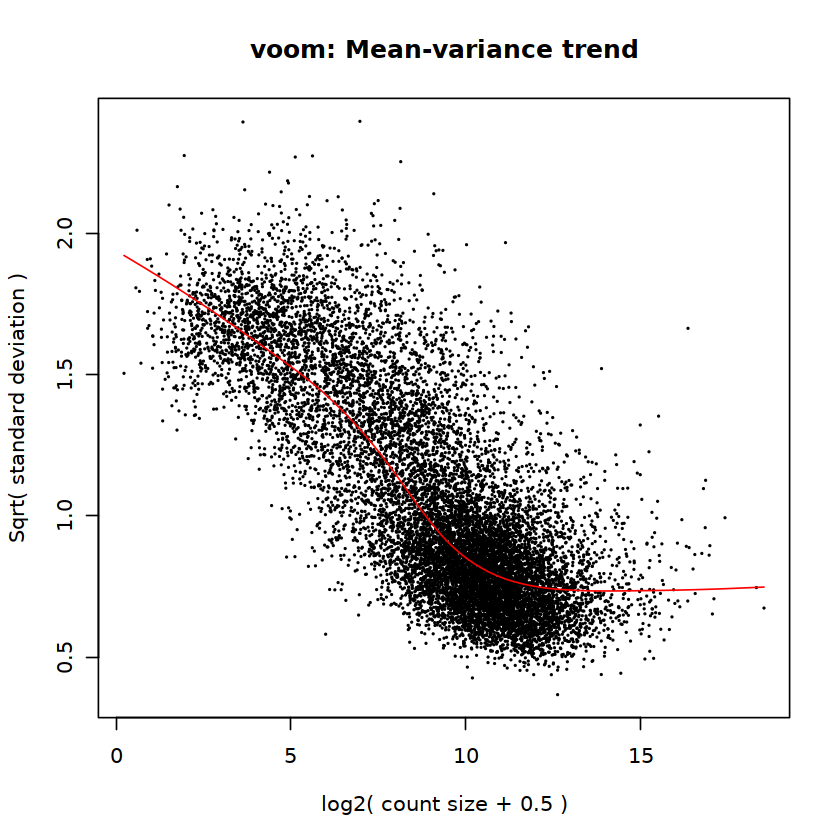

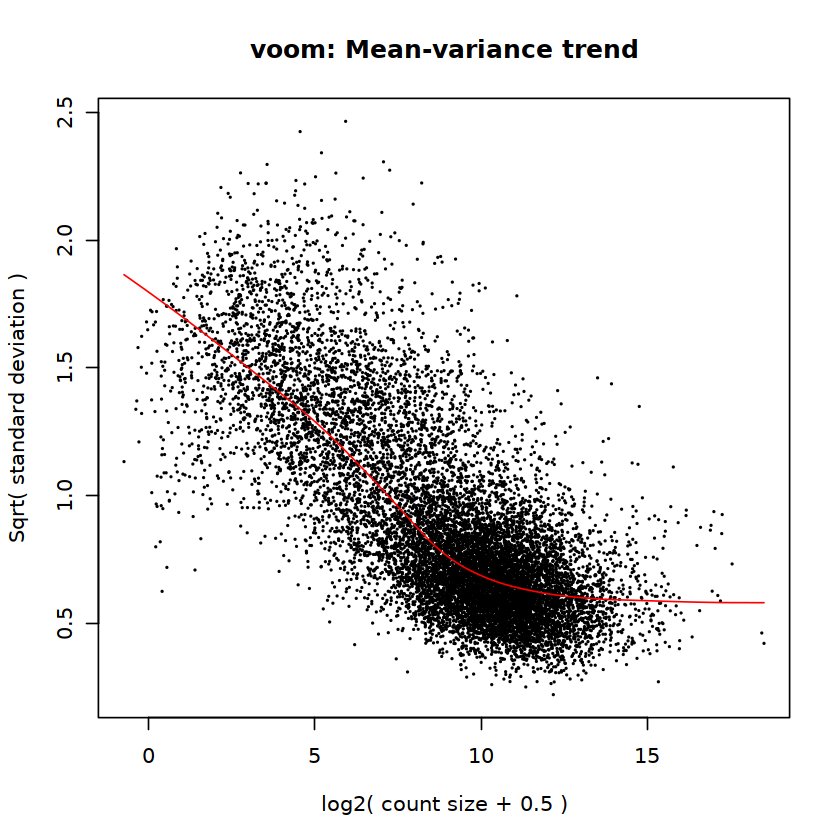

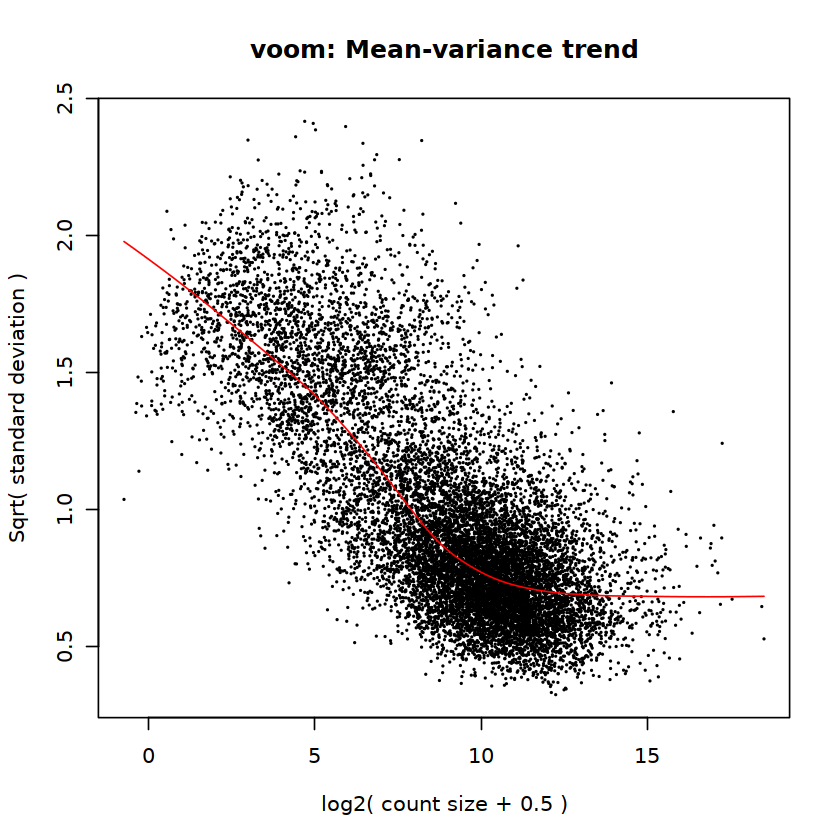

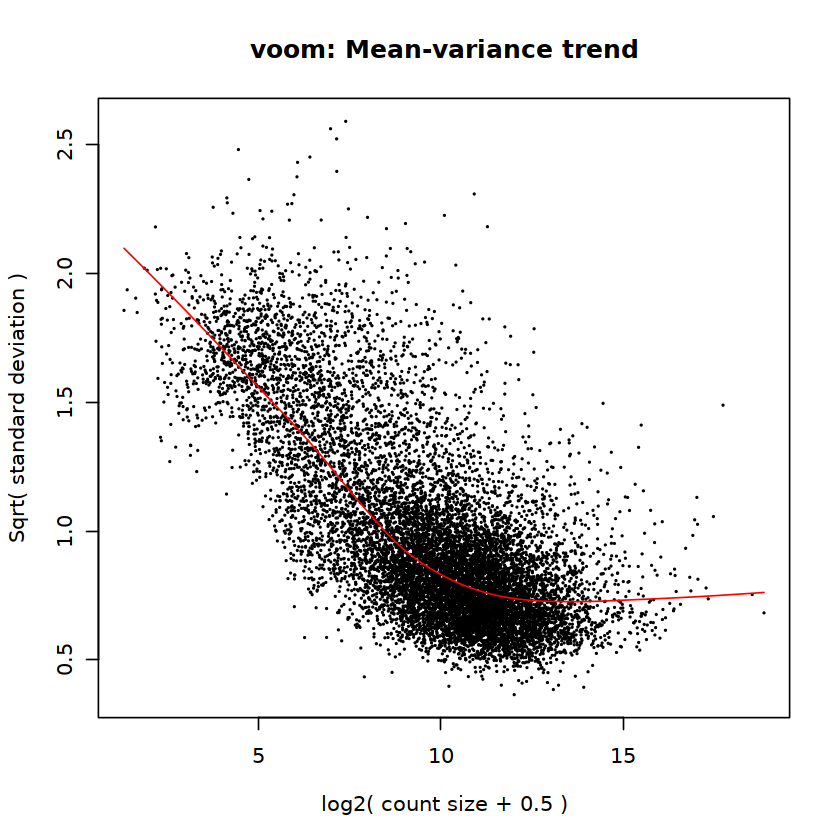

Coefficients not estimable: X12682 


Warning message:
“Partial NA coefficients for 12685 probe(s)”


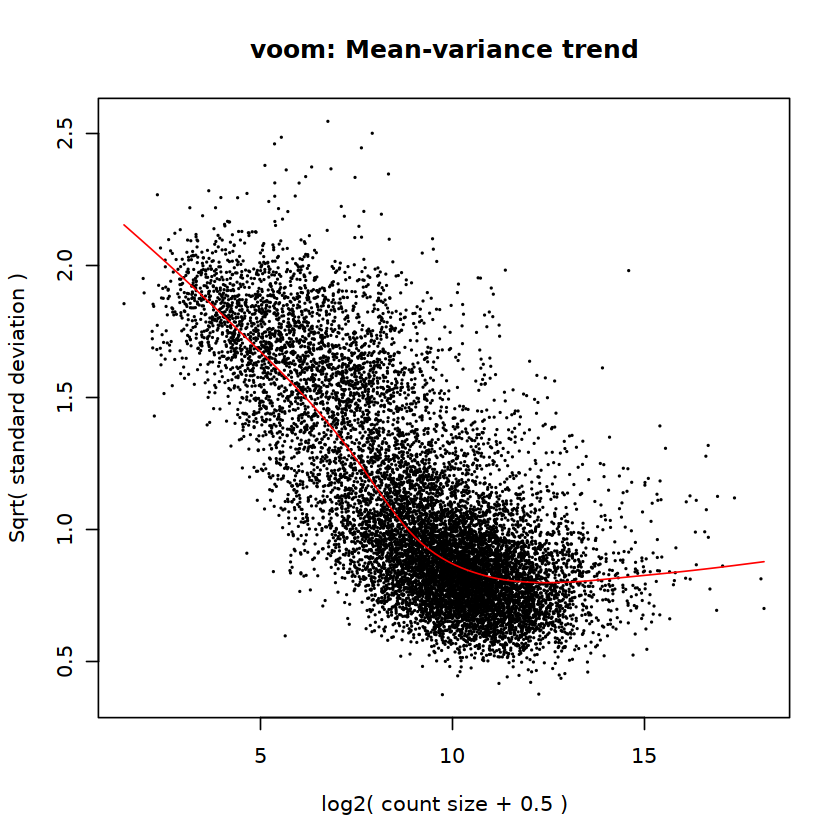

In [23]:
gVoomResult = voom(gNormedFilteredDgeList, gDesignModel, plot=TRUE)
gVoomResult.paired.nocor = voom(gNormedFilteredDgeList.paired, gDesignModel.paired.nocor, plot=TRUE)
gVoomResult.paired = voom(gNormedFilteredDgeList.paired, gDesignModel.paired, plot=TRUE)
gVoomResult.prog = voom(gNormedFilteredDgeList.prog, gDesignModel.prog, plot=TRUE)
gVoomResult.stem = voom(gNormedFilteredDgeList.stem, gDesignModel.stem, plot=TRUE)

gOrigVoomResult = voom(gOrigNormedFilteredDgeList, gOrigDesignModel, plot=FALSE)
gOrigVoomResult.paired.nocor = voom(gOrigNormedFilteredDgeList.paired, gOrigDesignModel.paired.nocor, plot=FALSE)
gOrigVoomResult.paired = voom(gOrigNormedFilteredDgeList.paired, gOrigDesignModel.paired, plot=FALSE)
gOrigVoomResult.prog = voom(gOrigNormedFilteredDgeList.prog, gOrigDesignModel.prog, plot=FALSE)
gOrigVoomResult.stem = voom(gOrigNormedFilteredDgeList.stem, gOrigDesignModel.stem, plot=FALSE)

In [113]:
class(gVoomResult.prog@.Data)
length(gVoomResult.prog@.Data)
dim(gVoomResult.prog@.Data[[1]])
head(gVoomResult.prog@.Data[[1]])
dim(gVoomResult.prog@.Data[[2]])
head(gVoomResult.prog@.Data[[2]])
dim(gVoomResult.prog@.Data[[3]])
head(gVoomResult.prog@.Data[[3]])
dim(gVoomResult.prog@.Data[[4]])
head(gVoomResult.prog@.Data[[4]])
dim(gVoomResult.prog@.Data[[5]])
head(gVoomResult.prog@.Data[[5]])


[1] "list"

[1] 5

[1] 12069     4

,ENSEMBL,ENTREZID,SYMBOL,gene_type
,<chr>,<chr>,<chr>,<chr>
3,ENSG00000000419,8813,DPM1,protein_coding
4,ENSG00000000457,57147,SCYL3,protein_coding
5,ENSG00000000460,55732,C1orf112,protein_coding
6,ENSG00000000938,2268,FGR,protein_coding
7,ENSG00000000971,3075,CFH,protein_coding
8,ENSG00000001036,2519,FUCA2,protein_coding


[1] 18 17

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
02id38cellPROGENITORS,PedAML,33277010,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
06id90cellPROGENITORS,PedAML,27611439,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
04id78cellPROGENITORS,PedAML,38647687,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
06id00066PRO,PedAML,34799422,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
01x00077xPROGENIT,PedAML,26302465,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108
03x11379xHPCxxxxx,PedAML,46423363,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550


[1] 12069    18

,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000000419,6.047162,6.4121714,5.545872,5.648433,5.5420286,5.635961,5.889777,5.905819,4.880083,5.961883,6.4835522,5.987949,5.800888,5.854270,5.845013,5.585681,6.086364,5.887484
ENSG00000000457,3.384457,2.3831315,2.845645,4.594439,3.7424694,4.167661,3.161155,4.139182,3.184389,4.281563,2.0125174,3.019656,2.425332,5.125848,4.282887,4.449273,1.785196,3.511394
ENSG00000000460,4.293358,4.0487299,4.581296,4.699682,4.7965225,4.830297,5.119783,4.964979,3.409541,2.922499,2.1842695,4.647585,3.625286,2.273938,5.208473,4.904927,4.064195,5.167990
ENSG00000000938,3.739586,3.1106513,2.286110,2.920668,0.7258173,3.256011,3.556758,2.421662,2.263551,3.174542,-0.9255244,1.686232,2.127262,2.913204,2.326639,2.371122,0.134704,1.432064
ENSG00000000971,1.982465,0.4795923,3.163068,-1.873064,2.6448176,-1.892923,2.765166,4.283310,3.380010,3.428981,-1.2581789,6.471993,-5.889546,-1.689939,3.595178,3.175313,3.694450,5.075735
ENSG00000001036,6.950801,6.9755865,6.544653,5.829666,6.8353460,3.006214,5.861288,5.762418,5.500867,5.974785,6.0799754,6.206701,6.499031,7.283847,5.922962,5.580992,5.994078,5.954456


[1] 12069    18

2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.4121897,3.4435343,3.3869883,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.1478969,3.1871331,3.1152410,3.1384951,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.5339078,3.4784278,3.5617177,3.5447019,2.9669038,2.966904,2.966904,2.966904,3.216899,3.273617,3.279264,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
0.2764306,0.2454875,0.3057477,0.3420165,0.6404447,1.053426,2.966904,2.966904,2.966904,2.966904,2.966904,1.237991,0.7095652,0.8637779,2.966904,2.966904,2.966904,2.966904
2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904


[1] 18  3

,PedAML,PedNL,AdultAML
02id38cellPROGENITORS,1,0,0
06id90cellPROGENITORS,1,0,0
04id78cellPROGENITORS,1,0,0
06id00066PRO,1,0,0
01x00077xPROGENIT,1,0,0
03x11379xHPCxxxxx,1,0,0


In [35]:
out <- list()
out$genes <- gOrigNormedFilteredDgeList.prog$genes
out$targets <- gOrigNormedFilteredDgeList.prog$samples
design <- model.matrix(~group, data = gOrigNormedFilteredDgeList.prog$samples)
lib.size <- gOrigNormedFilteredDgeList.prog$samples$lib.size * gOrigNormedFilteredDgeList.prog$samples$norm.factors
counts <- gOrigNormedFilteredDgeList.prog$counts
n <- nrow(counts)
m <- min(counts)
y <- t(log2(t(counts + 0.5)/(lib.size + 1) * 1e+06))
y <- normalizeBetweenArrays(y, method = "none")
fit <- lmFit(y, design, block = NULL, correlation = NULL, weights = NULL)
if (is.null(fit$Amean)) 
    fit$Amean <- rowMeans(y, na.rm = TRUE)
NWithReps <- sum(fit$df.residual > 0L)
sx <- fit$Amean + mean(log2(lib.size + 1)) - log2(1e+06)
sy <- sqrt(fit$sigma)
allzero <- rowSums(counts) == 0
l <- lowess(sx, sy, f = 0.5)
f <- approxfun(l, rule = 2, ties = list("ordered", mean))
fitted.values <- fit$coefficients %*% t(fit$design)
fitted.cpm <- 2^fitted.values
fitted.count <- 1e-06 * t(t(fitted.cpm) * (lib.size + 1))
fitted.logcount <- log2(fitted.count)
w <- 1/f(fitted.logcount)^4
dim(w) <- dim(fitted.logcount)

In [36]:
ifelse(!exists(".Random.seed"), 1, .Random.seed)
#rm(.Random.seed)
#ifelse(!exists(".Random.seed"), 1, .Random.seed)
.Random.seed <- 1
ifelse(!exists(".Random.seed"), 0, .Random.seed)

[1] 1

[1] 1

In [151]:
?"%*%"

In [33]:
#?"%*%"
if (fit$rank < ncol(design)) {
        j <- fit$pivot[1:fit$rank]
    print("here")
    fit$coefficients[, j, drop = FALSE] %*% 
            t(fit$design[, j, drop = FALSE])
    }else {
    print("here2")
        fit$coefficients %*% t(fit$design)
    }

[1] "here2"


,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000000419,34.983157,34.983157,34.983157,40.813683,34.983157,34.983157,35.200137,35.200137,40.4262105,40.4262105,40.4262105,40.813683,46.644209,46.644209,46.933516,46.933516,46.933516,35.38317
ENSG00000000457,21.125758,21.125758,21.125758,24.646718,21.125758,21.125758,21.329086,21.329086,22.1164291,22.1164291,22.1164291,24.646718,28.167678,28.167678,28.438782,28.438782,28.438782,22.11980
ENSG00000000460,25.197796,25.197796,25.197796,25.197796,25.197796,25.197796,29.430347,29.430347,19.8713882,19.8713882,19.8713882,29.397429,33.597061,33.597061,39.240462,39.240462,39.240462,33.56292
ENSG00000000938,15.177028,15.177028,15.177028,15.177028,15.177028,15.177028,12.242949,12.242949,10.5293260,10.5293260,10.5293260,17.706532,20.236037,20.236037,16.323932,16.323932,16.323932,13.31555
ENSG00000000971,2.264310,2.264310,2.264310,2.641695,2.264310,2.264310,22.589153,22.589153,12.9518950,12.9518950,12.9518950,2.641695,3.019080,3.019080,30.118870,30.118870,30.118870,26.41833
ENSG00000001036,37.421231,37.421231,37.421231,43.658103,37.421231,37.421231,35.076194,35.076194,40.9631303,40.9631303,40.9631303,43.658103,49.894975,49.894975,46.768259,46.768259,46.768259,35.06451
ENSG00000001084,29.876557,29.876557,29.876557,34.855983,29.876557,29.876557,34.641290,34.641290,33.9772497,33.9772497,33.9772497,34.855983,39.835409,39.835409,46.188387,46.188387,46.188387,36.48060
ENSG00000001167,33.562740,33.562740,33.562740,39.156530,33.562740,33.562740,34.289629,34.289629,38.7324940,38.7324940,38.7324940,39.156530,44.750320,44.750320,45.719505,45.719505,45.719505,34.65308
ENSG00000001460,15.399256,15.399256,15.399256,17.965798,15.399256,15.399256,16.833246,16.833246,10.0589124,10.0589124,10.0589124,17.965798,20.532341,20.532341,22.444328,22.444328,22.444328,19.57035
ENSG00000001461,31.418014,31.418014,31.418014,36.654349,31.418014,31.418014,32.485201,32.485201,29.7513908,29.7513908,29.7513908,36.654349,41.890685,41.890685,43.313602,43.313602,43.313602,34.81320


In [37]:
head(fit$coefficients)
head(t(fit$design))
class(fitted.values)
head(fitted.values)
dim(fitted.cpm)
head(fitted.cpm)
dim(w)
class(w)
head(w)

,(Intercept),groupPedAML,groupPedNL
ENSG00000000419,5.775173,0.05535322,0.091516568
ENSG00000000457,3.159490,0.36146982,0.395357823
ENSG00000000460,2.838770,1.36086293,2.066288046
ENSG00000000938,1.504189,1.02531522,0.536302058
ENSG00000000971,1.850271,-1.47288574,1.914588066
ENSG00000001036,5.851876,0.38499612,-0.005843434


,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
(Intercept),1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
groupPedAML,1,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0
groupPedNL,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,1


[1] "matrix" "array"

,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000000419,23.322105,29.152631,29.152631,34.983157,46.64421,46.64421,46.93352,46.93352,40.42621,40.42621,40.42621,40.813683,46.64421,46.64421,46.93352,46.93352,35.29165,46.93352
ENSG00000000457,14.083839,17.604798,17.604798,17.604798,28.16768,28.16768,28.43878,28.43878,22.11643,22.11643,22.11643,24.646718,28.16768,28.16768,28.43878,28.43878,21.72444,28.43878
ENSG00000000460,16.798531,20.998163,20.998163,20.998163,33.59706,33.59706,39.24046,39.24046,19.87139,19.87139,19.87139,29.397429,33.59706,33.59706,39.24046,39.24046,31.49663,39.24046
ENSG00000000938,10.118019,12.647523,12.647523,12.647523,20.23604,20.23604,16.32393,16.32393,10.52933,10.52933,10.52933,17.706532,20.23604,20.23604,16.32393,16.32393,12.77925,14.81974
ENSG00000000971,1.886925,1.886925,1.886925,1.886925,3.01908,3.01908,30.11887,30.11887,12.95189,12.95189,12.95189,2.641695,3.01908,3.01908,30.11887,30.11887,24.50374,28.26860
ENSG00000001036,31.184359,31.184359,31.184359,31.184359,49.89497,49.89497,46.76826,46.76826,40.96313,40.96313,40.96313,43.658103,49.89497,49.89497,46.76826,46.76826,35.07035,40.91638


[1] 12069    18

,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000000419,1.048704e+07,5.967828e+08,5.967828e+08,3.396093e+10,1.099781e+14,1.099781e+14,1.343990e+14,1.343990e+14,1.477413e+12,1.477413e+12,1.477413e+12,1.932604e+12,1.099781e+14,1.099781e+14,1.343990e+14,1.343990e+14,4.205778e+10,1.343990e+14
ENSG00000000457,1.736433e+04,1.993299e+05,1.993299e+05,1.993299e+05,3.015198e+08,3.015198e+08,3.638533e+08,3.638533e+08,4.546828e+06,4.546828e+06,4.546828e+06,2.626645e+07,3.015198e+08,3.015198e+08,3.638533e+08,3.638533e+08,3.465048e+06,3.638533e+08
ENSG00000000460,1.139887e+05,2.094484e+06,2.094484e+06,2.094484e+06,1.299341e+10,1.299341e+10,6.494657e+11,6.494657e+11,9.591442e+05,9.591442e+05,9.591442e+05,7.071439e+08,1.299341e+10,1.299341e+10,6.494657e+11,6.494657e+11,3.029925e+09,6.494657e+11
ENSG00000000938,1.111289e+03,6.416288e+03,6.416288e+03,6.416288e+03,1.234964e+06,1.234964e+06,8.203386e+04,8.203386e+04,1.477893e+03,1.477893e+03,1.477893e+03,2.138934e+05,1.234964e+06,1.234964e+06,8.203386e+04,8.203386e+04,7.029717e+03,2.891925e+04
ENSG00000000971,3.698460e+00,3.698460e+00,3.698460e+00,3.698460e+00,8.106503e+00,8.106503e+00,1.165959e+09,1.165959e+09,7.923351e+03,7.923351e+03,7.923351e+03,6.240644e+00,8.106503e+00,8.106503e+00,1.165959e+09,1.165959e+09,2.378817e+07,3.233675e+08
ENSG00000001036,2.440212e+09,2.440212e+09,2.440212e+09,2.440212e+09,1.046849e+15,1.046849e+15,1.198529e+14,1.198529e+14,2.143537e+12,2.143537e+12,2.143537e+12,1.388029e+13,1.046849e+15,1.046849e+15,1.198529e+14,1.198529e+14,3.607675e+10,2.075193e+12


[1] 12069    18

[1] "matrix" "array"

2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.4640885,3.1801615,3.1077855,3.1310603,2.9669038,2.966904,2.966904,2.966904,3.406181,3.454926,3.459951,2.966904,2.9669038,2.9669038,2.966904,2.966904,3.049845,2.966904
0.4040354,0.3498264,0.4563249,0.4188054,0.6404447,1.053426,2.966904,2.966904,3.081341,3.145002,3.151263,0.993265,0.7095652,0.8637779,2.966904,2.966904,2.966904,2.966904
2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904


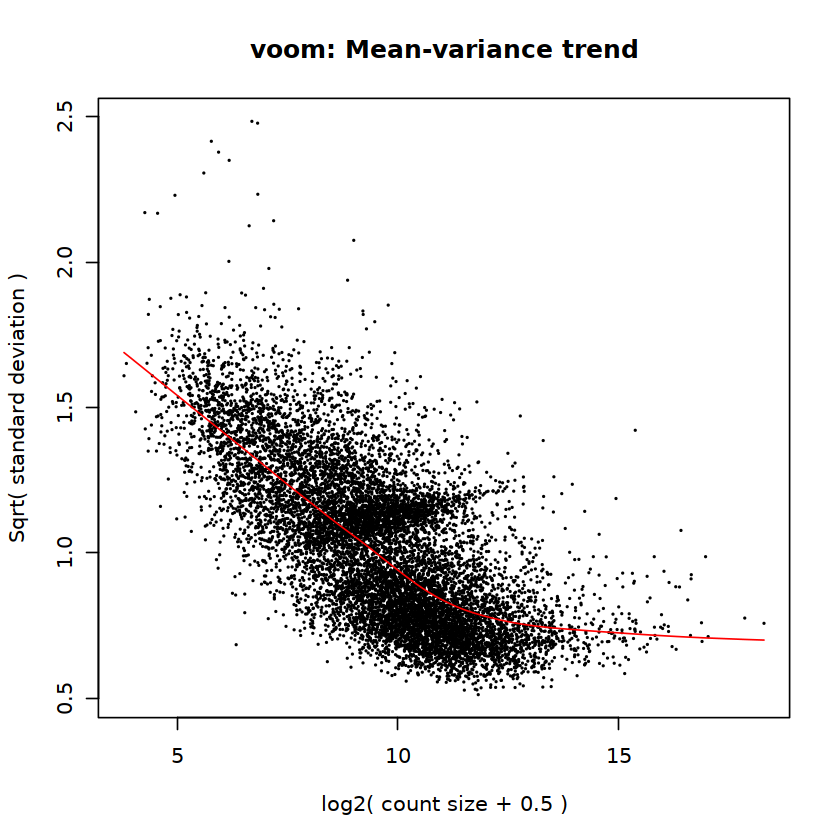

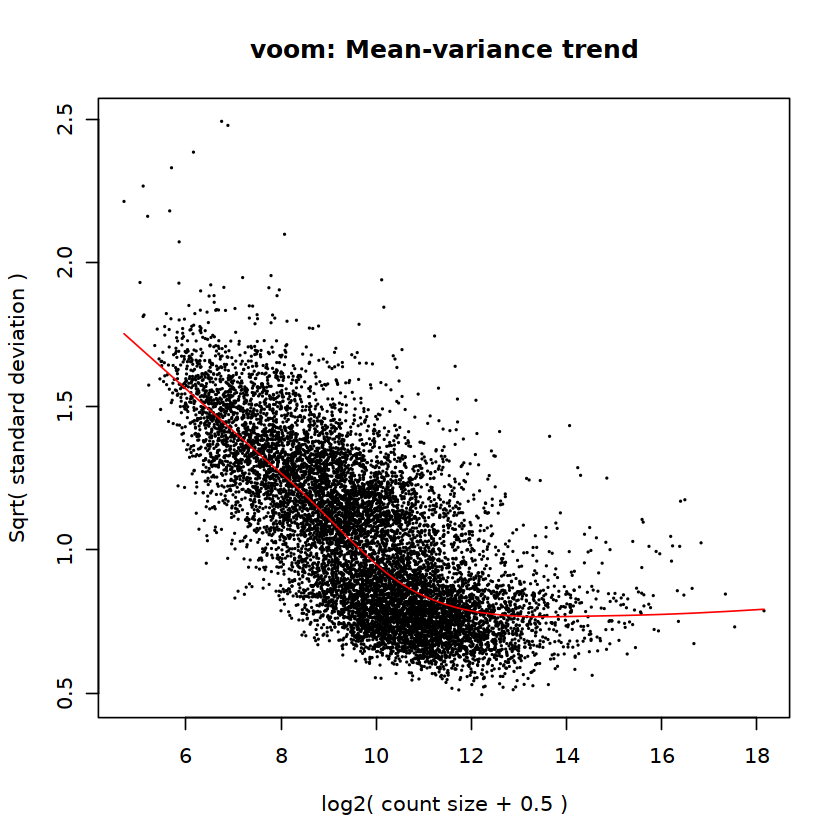

In [84]:
gVoomResult.prog.merge = voom(gNormedFilteredDgeList.prog.merge, gDesignModel.prog.merge, plot=TRUE)
gVoomResult.stem.merge = voom(gNormedFilteredDgeList.stem.merge, gDesignModel.stem.merge, plot=TRUE)
gOrigVoomResult.prog.merge = voom(gOrigNormedFilteredDgeList.prog.merge, gOrigDesignModel.prog.merge, plot=FALSE)
gOrigVoomResult.stem.merge = voom(gOrigNormedFilteredDgeList.stem.merge, gOrigDesignModel.stem.merge, plot=FALSE)

[Table of Contents](#Table-of-Contents)

### Fitting of Linear Models

Fit a separate linear model to the expression values of each gene, and apply empirical Bayes moderation to improve the estimates of gene-wise variability by borrowing information across genes.

In [32]:
#corfit <- duplicateCorrelation(gVoomResult.paired, gDesignModel.paired, 
#                               block=gNormedFilteredDgeList.paired$samples$Patient.ID)
#corfit$consensus.correlation
corfit <- list(consensus.correlation = 0.3648344551545254)
corfit$consensus.correlation <- 0.3648344551545254
corfit$consensus.correlation
#corfit <- duplicateCorrelation(gVoomResult.paired, gDesignModel.paired, 
#                               block=gOrigNormedFilteredDgeList.paired$samples$Patient.ID)
#corfit$consensus.correlation
#corfit$consensus.correlation <- 0.411684384958776

[1] 0.3648345

In [114]:
class(gVoomResult.prog$E)
dim(gVoomResult.prog$E)
head(gVoomResult.prog$E)
class(gVoomResult.prog$weights)
dim(gVoomResult.prog$weights)
head(gVoomResult.prog$weights)

[1] "matrix" "array"

[1] 12069    18

,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000000419,6.047162,6.4121714,5.545872,5.648433,5.5420286,5.635961,5.889777,5.905819,4.880083,5.961883,6.4835522,5.987949,5.800888,5.854270,5.845013,5.585681,6.086364,5.887484
ENSG00000000457,3.384457,2.3831315,2.845645,4.594439,3.7424694,4.167661,3.161155,4.139182,3.184389,4.281563,2.0125174,3.019656,2.425332,5.125848,4.282887,4.449273,1.785196,3.511394
ENSG00000000460,4.293358,4.0487299,4.581296,4.699682,4.7965225,4.830297,5.119783,4.964979,3.409541,2.922499,2.1842695,4.647585,3.625286,2.273938,5.208473,4.904927,4.064195,5.167990
ENSG00000000938,3.739586,3.1106513,2.286110,2.920668,0.7258173,3.256011,3.556758,2.421662,2.263551,3.174542,-0.9255244,1.686232,2.127262,2.913204,2.326639,2.371122,0.134704,1.432064
ENSG00000000971,1.982465,0.4795923,3.163068,-1.873064,2.6448176,-1.892923,2.765166,4.283310,3.380010,3.428981,-1.2581789,6.471993,-5.889546,-1.689939,3.595178,3.175313,3.694450,5.075735
ENSG00000001036,6.950801,6.9755865,6.544653,5.829666,6.8353460,3.006214,5.861288,5.762418,5.500867,5.974785,6.0799754,6.206701,6.499031,7.283847,5.922962,5.580992,5.994078,5.954456


[1] "matrix" "array"

[1] 12069    18

2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.4121897,3.4435343,3.3869883,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.1478969,3.1871331,3.1152410,3.1384951,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
3.5339078,3.4784278,3.5617177,3.5447019,2.9669038,2.966904,2.966904,2.966904,3.216899,3.273617,3.279264,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904
0.2764306,0.2454875,0.3057477,0.3420165,0.6404447,1.053426,2.966904,2.966904,2.966904,2.966904,2.966904,1.237991,0.7095652,0.8637779,2.966904,2.966904,2.966904,2.966904
2.9669038,2.9669038,2.9669038,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.966904,2.9669038,2.9669038,2.966904,2.966904,2.966904,2.966904


In [88]:
gVoomedFit = lmFit(gVoomResult, gDesignModel)
gVoomedFit.paired.nocor = lmFit(gVoomResult.paired.nocor, gDesignModel.paired.nocor)
gVoomedFit.paired = lmFit(gVoomResult.paired, gDesignModel.paired, 
                          block=gNormedFilteredDgeList.paired$samples$Patient.ID, correlation=corfit$consensus.correlation)
gVoomedFit.prog = lmFit(gVoomResult.prog, gDesignModel.prog)
gVoomedFit.stem = lmFit(gVoomResult.stem, gDesignModel.stem)
gOrigVoomedFit = lmFit(gOrigVoomResult, gOrigDesignModel)
gOrigVoomedFit.paired.nocor = lmFit(gOrigVoomResult.paired.nocor, gOrigDesignModel.paired.nocor)
gOrigVoomedFit.paired = lmFit(gOrigVoomResult.paired, gOrigDesignModel.paired, 
                          block=gOrigNormedFilteredDgeList.paired$samples$Patient.ID, correlation=0.41168438495878)
gOrigVoomedFit.prog = lmFit(gOrigVoomResult.prog, gOrigDesignModel.prog)
gOrigVoomedFit.stem = lmFit(gOrigVoomResult.stem, gOrigDesignModel.stem)

Coefficients not estimable: X12682 


Warning message:
“Partial NA coefficients for 12685 probe(s)”


Coefficients not estimable: X12682 


Warning message:
“Partial NA coefficients for 12685 probe(s)”


In [85]:
gVoomedFit.prog.merge = lmFit(gVoomResult.prog.merge, gDesignModel.prog.merge)
gVoomedFit.stem.merge = lmFit(gVoomResult.stem.merge, gDesignModel.stem.merge)
gOrigVoomedFit.prog.merge = lmFit(gOrigVoomResult.prog.merge, gOrigDesignModel.prog.merge)
gOrigVoomedFit.stem.merge = lmFit(gOrigVoomResult.stem.merge, gOrigDesignModel.stem.merge)

In [44]:
dim(gVoomedFit.paired.nocor$design)
gVoomedFit.paired

[1] 16 11

,PedAML.Stem,PedAML.Prog,AdultAML.Stem,AdultAML.Prog,X62619,X83119,X9119
ENSG00000000003,-5.2624693,-6.25064725,2.6895991,-5.06413406,0.02855036,-0.73138359,2.46751700
ENSG00000000419,5.9083250,5.99993852,6.7660704,6.66809323,-0.45900805,-0.29964680,-0.10946037
ENSG00000000457,2.8188311,3.08648800,2.3197909,0.62469684,1.64446796,1.27271479,0.44420660
ENSG00000000460,4.2470467,4.52468288,-4.8435808,2.11285749,-0.16083954,-0.04369375,-1.10159294
ENSG00000000938,1.8877686,2.66070275,-5.2240629,-1.37741847,0.27643589,0.33678832,0.28155987
ENSG00000000971,1.1502444,0.73245215,6.9098179,1.05530141,-0.02863124,-2.42858606,1.52599267
ENSG00000001036,6.6440612,6.86401722,8.8151013,9.83429226,-1.07013454,-3.86942261,-0.21045885
ENSG00000001084,4.7342051,5.13878895,3.7519509,4.74083434,0.30501436,0.09209354,0.02403073
ENSG00000001167,5.1188792,5.59913301,4.5413217,5.19327625,1.00109700,0.99241658,-1.38051131
ENSG00000001460,2.5754992,2.57079171,1.1678292,0.20759146,0.55240147,0.76507521,-0.02054047


In [89]:
gVoomedFitForContrasts = contrasts.fit(gVoomedFit, contrasts=gContrastMatrix)
gVoomedFitForContrasts.paired.nocor = contrasts.fit(gVoomedFit.paired.nocor, contrasts=gContrastMatrix.paired.nocor)
gVoomedFitForContrasts.paired = contrasts.fit(gVoomedFit.paired, contrasts=gContrastMatrix.paired)
gVoomedFitForContrasts.prog = contrasts.fit(gVoomedFit.prog, contrasts=gContrastMatrix.prog)
gVoomedFitForContrasts.stem = contrasts.fit(gVoomedFit.stem, contrasts=gContrastMatrix.stem)
gOrigVoomedFitForContrasts = contrasts.fit(gOrigVoomedFit, contrasts=gOrigContrastMatrix)
gOrigVoomedFitForContrasts.paired.nocor = contrasts.fit(gOrigVoomedFit.paired.nocor, contrasts=gContrastMatrix.paired.nocor)
gOrigVoomedFitForContrasts.paired = contrasts.fit(gOrigVoomedFit.paired, contrasts=gContrastMatrix.paired)
gOrigVoomedFitForContrasts.prog = contrasts.fit(gOrigVoomedFit.prog, contrasts=gOrigContrastMatrix.prog)
gOrigVoomedFitForContrasts.stem = contrasts.fit(gOrigVoomedFit.stem, contrasts=gOrigContrastMatrix.stem)

In [86]:
gVoomedFitForContrasts.prog.merge = contrasts.fit(gVoomedFit.prog.merge, contrasts=gContrastMatrix.prog.merge)
gVoomedFitForContrasts.stem.merge = contrasts.fit(gVoomedFit.stem.merge, contrasts=gContrastMatrix.stem.merge)
gOrigVoomedFitForContrasts.prog.merge = contrasts.fit(gOrigVoomedFit.prog.merge, contrasts=gContrastMatrix.prog.merge)
gOrigVoomedFitForContrasts.stem.merge = contrasts.fit(gOrigVoomedFit.stem.merge, contrasts=gContrastMatrix.stem.merge)

In [90]:
gModeratedVoomedFitForContrasts = eBayes(gVoomedFitForContrasts)
gModeratedVoomedFitForContrasts.paired.nocor = eBayes(gVoomedFitForContrasts.paired.nocor)
gModeratedVoomedFitForContrasts.paired = eBayes(gVoomedFitForContrasts.paired)
gModeratedVoomedFitForContrasts.prog = eBayes(gVoomedFitForContrasts.prog)
gModeratedVoomedFitForContrasts.stem = eBayes(gVoomedFitForContrasts.stem)
gOrigModeratedVoomedFitForContrasts = eBayes(gOrigVoomedFitForContrasts)
gOrigModeratedVoomedFitForContrasts.paired.nocor = eBayes(gOrigVoomedFitForContrasts.paired.nocor)
gOrigModeratedVoomedFitForContrasts.paired = eBayes(gOrigVoomedFitForContrasts.paired)
gOrigModeratedVoomedFitForContrasts.prog = eBayes(gOrigVoomedFitForContrasts.prog)
gOrigModeratedVoomedFitForContrasts.stem = eBayes(gOrigVoomedFitForContrasts.stem)

In [87]:
gModeratedVoomedFitForContrasts.prog.merge = eBayes(gVoomedFitForContrasts.prog.merge)
gModeratedVoomedFitForContrasts.stem.merge = eBayes(gVoomedFitForContrasts.stem.merge)
gOrigModeratedVoomedFitForContrasts.prog.merge = eBayes(gOrigVoomedFitForContrasts.prog.merge)
gOrigModeratedVoomedFitForContrasts.stem.merge = eBayes(gOrigVoomedFitForContrasts.stem.merge)

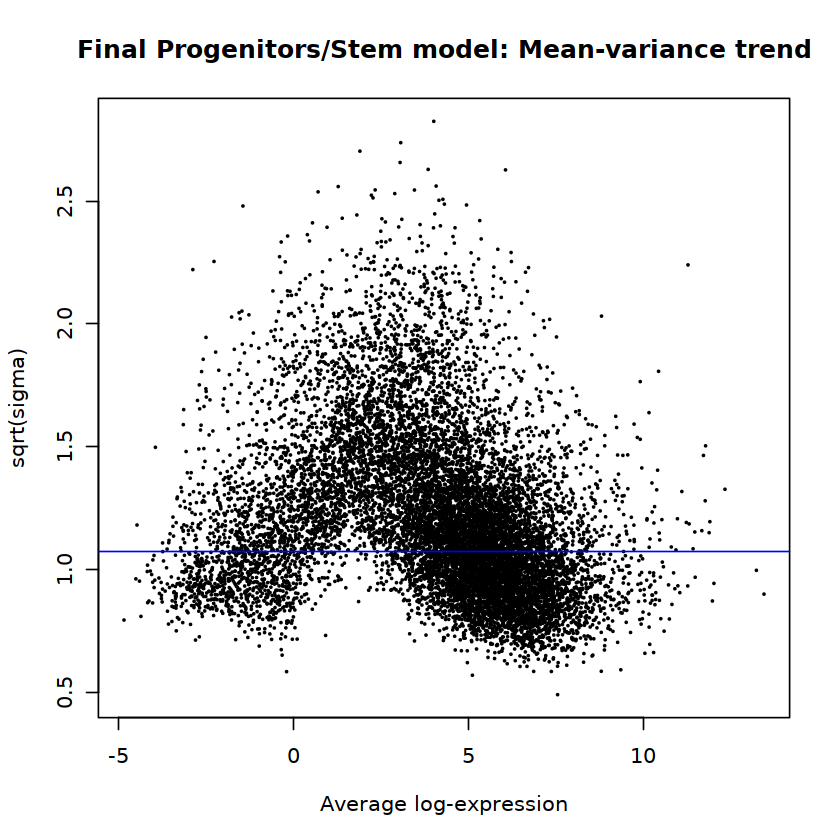

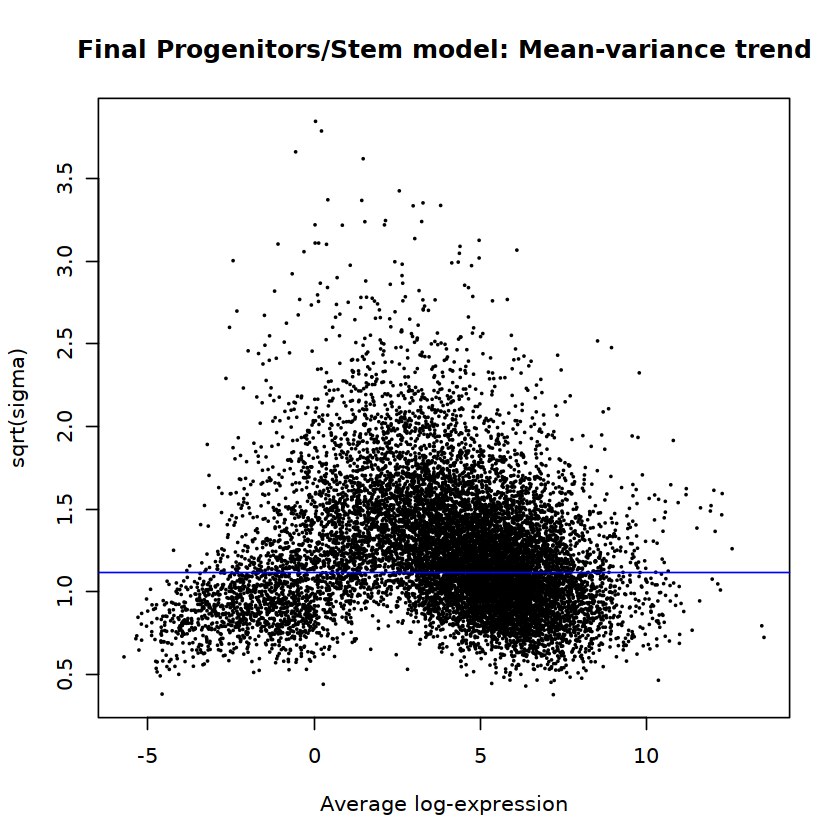

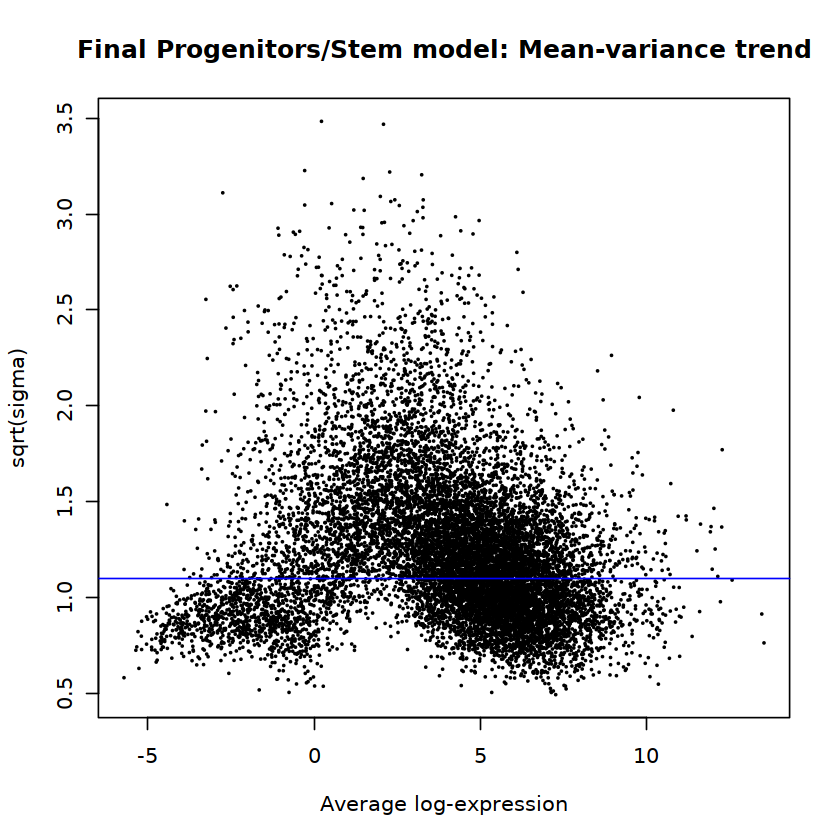

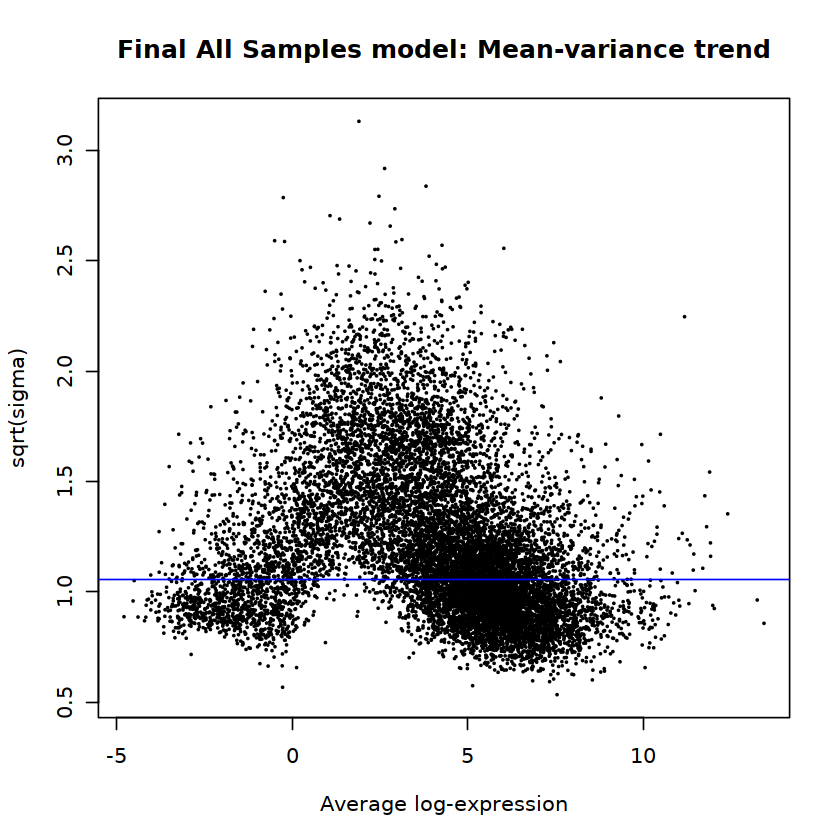

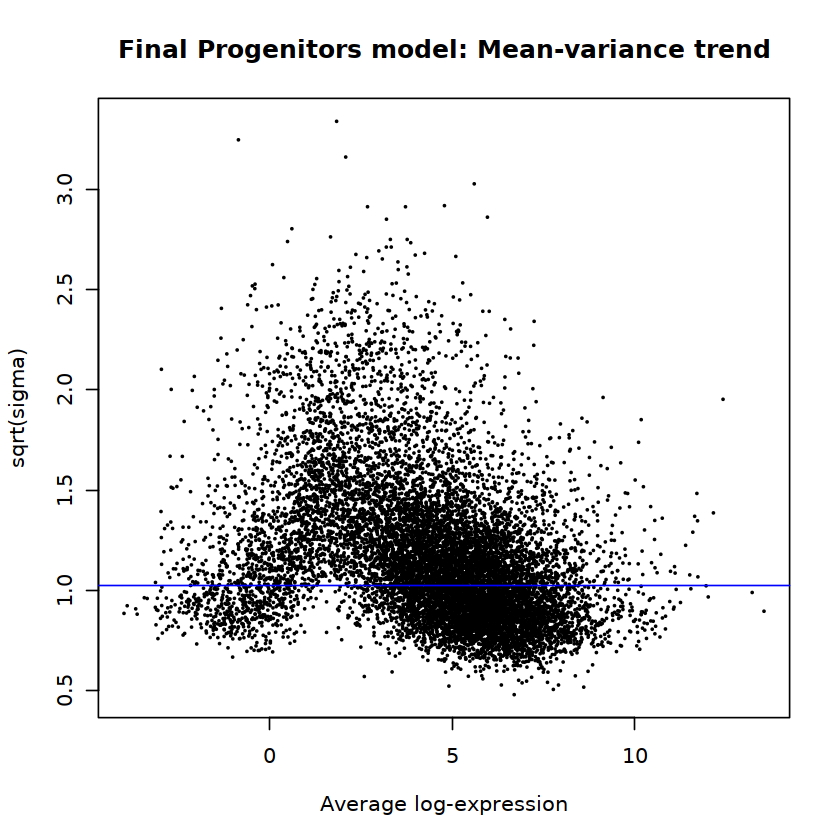

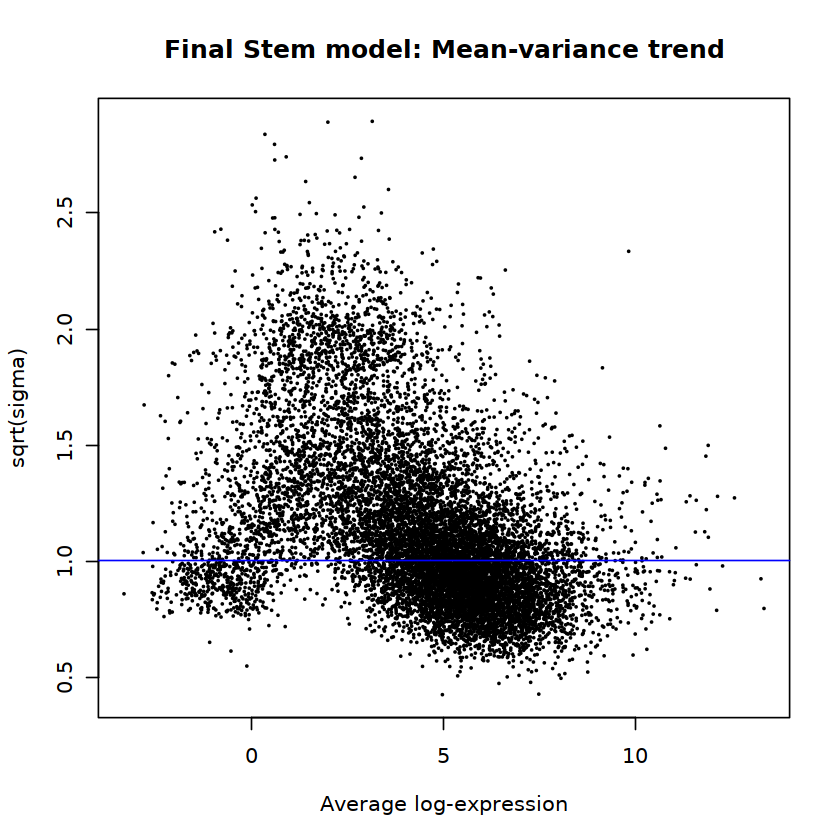

In [91]:
plotSA(gModeratedVoomedFitForContrasts, main="Final Progenitors/Stem model: Mean-variance trend")
plotSA(gModeratedVoomedFitForContrasts.paired.nocor, main="Final Progenitors/Stem model: Mean-variance trend")
plotSA(gModeratedVoomedFitForContrasts.paired, main="Final Progenitors/Stem model: Mean-variance trend")
plotSA(gOrigModeratedVoomedFitForContrasts, main="Final All Samples model: Mean-variance trend")
plotSA(gModeratedVoomedFitForContrasts.prog, main="Final Progenitors model: Mean-variance trend")
plotSA(gModeratedVoomedFitForContrasts.stem, main="Final Stem model: Mean-variance trend")

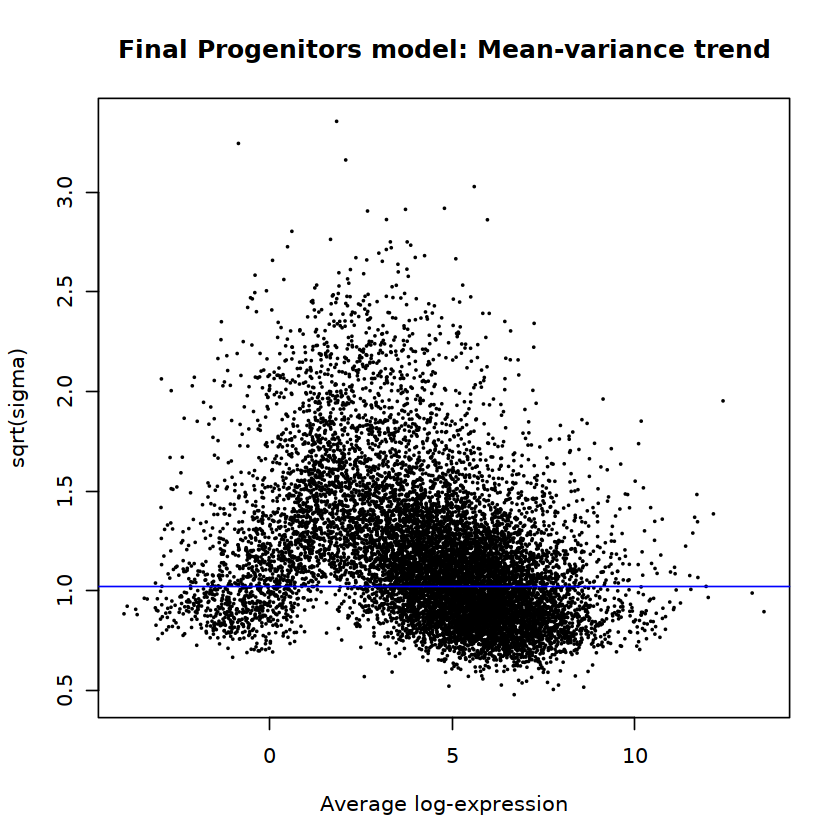

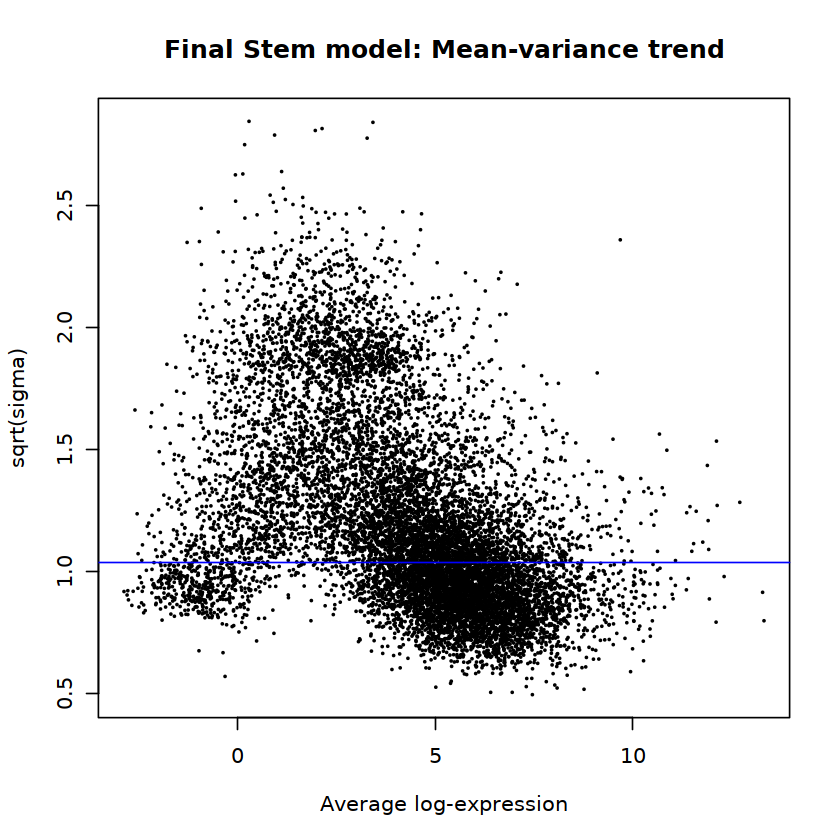

In [57]:
plotSA(gOrigModeratedVoomedFitForContrasts.prog, main="Final Progenitors model: Mean-variance trend")
plotSA(gOrigModeratedVoomedFitForContrasts.stem, main="Final Stem model: Mean-variance trend")

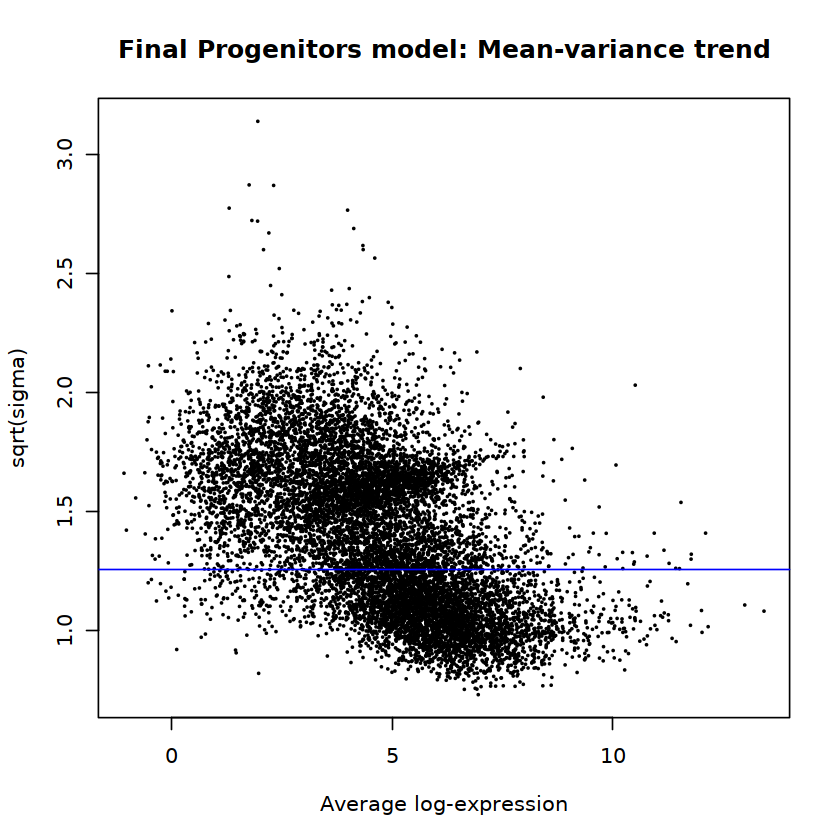

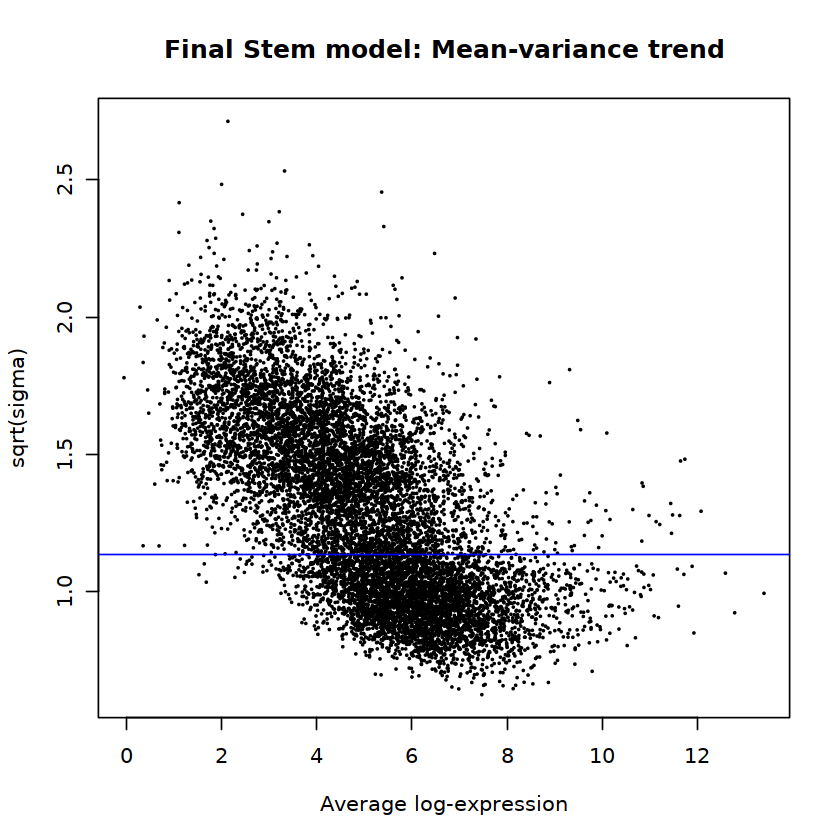

In [88]:
plotSA(gModeratedVoomedFitForContrasts.prog.merge, main="Final Progenitors model: Mean-variance trend")
plotSA(gModeratedVoomedFitForContrasts.stem.merge, main="Final Stem model: Mean-variance trend")

>The above graphic demonstrates that the mean-variance relationship shown earlier in the voom plot has been removed by the use of the voom-produced weights.

</div>

,PedAMLvsAdultAML,PedAMLvsPedNL
ENSG00000000419,0.0001210709,2.683041e-02
ENSG00000000457,0.4835422424,5.807115e-03
ENSG00000000460,0.0003740930,7.720146e-01
ENSG00000000938,0.0415103994,2.009478e-02
ENSG00000000971,0.0753283437,1.128025e-05
ENSG00000001036,0.3069061264,9.062484e-02



FALSE  TRUE 
11689   148 


FALSE  TRUE 
10749  1088 


FALSE  TRUE 
 7707  4362 


FALSE  TRUE 
10034  2035 


FALSE  TRUE 
10973  1712 


FALSE  TRUE 
10503  2182 


FALSE  TRUE 
11108  1577 


FALSE  TRUE 
10448  2237 

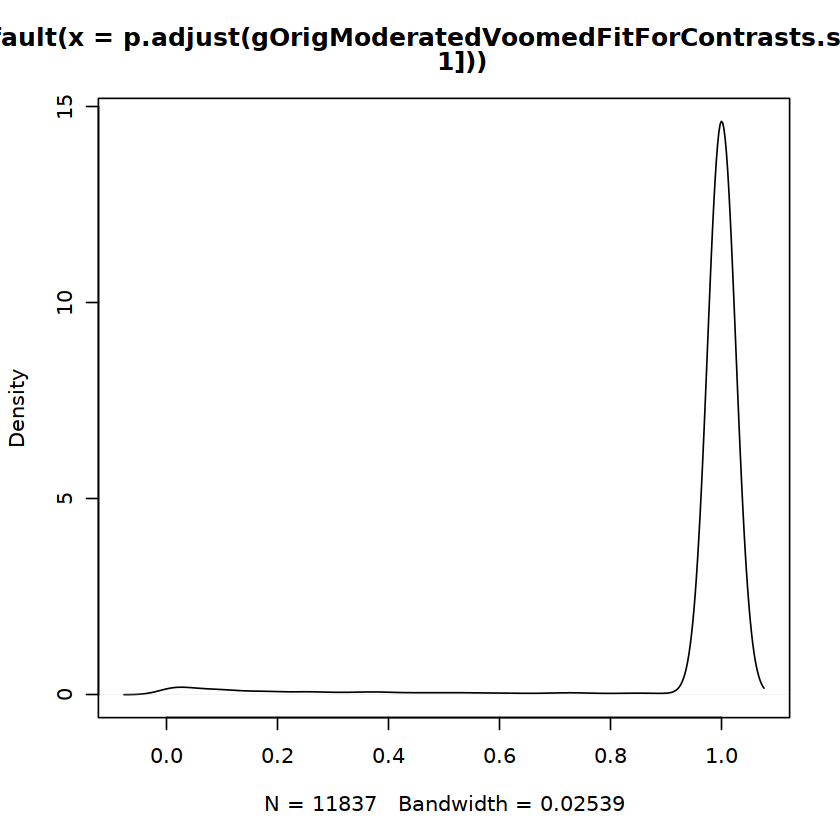

ERROR: Error in xy.coords(x, y, xlabel, ylabel, log): 'x' and 'y' lengths differ


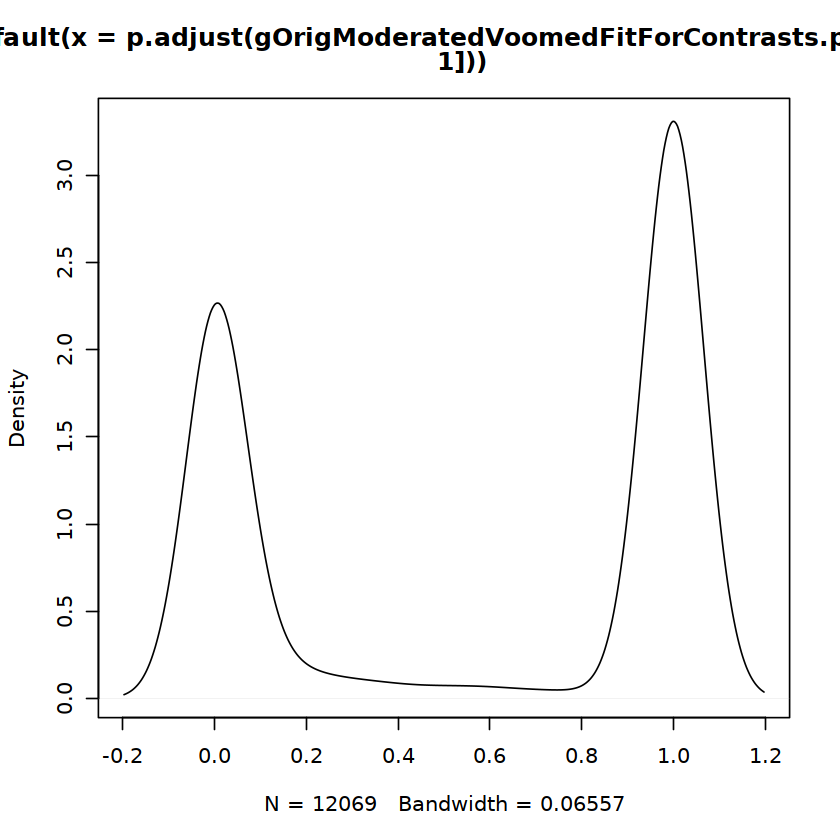

In [93]:
head(gOrigModeratedVoomedFitForContrasts.stem$p.value)
table(p.adjust(gOrigModeratedVoomedFitForContrasts.stem$p.value[,1]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts.stem$p.value[,2]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts.prog$p.value[,1]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts.prog$p.value[,2]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts$p.value[,1]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts$p.value[,2]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts$p.value[,3]) < 0.05)
table(p.adjust(gOrigModeratedVoomedFitForContrasts$p.value[,4]) < 0.05)


plot(density(p.adjust(gOrigModeratedVoomedFitForContrasts.stem$p.value[,1])))
plot(density(p.adjust(gOrigModeratedVoomedFitForContrasts.prog$p.value[,1])))
plot(gOrigModeratedVoomedFitForContrasts.stem$Amean, gOrigModeratedVoomedFitForContrasts.stem$coefficients)
plot(density(gOrigModeratedVoomedFitForContrasts.stem$coefficients[,1]))
plot(density(gOrigModeratedVoomedFitForContrasts.stem$coefficients[,2]))

While the voom analysis above accounts for the fact that variance is not independent of the mean, for the purposes of later per-comparison power analysis, estimate a common dispersion across all genes and an associated biological coefficient of variation (BCV). 

In the context of RNASeq, global variance is defined as the sum of technical and biological variance. Technical variance can be decreased by increasing sequencing depth. However, the impact of sequencing depth on global variance is limited by the amplitude of the biological variation. In other words, at a certain point, deeper sequencing doesn't provide additional value. In these situations, it becomes more useful to add additional samples. The RNASeqPower R package calculates a formal sample size comparison for two groups involving the following 5 factors:
    
    1. The depth of sequencing and consequent expected count for a given transcript;
    2. The coefficient of variation of counts within each of the 2 groups;
    3. The size difference (fold-change) that we wish to detect;
    4. The target false positive rate and false negative rate (or power);
    5. The number of samples in each group.
    
([12](#Citations))

In [ ]:
message("Revised outliers")
gCommonDispersion <- estimateGLMCommonDisp(gNormedFilteredDgeList, gDesignModel, 
                                           verbose=TRUE)
# The biological coefficient of variation is the square root of the common dispersion
gBcv = sqrt(gCommonDispersion$common.dispersion)

#gCommonDispersion.paired.nocor <- estimateGLMCommonDisp(gOrigNormedFilteredDgeList.paired, gDesignModel.paired.nocor, 
#                                           verbose=TRUE)
# The biological coefficient of variation is the square root of the common dispersion
#gBcv.paired = sqrt(gCommonDispersion.paired.nocor$common.dispersion)

gCommonDispersion.prog <- estimateGLMCommonDisp(gNormedFilteredDgeList.prog, gDesignModel.prog, 
                                           verbose=TRUE)
gBcv.prog = sqrt(gCommonDispersion.prog$common.dispersion)

gCommonDispersion.stem <- estimateGLMCommonDisp(gNormedFilteredDgeList.stem, gDesignModel.stem, 
                                           verbose=TRUE)
gBcv.stem = sqrt(gCommonDispersion.stem$common.dispersion)
message("Original outliers")
gOrigCommonDispersion <- estimateGLMCommonDisp(gOrigNormedFilteredDgeList, gOrigDesignModel, 
                                           verbose=TRUE)
## The biological coefficient of variation is the square root of the common dispersion
gOrigBcv = sqrt(gOrigCommonDispersion$common.dispersion)

##gOrigCommonDispersion.paired.nocor <- estimateGLMCommonDisp(gOrigNormedFilteredDgeList.paired, gDesignModel.paired.nocor, 
##                                           verbose=TRUE)
## The biological coefficient of variation is the square root of the common dispersion
##gOrigBcv.paired = sqrt(gOrigCommonDispersion.paired.nocor$common.dispersion)

gOrigCommonDispersion.prog <- estimateGLMCommonDisp(gOrigNormedFilteredDgeList.prog, gOrigDesignModel.prog, 
                                           verbose=TRUE)
gOrigBcv.prog = sqrt(gCommonDispersion.prog$common.dispersion)

gOrigCommonDispersion.stem <- estimateGLMCommonDisp(gOrigNormedFilteredDgeList.stem, gOrigDesignModel.stem, 
                                           verbose=TRUE)
gOrigBcv.stem = sqrt(gOrigCommonDispersion.stem$common.dispersion)

Revised outliers


Disp = 0.63385 , BCV = 0.7961 
Disp = 0.54572 , BCV = 0.7387 
Disp = 0.70906 , BCV = 0.8421 


Original outliers


[Table of Contents](#Table-of-Contents)

### Summarization of Differentially Expressed Genes

Look at the summary information on how many differentially expressed genes, in which directions, are found for each comparison.  By default, differentially expressed genes are identified as those with a Benjamini-Hochberg-adjusted p-value of <= 0.05.

Note that the Benjamini-Hochberg adjustment ([13](#Citations)) addresses correcting p-values across multiple tested genes, not across multiple tested contrasts:

>If several contrasts are being tested simultaneously, then the issue arises of multiple
testing for the entire set of hypotheses being considered, across contrasts as well as probes. The
function decideTests() offers a number of strategies for doing this.
The simplest multiple testing method is method="separate". This method does multiple testing
for each contrast separately. This method is the default because it is equivalent to using topTable().
Using this method, testing a set of contrasts together will give the same results as when each contrast
is tested on its own. The great advantage of this method is that it gives the same results regardless
of which set of contrasts are tested together. The disadvantage of this method is that it does not
do any multiple testing adjustment between contrasts. Another disadvantage is that the raw p-value
cutoff corresponding to significance can be very different for different contrasts, depending on the
number of DE probes. This method is recommended when different contrasts are being analysed to
answer more or less independent questions.
>
> method="global" is recommended when a set of closely related contrasts are being tested. This
method simply appends all the tests together into one long vector of tests, i.e., it treats all the tests
as equivalent regardless of which probe or contrast they relate to. An advantage is that the raw
p-value cutoff is consistent across all contrasts. For this reason, method="global" is recommended if
you want to compare the number of DE genes found for different contrasts, for example interpreting
the number of DE genes as representing the strength of the contrast. However users need to be aware
that the number of DE genes for any particular contrasts will depend on which other contrasts are
tested at the same time. Hence one should include only those contrasts which are closely related to
the question at hand. Unnecessary contrasts should be excluded as these would affect the results for
the contrasts of interest. Another more theoretical issue is that there is no theorem which proves that
adjust.method="BH" in combination with method="global" will correctly control the false discovery
rate for combinations of negatively correlated contrasts, however simulations, experience and some
theory suggest that the method is safe in practice. ([8](#Citations))

In [78]:
gMultipleTestingStrategy = "global"

In [92]:
summary(decideTests(gModeratedVoomedFitForContrasts, method=gMultipleTestingStrategy))
summary(decideTests(gModeratedVoomedFitForContrasts.paired.nocor, method=gMultipleTestingStrategy))
summary(decideTests(gModeratedVoomedFitForContrasts.paired, method=gMultipleTestingStrategy))
summary(decideTests(gModeratedVoomedFitForContrasts.prog, method=gMultipleTestingStrategy))
summary(decideTests(gModeratedVoomedFitForContrasts.stem, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts.paired.nocor, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts.paired, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts.prog, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts.stem, method=gMultipleTestingStrategy))

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4537                         4882
NotSig                     3109                         2791
Up                         5039                         5012

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4381                         4300
NotSig                     3437                         2973
Up                         4867                         5412

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       1210                         3824
NotSig                     9808                         3908
Up                         1667                         4953

       PedAMLvsAdultAML PedAMLvsPedNL
Down               5456          4465
NotSig             4207          4056
Up                 2406          3548

       PedAMLvsAdultAML PedAMLvsPedNL
Down               1996          5561
NotSig             8115          4459
Up                 1726          1817

       PedAML.StemvsAdultAML.Stem PedAML.StemvsPedNL.Stem
Down                         3035                    3415
NotSig                       5850                    5823
Up                           3800                    3447
       PedAML.ProgvsAdultAML.Prog PedAML.ProgvsPedNL.Prog
Down                         2937                    4087
NotSig                       6553                    5341
Up                           3195                    3257

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4438                         4294
NotSig                     3324                         2987
Up                         4923                         5404

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4296                         4112
NotSig                     3355                         3302
Up                         5034                         5271

       PedAMLvsAdultAML PedAMLvsPedNL
Down               3890          4362
NotSig             3909          4192
Up                 4270          3515

       PedAMLvsAdultAML PedAMLvsPedNL
Down               2267          3603
NotSig             6847          5768
Up                 2723          2466

In [112]:
sessionInfo()

R version 4.0.5 (2021-03-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/ubuntu/anaconda3/lib/libmkl_rt.so.1

locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

attached base packages:
 [1] grid      parallel  stats4    stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] cowplot_1.1.1                          
 [2] RColorBrewer_1.1-2                     
 [3] gplots_3.1.1                           
 [4] reshape2_1.4.4                         
 [5] dplyr_1.0.7                            
 [6] plyr_1.8.6                             
 [7] statmod_1.4.36                         
 [8] gdata_2.18.0                

In [89]:
summary(decideTests(gModeratedVoomedFitForContrasts.prog.merge, method=gMultipleTestingStrategy))
summary(decideTests(gModeratedVoomedFitForContrasts.stem.merge, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts.prog.merge, method=gMultipleTestingStrategy))
summary(decideTests(gOrigModeratedVoomedFitForContrasts.stem.merge, method=gMultipleTestingStrategy))

       ABMvsPedAML ABMvsPedNL ABMvsAdultAML ABMvssAML ABMvsYBM
Down          4822       4924          4595      3786      805
NotSig        1409       1742          2117      2131     9267
Up            4861       4426          4380      5175     1020

       ABMvsPedAML ABMvsPedNL ABMvsAdultAML ABMvssAML ABMvsYBM
Down          4413       4071          4172      4458     3726
NotSig        3247       4756          3893      3901     6203
Up            3200       2033          2795      2501      931

       ABMvsPedAML ABMvsPedNL ABMvsAdultAML ABMvssAML ABMvsYBM
Down          4828       4948          4592      3805      806
NotSig        1400       1725          2105      2111     9276
Up            4864       4419          4395      5176     1010

       ABMvsPedAML ABMvsPedNL ABMvsAdultAML ABMvssAML ABMvsYBM
Down          4304       3889          3885      4295     4610
NotSig        3418       5018          3985      4132     4944
Up            3138       1953          2990      2433     1306

Because researchers often wish to receive differential expression results limited to those genes with absolute fold-changes >= some threshold, we use the TREAT approach ([14](#Citations)), which "[i]nstead of testing for genes which have log-fold-changes different from zero, ... tests whether the log2-fold-change is greater than lfc in absolute value" ([15](#Citations)).  The log-fold-change testing is therefore incorporated into the p-value calculation.  For example, if one wishes to find only those genes with fold change >=2 or <= -2 (i.e, those with  absolute fold-change of 2, and thus log2 fold-change of 1) rather than applying two thresholds (adjusted p-value that absolute log-fold-change is different than zero is <= 0.05, and absolute log-fold-change is >= 2), one instead applys a single threshold (adjusted p-value that absolute log-fold-change is >=2 is <= 0.05).  If the log-fold-change threshold is set to zero, then then results of the TREAT method are equivalent to simply identify genes whose adjusted p-value that absolute log-fold-change is different than zero is <= 0.05.

In [61]:
gModeratedVoomedFitForContrastsWithLogFcThreshold = treat(gModeratedVoomedFitForContrasts)
gModeratedVoomedFitForContrastsWithLogFcThreshold.paired.nocor = treat(gModeratedVoomedFitForContrasts.paired.nocor)
gModeratedVoomedFitForContrastsWithLogFcThreshold.paired = treat(gModeratedVoomedFitForContrasts.paired)
gModeratedVoomedFitForContrastsWithLogFcThreshold.prog = treat(gModeratedVoomedFitForContrasts.prog)
gModeratedVoomedFitForContrastsWithLogFcThreshold.stem = treat(gModeratedVoomedFitForContrasts.stem)
gOrigModeratedVoomedFitForContrastsWithLogFcThreshold.prog = treat(gOrigModeratedVoomedFitForContrasts.prog)
gOrigModeratedVoomedFitForContrastsWithLogFcThreshold.stem = treat(gOrigModeratedVoomedFitForContrasts.stem)

In [40]:
gModeratedVoomedFitForContrastsWithLogFcThreshold.prog.merge = treat(gModeratedVoomedFitForContrasts.prog.merge, lfc = 2)
gModeratedVoomedFitForContrastsWithLogFcThreshold.stem.merge = treat(gModeratedVoomedFitForContrasts.stem.merge, lfc= 2)

ERROR: Error in is(fit, "MArrayLM"): object 'gModeratedVoomedFitForContrasts.prog.merge' not found


In [62]:
gLogThresholdedTestResults = decideTests(gModeratedVoomedFitForContrasts)
gLogThresholdedTestResults.paired.nocor = decideTests(gModeratedVoomedFitForContrasts.paired.nocor)
gLogThresholdedTestResults.paired = decideTests(gModeratedVoomedFitForContrasts.paired)
gLogThresholdedTestResults.prog = decideTests(gModeratedVoomedFitForContrasts.prog)
gLogThresholdedTestResults.stem = decideTests(gModeratedVoomedFitForContrasts.stem)
gOrigLogThresholdedTestResults.prog = decideTests(gOrigModeratedVoomedFitForContrasts.prog)
gOrigLogThresholdedTestResults.stem = decideTests(gOrigModeratedVoomedFitForContrasts.stem)

In [91]:
gLogThresholdedTestResults.prog.merge = decideTests(gModeratedVoomedFitForContrasts.prog.merge)
gLogThresholdedTestResults.stem.merge = decideTests(gModeratedVoomedFitForContrasts.stem.merge)

In [63]:
summary(gLogThresholdedTestResults, method=gMultipleTestingStrategy)
summary(gLogThresholdedTestResults.paired.nocor, method=gMultipleTestingStrategy)
summary(gLogThresholdedTestResults.paired, method=gMultipleTestingStrategy)
summary(gLogThresholdedTestResults.prog, method=gMultipleTestingStrategy)
summary(gLogThresholdedTestResults.stem, method=gMultipleTestingStrategy)
summary(gOrigLogThresholdedTestResults.prog, method=gMultipleTestingStrategy)
summary(gOrigLogThresholdedTestResults.stem, method=gMultipleTestingStrategy)

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4480                         4743
NotSig                     3213                         3107
Up                         4992                         4835

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4092                         4281
NotSig                     3987                         3035
Up                         4606                         5369

       PedAML.ProgvsPedAML.Stem AdultAML.ProgvsAdultAML.Stem
Down                       4185                         3842
NotSig                     3630                         3864
Up                         4870                         4979

       PedAMLvsAdultAML PedAMLvsPedNL
Down               2574          3621
NotSig             3377          5586
Up                 6118          2862

       PedAMLvsAdultAML PedAMLvsPedNL
Down               2298          3770
NotSig             7606          4664
Up                 1933          3403

       PedAMLvsAdultAML PedAMLvsPedNL
Down               4311          4355
NotSig             4286          4271
Up                 3472          3443

       PedAMLvsAdultAML PedAMLvsPedNL
Down               2443          5447
NotSig             6541          4295
Up                 2853          2095

In [92]:
summary(gLogThresholdedTestResults.prog.merge, method=gMultipleTestingStrategy)
summary(gLogThresholdedTestResults.stem.merge, method=gMultipleTestingStrategy)

       ABMvsPedAML ABMvsPedNL ABMvsAdultAML ABMvssAML ABMvsYBM
Down          4822       4924          4595      3786      805
NotSig        1409       1742          2117      2131     9267
Up            4861       4426          4380      5175     1020

       ABMvsPedAML ABMvsPedNL ABMvsAdultAML ABMvssAML ABMvsYBM
Down          4413       4071          4172      4458     3726
NotSig        3247       4756          3893      3901     6203
Up            3200       2033          2795      2501      931

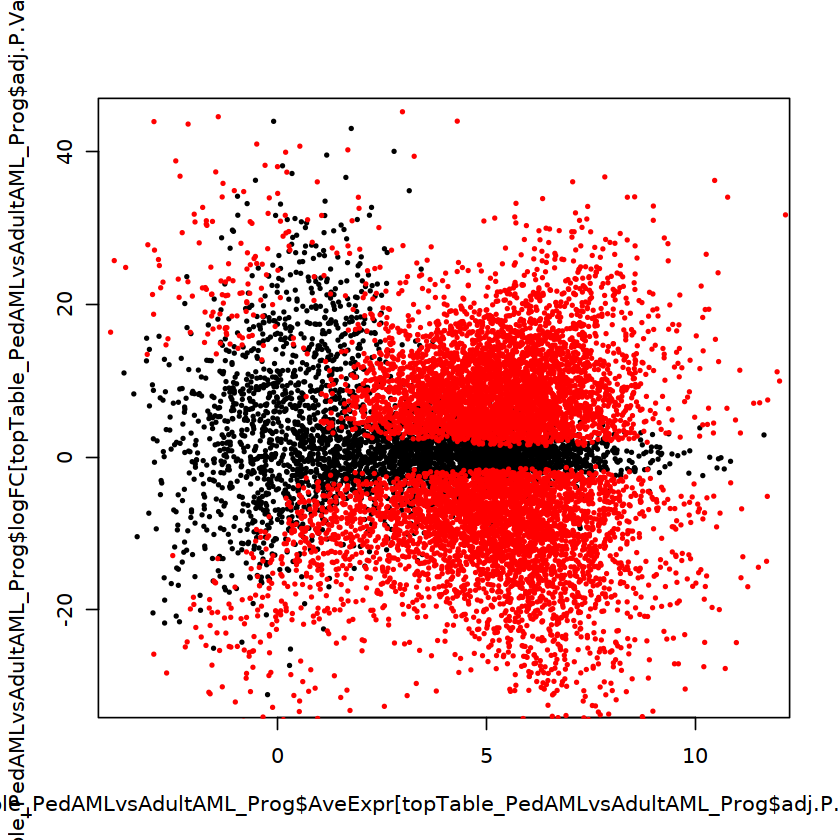

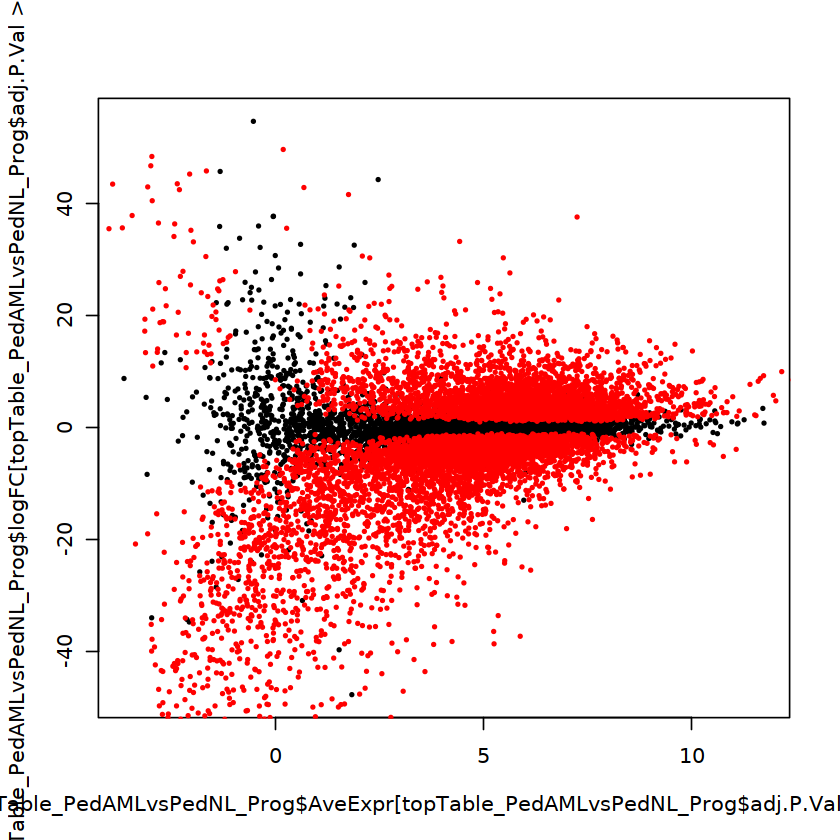

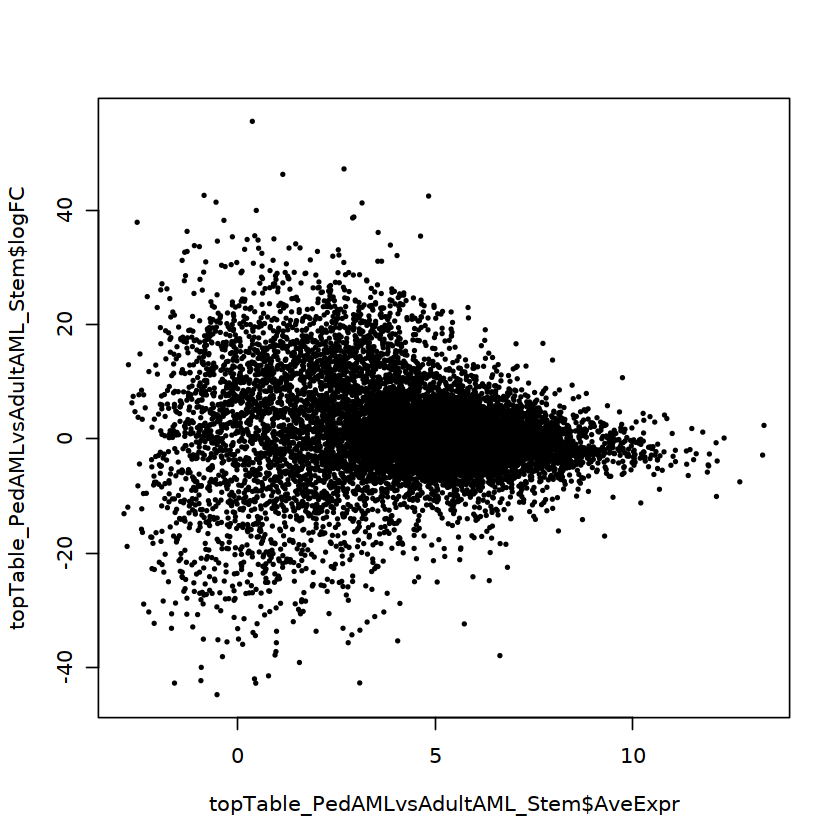

       
        FALSE TRUE
  FALSE   963 2930
  TRUE      0 8176

       
        FALSE TRUE
  FALSE  1872 2336
  TRUE      1 7860

       
        FALSE TRUE
  FALSE  1849 5188
  TRUE      0 4800

       
        FALSE TRUE
  FALSE  1254 4396
  TRUE      0 6187

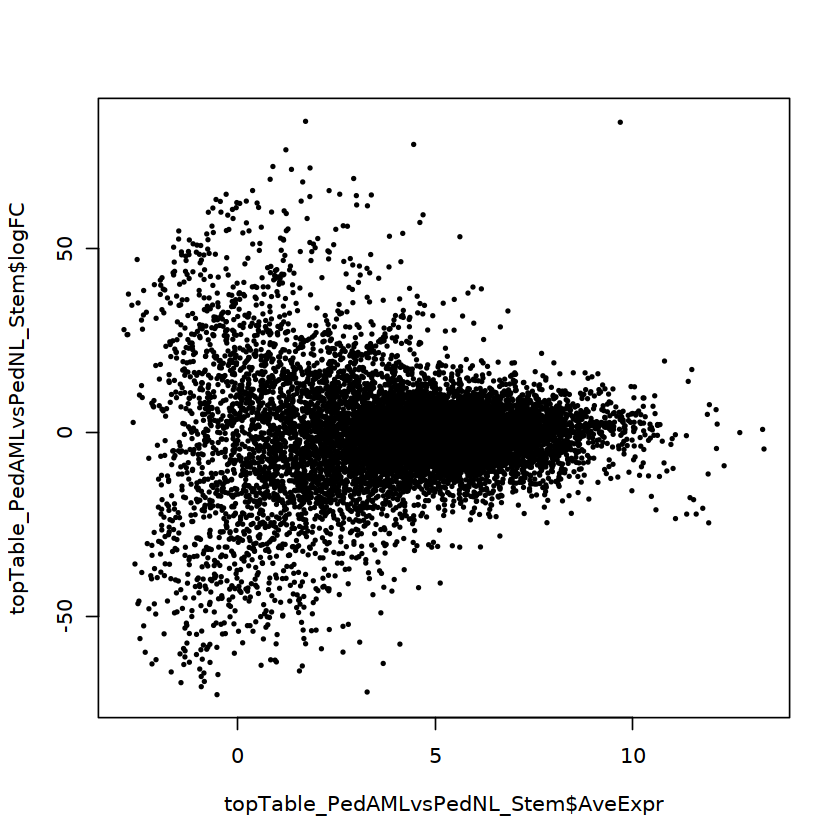

In [99]:
topTable_PedAMLvsAdultAML_Prog <- topTable(gOrigModeratedVoomedFitForContrasts.prog, coef=1, adjust.method = "BH", n=Inf)
topTable_PedAMLvsPedNL_Prog <- topTable(gOrigModeratedVoomedFitForContrasts.prog, coef=2, n=Inf)
topTable_PedAMLvsAdultAML_Stem <- topTable(gOrigModeratedVoomedFitForContrasts.stem, coef=1, n=Inf)
topTable_PedAMLvsPedNL_Stem <- topTable(gOrigModeratedVoomedFitForContrasts.stem, coef=2, n=Inf)
plot(topTable_PedAMLvsAdultAML_Prog$AveExpr[topTable_PedAMLvsAdultAML_Prog$adj.P.Val > 0.05], 
     topTable_PedAMLvsAdultAML_Prog$logFC[topTable_PedAMLvsAdultAML_Prog$adj.P.Val > 0.05], pch=19, cex=0.3)
points(topTable_PedAMLvsAdultAML_Prog$AveExpr[topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05], 
      topTable_PedAMLvsAdultAML_Prog$logFC[topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05], pch=19, cex=0.3, col="red")
plot(topTable_PedAMLvsPedNL_Prog$AveExpr[topTable_PedAMLvsPedNL_Prog$adj.P.Val > 0.05], 
     topTable_PedAMLvsPedNL_Prog$logFC[topTable_PedAMLvsPedNL_Prog$adj.P.Val > 0.05], pch=19, cex=0.3)
points(topTable_PedAMLvsPedNL_Prog$AveExpr[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05], 
      topTable_PedAMLvsPedNL_Prog$logFC[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05], pch=19, cex=0.3, col="red")
plot(topTable_PedAMLvsAdultAML_Stem$AveExpr, topTable_PedAMLvsAdultAML_Stem$logFC, pch=19, cex=0.3)
plot(topTable_PedAMLvsPedNL_Stem$AveExpr, topTable_PedAMLvsPedNL_Stem$logFC, pch=19, cex=0.3)
table(topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05, abs(topTable_PedAMLvsAdultAML_Prog$logFC) > 1)
table(topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05, abs(topTable_PedAMLvsPedNL_Prog$logFC) > 1)
table(topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.05, abs(topTable_PedAMLvsAdultAML_Stem$logFC) > 1)
table(topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05, abs(topTable_PedAMLvsPedNL_Stem$logFC) > 1)

In [43]:
topTable_ProgvsStem_AdultAML_All <- topTable(gModeratedVoomedFitForContrasts, coef=2, n=Inf)
topTable_ProgvsStem_PedAML_All <- topTable(gModeratedVoomedFitForContrasts, coef=1, n=Inf)
topTable_ProgvsStem_AdultAML_nocor <- topTable(gModeratedVoomedFitForContrasts.paired.nocor, coef=2, n=Inf)
topTable_ProgvsStem_PedAML_nocor <- topTable(gModeratedVoomedFitForContrasts.paired.nocor, coef=1, n=Inf)
topTable_ProgvsStem_AdultAML <- topTable(gModeratedVoomedFitForContrasts.paired, coef=2, n=Inf)
topTable_ProgvsStem_PedAML <- topTable(gModeratedVoomedFitForContrasts.paired, coef=1, n=Inf)
topTable_PedAMLvsAdultAML_Prog <- topTable(gModeratedVoomedFitForContrasts.prog, coef=1, n=Inf)
topTable_PedAMLvsPedNL_Prog <- topTable(gModeratedVoomedFitForContrasts.prog, coef=2, n=Inf)
topTable_PedAMLvsAdultAML_Stem <- topTable(gModeratedVoomedFitForContrasts.stem, coef=1, n=Inf)
topTable_PedAMLvsPedNL_Stem <- topTable(gModeratedVoomedFitForContrasts.stem, coef=2, n=Inf)

In [93]:
topTable_ABMvsPedAML_Prog <- topTable(gModeratedVoomedFitForContrasts.prog.merge, coef=1, n=Inf)
topTable_ABMvsPedNL_Prog <- topTable(gModeratedVoomedFitForContrasts.prog.merge, coef=2, n=Inf)
topTable_ABMvsAdultAML_Prog <- topTable(gModeratedVoomedFitForContrasts.prog.merge, coef=3, n=Inf)
topTable_ABMvssAML_Prog <- topTable(gModeratedVoomedFitForContrasts.prog.merge, coef=4, n=Inf)
topTable_ABMvsYBM_Prog <- topTable(gModeratedVoomedFitForContrasts.prog.merge, coef=5, n=Inf)
topTable_ABMvsPedAML_Stem <- topTable(gModeratedVoomedFitForContrasts.stem.merge, coef=1, n=Inf)
topTable_ABMvsPedNL_Stem <- topTable(gModeratedVoomedFitForContrasts.stem.merge, coef=2, n=Inf)
topTable_ABMvsAdultAML_Stem <- topTable(gModeratedVoomedFitForContrasts.stem.merge, coef=3, n=Inf)
topTable_ABMvssAML_Stem <- topTable(gModeratedVoomedFitForContrasts.stem.merge, coef=4, n=Inf)
topTable_ABMvsYBM_Stem <- topTable(gModeratedVoomedFitForContrasts.stem.merge, coef=5, n=Inf)

In [29]:
head(topTable_ProgvsStem_AdultAML_nocor)
head(topTable_ProgvsStem_PedAML_nocor)

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000117289,ENSG00000117289,NA,NA,NA,1.978544,10.136956,4.996909,5.028342e-04,0.79730654,-2.766187
ENSG00000113369,ENSG00000113369,57561,ARRDC3,protein_coding,2.027606,7.377441,5.397681,2.789013e-04,0.70757268,-2.813271
ENSG00000179348,ENSG00000179348,2624,GATA2,protein_coding,3.061008,7.531851,5.444771,2.606316e-04,0.70757268,-2.889292
ENSG00000145901,ENSG00000145901,10318,TNIP1,protein_coding,-2.638760,7.041069,-5.185680,3.798514e-04,0.79730654,-3.124701
ENSG00000119922,ENSG00000119922,3433,IFIT2,protein_coding,-6.372737,4.111075,-8.251570,7.728273e-06,0.05319635,-3.147156
ENSG00000186480,ENSG00000186480,3638,INSIG1,protein_coding,-2.023192,6.203788,-4.906493,5.761743e-04,0.81208566,-3.315075


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000198804,ENSG00000198804,4512,COX1,protein_coding,-1.1498419,11.519553,-3.990204,0.002442660,0.9958039,-3.774036
ENSG00000090382,ENSG00000090382,4069,LYZ,protein_coding,1.7836146,7.549745,3.897188,0.002846140,0.9958039,-3.869904
ENSG00000170571,ENSG00000170571,133418,EMB,protein_coding,0.6236163,7.297207,3.493869,0.005586408,0.9958039,-3.933146
ENSG00000125740,ENSG00000125740,2354,FOSB,protein_coding,-0.7189344,7.839708,-3.437767,0.006143987,0.9958039,-3.949986
ENSG00000198763,ENSG00000198763,4536,ND2,protein_coding,-1.1474841,10.955150,-3.281926,0.008013992,0.9958039,-3.952595
ENSG00000198888,ENSG00000198888,4535,ND1,protein_coding,-1.1691915,10.082192,-3.229033,0.008774137,0.9958039,-3.980614


In [44]:
write.table(topTable_ProgvsStem_AdultAML_All, file="../outputs/topTable_DEgenes_ProgvStem_AdultAML_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ProgvsStem_PedAML_All, file="../outputs/topTable_DEgenes_ProgvStem_PedAML_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ProgvsStem_AdultAML_nocor, file="../outputs/topTable_DEgenes_ProgvsStem_paired_AdultAML_nocor_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ProgvsStem_PedAML_nocor, file="../outputs/topTable_DEgenes_ProgvsStem_paired_PedAML_nocor_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_PedAMLvsAdultAML_Prog, file="../outputs/topTable_DEgenes_PedAMLvsAdultAML_Prog_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_PedAMLvsPedNL_Prog, file="../outputs/topTable_DEgenes_PedAMLvsPedNL_Prog_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_PedAMLvsAdultAML_Stem, file="../outputs/topTable_DEgenes_PedAMLvsAdultAML_Stem_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_PedAMLvsPedNL_Stem, file="../outputs/topTable_DEgenes_PedAMLvsPedNL_Stem_10142022.txt", quote=FALSE, sep="\t", row.names=FALSE)

In [50]:
write.table(topTable_ABMvsPedAML_Prog, file="../outputs/topTable_DEgenes_ABMvsPedAML_Prog_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsPedNL_Prog, file="../outputs/topTable_DEgenes_ABMvsPedNL_Prog_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsAdultAML_Prog, file="../outputs/topTable_DEgenes_ABMvsAdultAML_Prog_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvssAML_Prog, file="../outputs/topTable_DEgenes_ABMvssAML_Prog_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsYBM_Prog, file="../outputs/topTable_DEgenes_ABMvsYBM_Prog_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsPedAML_Stem, file="../outputs/topTable_DEgenes_ABMvsPedAML_Stem_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsPedNL_Stem, file="../outputs/topTable_DEgenes_ABMvsPedNL_Stem_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsAdultAML_Stem, file="../outputs/topTable_DEgenes_ABMvsAdultAML_Stem_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvssAML_Stem, file="../outputs/topTable_DEgenes_ABMvssAML_Stem_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)
write.table(topTable_ABMvsYBM_Stem, file="../outputs/topTable_DEgenes_ABMvsYBM_Stem_merge.txt", quote=FALSE, sep="\t", row.names=FALSE)

In [51]:
SplDB <- read.csv("SpliceosomeDB_lists/SplDBgenes_DeWerfPaperSubset.csv", stringsAsFactors=FALSE, header=TRUE)
dim(SplDB)
head(SplDB)

[1] 130  16

,Gene.Symbol,Complex,Class...family,Full.name.from.Entrez,More.Aliases.from.Entrez,Organism,Ensemble.Gene.ID,Molecular.weight.from.SwissProt,Domains.from.SwissProt,Motifs.from.SwissProt,Entrez.Gene.ID,Full.Gene.Name.from.Entrez,UniProt.Entry.Name,Other.UniProt.Accessions,Pdbs,Compositional.AA.Bias.from.SwissProt
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,SNRPB,"17S U2 snRNP, A complex, B complex, Bact complex, C complex, U1 snRNP, U4/U6 snRNP, U5 snRNP, tri-snRNP, P complex",Sm,small nuclear ribonucleoprotein polypeptides B and B1,"B polypeptide of Sm protein, Sm protein B/B', sm-B/Sm-B', small nuclear ribonucleoprotein polypeptide B, small nuclear ribonucleoprotein polypeptides B and B'",H. sapiens,ENSG00000125835,24610,,,6628,small nuclear ribonucleoprotein polypeptides B and B1,RSMB_HUMAN,"P14678, Q15490, Q6IB35, Q9UIS5","1D3B, 2Y9A, 2Y9B, 2Y9C, 2Y9D",
2,SNRPD1,"17S U2 snRNP, A complex, B complex, Bact complex, C complex, U1 snRNP, U4/U6 snRNP, U5 snRNP, tri-snRNP, P complex",Sm,small nuclear ribonucleoprotein D1 polypeptide 16kDa,"Sm-D autoantigen, small nuclear ribonucleoprotein D1 polypeptide 16kDa pseudogene, small nuclear ribonucleoprotein Sm D1, snRNP core protein D1",H. sapiens,ENSG00000167088,13282,,,6632,small nuclear ribonucleoprotein D1 polypeptide 16kDa,SMD1_HUMAN,"P62314, B5BTZ1, P13641","1B34, 2Y9A, 2Y9B, 2Y9C, 2Y9D",Arg/Lys-rich (basic)
3,SNRPD2,"17S U2 snRNP, A complex, B complex, Bact complex, C complex, U1 snRNP, U4/U6 snRNP, U5 snRNP, tri-snRNP, P complex",Sm,small nuclear ribonucleoprotein D2 polypeptide 16.5kDa,"small nuclear ribonucleoprotein Sm D2, snRNP core protein D2",H. sapiens,ENSG00000125743,13527,,,6633,small nuclear ribonucleoprotein D2 polypeptide 16.5kDa,SMD2_HUMAN,"P62316, A8K797, P43330","1B34, 2Y9A, 2Y9B, 2Y9C, 2Y9D",
4,SNRPD3,"17S U2 snRNP, A complex, B complex, Bact complex, C complex, U1 snRNP, U4/U6 snRNP, U5 snRNP, tri-snRNP, P complex",Sm,small nuclear ribonucleoprotein D3 polypeptide 18kDa,"small nuclear ribonucleoprotein Sm D3, small nuclear ribonucleoprotein polypeptide D3, snRNP core protein D3",H. sapiens,ENSG00000100028,13916,,,6634,small nuclear ribonucleoprotein D3 polypeptide 18kDa,SMD3_HUMAN,"P62318, B5BU13, P43331","1D3B, 2Y9A, 2Y9B, 2Y9C, 2Y9D",Arg/Lys-rich (basic)
5,SNRPE,"17S U2 snRNP, A complex, B complex, Bact complex, C complex, U1 snRNP, U4/U6 snRNP, U5 snRNP, tri-snRNP, P complex",Sm,small nuclear ribonucleoprotein polypeptide E,"sm protein E, small nuclear ribonucleoprotein E, snRNP-E",H. sapiens,ENSG00000182004,10804,,,6635,small nuclear ribonucleoprotein polypeptide E,RUXE_HUMAN,"P62304, B2R5B9, P08578, Q15498, Q5BKT2","2Y9A, 2Y9B, 2Y9C, 2Y9D, 3CW1",
6,SNRPF,"17S U2 snRNP, A complex, B complex, Bact complex, C complex, U1 snRNP, U4/U6 snRNP, U5 snRNP, tri-snRNP, P complex",Sm,small nuclear ribonucleoprotein polypeptide F,"sm protein F, small nuclear ribonucleoprotein F",H. sapiens,ENSG00000139343,9725,,,6636,small nuclear ribonucleoprotein polypeptide F,RUXF_HUMAN,"P62306, A2VCR2, B2R498, Q15356, Q6IBQ1","2Y9A, 2Y9B, 2Y9C, 2Y9D, 3CW1",


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000071553,ENSG00000071553,537,ATP6AP1,protein_coding,-42.88254,6.543131,-48.55173,4.499228e-59,4.990544e-55,95.27620
ENSG00000074370,ENSG00000074370,489,ATP2A3,protein_coding,-39.88278,7.399215,-47.56602,2.044181e-58,1.133703e-54,94.63203
ENSG00000068831,ENSG00000068831,10235,RASGRP2,protein_coding,-49.03773,6.203829,-46.10645,2.031026e-57,5.632035e-54,93.26364
ENSG00000072958,ENSG00000072958,8907,AP1M1,protein_coding,-35.49096,6.004106,-44.61132,2.291771e-56,5.084064e-53,92.52778
ENSG00000067057,ENSG00000067057,5214,PFKP,protein_coding,-26.61665,6.416701,-42.92908,3.838449e-55,7.096013e-52,91.20141
ENSG00000072818,ENSG00000072818,9744,ACAP1,protein_coding,-31.96077,6.617498,-42.33597,1.062368e-54,1.472974e-51,90.70940


       
        FALSE TRUE
  FALSE  1399   10
  TRUE   9573  110

       
        FALSE TRUE
  FALSE  1731   11
  TRUE   9241  109

       
        FALSE TRUE
  FALSE  2100   17
  TRUE   8872  103

       
        FALSE TRUE
  FALSE  2120   11
  TRUE   8852  109

       
        FALSE TRUE
  FALSE  9188   79
  TRUE   1784   41

       
        FALSE TRUE
  FALSE  3213   34
  TRUE   7528   85

       
        FALSE TRUE
  FALSE  4708   48
  TRUE   6033   71

       
        FALSE TRUE
  FALSE  3856   37
  TRUE   6885   82

       
        FALSE TRUE
  FALSE  3861   40
  TRUE   6880   79

       
        FALSE TRUE
  FALSE  6133   70
  TRUE   4608   49

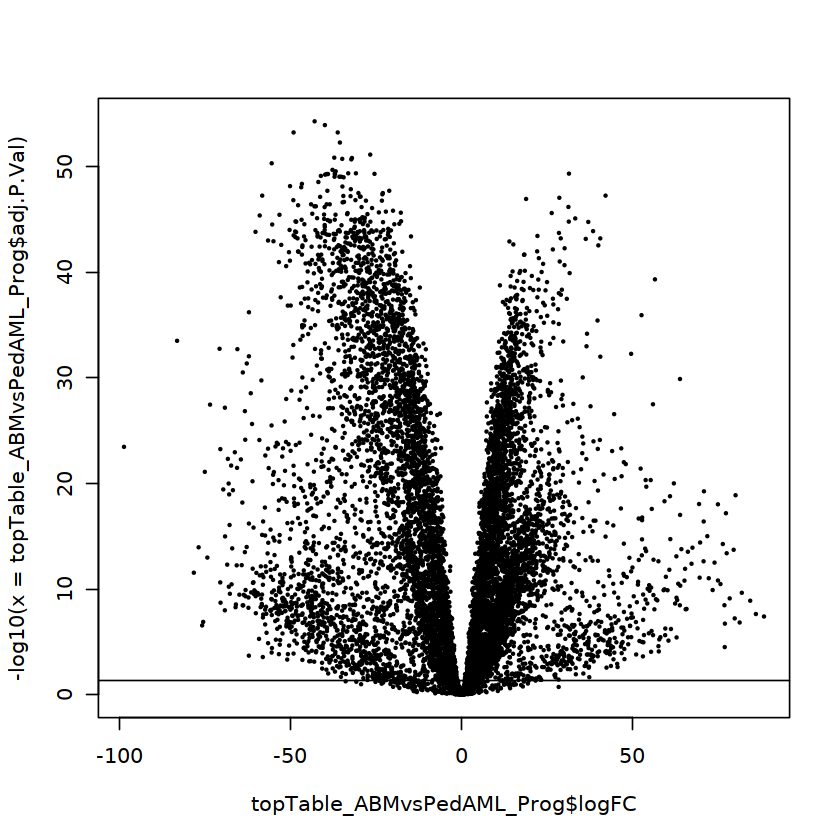

In [95]:
plot(topTable_ABMvsPedAML_Prog$logFC, -log10(x = topTable_ABMvsPedAML_Prog$adj.P.Val), pch=19, cex=0.2)
abline(h=-log10(0.05))
head(topTable_ABMvsPedAML_Prog)
table(topTable_ABMvsPedAML_Prog$adj.P.Val < 0.05, topTable_ABMvsPedAML_Prog$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsPedNL_Prog$adj.P.Val < 0.05, topTable_ABMvsPedNL_Prog$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsAdultAML_Prog$adj.P.Val < 0.05, topTable_ABMvsAdultAML_Prog$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvssAML_Prog$adj.P.Val < 0.05, topTable_ABMvssAML_Prog$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsYBM_Prog$adj.P.Val < 0.05, topTable_ABMvsYBM_Prog$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsPedAML_Stem$adj.P.Val < 0.05, topTable_ABMvsPedAML_Stem$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsPedNL_Stem$adj.P.Val < 0.05, topTable_ABMvsPedNL_Stem$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsAdultAML_Stem$adj.P.Val < 0.05, topTable_ABMvsAdultAML_Stem$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvssAML_Stem$adj.P.Val < 0.05, topTable_ABMvssAML_Stem$SYMBOL %in% SplDB$Gene.Symbol)
table(topTable_ABMvsYBM_Stem$adj.P.Val < 0.05, topTable_ABMvsYBM_Stem$SYMBOL %in% SplDB$Gene.Symbol)


In [45]:
topTable_ProgvsStem_AdultAML_All = read.table(file="../outputs/topTable_DEgenes_ProgvStem_AdultAML_All.txt", sep="\t", header=TRUE)
topTable_ProgvsStem_PedAML_All = read.table(file="../outputs/topTable_DEgenes_ProgvStem_PedAML_All.txt", sep="\t", header=TRUE)
topTable_ProgvsStem_AdultAML_nocor = read.table(file="../outputs/topTable_DEgenes_ProgvsStem_paired_AdultAML_nocor.txt", sep="\t", header=TRUE)
topTable_ProgvsStem_PedAML_nocor = read.table(file="../outputs/topTable_DEgenes_ProgvsStem_paired_PedAML_nocor.txt", sep="\t", header=TRUE)
topTable_PedAMLvsAdultAML_Prog = read.table(file="../outputs/topTable_DEgenes_PedAMLvsAdultAML_Prog.txt", sep="\t", header=TRUE)
topTable_PedAMLvsPedNL_Prog = read.table(file="../outputs/topTable_DEgenes_PedAMLvsPedNL_Prog.txt", sep="\t", header=TRUE)
topTable_PedAMLvsAdultAML_Stem = read.table(file="../outputs/topTable_DEgenes_PedAMLvsAdultAML_Stem.txt", sep="\t", header=TRUE)
topTable_PedAMLvsPedNL_Stem = read.table(file="../outputs/topTable_DEgenes_PedAMLvsPedNL_Stem.txt", sep="\t", header=TRUE)

Warning message in file(file, "rt"):
“cannot open file '../outputs/topTable_DEgenes_PedAMLvsAdultAML_Prog.txt': No such file or directory”


ERROR: Error in file(file, "rt"): cannot open the connection


In [56]:
head(topTable_PedAMLvsAdultAML_Prog)

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ENSG00000127022,821,CANX,protein_coding,1.487862,9.607598,6.545484,2.972819e-06,0.009870516,4.783663
2,ENSG00000198840,4537,ND3,protein_coding,-2.519836,4.939021,-6.498701,3.271362e-06,0.009870516,4.671913
3,ENSG00000269028,100462981,MTRNR2L2,protein_coding,-2.227289,3.341528,-6.597133,2.675673e-06,0.009870516,4.648341
4,ENSG00000228253,4509,ATP8,protein_coding,-2.563000,2.939427,-6.663799,2.336838e-06,0.009870516,4.595744
5,ENSG00000212907,4539,ND4L,protein_coding,-2.145202,5.958718,-5.965622,9.933144e-06,0.016264036,3.636084
6,ENSG00000213741,6235,RPS29,protein_coding,-1.675567,5.747700,-5.946884,1.033546e-05,0.016264036,3.598358


In [57]:
ras_gns <- read.table(file="RasSignalingPathwayGenes.csv", header=TRUE, sep=",")
nrow(ras_gns)
ras_gns_filt <- ras_gns[ras_gns$Name %in% topTable_PedAMLvsPedNL_Prog$SYMBOL[
    topTable_PedAMLvsPedNL_Prog$AveExpr > 2],]
nrow(ras_gns_filt)
table(topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05)
table(topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05)
table(topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.05)
table(topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05)


[1] 184

[1] 103


FALSE  TRUE 
11902   167 


FALSE  TRUE 
11397   672 


FALSE 
11837 


FALSE  TRUE 
11621   216 

In [58]:
topTable_PedAMLvsAdultAML_Prog[topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05 &
                               topTable_PedAMLvsAdultAML_Prog$SYMBOL %in% ras_gns_filt$Name,]
topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05 & 
                           topTable_PedAMLvsPedNL_Prog$SYMBOL %in% ras_gns_filt$Name,]
table(topTable_PedAMLvsAdultAML_Stem$SYMBOL[topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.05] %in% ras_gns_filt$Name)
table(topTable_PedAMLvsPedNL_Stem$SYMBOL[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05] %in% ras_gns_filt$Name)

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
124,ENSG00000174775,3265,HRAS,protein_coding,-1.859705,3.982181,-4.271083,0.0004182237,0.03838021,0.1574318


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
88,ENSG00000171777,115727,RASGRP4,protein_coding,3.480177,3.423944,4.964675,8.767147e-05,0.01037360,1.523079
719,ENSG00000123739,81579,PLA2G12A,protein_coding,-1.198289,4.628509,-3.488702,2.477173e-03,0.04753289,-2.207517


< table of extent 0 >


FALSE 
  216 

In [59]:
topTable_PedAMLvsAdultAML_Prog[topTable_PedAMLvsAdultAML_Prog$P.Value < 0.05 &
                               topTable_PedAMLvsAdultAML_Prog$SYMBOL %in% ras_gns_filt$Name,]
topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$P.Value < 0.05 & 
                           topTable_PedAMLvsPedNL_Prog$SYMBOL %in% ras_gns_filt$Name,]
table(topTable_PedAMLvsAdultAML_Stem$SYMBOL[topTable_PedAMLvsAdultAML_Stem$P.Value < 0.05] %in% ras_gns_filt$Name)
table(topTable_PedAMLvsPedNL_Stem$SYMBOL[topTable_PedAMLvsPedNL_Stem$P.Value < 0.05] %in% ras_gns_filt$Name)

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
124,ENSG00000174775,3265,HRAS,protein_coding,-1.8597054,3.982181,-4.271083,0.0004182237,0.03838021,0.1574318
227,ENSG00000002330,572,BAD,protein_coding,-1.1465065,4.947811,-3.813005,0.0011862224,0.06019421,-0.8407899
261,ENSG00000050748,5601,MAPK9,protein_coding,1.2645059,5.625267,3.696869,0.0015448691,0.06612358,-1.0435422
336,ENSG00000166501,5579,PRKCB,protein_coding,1.8229758,7.953977,3.557292,0.0021207808,0.07754659,-1.4718767
361,ENSG00000142875,5567,PRKACB,protein_coding,1.9213171,7.132935,3.452728,0.0026871053,0.08812683,-1.6179623
818,ENSG00000105221,208,AKT2,protein_coding,-0.8193083,5.595572,-2.828338,0.0107871661,0.16271729,-2.9431860
927,ENSG00000128340,5880,RAC2,protein_coding,1.3484616,8.501406,2.748798,0.0128210924,0.17956945,-3.1739919
1107,ENSG00000075651,5337,PLD1,protein_coding,-1.3828805,4.949750,-2.586832,0.0181490139,0.21142900,-3.4180087
1208,ENSG00000180370,5062,PAK2,protein_coding,0.6597669,7.260337,2.546443,0.0197728354,0.22096144,-3.5511264


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
88,ENSG00000171777,115727,RASGRP4,protein_coding,3.4801774,3.423944,4.964675,8.767147e-05,0.01037360,1.523079
719,ENSG00000123739,81579,PLA2G12A,protein_coding,-1.1982889,4.628509,-3.488702,2.477173e-03,0.04753289,-2.207517
1134,ENSG00000108774,5878,RAB5C,protein_coding,1.3292505,6.640097,3.197179,4.774041e-03,0.06317753,-3.012892
1280,ENSG00000184381,8398,PLA2G6,protein_coding,-0.9182283,4.709009,-3.003710,7.340295e-03,0.07846768,-3.259044
1370,ENSG00000180370,5062,PAK2,protein_coding,0.6048046,7.260337,3.045102,6.697812e-03,0.07501547,-3.382497
1405,ENSG00000116711,5321,PLA2G4A,protein_coding,-1.6408485,2.602792,-2.714423,1.380928e-02,0.10677434,-3.431033
1575,ENSG00000075651,5337,PLD1,protein_coding,1.4435076,4.949750,2.794859,1.160247e-02,0.09764389,-3.622083
1794,ENSG00000072062,5566,PRKACA,protein_coding,0.6290189,3.634395,2.577832,1.849956e-02,0.12184163,-3.885740
1921,ENSG00000166501,5579,PRKCB,protein_coding,1.0621173,7.953977,2.738012,1.312365e-02,0.10439293,-4.033314



FALSE  TRUE 
  288     2 


FALSE  TRUE 
 1656    10 

In [76]:
#ras_gns[ras_gns$Name %in% topTable_PedAMLvsPedNL_Prog$SYMBOL[
#    topTable_PedAMLvsPedNL_Prog$AveExpr > 2],]
topTable_PedAMLvsPedNL_Prog[grep("HOXA", topTable_PedAMLvsPedNL_Prog$SYMBOL),]
topTable_PedAMLvsPedNL_Stem[grep("HOXA", topTable_PedAMLvsPedNL_Stem$SYMBOL),]
HOXA_gns <- topTable_PedAMLvsPedNL_Prog$SYMBOL[grep("HOXA", topTable_PedAMLvsPedNL_Prog$SYMBOL)]

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
230,ENSG00000122592,3204,HOXA7,protein_coding,-6.518843,-0.1834324,-4.228033,0.0004612044,0.02124533,0.0296586
411,ENSG00000106006,3203,HOXA6,protein_coding,-5.155542,-1.1031998,-3.646035,0.0017340013,0.04086161,-1.1260294
526,ENSG00000253293,3206,HOXA10,protein_coding,-5.829228,2.0955530,-3.478159,0.0025369644,0.04821830,-1.5534650
673,ENSG00000105997,3200,HOXA3,protein_coding,-4.803237,-1.6052664,-3.153745,0.0052603648,0.06696977,-2.0550980
721,ENSG00000106004,3202,HOXA5,protein_coding,-5.263400,-0.3849901,-3.075176,0.0062655635,0.07348794,-2.2101031
765,ENSG00000078399,3205,HOXA9,protein_coding,-5.901695,2.1597292,-3.109717,0.0058025197,0.07062253,-2.3240181
839,ENSG00000197576,3201,HOXA4,protein_coding,-3.516853,-1.1133582,-2.925408,0.0087226429,0.08503309,-2.4699810


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
115,ENSG00000078399,3205,HOXA9,protein_coding,-7.552248,2.3352369,-4.479062,0.0003942409,0.03674511,0.2481055
123,ENSG00000253293,3206,HOXA10,protein_coding,-4.712835,3.3226810,-4.429359,0.0004365935,0.03732476,0.1502429
172,ENSG00000106006,3203,HOXA6,protein_coding,-6.476871,-0.3700720,-4.251768,0.0006297184,0.04164233,-0.2990918
173,ENSG00000105997,3200,HOXA3,protein_coding,-6.136576,-0.1584074,-4.247805,0.0006349046,0.04175203,-0.3002232
258,ENSG00000106004,3202,HOXA5,protein_coding,-4.843111,1.8570147,-3.797177,0.0016232773,0.06837983,-1.0069843
321,ENSG00000122592,3204,HOXA7,protein_coding,-5.552857,0.2803296,-3.592774,0.0024913188,0.08320744,-1.3849671
1147,ENSG00000197576,3201,HOXA4,protein_coding,-3.768337,-1.5609796,-2.114194,0.0508215287,0.35676849,-3.7701118



> The results here are identify a lot more genes compared to those above with the log-fold-change threshold. We will not use the threshold to filter the significant genelists.


### Volcano Plots


    0     1     2 
11902   122    45 

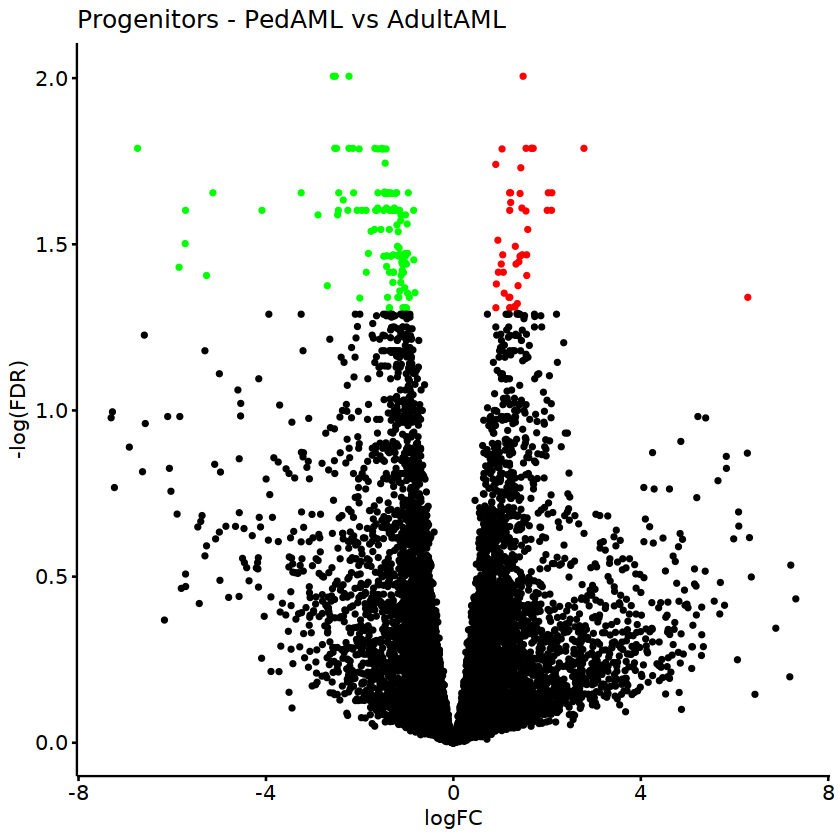

In [38]:
topTable_PedAMLvsAdultAML_Prog$logFDR <- -log(topTable_PedAMLvsAdultAML_Prog$adj.P.Val,10)
topTable_PedAMLvsAdultAML_Prog$col <- 0
topTable_PedAMLvsAdultAML_Prog$col[topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsAdultAML_Prog$logFC < 0] <- 1
topTable_PedAMLvsAdultAML_Prog$col[topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsAdultAML_Prog$logFC > 0] <- 2
topTable_PedAMLvsAdultAML_Prog$col <- factor(topTable_PedAMLvsAdultAML_Prog$col)
table(topTable_PedAMLvsAdultAML_Prog$col)
#png(file="DeWerf_PedAML_Prog_PedAMLvsAdultAML_ggScatter_04142020.png", width=7, height=7, , units = 'in', res = 300)
ggscatter(topTable_PedAMLvsAdultAML_Prog,
          x="logFC", y="logFDR", color="col", 
          font.label=c(16,"plain"), palette=c("black", "green", "red"),
          title = "Progenitors - PedAML vs AdultAML",size=1#, size="RiskStatusSize"
         ) +
          ylab("-log(FDR)") + xlab("logFC") + rremove("legend")
          #theme(legend.title=element_text(size=0))
          #stat_smooth(method="lm", se=FALSE, col="black") 
          #guides(colour = guide_legend(override.aes = list(size=4)))
#dev.off()

In [146]:
topTable_PedAMLvsPedNL_Prog$logFDR <- -log(topTable_PedAMLvsPedNL_Prog$adj.P.Val,10)
topTable_PedAMLvsPedNL_Prog$col <- 0
topTable_PedAMLvsPedNL_Prog$col[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsPedNL_Prog$logFC < 0] <- 1
topTable_PedAMLvsPedNL_Prog$col[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsPedNL_Prog$logFC > 0] <- 2
topTable_PedAMLvsPedNL_Prog$col <- factor(topTable_PedAMLvsPedNL_Prog$col)
table(topTable_PedAMLvsPedNL_Prog$col)
png(file="DeWerf_PedAML_Prog_PedAMLvsPedNL_ggScatter_04142020.png", width=7, height=7, , units = 'in', res = 300)
ggscatter(topTable_PedAMLvsPedNL_Prog,
           x="logFC", y="logFDR", color="col", 
          font.label=c(16,"plain"), palette=c("black", "green", "red"),
          title = "Progenitors - PedAML vs AdultAML",size=1#, size="RiskStatusSize"
         ) +
          ylab("-log(FDR)") + xlab("logFC") + rremove("legend")
          #heme(legend.title=element_text(size=0))
          #stat_smooth(method="lm", se=FALSE, col="black") 
          #guides(colour = guide_legend(override.aes = list(size=4)))
dev.off()


    0     1     2 
11397   525   147 

png 
  2


    0 
11837 

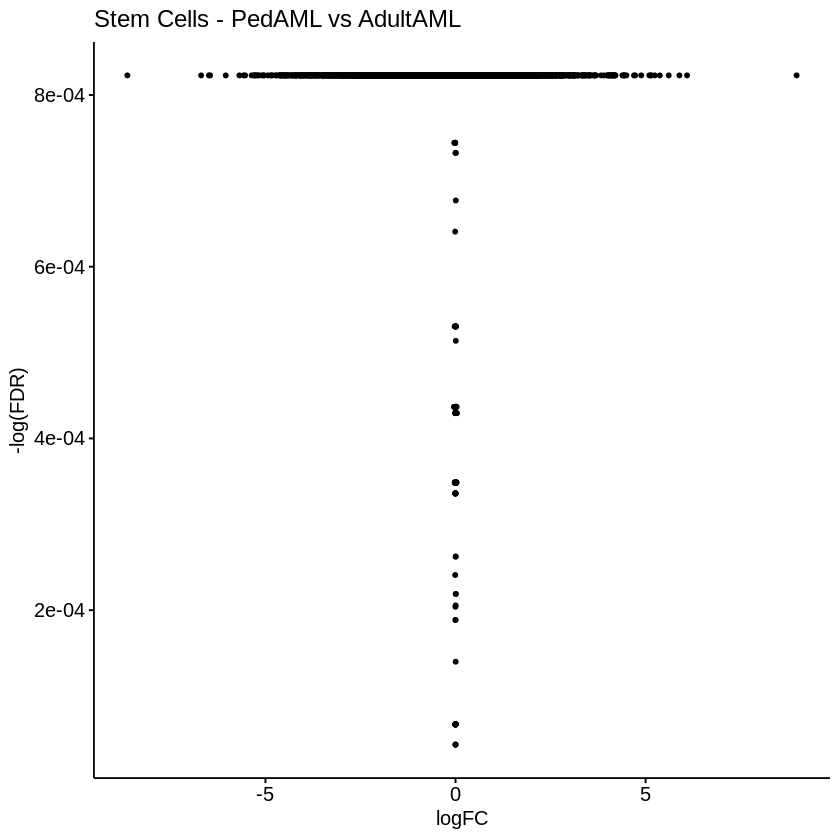

In [143]:
topTable_PedAMLvsAdultAML_Stem$logFDR <- -log(topTable_PedAMLvsAdultAML_Stem$adj.P.Val,10)
topTable_PedAMLvsAdultAML_Stem$col <- 0
topTable_PedAMLvsAdultAML_Stem$col[topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsAdultAML_Stem$logFC < 0] <- 1
topTable_PedAMLvsAdultAML_Stem$col[topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsAdultAML_Stem$logFC > 0] <- 2
topTable_PedAMLvsAdultAML_Stem$col <- factor(topTable_PedAMLvsAdultAML_Stem$col)
table(topTable_PedAMLvsAdultAML_Stem$col)
#png(file="DeWerf_PedAML_Stem_PedAMLvsAdultAML_ggScatter_04142020.png", width=7, height=7, , units = 'in', res = 300)
ggscatter(topTable_PedAMLvsAdultAML_Stem,
          x="logFC", y="logFDR", color="col", 
          font.label=c(16,"plain"), palette=c("black", "green", "red"),
          title = "Stem Cells - PedAML vs AdultAML",size=1#, size="RiskStatusSize"
         ) +
          ylab("-log(FDR)") + xlab("logFC") + rremove("legend")
          #theme(legend.title=element_text(size=0))
          #stat_smooth(method="lm", se=FALSE, col="black") 
          #guides(colour = guide_legend(override.aes = list(size=4)))
#dev.off()


   0    1    2 
4948 3577 3312 

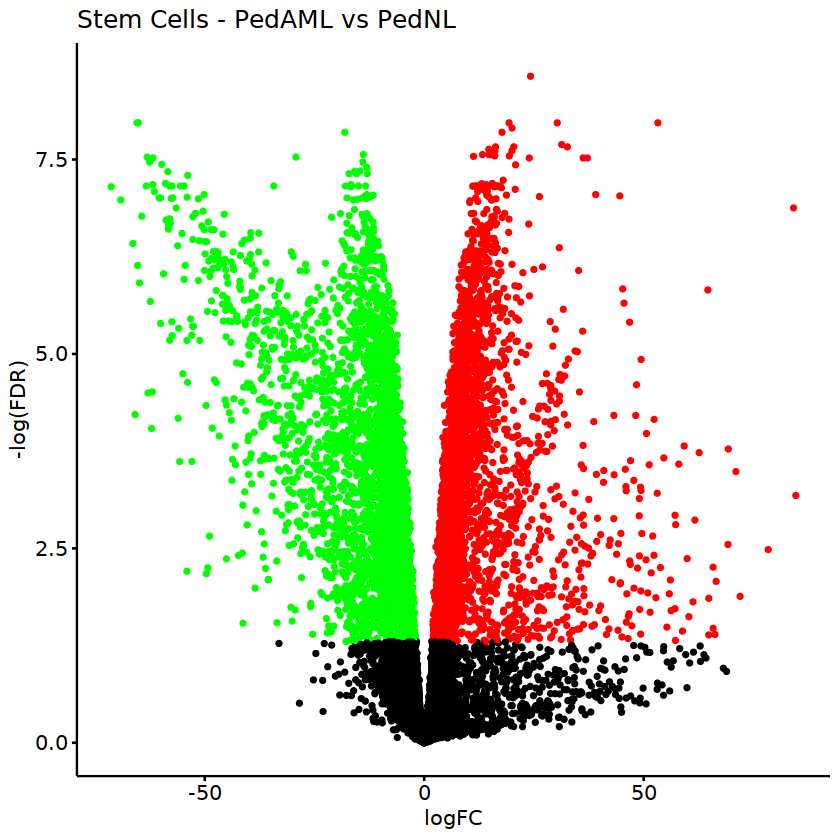

In [52]:
topTable_PedAMLvsPedNL_Stem$logFDR <- -log(topTable_PedAMLvsPedNL_Stem$adj.P.Val,10)
topTable_PedAMLvsPedNL_Stem$col <- 0
topTable_PedAMLvsPedNL_Stem$col[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsPedNL_Stem$logFC < 0] <- 1
topTable_PedAMLvsPedNL_Stem$col[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05 & 
                                   topTable_PedAMLvsPedNL_Stem$logFC > 0] <- 2
topTable_PedAMLvsPedNL_Stem$col <- factor(topTable_PedAMLvsPedNL_Stem$col)
table(topTable_PedAMLvsPedNL_Stem$col)
#png(file="DeWerf_PedAML_Stem_PedAMLvsPedNL_ggScatter_04142020.png", width=7, height=7, , units = 'in', res = 300)
ggscatter(topTable_PedAMLvsPedNL_Stem,
          x="logFC", y="logFDR", color="col", 
          font.label=c(16,"plain"), palette=c("black", "green", "red"),
          title = "Stem Cells - PedAML vs PedNL",size=1#, size="RiskStatusSize"
         ) +
          ylab("-log(FDR)") + xlab("logFC") + rremove("legend")
          #theme(legend.title=element_text(size=0))
          #stat_smooth(method="lm", se=FALSE, col="black") 
          #guides(colour = guide_legend(override.aes = list(size=4)))
#dev.off()

In [39]:
HanSplicingFac <- read.csv(file="../inputs//Han_SupTable4.csv")
head(HanSplicingFac)
HanSplicingFac_sig_PedAMLvsPedNL_Stem <- topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$SYMBOL %in% HanSplicingFac$NAME,]
HanSplicingFac_sig_PedAMLvsPedNL_Prog <- topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$SYMBOL %in% HanSplicingFac$NAME,]
HanSplicingFac_sig_PedAMLvsPedNL_Stem[HanSplicingFac_sig_PedAMLvsPedNL_Stem$adj.P.Val < 0.05,]
HanSplicingFac_sig_PedAMLvsPedNL_Prog[HanSplicingFac_sig_PedAMLvsPedNL_Prog$adj.P.Val < 0.05,]

,Rank,NAME,Av_ESC.iPS,Av_DIFF,C_p.value.Wilcox,ESCvsDIFF,DIFFvsESC,ESC_H1.a,ESC_H1.b,ESC_H9.a,⋯,Liver.a,Liver.b,Lung,LymphNode,Ovary,Prostate,Testis.a,Testis.b,Thyroid,WBC
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,MBNL1,3.16,41.87,0.014,0.08,13.26,2.00,4.20,2.95,⋯,16.13,6.49,76.80,78.47,45.43,71.11,37.59,7.59,46.46,144.90
2,2,MBNL2,0.98,25.62,0.014,0.04,26.22,0.47,1.06,2.48,⋯,34.87,6.61,44.12,40.50,33.62,42.76,28.14,5.57,36.48,16.04
3,3,CELF6,0.05,1.94,0.012,0.03,38.87,0.02,0.04,0.19,⋯,0.22,0.58,0.66,1.92,1.62,2.32,2.16,9.16,1.19,0.15
4,4,RBM18,5.52,10.34,0.129,0.53,1.87,5.87,6.87,5.30,⋯,4.27,1.71,7.66,15.08,12.65,18.46,10.83,5.10,9.90,16.39
5,5,SRSF8,6.64,13.38,0.402,0.50,2.02,4.33,6.51,4.10,⋯,9.99,6.54,7.39,20.78,25.40,18.56,13.59,3.20,25.50,18.12
6,6,LSMD1,7.79,26.90,0.044,0.29,3.45,14.60,4.87,14.88,⋯,8.08,36.16,11.86,11.67,9.00,12.77,28.91,58.63,14.95,10.63


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
102,ENSG00000100320,23543,RBFOX2,protein_coding,-5.668322,-0.4577893,-4.772882,0.0002167001,0.0278813,0.4497753


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
59,ENSG00000131773,10656,KHDRBS3,protein_coding,-3.5967693,1.4115165,-5.132113,6.045555e-05,0.009240536,1.9362994
178,ENSG00000100320,23543,RBFOX2,protein_coding,-4.2047454,-0.7028527,-4.457800,2.738458e-04,0.017580029,0.4783750
345,ENSG00000161981,79622,SNRNP25,protein_coding,-1.4710200,4.8233479,-4.146891,5.546698e-04,0.023244132,-0.7352512
366,ENSG00000166831,348093,RBPMS2,protein_coding,-5.2405657,0.9604158,-3.782306,1.272058e-03,0.034655679,-0.8547991
604,ENSG00000101811,1478,CSTF2,protein_coding,-1.1859456,4.3508994,-3.619553,1.841459e-03,0.041160841,-1.8448278
635,ENSG00000060688,9410,SNRNP40,protein_coding,-0.9716234,6.2378741,-3.676022,1.619818e-03,0.039414482,-1.9544662


### Venn Diagrams

Venn diagrams show the overlap of the identified differentially expressed genes across various comparisons.

In [185]:
### Don't run these functions
plotComparisonsVenn = function(aTestResults, coefficientsVector=c(1,2,3,4,5), 
                               colorsVector=c("green","blue","purple","red","orange" ),
                               mar=rep(0,4), cex=c(.9,0.6, 0.5),
                               heightIn=7, widthIn=7){
    options(repr.plot.width=heightIn, repr.plot.height=widthIn)
    vennDiagram(aTestResults[,coefficientsVector], 
                circle.col=colorsVector,
                mar=mar,cex=cex)    
}

plotAndSaveComparisonsVenn = function(aTestResults, outputDir, runName, thresholdDesc,
                                      comparisonsDesc,
                                      coefficientsVector=c(1,2,3,4,5), 
                                      colorsVector=c("green","blue","purple","red","orange" ),
                                      mar=rep(0,4), cex=c(.9,0.6, 0.5),
                                      heightIn=7, widthIn=7){
    plotComparisonsVenn(aTestResults, coefficientsVector, colorsVector, mar, cex, heightIn, widthIn)

    fileName = paste0(paste(runName, "Venn", comparisonsDesc, thresholdDesc, sep="_"),".png")
    png(filename = file.path(outputDir, fileName), height = 7, width = 7, 
      units = "in", res = 300)

    plotComparisonsVenn(aTestResults, coefficientsVector, colorsVector, mar, cex, heightIn, widthIn)

    dev.off()
    print(paste0("Output file: ", fileName))
}

In [186]:
globalPlotAndSaveComparisonsVenn = function(comparisonsDesc,coefficientsVector=c(1,2,3,4,5), 
                                            colorsVector=c("green","blue","purple","red","orange" ),
                                            mar=rep(0,4), cex=c(.9,0.6, 0.5),
                                            heightIn=7, widthIn=7){
    plotAndSaveComparisonsVenn(gLogThresholdedTestResults, gOutputDir, gRunName, 
                               gThresholdDescription, comparisonsDesc, coefficientsVector,
                               colorsVector, mar, cex, heightIn, widthIn)    
}

[1] 12274     4

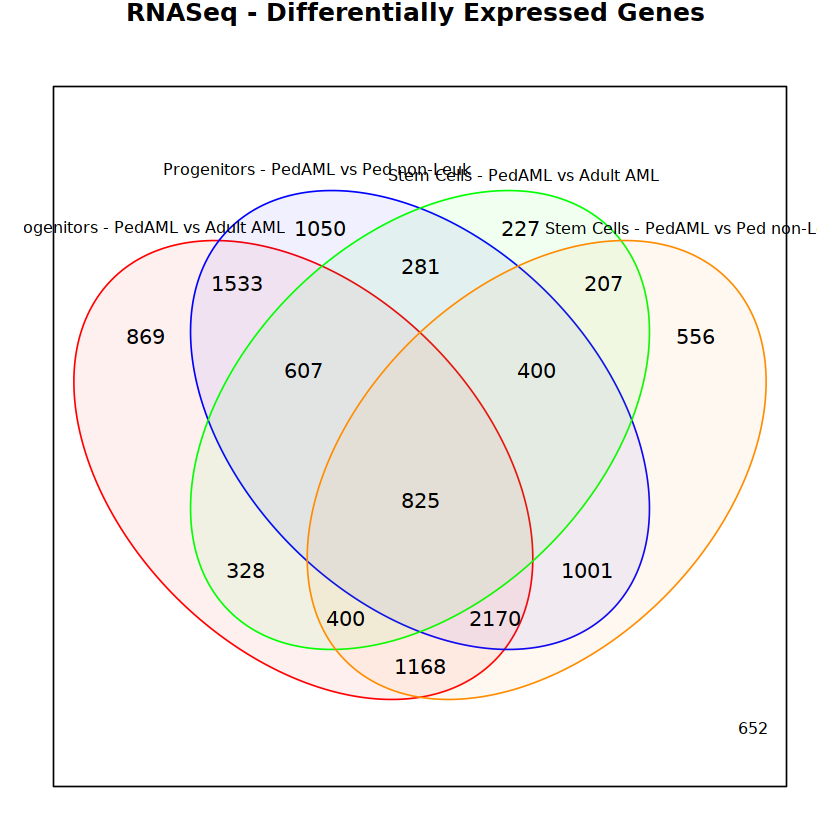

In [40]:
## Use this one
gene.uni <- unique(c(rownames(gLogThresholdedTestResults.prog@.Data), 
                                           rownames(gLogThresholdedTestResults.stem@.Data)))
vennInput <- matrix(nrow = length(gene.uni), ncol=4, data = 0)
dim(vennInput)
rownames(vennInput) <- gene.uni

vennInput[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.prog)),1] <- gLogThresholdedTestResults.prog[match(
                                            rownames(vennInput)[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.prog))], 
                                            rownames(gLogThresholdedTestResults.prog)),1]
vennInput[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.prog)),2] <- gLogThresholdedTestResults.prog[match(
                                            rownames(vennInput)[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.prog))],
                                            rownames(gLogThresholdedTestResults.prog)),2]
vennInput[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.stem)),3] <- gLogThresholdedTestResults.stem[match(
                                            rownames(vennInput)[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.stem))], 
                                            rownames(gLogThresholdedTestResults.stem)),1]
vennInput[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.stem)),4] <- gLogThresholdedTestResults.stem[match(
                                            rownames(vennInput)[which(rownames(vennInput) %in% rownames(gLogThresholdedTestResults.stem))], 
                                            rownames(gLogThresholdedTestResults.stem)),2]

colnames(vennInput) <- c("Progenitors - PedAML vs Adult AML",
                         "Progenitors - PedAML vs Ped non-Leuk",
                         "Stem Cells - PedAML vs Adult AML", 
                         "Stem Cells - PedAML vs Ped non-Leuk")

#pdf("vennDiagram_PedAML_NL_AdultAML_TCW_03102020.pdf", width=7, height=7)
vennDiagram(vennInput,circle.col=c('red','blue','green', 'dark orange'), cex=0.75, 
            show.include = FALSE, main="RNASeq - Differentially Expressed Genes ")
#dev.off()

[Table of Contents](#Table-of-Contents)

### Examination of Individual Comparisons



In [64]:
gNumTopHitsShown = 20
gNumHeatmapGenes = 100

In [65]:
colnames(gOrigNormedFilteredDgeList$samples)

[1] "group"            "lib.size"         "norm.factors"     "SequenceRun"     
 [5] "SequenceDate"     "Sample"           "SampleName"       "Patient.ID"      
 [9] "RIN"              "X"                "Adult.Pediatric"  "Disease"         
[13] "Cell.type"        "Sorted.Cell.Type" "Tissue.Source"    "RNA.seq.status"  
[17] "Reads"            "Phenotype"

In [66]:
gGroupMetadataColName1 = "Phenotype"
gGroupMetadataColName2 = "group"


In [67]:
gGroupMetadataVector = as.character(gNormedFilteredDgeList$samples[[gGroupMetadataColName1]])
gGroupMetadataVector.paired = as.character(gNormedFilteredDgeList.paired$samples[[gGroupMetadataColName1]])
gGroupMetadataVector.prog = as.character(gNormedFilteredDgeList.prog$samples[[gGroupMetadataColName2]])
gGroupMetadataVector.stem = as.character(gNormedFilteredDgeList.stem$samples[[gGroupMetadataColName2]])
#gOrigGroupMetadataVector.paired = as.character(gOrigNormedFilteredDgeList.paired$samples[[gGroupMetadataColName1]])
#gOrigGroupMetadataVector.prog = as.character(gOrigNormedFilteredDgeList.prog$samples[[gGroupMetadataColName2]])
#gOrigGroupMetadataVector.stem = as.character(gOrigNormedFilteredDgeList.stem$samples[[gGroupMetadataColName2]])

Perform each of the requested comparisons individually and produce output gene lists and visualizations.  Each comparison produces the following information:

* A power analysis showing the power to detect various fold-changes given the size of the first and second groups in the comparison.
* A summary of the number of up- and down-regulated genes meeting the adjusted p-value threshold as described above.  Up-regulated genes are those that are more highly expressed in the first group listed in the comparison name than in the second--genes up-regulated in a comparison named, say, Day15vsDay0 are those that are more highly expressed in Day 15 than in Day 0.  The analogous description applies to down-regulated genes.
* A table of the top 20 most differentially expressed genes in the comparison, as determined by adjusted p-value, without regard to the direction of their fold change.  They are sorted by increasing adjusted p-value. Note that this list always shows the top 20 most differentially expressed genes, even if those genes are not statistically significant according to the threshold listed above.   
* A comma-separated-value (csv) file containing the differential expression results (log fold change, adjusted p-value, etc) for **EVERY** gene, regardless of whether it is found to be significantly differentially expressed.  Like the table, it is sorted by increasing adjusted p-value, but is suitable for import into a spreadsheet program for re-sorting or filtering (for example, by log fold-change).  Having a list of all genes enables checking the results for genes that are of interest but were NOT found to be significant. 
* A mean-difference plot (also known as an MA plot) showing the log fold change of each gene in the comparison as a function of its average log expression.  Genes that are up-regulated in the comparison are shown in yellow, those that are down-regulated are shown in blue, and those that are not statistically significantly regulated at the threshold listed above are shown in black.
* A heat map of the expression, across all samples, of the top 100 significantly differentially expressed genes (those meeting the adjusted p-value threshold as described above) in this particular comparison.  
* An interactive mean-difference plot produced by the Glimma package ([16](#Citations)). Glimma plots can be found in the glimma-plots directory. Genes can be filtered by various statistics (i.e. adjusted P value, average expression, log-fold change, etc) and logCPM levels of individual samples can be examined for each gene.

In [48]:
library(RNASeqPower)

getNumSamplesInGroup = function(coefficientNumber, contrastMatrix, designMatrix, 
                                contrastValue=1){
    contrastDf = as.data.frame(contrastMatrix)
    coefficientName = colnames(contrastDf)[coefficientNumber]
    groupName = row.names(contrastDf[which(contrastDf[[coefficientName]] == contrastValue),])
    designModelDf = as.data.frame(designMatrix)
    groupSize = lapply(designModelDf[groupName], sum)
    return(as.vector(unlist(groupSize)))
}

doPowerCalculation = function(coefficientNumber, contrastMatrix, designMatrix, 
                              coverage, bcv, effect, targetAlpha){
    numSamplesGroup1 = getNumSamplesInGroup(coefficientNumber, contrastMatrix, 
                                            designMatrix, 1)
    numSamplesGroup2 = getNumSamplesInGroup(coefficientNumber, contrastMatrix, 
                                            designMatrix, -1)
    sizePerGroup = c(numSamplesGroup1, numSamplesGroup2)        

    # Find the power for a study with sizePerGroup (can be a vector) per group, 
    # to detect an (effect) change, given coverage?
    rnapower(coverage, cv=bcv, effect=c(1.25, 1.5, 1.75, 2), n=sizePerGroup, 
             alpha=targetAlpha)    
}

<div class="alert alert-warning">
    <strong>Analyst Note: Placeholder</strong><br />
    
`TODO: Where does the coverage number in the below code come from?`

</div>

In [49]:
globalDoPowerCalculation = function(coefficientNumber, gBcv, coverage=10,
                                    effect=c(1.25, 1.5, 1.75, 2), 
                                    targetAlpha=0.05){
    display('Power calculation: x is fold-change, y is group size')
    doPowerCalculation(coefficientNumber, gContrastMatrix, gDesignModel, 
                              coverage, gBcv, effect, targetAlpha)
}

In [68]:
library(gplots)

composeFileNameForCoefficient = function(aFit, outputDir, extension, runName, description, coeffNumber){
    coeffName = colnames(aFit)[coeffNumber]
    fileName = paste(runName, coeffName, description, sep = "_")
    fileName = paste0(fileName, extension)
    return(fileName)
}

composeFileNameForHeatmap = function(aFit, outputDir, extension, runName, description, coeffNumber, expGroups){
    coeffName = colnames(aFit)[coeffNumber]
    groupsName = paste(expGroups, sep = "_", collapse = "_")
    fileName = paste(runName, coeffName, description, groupsName, sep = "_")
    fileName = paste0(fileName, extension)
    return(fileName)
}

outputTopHitsForCoefficient = function(aFit, outputDir, runName, description, coeffNumber){
    topHits = topTreat(aFit, n=Inf, coef=coeffNumber)
    fileName = composeFileNameForCoefficient(aFit, outputDir, ".csv", runName, description, coeffNumber)
    write.csv(topHits, file.path(outputDir, fileName), row.names=FALSE)
    print(paste0("Output file: ", fileName))
    return(topHits)
}

plotMdForCoefficient = function(aFit, aTestResults, outputDir, runName, description, coeffNumber) {
    makeCustomMdPlot = function(){
        plotMD(aFit, column=coeffNumber, 
           status=aTestResults[,coeffNumber], 
           values=c(1, -1),
           main=colnames(aFit)[coeffNumber],
           hl.col=c("yellow","blue"), legend=FALSE)        
    }
    
    makeCustomMdPlot()
    
    fileName = composeFileNameForCoefficient(aFit, outputDir, ".png", 
                                             runName, description, coeffNumber)
    png(filename = file.path(outputDir, fileName), height = 7, width = 7, 
      units = "in", res = 300)
    
    makeCustomMdPlot()           
           
    dev.off()  
}

plotTopHeatmapForCoefficient = function(aFit, aVoomResults, numTopGenes, 
                                        outputDir, runName, metadataVector, description, 
                                        coeffNumber, geneNaId, expGroups){
    
    topHits = topTreat(aFit, coef=coeffNumber, n=numTopGenes)
    i = which(aVoomResults$genes[[geneNaId]] %in% topHits[[geneNaId]])
    mycol = colorpanel(1000, "blue", "black", "yellow")
    if (tolower(expGroups) == "all") {
        subGroups <- which(metadataVector %in% metadataVector) #Take all samples
    } else {
        subGroups <- which(metadataVector %in% expGroups)
    }
    group_col = brewer.pal(12, "Set3")[as.factor(metadataVector[subGroups])]
    geneNames <- aVoomResults$genes$SYMBOL[i]
    symbolNaIdx <- which(is.na(aVoomResults$genes$SYMBOL[i]))
    geneNames[symbolNaIdx] <- aVoomResults$genes[[geneNaId]][symbolNaIdx]
    makeCustomHeatmap = function(){
        heatmap.2(aVoomResults$E[i,subGroups], scale="row", labRow=geneNames, 
                 labCol=aVoomResults$targets$Sample_ID, # May need to change to represent variable containing sample name
                 ColSideColors=group_col,
                 col=mycol, trace="none", density.info="none", dendrogram="column",
                 margin=c(8,8), lhei=c(2,10))  
        legend("topleft", fill=unique(group_col), legend=unique(metadataVector[subGroups]), 
               inset=c(0,0.1), cex=0.5)
    }
    makeCustomHeatmap()
    fileName = composeFileNameForHeatmap(aFit, outputDir, ".png", runName, description, coeffNumber, expGroups)
    png(filename = file.path(outputDir, fileName), height = 12, width = 7, 
      units = "in", res = 300)   
    makeCustomHeatmap()
    dev.off()      
}

In [69]:
gAllGenesDesc = "AllGenes"
gMaDesc = paste("MaPlot", gThresholdDescription, sep="_")
gHeatmapDesc = paste(paste0("Heatmap","Top",gNumHeatmapGenes), gThresholdDescription, sep="_")

globalSummarizeTestsAndPlotMdForCoefficient = function(coefficientNumber, method=NULL, gModeratedVoomedFitForContrastsWithLogFcThreshold,
                                                       gLogThresholdelTestResults, gContrastMatrix, gVoomResult,
                                                      gGroupMetadataVector, gModeratedVoomedFitForContrasts, gBcv=gBcv, 
                                                      gSaveOutputDir=gOutputDir){
    display(globalDoPowerCalculation(coefficientNumber, gBcv))
    coefficientName = colnames(gModeratedVoomedFitForContrastsWithLogFcThreshold)[coefficientNumber]
    display(paste("Summary of", coefficientName, "Differential Expression"))
    if(is.null(method)) {
        display(summary(decideTests(gModeratedVoomedFitForContrastsWithLogFcThreshold))[,coefficientNumber])
    } else {
        display(summary(decideTests(gModeratedVoomedFitForContrastsWithLogFcThreshold, method=gMultipleTestingStrategy))[,coefficientNumber])    
    }
    display(paste("Top", gNumTopHitsShown, "Most Significantly Differentially Expressed Genes for", coefficientName))
    display(head(n=gNumTopHitsShown,
        outputTopHitsForCoefficient(gModeratedVoomedFitForContrastsWithLogFcThreshold,
                                    gOutputDir, gRunName, gAllGenesDesc, coefficientNumber)))    

    options(repr.plot.width=7, repr.plot.height=7)
    
    plotMdForCoefficient(gModeratedVoomedFitForContrastsWithLogFcThreshold, 
                         gLogThresholdedTestResults, gOutputDir, 
                         gRunName, gMaDesc, coefficientNumber) 
    
    aGlimmaPlotName = composeFileNameForCoefficient(
        gModeratedVoomedFitForContrastsWithLogFcThreshold, 
        gOutputDir, "_interactive", gRunName, gMaDesc, coefficientNumber)
    
    print(gSaveOutputDir)
    glMDPlot(gModeratedVoomedFitForContrasts, 
         coef = coefficientNumber, 
         status = decideTests(gModeratedVoomedFitForContrasts), 
         main = colnames(gContrastMatrix)[coefficientNumber], 
         side.main = "ENSEMBLID",
         counts = gVoomResult$E, 
         groups = as.factor(gGroupMetadataVector), 
         side.ylab = "logCPM", 
         path = gSaveOutputDir,
         html = aGlimmaPlotName, launch = F)
    
    
    print(paste0("Output file: ", paste0("glimma-plots/", aGlimmaPlotName, ".html")))    
}

globalPlotTopHeatmapForCoefficient = function(coefficientNumber, expGroups, 
                                              gModeratedVoomedFitForContrastsWithLogFcThreshold, gVoomResult,
                                             gGroupMetadataVector){
    options(repr.plot.width=7, repr.plot.height=12)  
    
    coefficientName = colnames(gModeratedVoomedFitForContrastsWithLogFcThreshold)[coefficientNumber]
    display(paste("Heatmap of Top", gNumHeatmapGenes, "Most Significantly Differentially Expressed Genes for", coefficientName))
    plotTopHeatmapForCoefficient(gModeratedVoomedFitForContrastsWithLogFcThreshold, 
                             gVoomResult, gNumHeatmapGenes, gOutputDir, 
                             gRunName, gGroupMetadataVector, gHeatmapDesc, 
                             coefficientNumber, gGeneIdCol, expGroups)  
}

gLimmaOnly <- function(coefficientNumber, method=NULL, gModeratedVoomedFitForContrastsWithLogFcThreshold,
                       gLogThresholdelTestResults, gContrastMatrix, gVoomResult, gGroupMetadataVector, 
                       gModeratedVoomedFitForContrasts) {
    
    aGlimmaPlotName = composeFileNameForCoefficient(
        gModeratedVoomedFitForContrastsWithLogFcThreshold, 
        gOutputDir, "_interactive", gRunName, gMaDesc, coefficientNumber)
    
    
    glMDPlot(gModeratedVoomedFitForContrasts, 
         coef = coefficientNumber, 
         status = decideTests(gModeratedVoomedFitForContrasts), 
         main = colnames(gContrastMatrix)[coefficientNumber], 
         side.main = "ENSEMBLID",
         counts = gVoomResult$E, 
         groups = as.factor(gGroupMetadataVector), 
         side.ylab = "logCPM", 
         path = gOutputDir,
         html = aGlimmaPlotName, launch = F)
    
    
    print(paste0("Output file: ", paste0("glimma-plots/", aGlimmaPlotName, ".html")))    
}

<div class="alert alert-warning">
    <strong>Analyst Note: Info</strong><br />

In the next cell, note that the contrast number is intentionally NOT set as a global variable; **please don't change this**.  Setting the contrast number explicitly in each call prevents misleading records due to inconsistent state (e.g, you set `gCurrentContrast = 1`, run `globalSummarizeTestsAndPlotMdForCoefficient(gCurrentContrast)`, run `gCurrentContrast = 2`, but DON'T rerun `globalSummarizeTestsAndPlotMdForCoefficient` ... now it looks like the results you have are for `globalSummarizeTestsAndPlotMdForCoefficient(2)`, but in fact they are for `globalSummarizeTestsAndPlotMdForCoefficient(1)`).

<br />

Also, you'd think that the two code cells could be combined, but in fact they can't because they need different plot sizes, and it doesn't work to change the plot size, plot, change it again, and plot in a single Jupyter cell :( (see https://gallery.azure.ai/Notebook/Changing-R-plot-options-in-Jupyter-6#Jupyter-only-respects-the-last-value-of-repr-options-in-each-cell ).
   
</div>

<div class="alert alert-warning">
    <strong>Analyst Note: Modify Code</strong><br />
    
**For each contrast** (even those that generated zero significantly differentially expressed genes):

* Add a markdown cell containing a link back to the table of contents and the name of the contrast as a 4th-level header (e.g:

        [Table of Contents](#Table-of-Contents)
        
        #### SevereD1vsMildD1
        
* Add a link to this cell in the Table of Contents markdown (e.g., `* [SevereD1vsMildD1](#SevereD1vsMildD1)`)
* Determine the contrast number (e.g., SevereD1vsMildD1 is the 1st contrast), referred to as `x` below
* Add a code cell running `globalSummarizeTestsAndPlotMdForCoefficient(x)` where `x` is the contrast number
* Add a code cell running `globalPlotTopHeatmapForCoefficient(x, groups_to_display)` where `x` is the contrast number and `groups_to_display` contain the experimental groups that you want to display on the heatmap. `groups_to_display` can be set to `"all"` to display the standard heatmap or `c("SevereD1", "MildD1")` to only display samples from the groups listed.

</div>

[1] "Power calculation: x is fold-change, y is group size"

,1.25,1.5,1.75,2
9,0.07965542,0.1695589,0.2829209,0.4038004
8,0.07507594,0.1554506,0.2567362,0.3662931


[1] "Summary of PedAML.ProgvsPedAML.Stem Differential Expression"

Down NotSig     Up 
     0  12685      0

[1] "Top 20 Most Significantly Differentially Expressed Genes for PedAML.ProgvsPedAML.Stem"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000141576,ENSG00000141576,114804,RNF157,protein_coding,5.3201532,-2.8739218,5.189483,0.0003777311,0.9958039,-4.557668
ENSG00000163736,ENSG00000163736,5473,PPBP,protein_coding,-4.9003533,-1.0743803,-4.467117,0.0011352402,0.9958039,-4.573381
ENSG00000114654,ENSG00000114654,79825,EFCC1,protein_coding,-3.1150915,0.6731004,-4.121964,0.0019707051,0.9958039,-4.469798
ENSG00000142102,ENSG00000142102,80162,PGGHG,protein_coding,-1.2441941,4.8331944,-4.038938,0.0022556080,0.9958039,-4.291067
ENSG00000198804,ENSG00000198804,4512,COX1,protein_coding,-1.1498419,11.5195530,-3.990204,0.0024426601,0.9958039,-3.774036
ENSG00000090382,ENSG00000090382,4069,LYZ,protein_coding,1.7836146,7.5497453,3.897188,0.0028461404,0.9958039,-3.869904
ENSG00000101200,ENSG00000101200,551,AVP,protein_coding,-5.3824091,0.6345702,-3.888955,0.0028850610,0.9958039,-4.529861
ENSG00000068885,ENSG00000068885,57560,IFT80,protein_coding,0.6199583,4.4739353,3.844373,0.0031056843,0.9958039,-4.115367
ENSG00000146411,ENSG00000146411,154091,SLC2A12,protein_coding,1.8174487,-3.3884015,3.779900,0.0034563568,0.9958039,-4.529411


[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200327163122_PedAML.ProgvsPedAML.Stem_AllGenes.csv"
[1] "Output file: glimma-plots/20200228_DeWerf_Human_PediatricAML_differential_expression_20200327163122_PedAML.ProgvsPedAML.Stem_MaPlot__interactive.html"


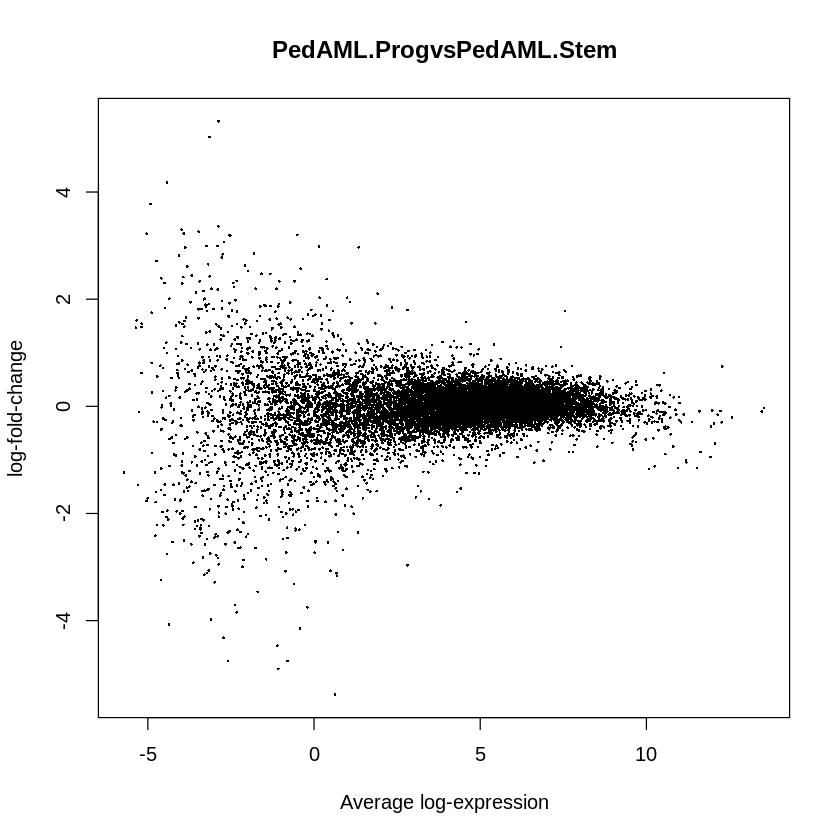

In [88]:
globalSummarizeTestsAndPlotMdForCoefficient(1, method=NULL, gModeratedVoomedFitForContrasts.paired.nocor,
                                            gLogThresholdedTestResults.paired.nocor, gContrastMatrix.paired.nocor,
                                            gVoomResult.paired.nocor, gGroupMetadataVector.paired)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAML.ProgvsPedAML.Stem"

png 
  2

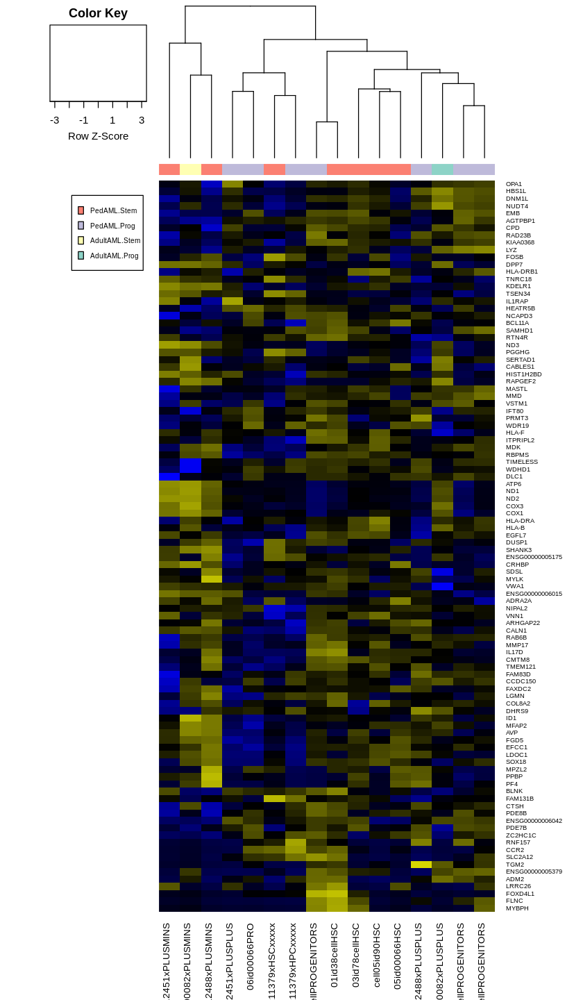

In [89]:
globalPlotTopHeatmapForCoefficient(1, c("all"), gModeratedVoomedFitForContrasts.paired.nocor,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.paired.nocor, gGroupMetadataVector.paired)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAML.ProgvsPedAML.Stem"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

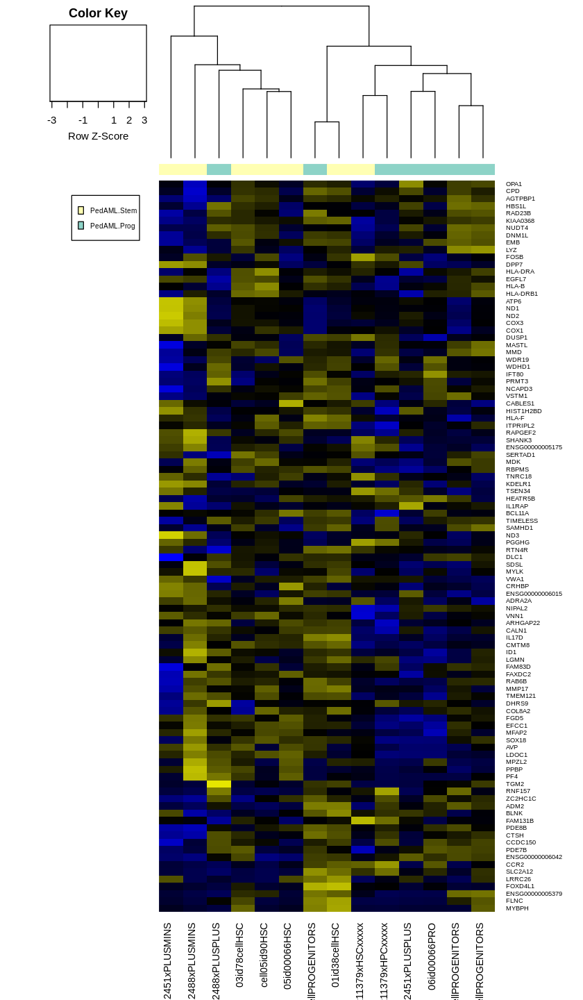

In [184]:
globalPlotTopHeatmapForCoefficient(1, c("PedAML.Prog", "PedAML.Stem"), gModeratedVoomedFitForContrasts.paired.nocor,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.paired.nocor, gGroupMetadataVector.paired)

[1] "Power calculation: x is fold-change, y is group size"

,1.25,1.5,1.75,2
3,0.0391051,0.05493949,0.07195212,0.0897262
3,0.0391051,0.05493949,0.07195212,0.0897262


[1] "Summary of AdultAML.ProgvsAdultAML.Stem Differential Expression"

Down NotSig     Up 
     0  12685      0

[1] "Top 20 Most Significantly Differentially Expressed Genes for AdultAML.ProgvsAdultAML.Stem"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000119922,ENSG00000119922,3433,IFIT2,protein_coding,-6.372737,4.1110752,-8.251570,7.728273e-06,0.05319635,-3.147156
ENSG00000119917,ENSG00000119917,3437,IFIT3,protein_coding,-6.463410,3.8056581,-8.176856,8.387284e-06,0.05319635,-3.760167
ENSG00000188313,ENSG00000188313,5359,PLSCR1,protein_coding,-3.086875,5.6308418,-5.878531,1.416975e-04,0.59914425,-3.419799
ENSG00000179348,ENSG00000179348,2624,GATA2,protein_coding,3.061008,7.5318515,5.444771,2.606316e-04,0.70757268,-2.889292
ENSG00000113369,ENSG00000113369,57561,ARRDC3,protein_coding,2.027606,7.3774411,5.397681,2.789013e-04,0.70757268,-2.813271
ENSG00000145901,ENSG00000145901,10318,TNIP1,protein_coding,-2.638760,7.0410691,-5.185680,3.798514e-04,0.79730654,-3.124701
ENSG00000125968,ENSG00000125968,3397,ID1,protein_coding,-4.725693,1.5185363,-5.078989,4.448235e-04,0.79730654,-4.093700
ENSG00000117289,ENSG00000117289,NA,NA,NA,1.978544,10.1369561,4.996909,5.028342e-04,0.79730654,-2.766187
ENSG00000186480,ENSG00000186480,3638,INSIG1,protein_coding,-2.023192,6.2037881,-4.906493,5.761743e-04,0.81208566,-3.315075


[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_AdultAML.ProgvsAdultAML.Stem_AllGenes.csv"
[1] "../outputs/paired.nocor"
[1] "Output file: glimma-plots/20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_AdultAML.ProgvsAdultAML.Stem_MaPlot__interactive.html"


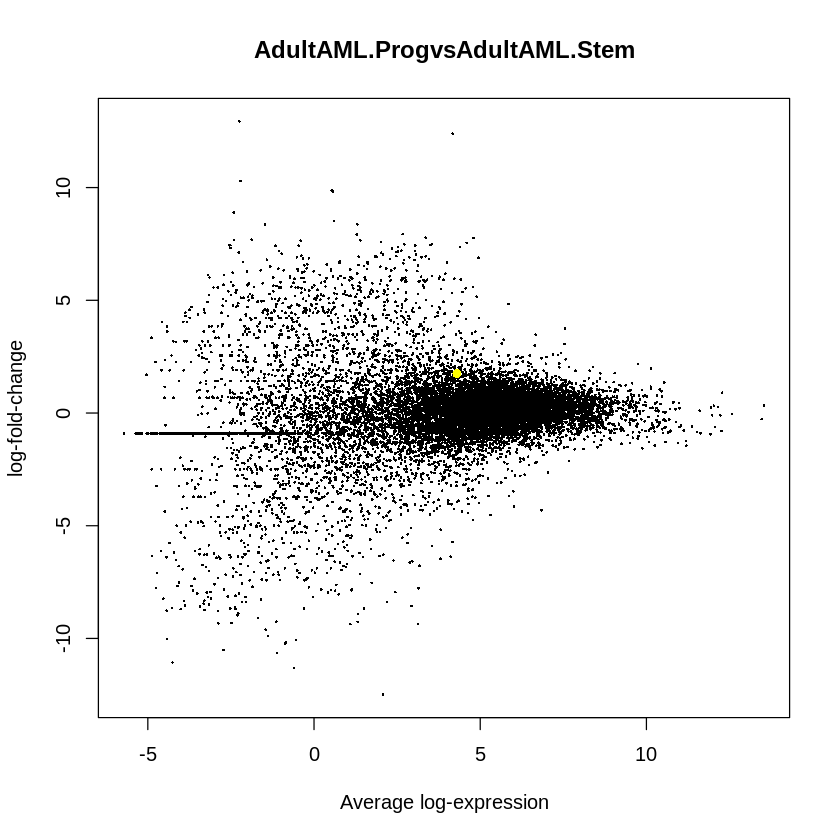

In [163]:
globalSummarizeTestsAndPlotMdForCoefficient(2, method=NULL, gModeratedVoomedFitForContrasts.paired.nocor,
                                            gLogThresholdedTestResults.paired.nocor, gContrastMatrix.paired.nocor,
                                            gVoomResult.paired.nocor, gGroupMetadataVector.paired, 
                                            gModeratedVoomedFitForContrasts.paired, gBcv, paste0(gOutputDir, "/paired.nocor"))

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for AdultAML.ProgvsAdultAML.Stem"

png 
  2

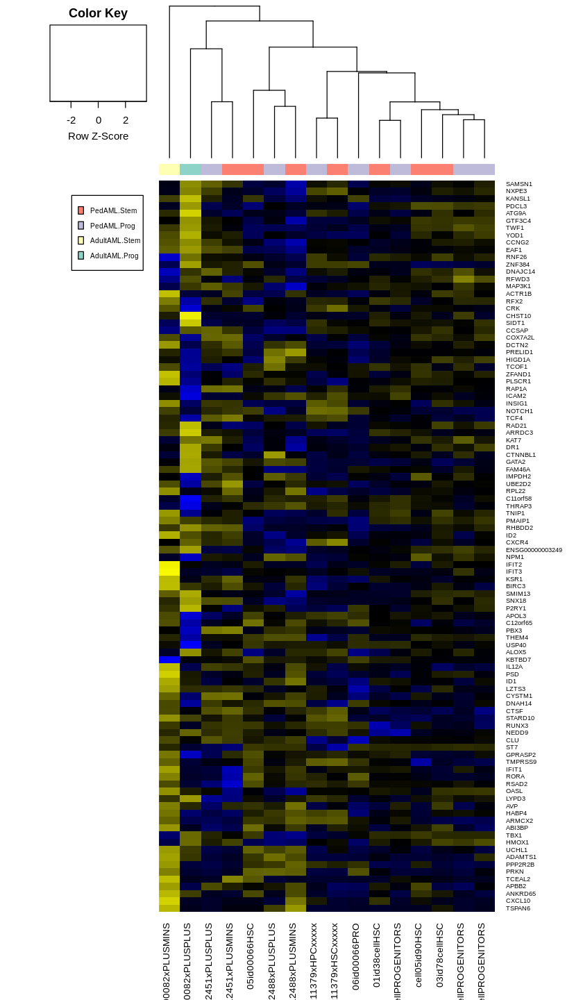

In [92]:
globalPlotTopHeatmapForCoefficient(2, c("all"), gModeratedVoomedFitForContrasts.paired.nocor,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.paired.nocor, gGroupMetadataVector.paired)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for AdultAML.ProgvsAdultAML.Stem"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

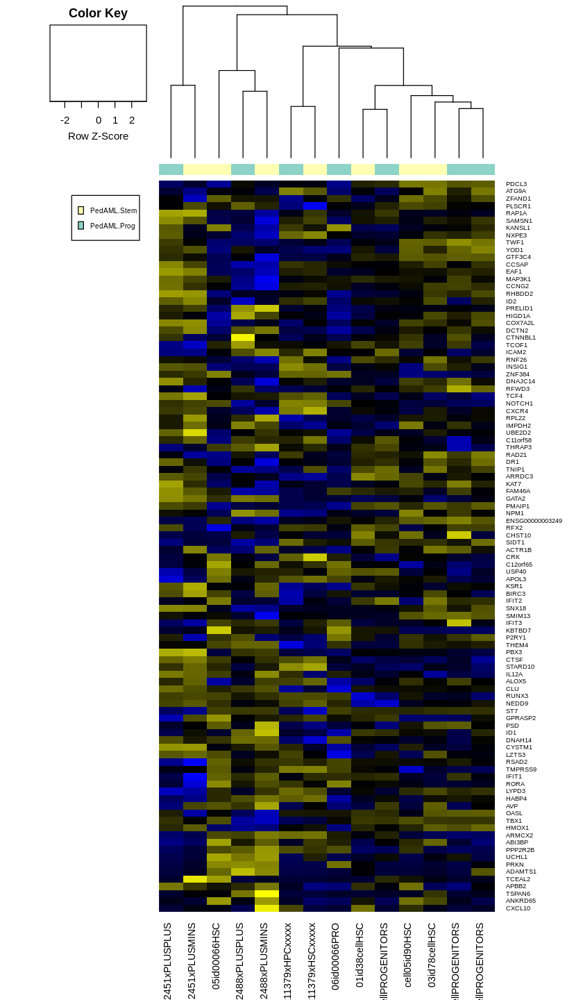

In [93]:
globalPlotTopHeatmapForCoefficient(2, c("PedAML.Prog", "PedAML.Stem"), gModeratedVoomedFitForContrasts.paired.nocor,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.paired.nocor, gGroupMetadataVector.paired)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for AdultAML.ProgvsAdultAML.Stem"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

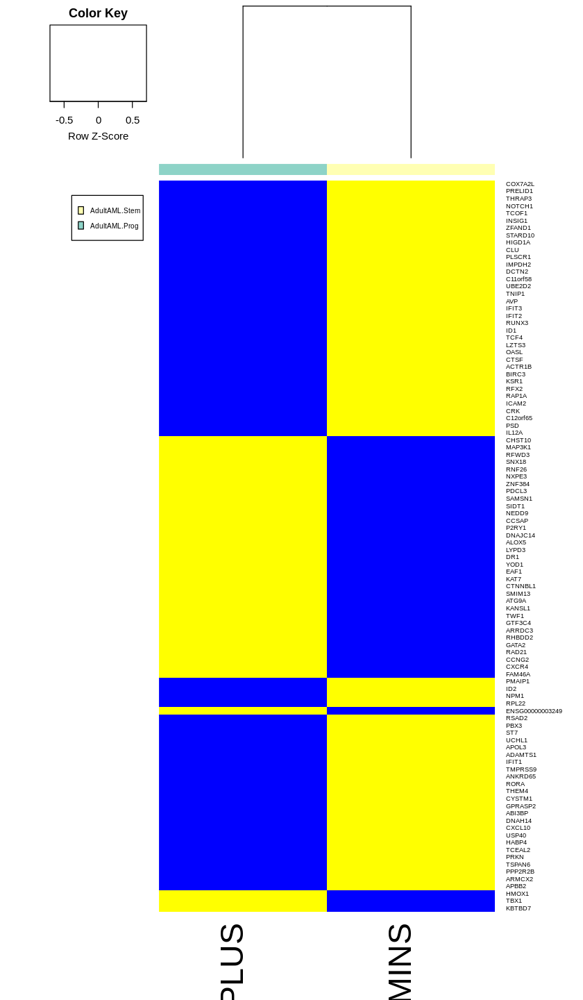

In [94]:
globalPlotTopHeatmapForCoefficient(2, c("AdultAML.Prog", "AdultAML.Stem"), gModeratedVoomedFitForContrasts.paired.nocor,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.paired.nocor, gGroupMetadataVector.paired)

[1] "Power calculation: x is fold-change, y is group size"

,1.25,1.5,1.75,2
9,0.05216655,0.08853026,0.1318025,0.1795749
8,0.05014981,0.08306392,0.1217933,0.1643749


[1] "Summary of PedAMLvsAdultAML Differential Expression"

Down NotSig     Up 
   122  11902     45

[1] "Top 20 Most Significantly Differentially Expressed Genes for PedAMLvsAdultAML"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000228253,ENSG00000228253,4509,ATP8,protein_coding,-2.563000,2.939427,-6.663799,2.336838e-06,0.009870516,4.595744
ENSG00000269028,ENSG00000269028,100462981,MTRNR2L2,protein_coding,-2.227289,3.341528,-6.597133,2.675673e-06,0.009870516,4.648341
ENSG00000127022,ENSG00000127022,821,CANX,protein_coding,1.487862,9.607598,6.545484,2.972819e-06,0.009870516,4.783663
ENSG00000198840,ENSG00000198840,4537,ND3,protein_coding,-2.519836,4.939021,-6.498701,3.271362e-06,0.009870516,4.671913
ENSG00000255073,ENSG00000255073,NA,NA,protein_coding,-6.740112,-1.517786,-5.987599,9.481731e-06,0.016264036,1.914336
ENSG00000212907,ENSG00000212907,4539,ND4L,protein_coding,-2.145202,5.958718,-5.965622,9.933144e-06,0.016264036,3.636084
ENSG00000213741,ENSG00000213741,6235,RPS29,protein_coding,-1.675567,5.747700,-5.946884,1.033546e-05,0.016264036,3.598358
ENSG00000198938,ENSG00000198938,4514,COX3,protein_coding,-2.532631,11.730926,-5.830051,1.325159e-05,0.016264036,3.362958
ENSG00000164163,ENSG00000164163,6059,ABCE1,protein_coding,1.703917,7.183826,5.812908,1.374570e-05,0.016264036,3.324749


[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsAdultAML_AllGenes.csv"
[1] "../outputs/prog"
[1] "Output file: glimma-plots/20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsAdultAML_MaPlot__interactive.html"


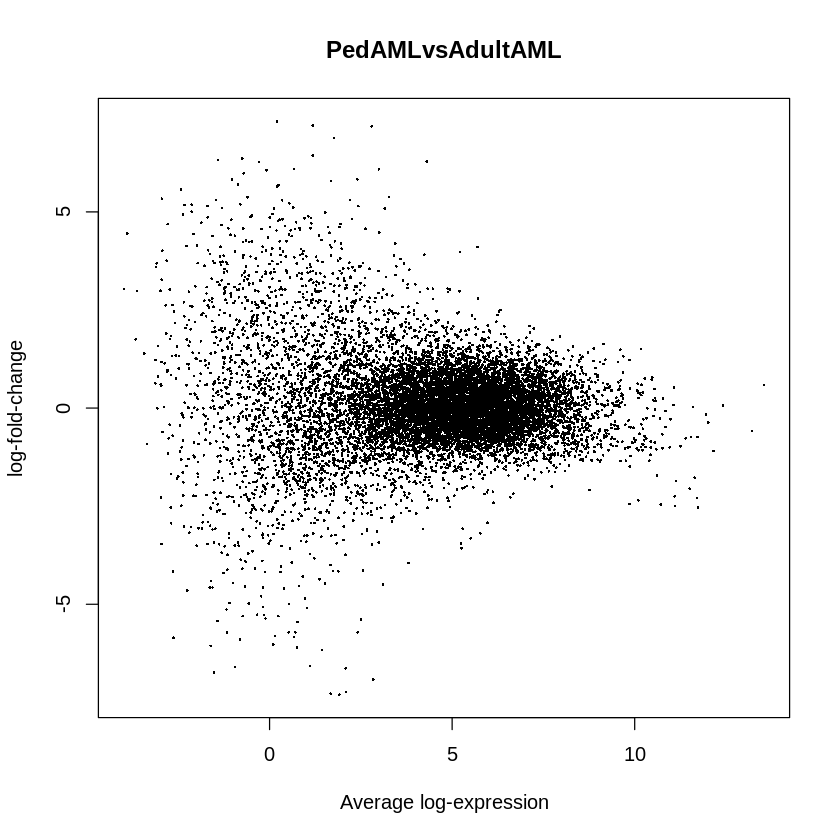

In [165]:
globalSummarizeTestsAndPlotMdForCoefficient(1, method=NULL, gModeratedVoomedFitForContrasts.prog,
                                            gLogThresholdedTestResults.prog, gContrastMatrix.prog,
                                            gVoomResult.prog, gGroupMetadataVector.prog,
                                            gModeratedVoomedFitForContrasts.prog, gBcv.prog, paste0(gOutputDir, "/prog"))

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsAdultAML"

png 
  2

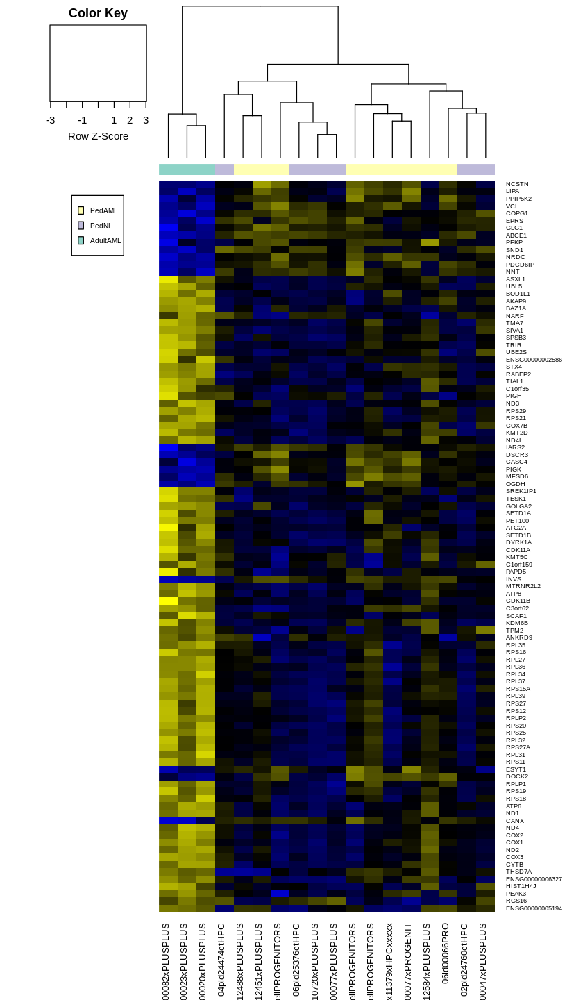

In [126]:
globalPlotTopHeatmapForCoefficient(1, c("all"), gModeratedVoomedFitForContrasts.prog,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.prog, gGroupMetadataVector.prog)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsAdultAML"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

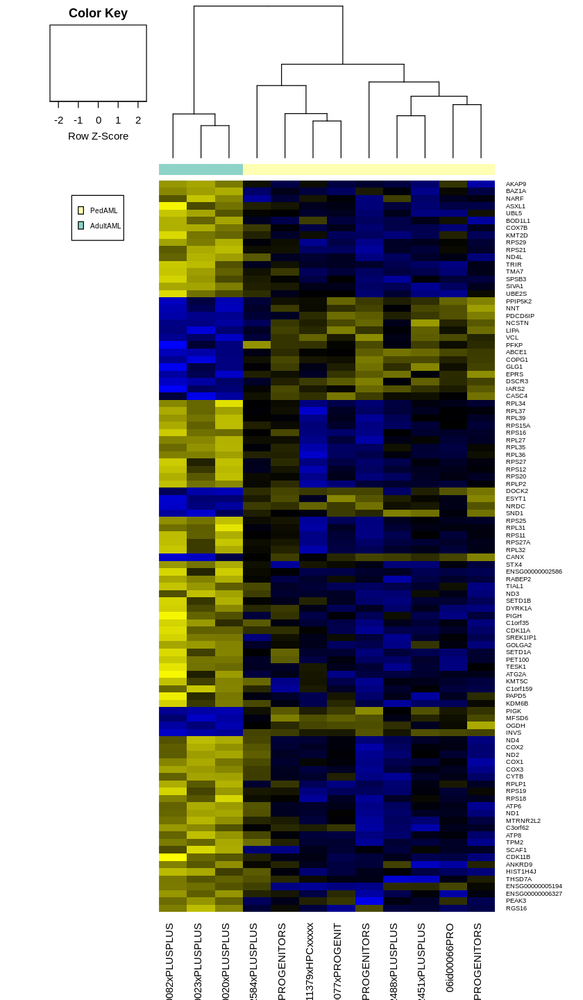

In [125]:
globalPlotTopHeatmapForCoefficient(1, c("PedAML", "AdultAML"), gModeratedVoomedFitForContrasts.prog,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.prog, gGroupMetadataVector.prog)

[1] "Power calculation: x is fold-change, y is group size"

,1.25,1.5,1.75,2
3,0.03868864,0.05394815,0.07026713,0.08726349
3,0.03868864,0.05394815,0.07026713,0.08726349


[1] "Summary of PedAMLvsPedNL Differential Expression"

Down NotSig     Up 
   525  11397    147

[1] "Top 20 Most Significantly Differentially Expressed Genes for PedAMLvsPedNL"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000081985,ENSG00000081985,3595,IL12RB2,protein_coding,-8.063473,-0.3512706,-8.214333,1.186463e-07,0.0008834744,6.600955
ENSG00000184860,ENSG00000184860,93517,SDR42E1,protein_coding,-7.117186,-2.9863669,-7.778346,2.655073e-07,0.0008834744,5.484254
ENSG00000196368,ENSG00000196368,55190,NUDT11,protein_coding,-8.273425,-1.9688847,-7.769619,2.698920e-07,0.0008834744,5.595205
ENSG00000114698,ENSG00000114698,57088,PLSCR4,protein_coding,-7.906101,-2.4558464,-7.726281,2.928078e-07,0.0008834744,5.504919
ENSG00000114405,ENSG00000114405,57415,C3orf14,protein_coding,-6.287141,-1.9950343,-7.541078,4.159683e-07,0.0010040644,5.148382
ENSG00000170627,ENSG00000170627,121355,GTSF1,protein_coding,2.627996,4.3052909,6.968224,1.268826e-06,0.0018484832,5.412543
ENSG00000145020,ENSG00000145020,275,AMT,protein_coding,-1.897904,4.4067128,-6.923648,1.386433e-06,0.0018484832,5.331167
ENSG00000101938,ENSG00000101938,91851,CHRDL1,protein_coding,-7.140848,-2.7331651,-6.915675,1.408630e-06,0.0018484832,4.349972
ENSG00000082397,ENSG00000082397,23136,EPB41L3,protein_coding,-7.294599,-1.9416863,-6.915212,1.409931e-06,0.0018484832,4.403881


[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsPedNL_AllGenes.csv"
[1] "../outputs/prog"
[1] "Output file: glimma-plots/20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsPedNL_MaPlot__interactive.html"


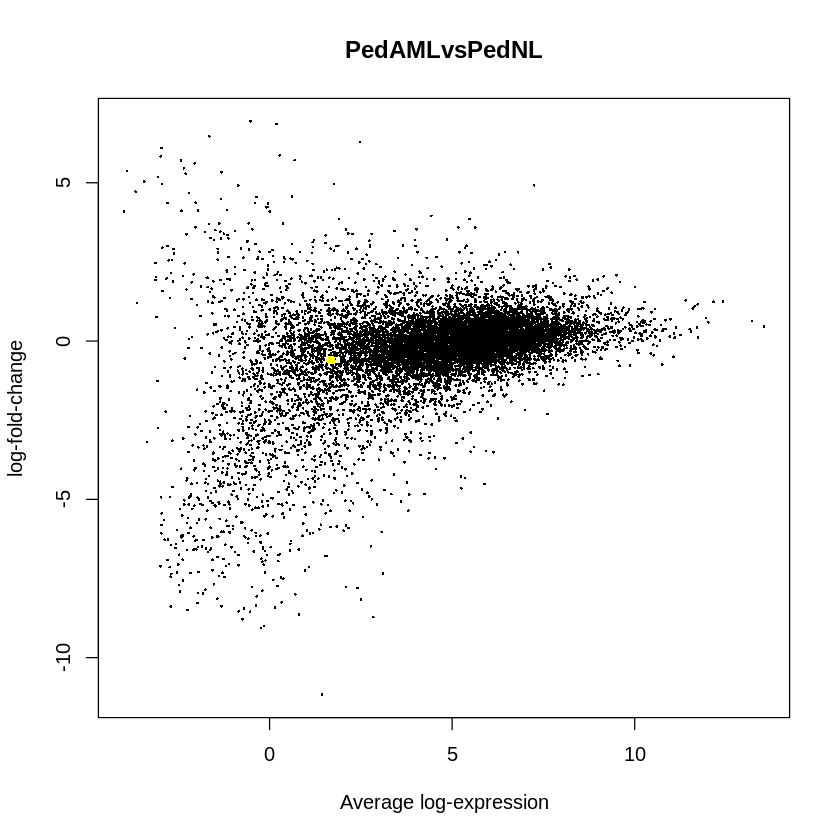

In [164]:
globalSummarizeTestsAndPlotMdForCoefficient(2, method=NULL, gModeratedVoomedFitForContrasts.prog,
                                            gLogThresholdedTestResults.prog, gContrastMatrix.prog,
                                            gVoomResult.prog, gGroupMetadataVector.prog,
                                            gModeratedVoomedFitForContrasts.prog, gBcv.prog, paste0(gOutputDir, "/prog"))

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsPedNL"

png 
  2

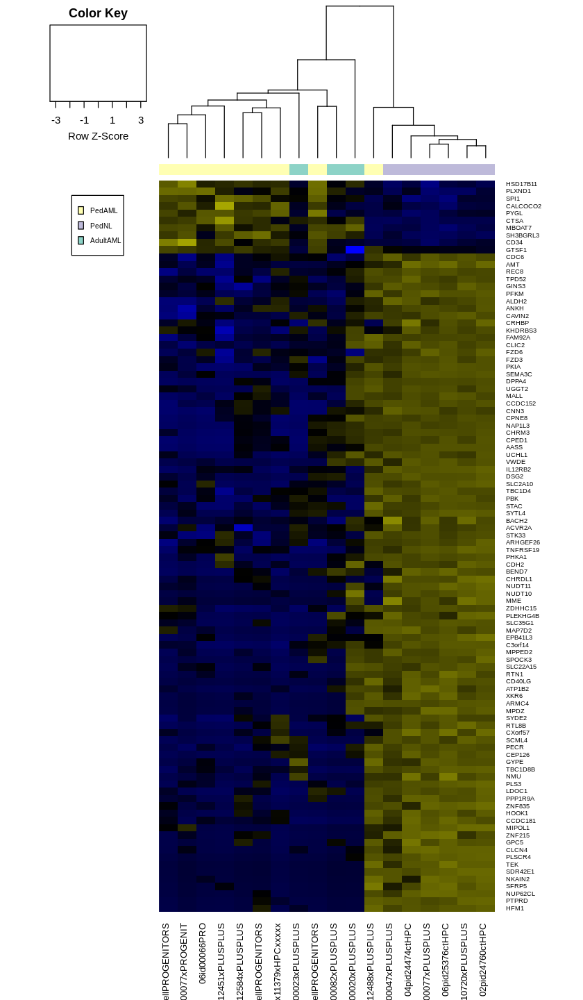

In [103]:
globalPlotTopHeatmapForCoefficient(2, c("all"), gModeratedVoomedFitForContrasts.prog,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.prog, gGroupMetadataVector.prog)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsPedNL"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

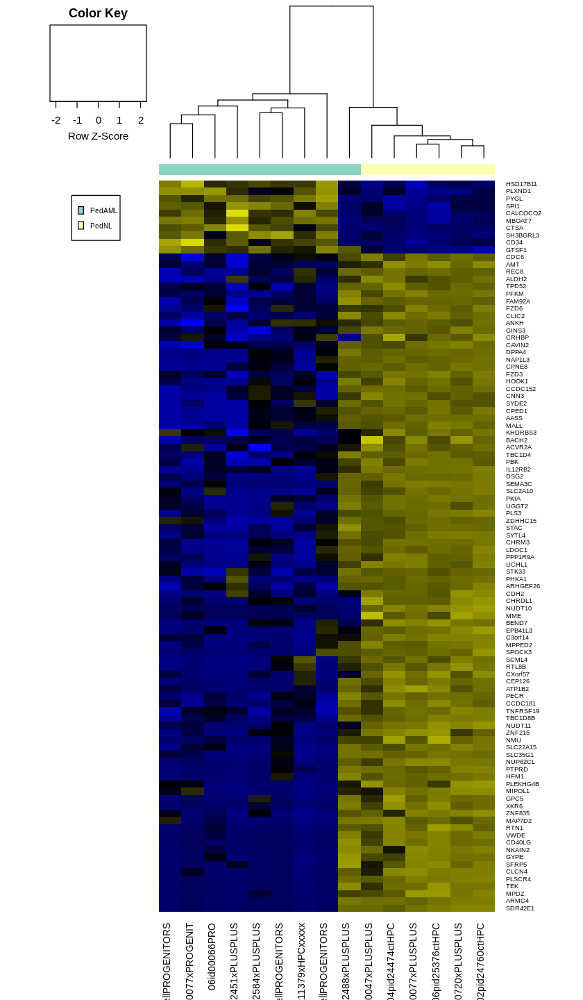

In [104]:
globalPlotTopHeatmapForCoefficient(2, c("PedAML", "PedNL"), gModeratedVoomedFitForContrasts.prog,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.prog, gGroupMetadataVector.prog)

[1] "Power calculation: x is fold-change, y is group size"

,1.25,1.5,1.75,2
9,0.05378376,0.09297636,0.1399930,0.1920235
8,0.05162662,0.08705808,0.1290998,0.1754685


[1] "Summary of PedAMLvsAdultAML Differential Expression"

Down NotSig     Up 
     0  11837      0

[1] "Top 20 Most Significantly Differentially Expressed Genes for PedAMLvsAdultAML"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000170873,ENSG00000170873,9788,MTSS1,protein_coding,-4.089051,4.6014587,-4.991973,0.0001395097,0.9981072,-4.396629
ENSG00000118898,ENSG00000118898,5493,PPL,protein_coding,-4.937549,1.0499946,-4.731242,0.0002357569,0.9981072,-4.552060
ENSG00000186642,ENSG00000186642,5138,PDE2A,protein_coding,-6.455210,0.2411802,-3.933673,0.0012202138,0.9981072,-4.573071
ENSG00000007516,ENSG00000007516,8938,BAIAP3,protein_coding,-3.590292,2.1292240,-3.873309,0.0013842572,0.9981072,-4.540342
ENSG00000182809,ENSG00000182809,1397,CRIP2,protein_coding,-5.052315,3.8789245,-3.708817,0.0019533147,0.9981072,-4.485264
ENSG00000169908,ENSG00000169908,4071,TM4SF1,protein_coding,-5.533241,3.3359993,-3.693336,0.0020177274,0.9981072,-4.524675
ENSG00000170142,ENSG00000170142,7324,UBE2E1,protein_coding,-1.062451,5.1321287,-3.626885,0.0023193406,0.9981072,-4.431860
ENSG00000173482,ENSG00000173482,5797,PTPRM,protein_coding,-5.685096,2.1332609,-3.549839,0.0027260509,0.9981072,-4.563120
ENSG00000163815,ENSG00000163815,7123,CLEC3B,protein_coding,-4.627428,1.6230716,-3.521944,0.0028902810,0.9981072,-4.566548


[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsAdultAML_AllGenes.csv"
[1] "../outputs/stem"
[1] "Output file: glimma-plots/20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsAdultAML_MaPlot__interactive.html"


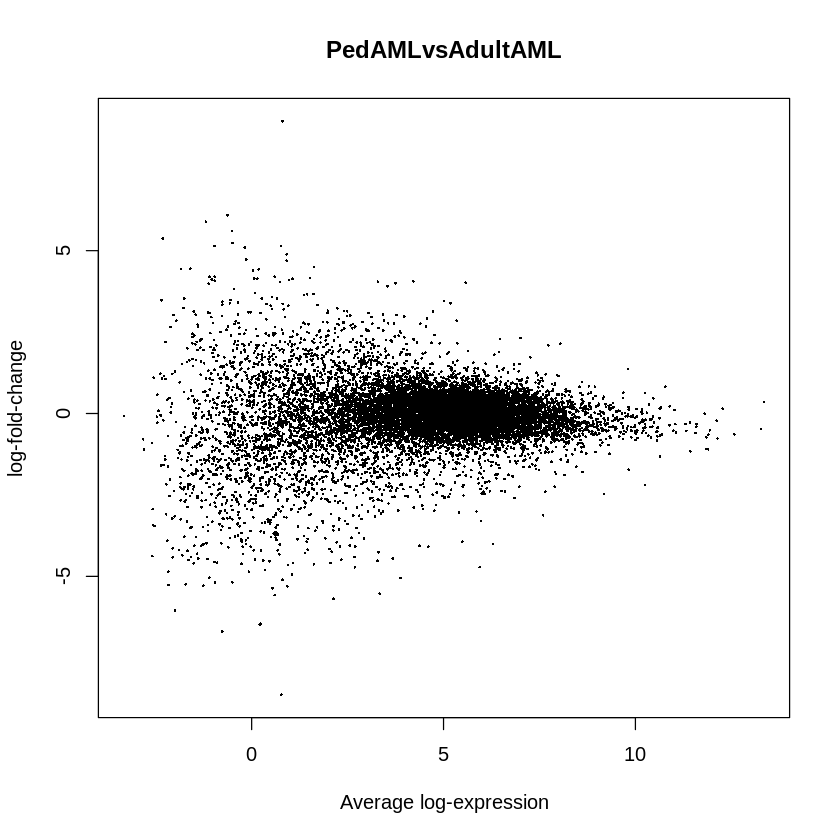

In [169]:
globalSummarizeTestsAndPlotMdForCoefficient(1, method=NULL, gModeratedVoomedFitForContrasts.stem,
                                            gLogThresholdedTestResults.stem, gContrastMatrix.stem,
                                            gVoomResult.stem, gGroupMetadataVector.stem,
                                            gModeratedVoomedFitForContrasts.stem, gBcv.stem, paste0(gOutputDir, "/stem"))

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsAdultAML"

png 
  2

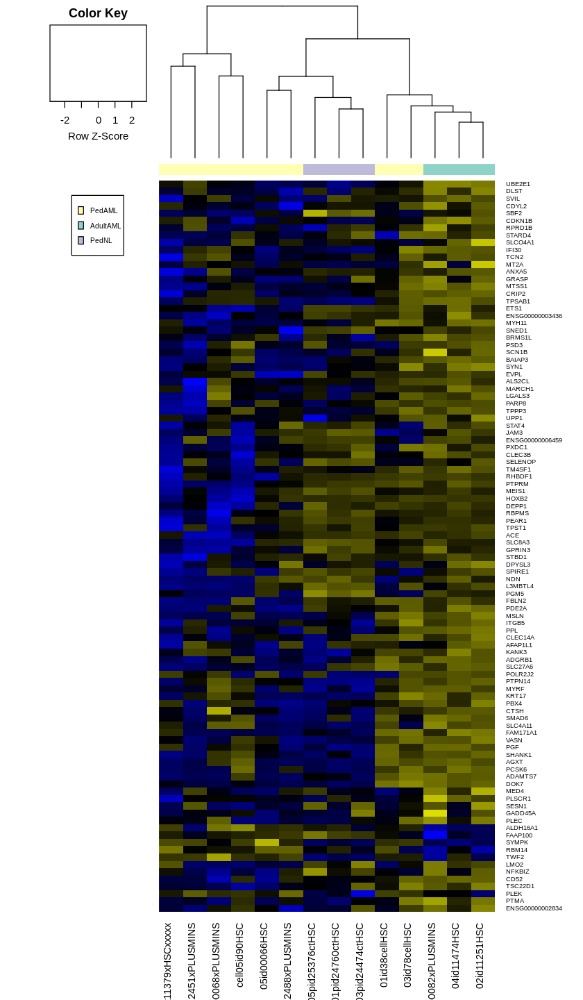

In [106]:
globalPlotTopHeatmapForCoefficient(1, c("all"), gModeratedVoomedFitForContrasts.stem,
                                  #gLogThresholdTestResults.stem, #gContrastMatrix.stem,
                                  gVoomResult.stem, gGroupMetadataVector.stem)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsAdultAML"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

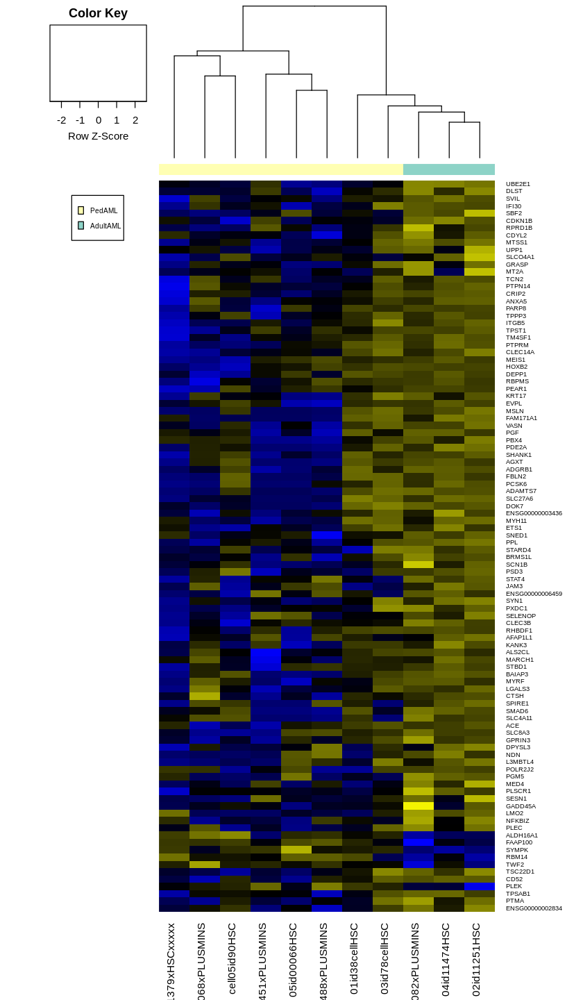

In [107]:
globalPlotTopHeatmapForCoefficient(1, c("PedAML", "AdultAML"), gModeratedVoomedFitForContrasts.stem,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.stem, gGroupMetadataVector.stem)

[1] "Power calculation: x is fold-change, y is group size"

,1.25,1.5,1.75,2
3,0.0394194,0.05569134,0.07323426,0.09160425
3,0.0394194,0.05569134,0.07323426,0.09160425


[1] "Summary of PedAMLvsPedNL Differential Expression"

Down NotSig     Up 
   198  11621     18

[1] "Top 20 Most Significantly Differentially Expressed Genes for PedAMLvsPedNL"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000104290,ENSG00000104290,7976,FZD3,protein_coding,-8.149390,-1.1393416,-6.882588,4.021581e-06,0.01191362,3.010283
ENSG00000057294,ENSG00000057294,5318,PKP2,protein_coding,-8.099668,-2.0688649,-6.878858,4.047892e-06,0.01191362,3.030751
ENSG00000081985,ENSG00000081985,3595,IL12RB2,protein_coding,-7.325668,1.8351652,-6.876633,4.063669e-06,0.01191362,4.136174
ENSG00000051523,ENSG00000051523,1535,CYBA,protein_coding,2.027551,8.6196088,6.807955,4.583703e-06,0.01191362,4.381317
ENSG00000168497,ENSG00000168497,8436,CAVIN2,protein_coding,-6.476944,3.7213227,-6.754948,5.032363e-06,0.01191362,4.315728
ENSG00000145708,ENSG00000145708,1393,CRHBP,protein_coding,-5.501628,4.8303436,-6.539077,7.390236e-06,0.01335422,3.985587
ENSG00000154330,ENSG00000154330,5239,PGM5,protein_coding,-8.712250,-0.9582024,-6.393635,9.608654e-06,0.01335422,2.447177
ENSG00000133026,ENSG00000133026,4628,MYH10,protein_coding,-4.347713,2.9068222,-6.341727,1.055979e-05,0.01335422,3.633999
ENSG00000134709,ENSG00000134709,51361,HOOK1,protein_coding,-7.680930,-1.6430265,-6.298488,1.142683e-05,0.01335422,2.319930


[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsPedNL_AllGenes.csv"
[1] "../outputs/stem"
[1] "Output file: glimma-plots/20200228_DeWerf_Human_PediatricAML_differential_expression_20200413080217_PedAMLvsPedNL_MaPlot__interactive.html"


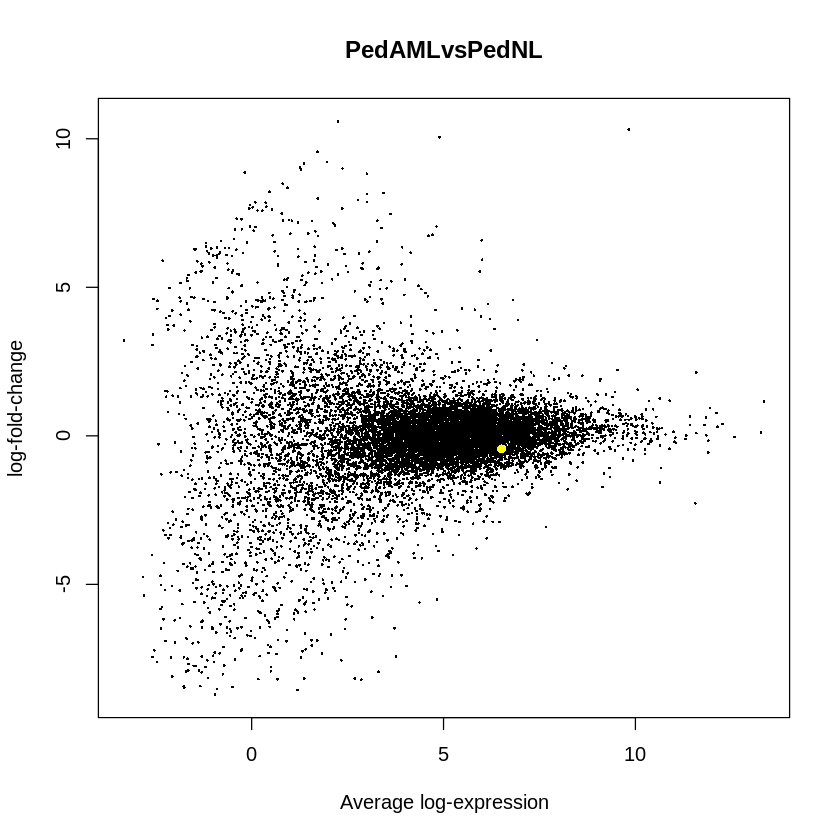

In [168]:
globalSummarizeTestsAndPlotMdForCoefficient(2, method=NULL, gModeratedVoomedFitForContrasts.stem,
                                            gLogThresholdedTestResults.stem, gContrastMatrix.stem,
                                            gVoomResult.stem, gGroupMetadataVector.stem,
                                            gModeratedVoomedFitForContrasts.stem, gBcv.stem, paste0(gOutputDir, "/stem"))

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsPedNL"

png 
  2

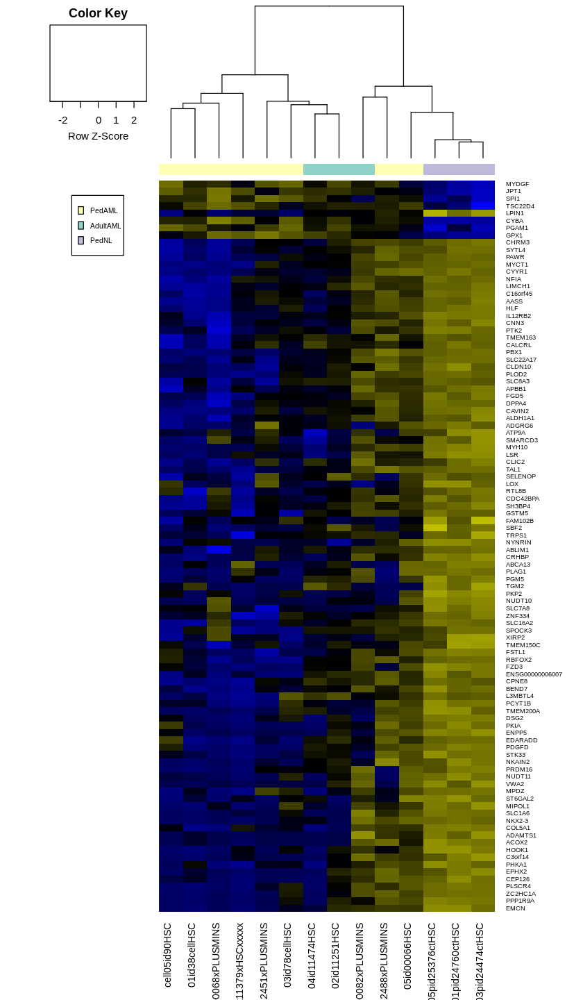

In [167]:
globalPlotTopHeatmapForCoefficient(2, c("all"), gModeratedVoomedFitForContrasts.stem,
                                  #gLogThresholdTestResults.stem, #gContrastMatrix.stem,
                                  gVoomResult.stem, gGroupMetadataVector.stem)

[1] "Heatmap of Top 100 Most Significantly Differentially Expressed Genes for PedAMLvsPedNL"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

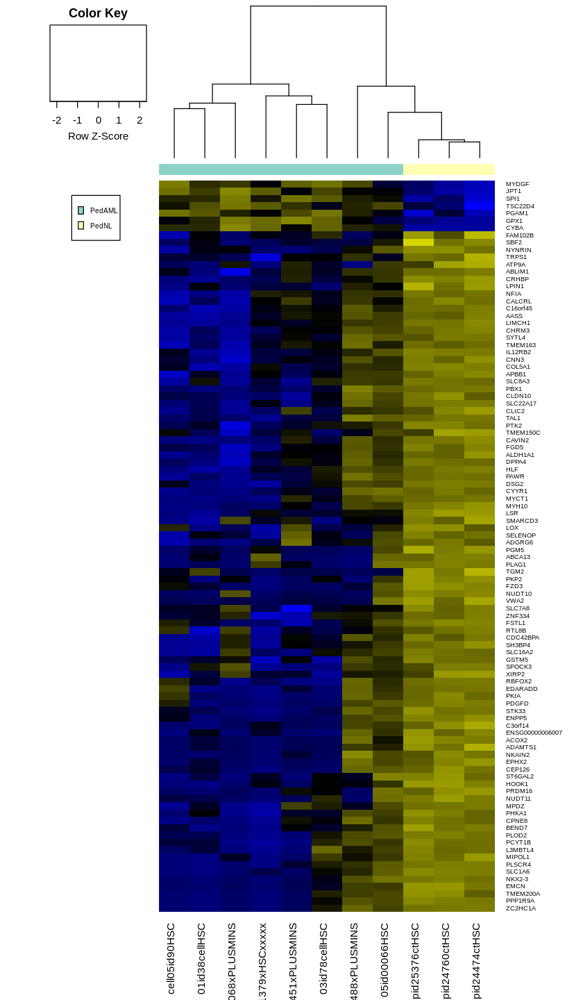

In [123]:
globalPlotTopHeatmapForCoefficient(2, c("PedAML", "PedNL"), gModeratedVoomedFitForContrasts.stem,
                                  #gLogThresholdTestResults.paired.nocor, #gContrastMatrix.paired.nocor,
                                  gVoomResult.stem, gGroupMetadataVector.stem)

[Table of Contents](#Table-of-Contents)

## Project Specific Analyses

</div>

In [ ]:
getwd()
#RBFOX2.target <- read.csv("/oRNAment_RBFOX2", header=TRUE)
#topTable_RBFOX2.pc.all <- 

[1] 500

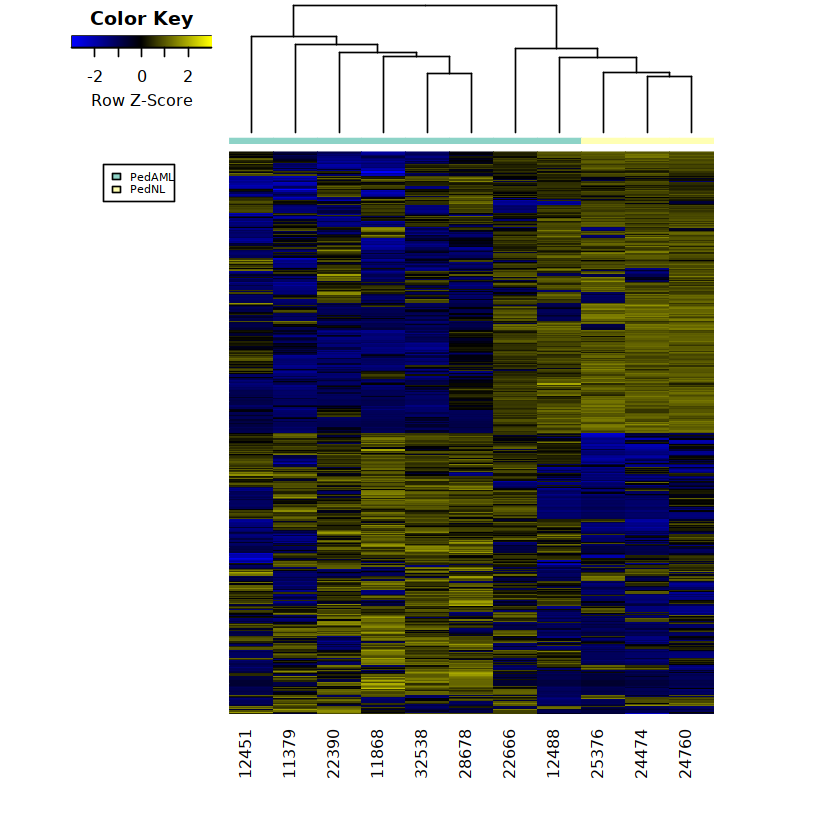

In [54]:
PedAMLvsPedNL.stem.var <- apply(gVoomResult.stem$E[,which(gGroupMetadataVector.stem %in% c("PedAML", "PedNL"))], 1, var)
PedAMLvsPedNL.stem.var.ord <- sort(PedAMLvsPedNL.stem.var, decreasing = TRUE)
highvargenes <- PedAMLvsPedNL.stem.var.ord[1:500]
 i <- which(gVoomResult.stem$genes[["ENSEMBL"]] %in% names(highvargenes))
length(i)
 mycol = colorpanel(1000, "blue", "black", "yellow")
 subGroups <- which(gGroupMetadataVector.stem %in% c("PedAML", "PedNL"))
 group_col = brewer.pal(12, "Set3")[as.factor(gGroupMetadataVector.stem[subGroups])]
 geneNames <- gVoomResult.stem$genes$SYMBOL[i]
 symbolNaIdx <- which(is.na(gVoomResult.stem$genes$SYMBOL[i]))
 geneNames[symbolNaIdx] <- gVoomResult.stem$genes$SYMBOL[symbolNaIdx]
 makeCustomHeatmap = function(){
        heatmap.2(gVoomResult.stem$E[i,subGroups], scale="row", labRow="", 
                 labCol=gVoomResult.stem$targets$Patient.ID[subGroups], # May need to change to represent variable containing sample name
                 ColSideColors=group_col, 
                 col=mycol, trace="none", density.info="none", dendrogram="column",
                 margin=c(8,8), lhei=c(2,10))  
        legend("topleft", fill=unique(group_col), legend=unique(gGroupMetadataVector.stem[subGroups]), 
               inset=c(0,0.1), cex=0.5)
    }
 makeCustomHeatmap()
# fileName = composeFileNameForHeatmap(aFit, outputDir, ".png", runName, description, coeffNumber, expGroups)
fileName <- paste0("DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_HighVarHeatmap.png")
 #png(filename = file.path(gOutputDir, fileName), height = 10, width = 8, 
 #    units = "in", res = 300)   
 makeCustomHeatmap()
 #dev.off()      

[Table of Contents](#Table-of-Contents)

### Heatmaps for Special Genelists

</div>

In [56]:
head(topTable_PedAMLvsAdultAML_Prog)
#dim(gModeratedVoomedFitForContrasts.prog)
head(gVoomResult.prog$targets)

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000127022,ENSG00000127022,821,CANX,protein_coding,1.487862,9.607598,6.545484,2.972819e-06,0.009870516,4.783663
ENSG00000198840,ENSG00000198840,4537,ND3,protein_coding,-2.519836,4.939021,-6.498701,3.271362e-06,0.009870516,4.671913
ENSG00000269028,ENSG00000269028,100462981,MTRNR2L2,protein_coding,-2.227289,3.341528,-6.597133,2.675673e-06,0.009870516,4.648341
ENSG00000228253,ENSG00000228253,4509,ATP8,protein_coding,-2.563000,2.939427,-6.663799,2.336838e-06,0.009870516,4.595744
ENSG00000212907,ENSG00000212907,4539,ND4L,protein_coding,-2.145202,5.958718,-5.965622,9.933144e-06,0.016264036,3.636084
ENSG00000213741,ENSG00000213741,6235,RPS29,protein_coding,-1.675567,5.747700,-5.946884,1.033546e-05,0.016264036,3.598358


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
02id38cellPROGENITORS,PedAML,33277010,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
06id90cellPROGENITORS,PedAML,27611439,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
04id78cellPROGENITORS,PedAML,38647687,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
06id00066PRO,PedAML,34799422,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
01x00077xPROGENIT,PedAML,26302465,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108
03x11379xHPCxxxxx,PedAML,46423363,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550


[Table of Contents](#Table-of-Contents)

## plotTopHeatmapForGenelist

In [70]:
library(gplots)
plotTopHeatmapForGenelist = function(aFit, aVoomResults, genelist, 
                                        outputDir, runName, metadataVector, description, 
                                        coeffNumber, geneNaId, expGroups, id="SYMBOL", colid="Sample_ID",
                                    fileprefix=NULL){
    
    allHits = topTreat(aFit, coef=coeffNumber, n=Inf)
    topHits = allHits[allHits[[id]] %in% genelist,]
    i = which(aVoomResults$genes[[geneNaId]] %in% topHits[[geneNaId]])
    mycol = colorpanel(1000, "blue", "white", "red")
    if (tolower(expGroups) == "all") {
        subGroups <- which(metadataVector %in% metadataVector) #Take all samples
    } else {
        subGroups <- which(metadataVector %in% expGroups)
    }
    f <- as.factor(metadataVector[subGroups])
    if(length(levels(f)) == 2) {
        # #657991 for Pediatric AML
        # #A2C0E5 for Adult AML 
        # #C4C7C9 for Non-Leukemic
         #group_col = c("#657991", "#d99197")[f]
        #group_col = c("#A2C0E5","#C4C7C9")[f]
        #group_col = c("#657991","#C4C7C9")[f]
        if(sum(expGroups %in% c("PedAML", "PedNL")) == 2 ) {
            group_col = c("#003049","#B2182B")[f] # PedAML & PedNL
        } else if(sum(expGroups %in% c("PedAML", "AdultAML")) == 2){
            group_col = c("#f77f00","#003049")[f] # Adult AML & PedAML
        } else {
            group_col = c("red", "green")[f]
        }
    } else {
#        pal1 <- c("#009292","#490092","#b6dbff")
#        pal2 <- c("#2166AC","#F4A582","#B2182B")
#        group_col <- c("#009292","#490092","#b6dbff")
        group_col <- c("#f77f00","#003049", "#B2182B", "snow3")[f]
        #group_col = c("#A2C0E5","gray", "white")[f]
    }
    geneNames <- aVoomResults$genes[[id]][i]
    symbolNaIdx <- which(is.na(aVoomResults$genes[[id]][i]))
    geneNames[symbolNaIdx] <- aVoomResults$genes[[geneNaId]][symbolNaIdx]
    makeCustomHeatmap = function(){
        heatmap.2(aVoomResults$E[i,subGroups], scale="row", labRow=geneNames, 
                 labCol=aVoomResults$targets[[colid]][subGroups], # May need to change to represent variable containing sample name
                 ColSideColors=group_col,
                 col=mycol, trace="none", density.info="none", dendrogram="column",
                 margin=c(8,8), lhei=c(2,10), key=FALSE)  
        #legend("topleft", fill=unique(group_col), legend=unique(metadataVector[subGroups]), 
        #       inset=c(0,0.1), cex=0.5)
    }
    makeCustomHeatmap()
    if(is.null(fileprefix)) {
        fileName = composeFileNameForHeatmap(aFit, outputDir, ".png", runName, description, coeffNumber, expGroups)
    } else {
        fileName = paste0(fileprefix, "_heatmap.png")
    }
    png(filename = file.path(outputDir, fileName), height = 10, width = 5, 
      units = "in", res = 300)   
    makeCustomHeatmap()
    dev.off()      
}

In [82]:
table(topTable_PedAMLvsAdultAML_Prog$logFC < 0, topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05)
table(topTable_PedAMLvsPedNL_Prog$logFC < 0, topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05)
head(topTable_PedAMLvsPedNL_Prog)
lcpm.prog[rownames(lcpm.prog) %in% topTable_PedAMLvsPedNL_Prog$ENSEMBL[1:5],]

       
        FALSE TRUE
  FALSE  6179   45
  TRUE   5723  122

       
        FALSE TRUE
  FALSE  5447  147
  TRUE   5950  525

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000081985,ENSG00000081985,3595,IL12RB2,protein_coding,-8.063473,-0.3512706,-8.214333,1.186463e-07,0.0008834744,6.600955
ENSG00000196368,ENSG00000196368,55190,NUDT11,protein_coding,-8.273425,-1.9688847,-7.769619,2.698920e-07,0.0008834744,5.595205
ENSG00000114698,ENSG00000114698,57088,PLSCR4,protein_coding,-7.906101,-2.4558464,-7.726281,2.928078e-07,0.0008834744,5.504919
ENSG00000184860,ENSG00000184860,93517,SDR42E1,protein_coding,-7.117186,-2.9863669,-7.778346,2.655073e-07,0.0008834744,5.484254
ENSG00000170627,ENSG00000170627,121355,GTSF1,protein_coding,2.627996,4.3052909,6.968224,1.268826e-06,0.0018484832,5.412543
ENSG00000145020,ENSG00000145020,275,AMT,protein_coding,-1.897904,4.4067128,-6.923648,1.386433e-06,0.0018484832,5.331167


,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000081985,-0.7935117,-7.387261,-7.387261,-1.511252,-7.387261,-7.387261,5.320597,4.958733,-2.760070,-7.387261,-1.077152,2.206642,-1.283453,-2.008478,5.101738,5.600871,4.6728177,5.028842
ENSG00000114698,-7.3872606,-7.387261,-7.387261,-7.387261,-7.387261,-7.387261,1.539482,3.101977,-7.387261,-2.356551,-7.387261,2.373895,-7.387261,-7.387261,3.110969,3.238213,2.2464941,2.856388
ENSG00000170627,6.8505114,5.650729,7.022664,5.903600,6.524355,5.464120,4.477681,3.763594,1.905106,-7.387261,3.381111,6.313085,6.619327,5.781717,3.470924,2.909762,3.7155534,3.455860
ENSG00000184860,-7.3872606,-7.387261,-7.387261,-7.387261,-7.387261,-7.387261,1.408520,1.752416,-7.387261,-7.387261,-7.387261,1.375556,-7.387261,-7.387261,2.447561,2.456247,0.8905394,2.042131
ENSG00000196368,-7.3872606,-2.418445,-4.972651,-7.387261,-4.506598,-7.387261,2.181489,2.925495,-7.387261,2.122535,-7.387261,-3.153819,-7.387261,-7.387261,3.435449,4.017950,2.8120828,3.960409


In [192]:
length(which(abs(vennInput[,1]) == 1 & rowSums(abs(vennInput)) == 1))
length(which(abs(vennInput[,2]) == 1 & rowSums(abs(vennInput)) == 1))
length(which(abs(vennInput[,4]) == 1 & rowSums(abs(vennInput)) == 1))
length(which(abs(vennInput[,4]) == 1 & rowSums(abs(vennInput)) == 2))

overlap1 <- rownames(vennInput)[which(abs(vennInput[,1]) == 1 & rowSums(abs(vennInput)) == 1)]
overlap2 <- rownames(vennInput)[which(abs(vennInput[,2]) == 1 & rowSums(abs(vennInput)) == 1)]
overlap3 <- rownames(vennInput)[which(abs(vennInput[,4]) == 1 & rowSums(abs(vennInput)) == 1)]
overlap4 <- rownames(vennInput)[which(abs(vennInput[,4]) == 1 & rowSums(abs(vennInput)) == 2)]

topTable_PedAMLvsAdultAML_Prog_uni <- topTable_PedAMLvsAdultAML_Prog[topTable_PedAMLvsAdultAML_Prog$ENSEMBL %in% overlap1,]
topTable_PedAMLvsPedNL_Prog_uni <- topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$ENSEMBL %in% overlap2,]
topTable_PedAMLvsPedNL_Stem_uni <- topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$ENSEMBL %in% overlap3,]
topTable_PedAMLvsPedNL_uni <- topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$ENSEMBL %in% overlap4,]

[1] 158

[1] 542

[1] 95

[1] 121

In [158]:
ras_gns_filt.prog
ras_gns_filt.stem
topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$P.Value < 0.05 & 
                            topTable_PedAMLvsPedNL_Prog$SYMBOL %in% ras_gns_filt$Name,]
topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$P.Value < 0.05 & 
                            topTable_PedAMLvsPedNL_Stem$SYMBOL %in% ras_gns_filt$Name,]

[1] "CDC42"    "GAB2"     "GNG10"    "IGF1R"    "NF1"      "NRAS"    
 [7] "PAK2"     "PIK3R2"   "PLA2G12A" "PLA2G4A"  "PLA2G6"   "PLD1"    
[13] "PRKACA"   "PRKCB"    "RAB5C"    "RASA3"    "RASGRP4"  "RASSF1"  
[19] "RGL2"     "RHOA"     "SOS2"

[1] "CALM1"   "ETS1"    "GNB2"    "GNG5"    "GRB2"    "PLA2G4A" "PLA2G6" 
 [8] "PRKACB"  "RASGRP3" "RRAS"

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
88,ENSG00000171777,115727,RASGRP4,protein_coding,3.4801774,3.423944,4.964675,8.767147e-05,0.01037360,1.523079
719,ENSG00000123739,81579,PLA2G12A,protein_coding,-1.1982889,4.628509,-3.488702,2.477173e-03,0.04753289,-2.207517
1134,ENSG00000108774,5878,RAB5C,protein_coding,1.3292505,6.640097,3.197179,4.774041e-03,0.06317753,-3.012892
1280,ENSG00000184381,8398,PLA2G6,protein_coding,-0.9182283,4.709009,-3.003710,7.340295e-03,0.07846768,-3.259044
1370,ENSG00000180370,5062,PAK2,protein_coding,0.6048046,7.260337,3.045102,6.697812e-03,0.07501547,-3.382497
1405,ENSG00000116711,5321,PLA2G4A,protein_coding,-1.6408485,2.602792,-2.714423,1.380928e-02,0.10677434,-3.431033
1575,ENSG00000075651,5337,PLD1,protein_coding,1.4435076,4.949750,2.794859,1.160247e-02,0.09764389,-3.622083
1794,ENSG00000072062,5566,PRKACA,protein_coding,0.6290189,3.634395,2.577832,1.849956e-02,0.12184163,-3.885740
1921,ENSG00000166501,5579,PRKCB,protein_coding,1.0621173,7.953977,2.738012,1.312365e-02,0.10439293,-4.033314


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B,logFDR,col
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
513,ENSG00000116711,5321,PLA2G4A,protein_coding,-3.9517272,1.221453,-3.067805,0.007470248,0.1489243,-2.332669,0.8270343,0
664,ENSG00000152689,25780,RASGRP3,protein_coding,5.9027667,1.622534,2.864112,0.011388199,0.1849137,-2.850572,0.7330308,0
665,ENSG00000134954,2113,ETS1,protein_coding,-2.2389212,3.919301,-2.957295,0.009395105,0.1675183,-2.857844,0.7759378,0
829,ENSG00000174021,2787,GNG5,protein_coding,0.8909355,6.995938,2.930395,0.009932617,0.1706421,-3.215253,0.7679139,0
940,ENSG00000177885,2885,GRB2,protein_coding,1.0826135,7.892840,2.840092,0.011965330,0.1874526,-3.418002,0.7271084,0
1198,ENSG00000172354,2783,GNB2,protein_coding,0.8818897,6.851006,2.611194,0.019089378,0.2343153,-3.829514,0.6301994,0
1416,ENSG00000184381,8398,PLA2G6,protein_coding,-1.0205688,4.468023,-2.408964,0.028628131,0.2773087,-4.064089,0.5570366,0
1534,ENSG00000198668,801,CALM1,protein_coding,1.2656421,8.470871,2.449717,0.026400526,0.2655878,-4.166221,0.5757920,0
1849,ENSG00000126458,6237,RRAS,protein_coding,-1.2388824,3.970815,-2.138760,0.048491157,0.3504211,-4.402873,0.4554097,0


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


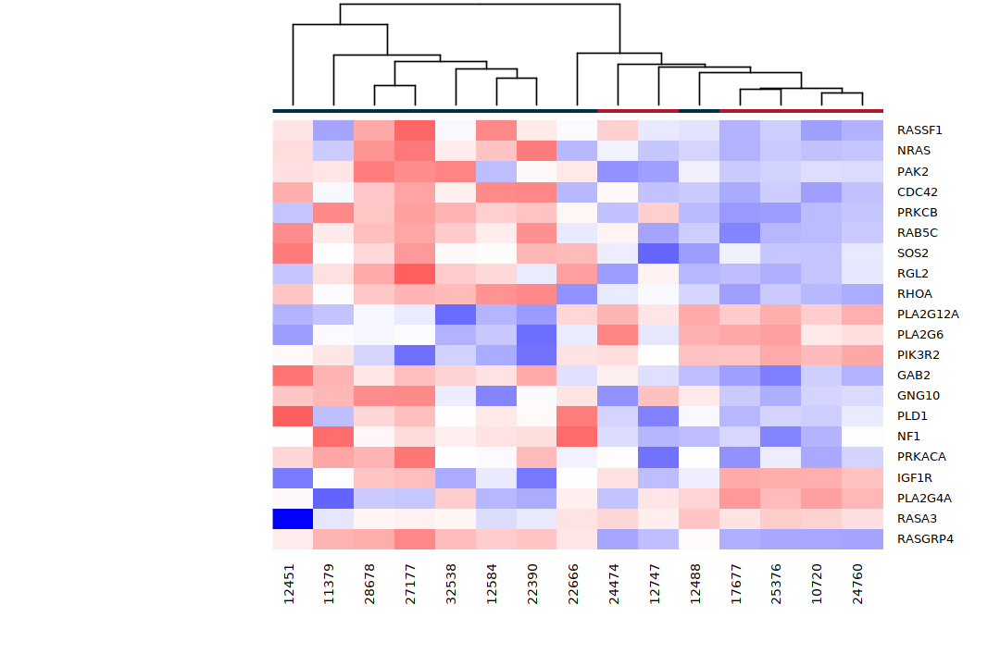

png 
  2

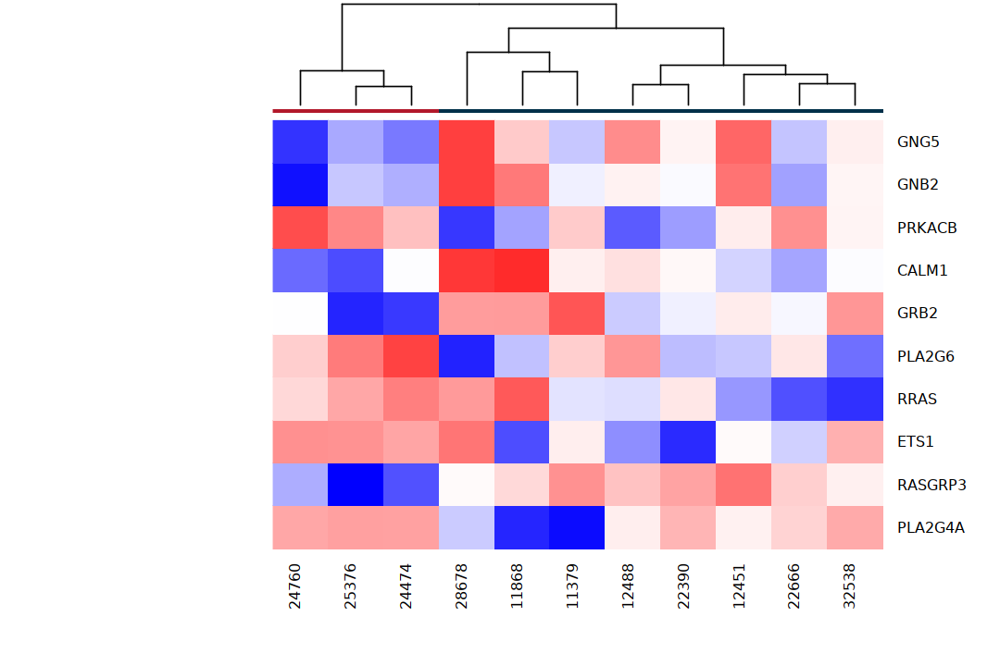

In [152]:
ras_gns_filt.prog <- ras_gns_filt$Name[ras_gns_filt$Name %in% 
                                       topTable_PedAMLvsPedNL_Prog$SYMBOL[topTable_PedAMLvsPedNL_Prog$P.Value < 0.05]]
ras_gns_filt.stem <- ras_gns_filt$Name[ras_gns_filt$Name %in% 
                                       topTable_PedAMLvsPedNL_Stem$SYMBOL[topTable_PedAMLvsPedNL_Stem$P.Value < 0.05]]

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=ras_gns_filt.prog, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_RasGenes", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=ras_gns_filt.stem, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_RasGenes", colid="Patient.ID")

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


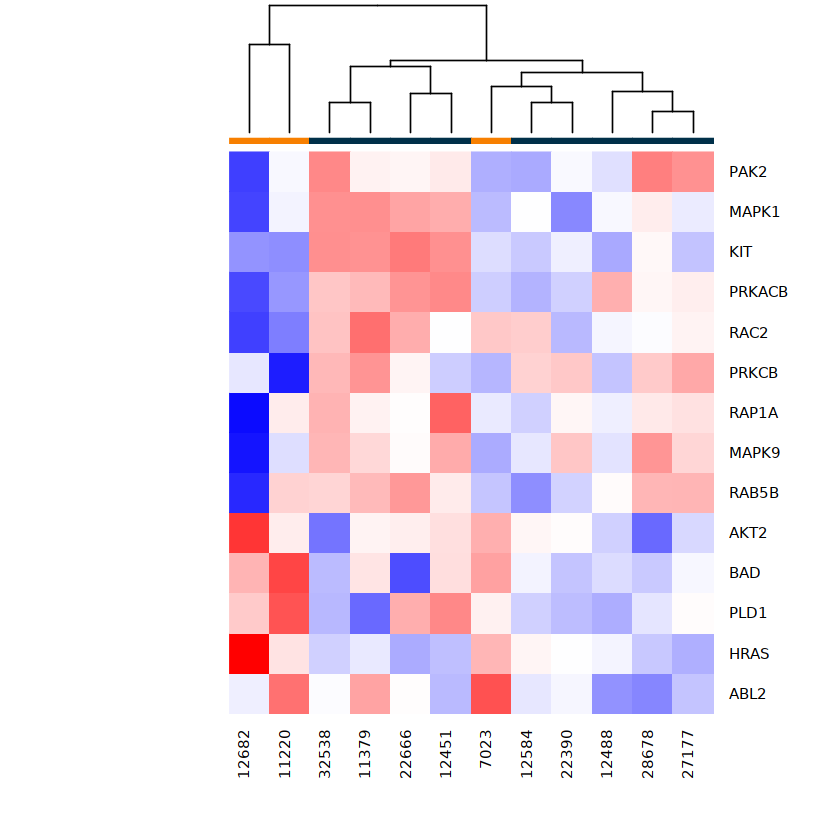

png 
  2

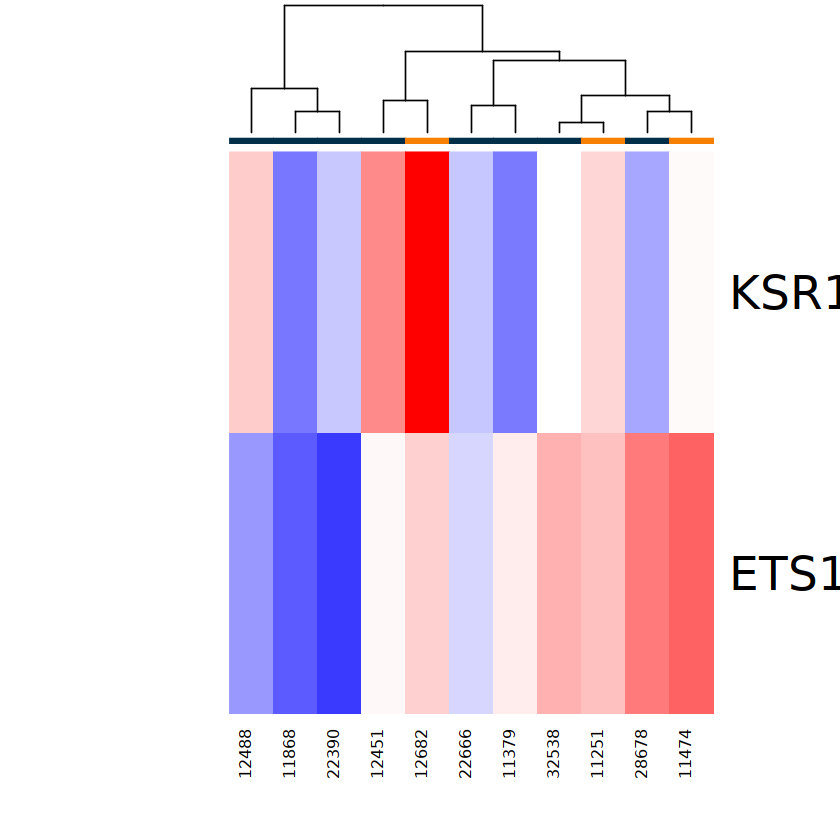

In [73]:
ras_gns_filt.prog2 <- ras_gns_filt$Name[ras_gns_filt$Name %in% 
                                       topTable_PedAMLvsAdultAML_Prog$SYMBOL[topTable_PedAMLvsAdultAML_Prog$P.Value < 0.05]]
ras_gns_filt.stem2 <- ras_gns_filt$Name[ras_gns_filt$Name %in% 
                                       topTable_PedAMLvsAdultAML_Stem$SYMBOL[topTable_PedAMLvsAdultAML_Stem$P.Value < 0.05]]

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=ras_gns_filt.prog2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_RasGenes_temp", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=ras_gns_filt.stem2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsAdultAML_RasGenes_temp", colid="Patient.ID")

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


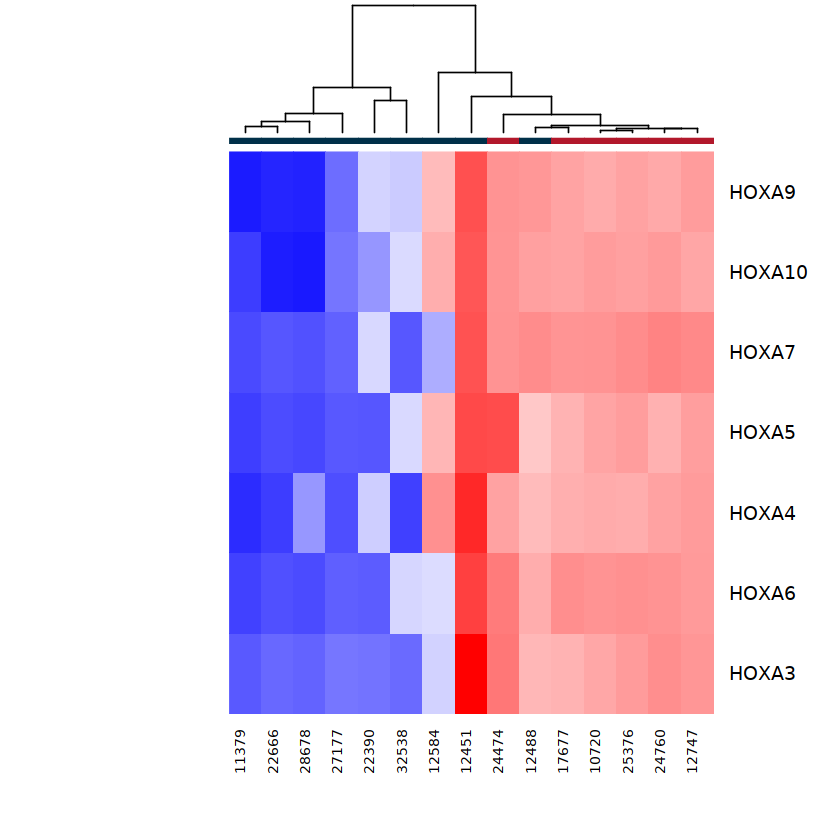

png 
  2

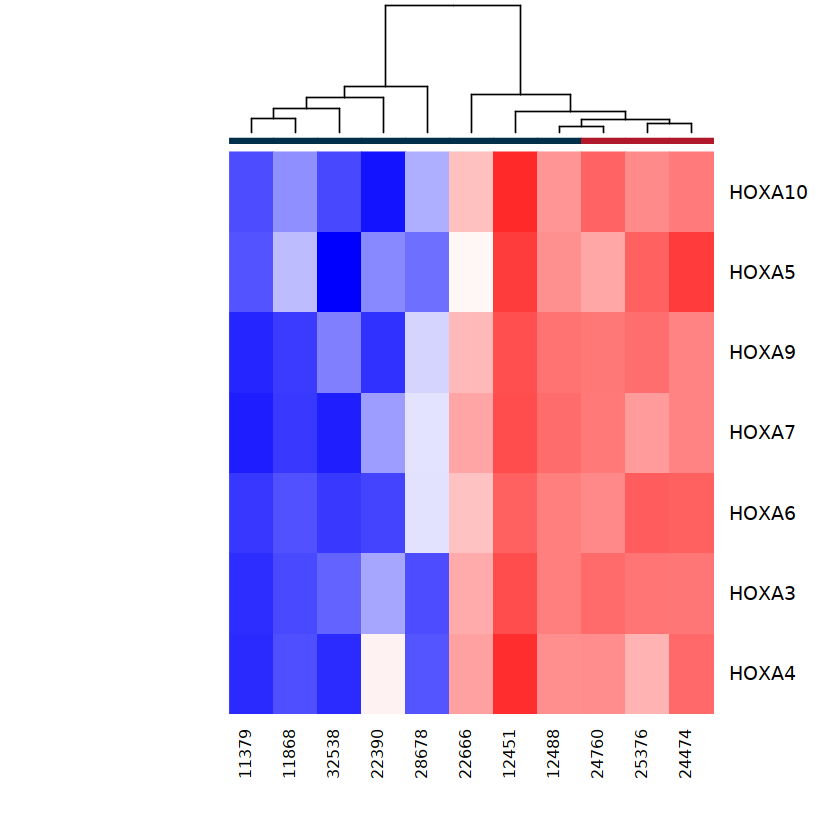

In [72]:
HOXA_gns_filt.prog <- HOXA_gns_filt.stem <- HOXA_gns

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=HOXA_gns_filt.prog, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_HOXAGenes", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=HOXA_gns_filt.stem, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_HOXAGenes", colid="Patient.ID")

GENE,COORD,LENGTH,FullCO,Type,Conserved,avESC,avDIF,avCL,difESC_DIF,⋯,Dif_KD_293T,X.ESC,X.Tissues,X.ActualTis,ESCs,Differentiated,CellLines,C1,A,C2
<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<int>,<int>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
MAST2,chr1:46466631-46466651,21,"chr1:46463471,46466631-46466651,46468477",ESC-LOW,,1.27,46.06,27.67,-44.79,⋯,NA,3,7,9,"ESC_H1a,ESC_H1b,ESC_H9b","Adipose,Kidney,Heart,Muscle,Ovary,Prostate,Testes,TestisP,Thyroid","CL_Gm12878,CL_HUVEC,CL_Hela,CL_MCF7",GTAACAGTCCTTTGGACAGCCCCCGGAATTTCTCTCCAAATGCACCTGCTCACTTTTCTTTTGTTCCTGCCCGTAG,CCATAGCCACAGAGCTGACAG,GACTGATGGGCGGCGCTGGTCTTTGGCCTCTTTGCCCTCTTCAGGATATGGAACTAACACTCCTAGCTCCACTGTCTCA
THOC5,chr22:29927067-29927099,33,"chr22:29927820,29927067-29927099,29925228",ESC-LOW,,0.92,46.23,28.05,-45.30,⋯,-4.56,4,13,17,"ESC_H1a,ESC_H1b,ESC_H9a,ESC_H9b","Adipose,Adrenal,Colon,Kidney,Liver,Lung,LymphNode,Heart,HeartP,Muscle,Brain,Brain_CortexP,Ovary,Testes,TestisP,Thyroid,WBC","CL_293T,CL_Fibr1,CL_Gm12878,CL_HNEK,CL_HUVEC,CL_Hela,CL_MCF7",GCTTCCCTTCCGGTGCAGGAGTACCTGTTTATGCCATTCGACCAGGCTCACAAGCAGTATGAGACAGCCAGACACCTGCCGCCTCCCCTCTATGTCCTCTTTGTTCAGGCCACTGCGTATGGGCAGGCCTGTG,CTCATATGAAATCCTCCCAGCCCCCTAGACAGG,ATAAGACGTTATCTGTGGCAATCGAAGGCAGTGTGGATGAAGCCAAGGCTCTGTTCAAACCTCCAGAGGACTCCCAAG
SORBS1,chr10:97135730-97135813,84,"chr10:97141442,97135730-97135813,97127456",ESC-LOW,,2.97,52.18,NA,-49.22,⋯,NA,2,13,16,"ESC_H1a,ESC_H1b","Adipose,Adrenal,Breast,Colon,Kidney,Liver,Lung,LymphNode,Heart,HeartP,Muscle,Brain,Brain_CortexP,Prostate,Testes,Thyroid",,AAATGACTGGGAACCCCCAGATAAGAAAGTAGACACAAGAAAATATCGTGCAGAGCCCAAGAGCATTTACGAATATCAGCCTGGCAAGTCTTCCGTTCTGACCAACGAAAAGATG,AGTCGGGATATAAGCCCAGAAGAGATAGATTTAAAGAATGAACCTTGGTATAAATTCTTTTCGGAATTGGAGTTTGGGAAACCG,AGCTCAGCCATCAGCCCTACTCCGGAAATTTCTTCAGAGACTCCTGGATA
CADPS,chr3:62499313-62499381,69,"chr3:62501734,62499313-62499381,62498443",ESC-LOW,,1.62,44.67,NA,-43.06,⋯,NA,2,3,4,"ESC_H1a,ESC_H1b","Lung,Heart,Brain,Brain_CortexP",,GTTTTGATGAAAGATATTGTTACCCCAGTGCCACAAGAGGAGGTAAAAACAGTTATCCGTAAATGTCTGGAACAGGCTGCGTTAGTCAACTATTCTCGGCTCTCAGAGTATGCCAAAATCGAAG,GGAAAAAGAGAGAAATGTATGAGCATCCTGTCTTCTGCTTGGCCTCCCAAGTGATGGATTTAACCATTC,AGAATCAAAAGGATGCAG
NDEL1,chr17:8366638-8366672,35,"chr17:8363478,8366638-8366672,8370248",ESC-LOW,,1.94,27.42,35.14,-25.48,⋯,-2.19,4,15,22,"ESC_H1a,ESC_H1b,ESC_H9a,ESC_H9b","Adipose,Adrenal,Breast,Colon,Kidney,KidneyP,Liver,LiverP,Lung,LymphNode,Heart,HeartP,Muscle,Brain,Brain_CortexP,CerebP,Ovary,Prostate,Testes,TestisP,Thyroid,WBC","CL_293T,CL_Fibr1,CL_Gm12878,CL_HNEK,CL_HUVEC,CL_Hela,CL_MCF7",GCTTTAGAATCCAAATTAGCAGCTTGCAGGAATTTTGCAAAGGACCAAGCATCACGAAAATCCTATATTTCAGGGAATGTTAACTGTGGGGTGCTGAATGGCAATGGCACAAAGTTCTCTCGATCAGGGCATACATCTTTCTTCGACAAAGG,GCAAGAAAAAGTCATATTTCCCACGTTGTTCATGG,GGCAGTAAACGGCTTTGACCCCGCTCCTCCTCCTCCTGGTCTGGGCTCCTCGCGTCCATCGTCAGCGCCGGGTATGCTGCCTCTCAGTGTGTGAGTGCCTAGCCTCCAGGTGGGGGCTCCTGCCCTCCTCCAACAACCCAGGACACCCACGCCTCACCCCTCGGTGCCTGGGCCCAGCCCCGTGCCCCTCCGTCTGCCTCCGCACGGCTGGCAGAGGGCAGGCTGCATGCAGTGGCGGCTACTGGGCCCTGCCCAGCCCCGGAACTCTGCGCGATATCAATACTGGCTATTTTCTCTTCTCGCCGTAGTGCCGTTGGTTTCACATGATTGCACTTTTGTGGGTCGCAAGGTGATACATACGTGTATTACTTGGTCACTGGATGCAGAAGTACCCATTCATCACACCTGCCCCATAGCCCCCACTCTGCTGTACTGATAGGATTTAGTTGTGTTTTAGGACATTGCAAATCTTCTAGAAGTTCTCCCCCAAATCAGGTCAATGTGTGCCCTCCTGAGCTCCCACCCAGGCATCTCCAGTGCTCATGATCATGTGTCCCCCAACTCCACCCCTCACAGTTTGGGCCTGTTTCTGGCAAAGAGTCAGGAAGGTTACTGAATTAGGGAACATTTTCTGCACCTTCTGATTTTACTTAAGCAGCTACCATTCCATGGACTTGCCTCCCAGAGCAGCACAATGCCCGTCTGAGCCCCACGTGGCAGGAGCCTCTGGGACGGGGCACACACAGGCCCAGCCTCTGTGCTGTCTCCTCCTCCGTGCGCCTCAGACTCGGGGTGAGGGAGGCGGGCAGCCTCTCGCCAGCCTTCCCGTCCTTCAGTTCAACGACATCTTTGGAGTGTTTTTGTTTTCTCTTCCAAGGGCCGTCCCGTTGTGTTAGGAAGGGTGAGTGGCTGGTTCCAGGGTGGGCCGGTGCCAGCTCCGGGGTGGACTGAACAGCGGCGGCTGTCCCTGTGCATCCTTTGATTACTCTCATGCTGCATTTACTGTTTACATTTGTTTTATTGTACATAGGTTTGTAAACATTATTGCCTGAGATATTTGTATATAACTTGGGCTTTGTAGCTTTTATTTATTCAGAACGCATACGGCATGTTAATGACTCTGATGGTGTCCTCCTCTGGGCAGCTGTATAGGATCATCATGTGGTTACAAAAAATACTTCCCTCAAAAAAATTCTTTTAATGTGGAAACAATAAATTTCACAGAAAAAAA
LMO7,ch

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

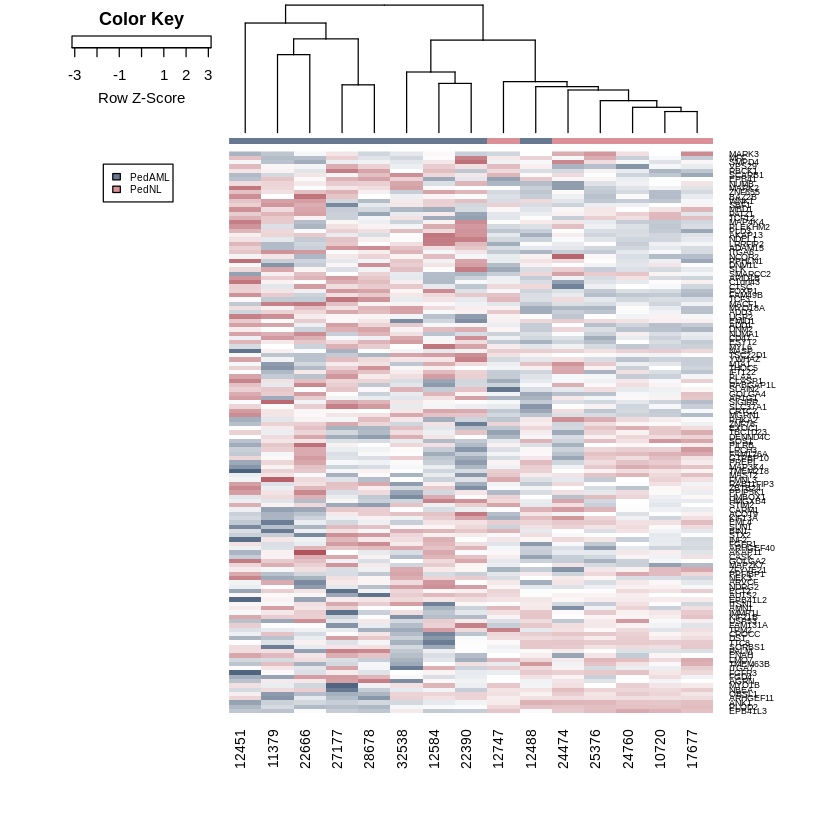

png 
  2

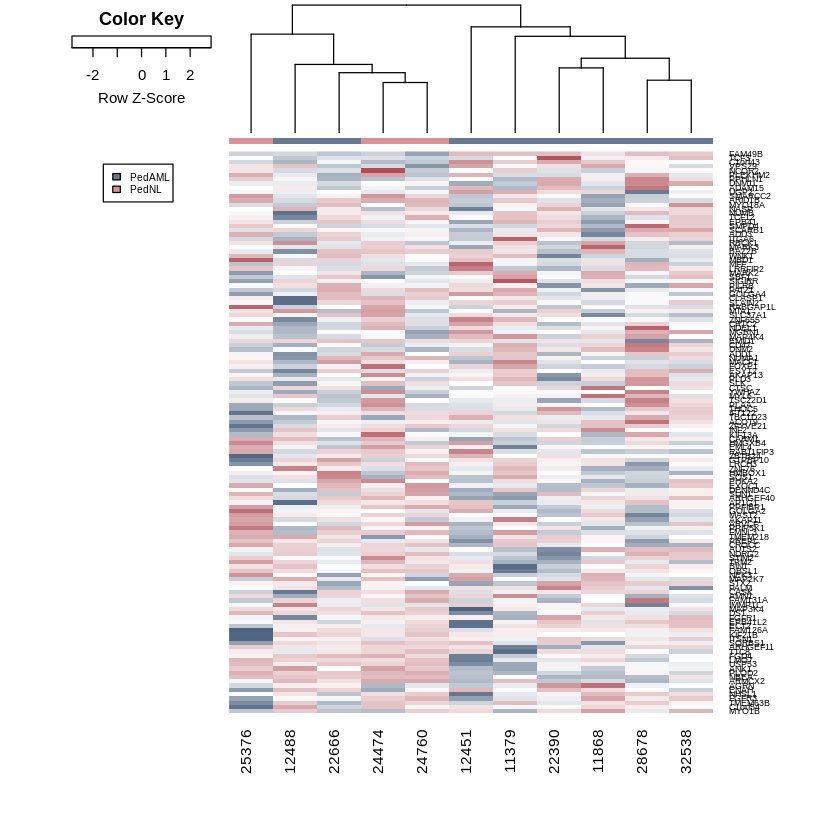

In [119]:
HanDiffSplicing <- read.csv(file="../inputs//Han_SupTable2.csv")
head(HanDiffSplicing)
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=HanDiffSplicing$GENE, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_HanESC_DiffSpl", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=HanDiffSplicing$GENE, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_HanESC_DIffSpl", colid="Patient.ID")


In [46]:
dim(topTable_PedAMLvsPedNL_Stem_uni)

ERROR: Error in eval(expr, envir, enclos): object 'topTable_PedAMLvsPedNL_Stem_uni' not found


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

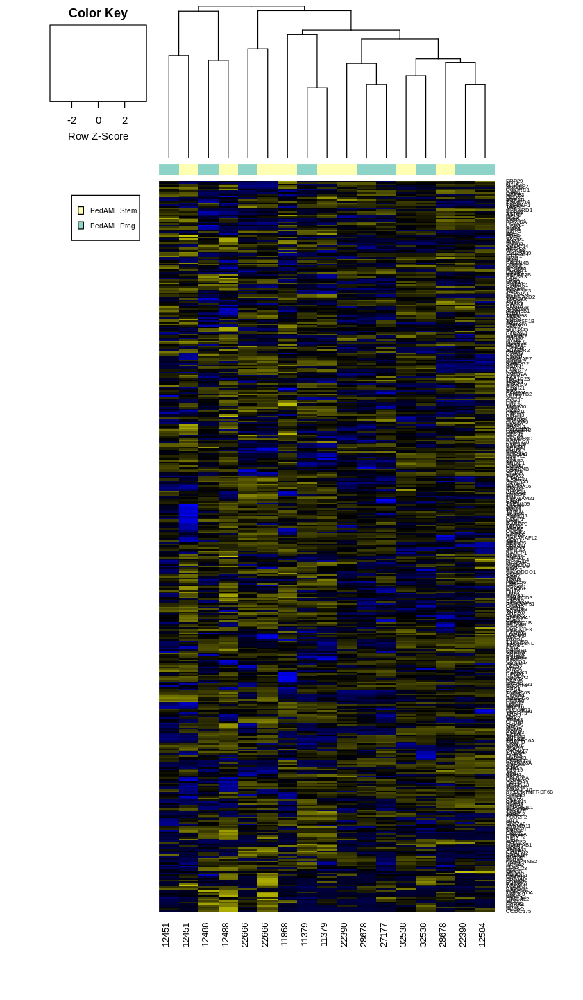

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

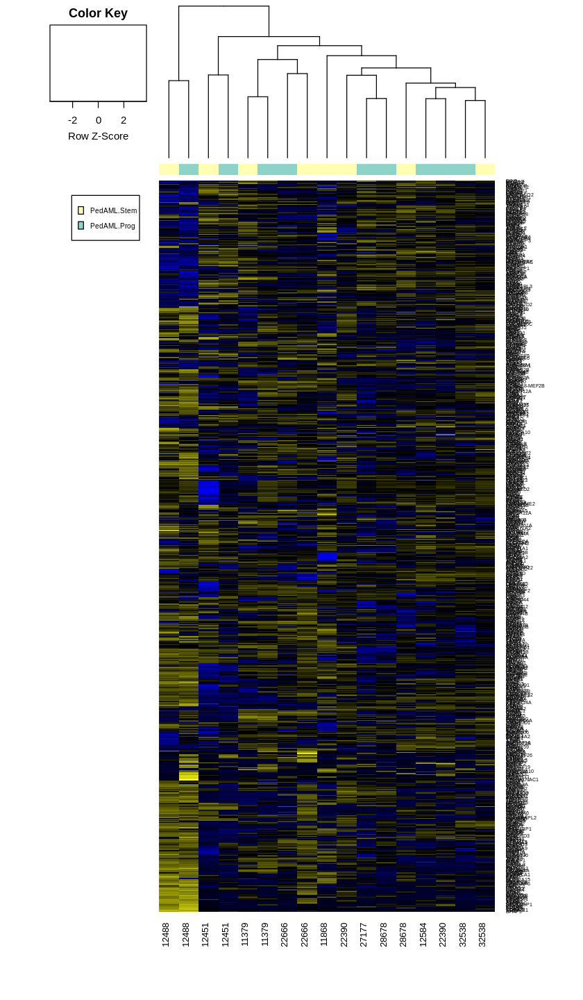

png 
  2

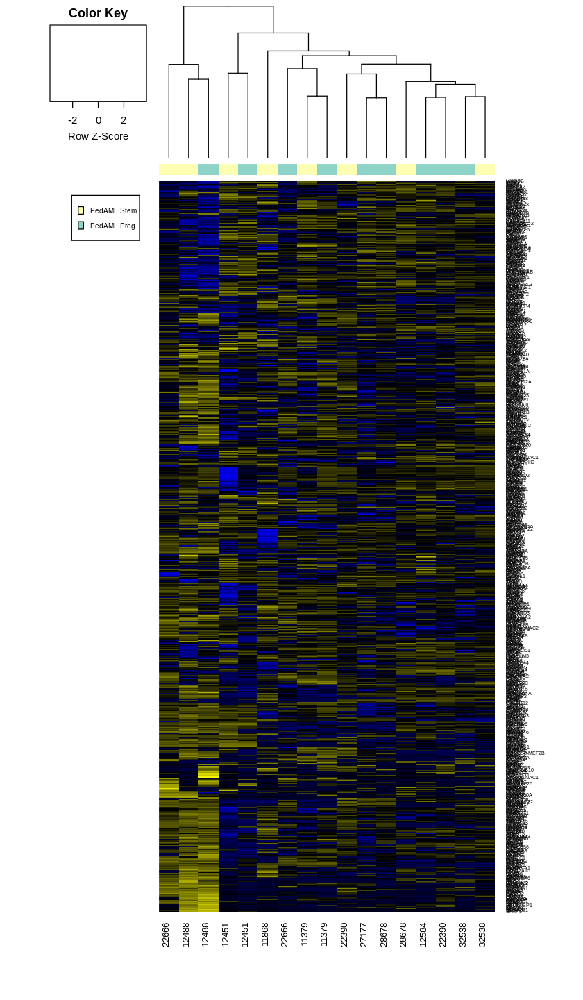

In [200]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts, gVoomResult, 
                          genelist=topTable_PedAMLvsPedNL_Stem_uni$SYMBOL, 
                          geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector, coeffNumber=1, 
                          expGroups=c("PedAML.Prog", "PedAML.Stem"), 
                          fileprefix="DeWerf_Human_PediatricAML_PedAML_ProgvStem_StemUni", colid="Patient.ID")

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts, gVoomResult, 
                          genelist=topTable_PedAMLvsPedNL_Prog_uni$SYMBOL, 
                          geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector, coeffNumber=1, 
                          expGroups=c("PedAML.Prog", "PedAML.Stem"), 
                          fileprefix="DeWerf_Human_PediatricAML_PedAML_ProgvStem_ProgUni", colid="Patient.ID")

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts, gVoomResult, 
                          genelist=c(topTable_PedAMLvsPedNL_Stem_uni$SYMBOL, 
                                     topTable_PedAMLvsPedNL_Prog_uni$SYMBOL), 
                          geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector, coeffNumber=1, 
                          expGroups=c("PedAML.Prog", "PedAML.Stem"), 
                          fileprefix="DeWerf_Human_PediatricAML_PedAML_ProgvStem_StemProgUni", colid="Patient.ID")


In [74]:
TabS3_vanGal_T_Pl <- read.csv(file="../TableS3_vanGalenetal_Tumor_Prog_Like.csv", header=TRUE)
head(TabS3_vanGal_T_Pl)
TabS3_vanGal_T_Hl <- read.csv(file="../TableS3_vanGalenetal_Tumor_HSC_Like.csv", header=TRUE)
TabS3_vanGal_T_HPl <- read.csv(file="../TableS3_vanGalenetal_Tumor_HSC_Prog_Like.csv", header=TRUE)
TabS3_vanGal_N_H_P <- read.csv(file="../TableS3_vanGalenetal_Normal_HSC_Prog.csv", header=TRUE)
TabS3_Crews_HSC <- read.csv(file="../TableS3_Crews_HSCgenes.csv", header=TRUE)
TabS3_Crews_HPC <- read.csv(file="../TableS3_Crews_HPCgenes.csv", header=TRUE)
dim(TabS3_vanGal_T_Pl)
dim(TabS3_vanGal_T_Hl)
dim(TabS3_vanGal_T_HPl)
dim(TabS3_vanGal_N_H_P)
dim(TabS3_Crews_HSC)
dim(TabS3_Crews_HPC)
NewGL <- list(TabS3_vanGal_T_Pl=TabS3_vanGal_T_Pl[,1],
             TabS3_vanGal_T_Hl=TabS3_vanGal_T_Hl[,1],
             TabS3_vanGal_T_HPl=TabS3_vanGal_T_HPl[,1],
             TabS3_vanGal_N_H_P=TabS3_vanGal_N_H_P[,1], 
             TabS3_Crews_HSC=TabS3_Crews_HSC[,1],
             TabS3_Crews_HPC=TabS3_Crews_HPC[,1])

,Tumor_Prog.like
,<chr>
1,CDK6
2,HSP90AB1
3,SPINK2
4,EEF1B2
5,PCNP
6,TAPT1-AS1


[1] 50  1

[1] 50  1

[1] 50  1

[1] 50  1

[1] 127   1

[1] 236   1

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


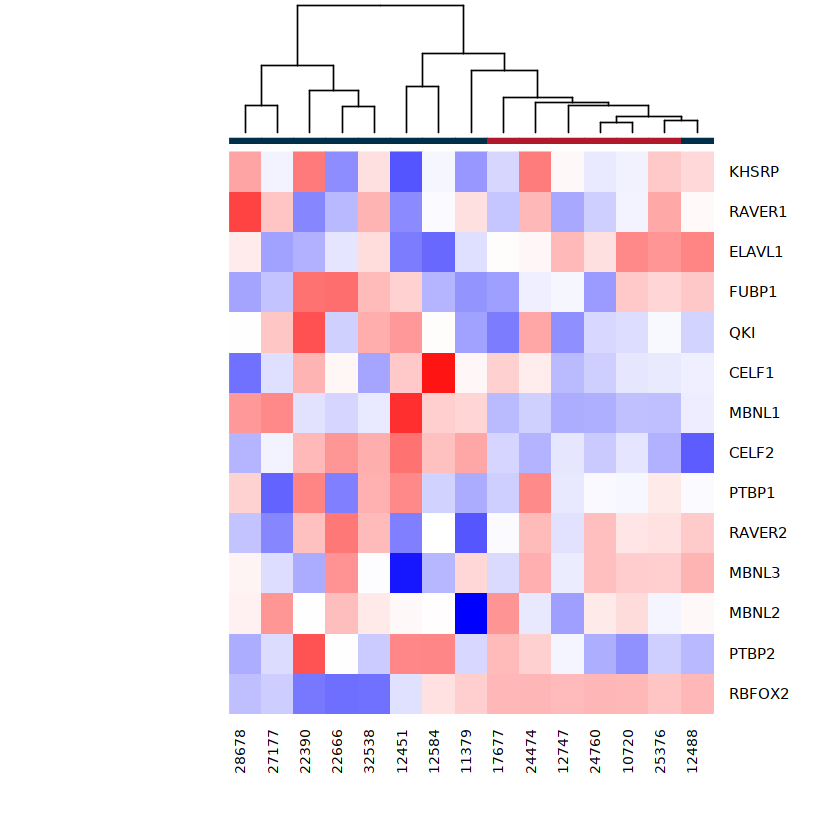

png 
  2

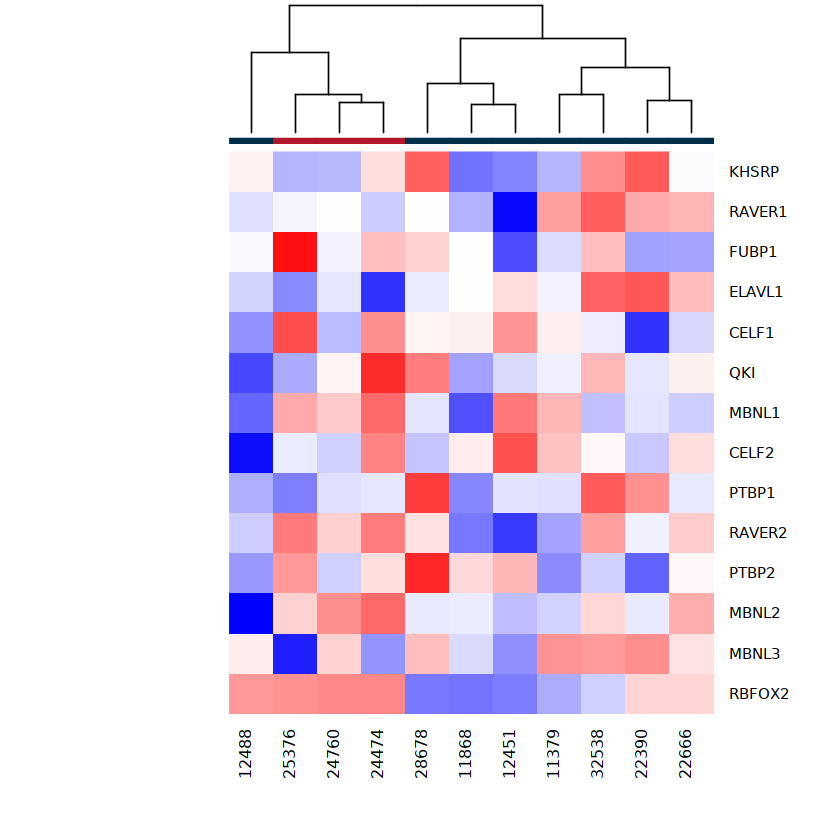

In [92]:
ASF <- c("RBFOX2","RAVER1","KHSRP","FUBP1","MBNL1","PTBP1","PTBP2","ELAVL1","MBNL2",
         "CELF1","CELF2","RAVER2", "MBNL3","QKI")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=ASF, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_SpliceosomeDF_AltSplFac_02092022", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=ASF, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_SpliceosomeDF_AltSplFac_02092022", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


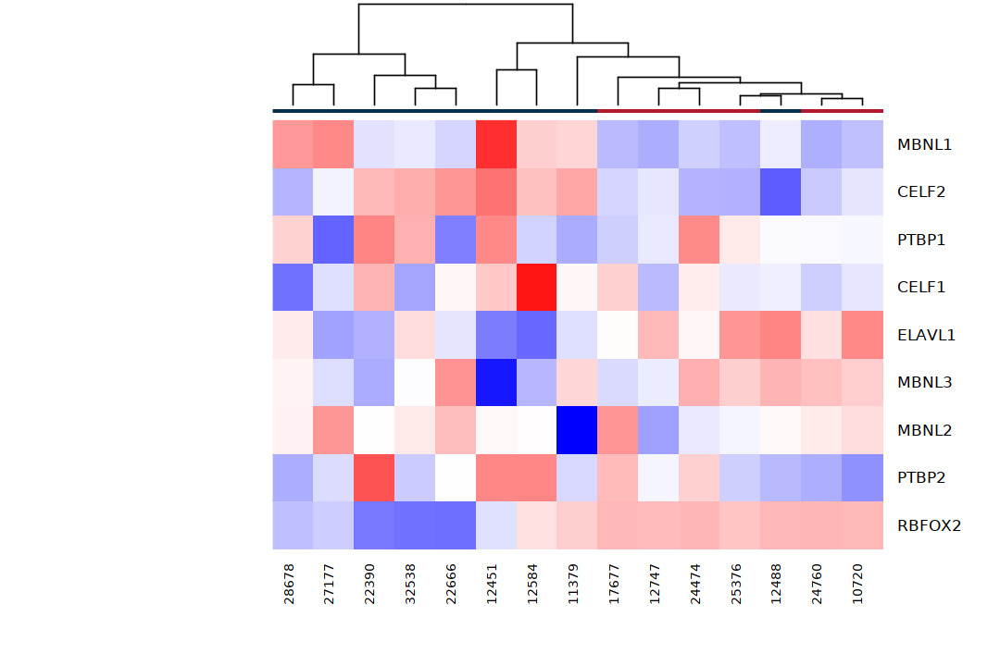

png 
  2

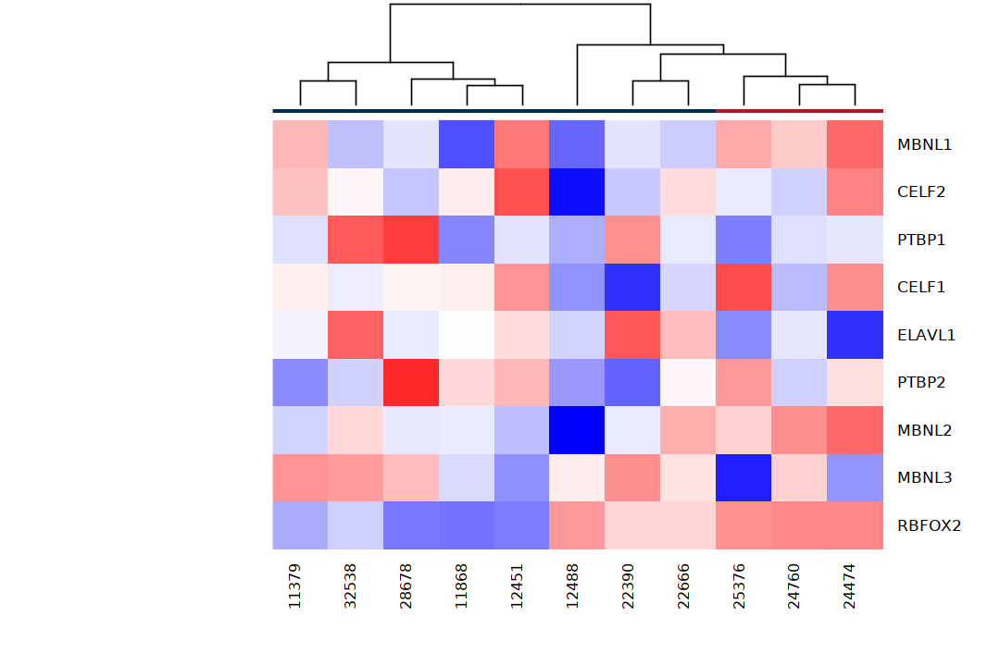

In [99]:
ASF2 <- c("RBFOX2","MBNL1","PTBP1","PTBP2","ELAVL1","MBNL2",
         "CELF1","CELF2","MBNL3")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=ASF2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_SpliceosomeDF_AltSplFac_02092022", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=ASF2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_SpliceosomeDF_AltSplFac_02092022", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

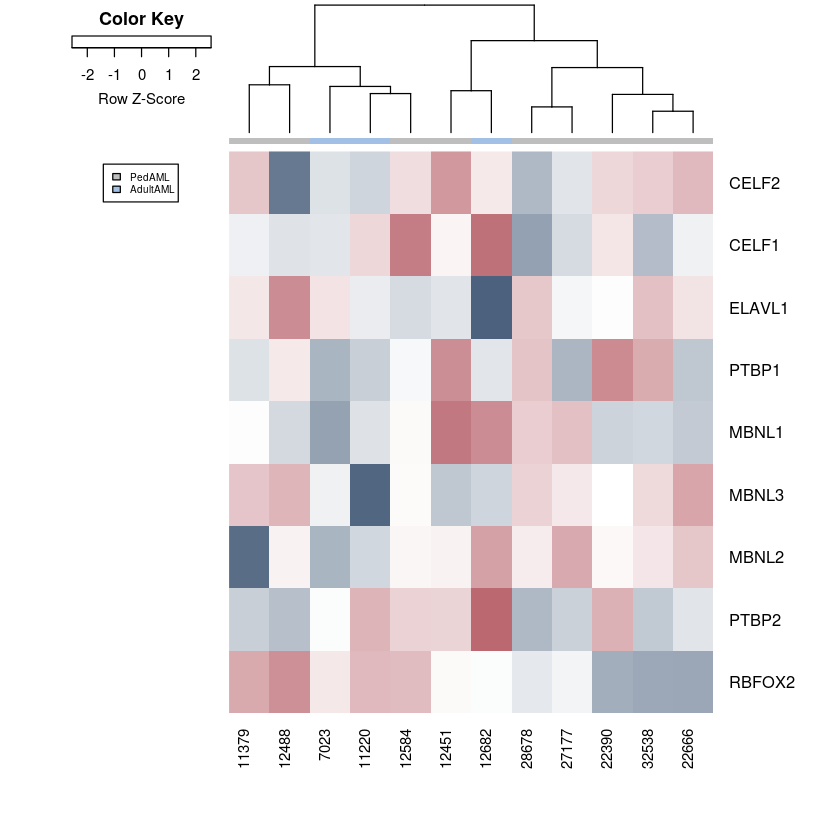

png 
  2

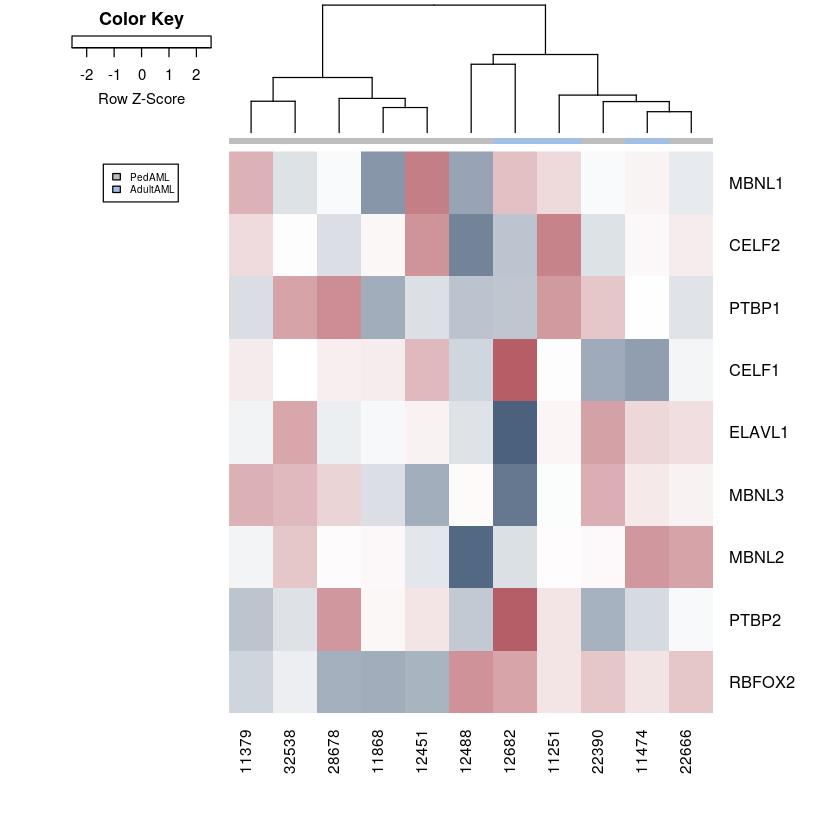

In [235]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=ASF2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML",  "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_SpliceosomeDF_AltSplFac", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=ASF2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=1, expGroups=c("PedAML",  "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsAdultAML_SpliceosomeDF_AltSplFac", colid="Patient.ID")


[Table of Contents](#Table-of-Contents)

## Figure 1C HPC Heatmap

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


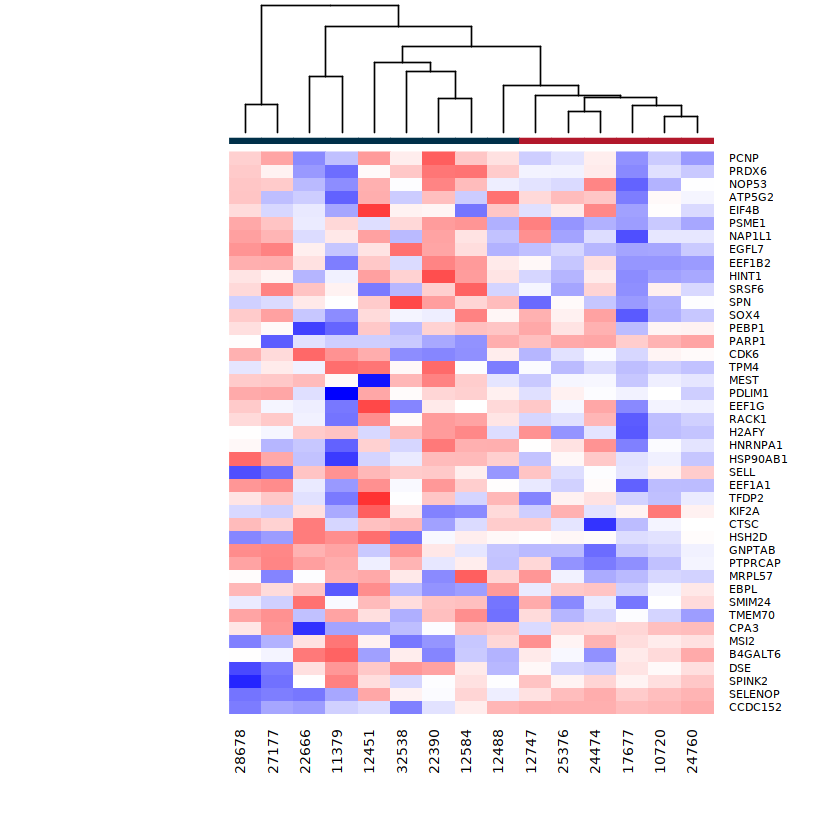

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


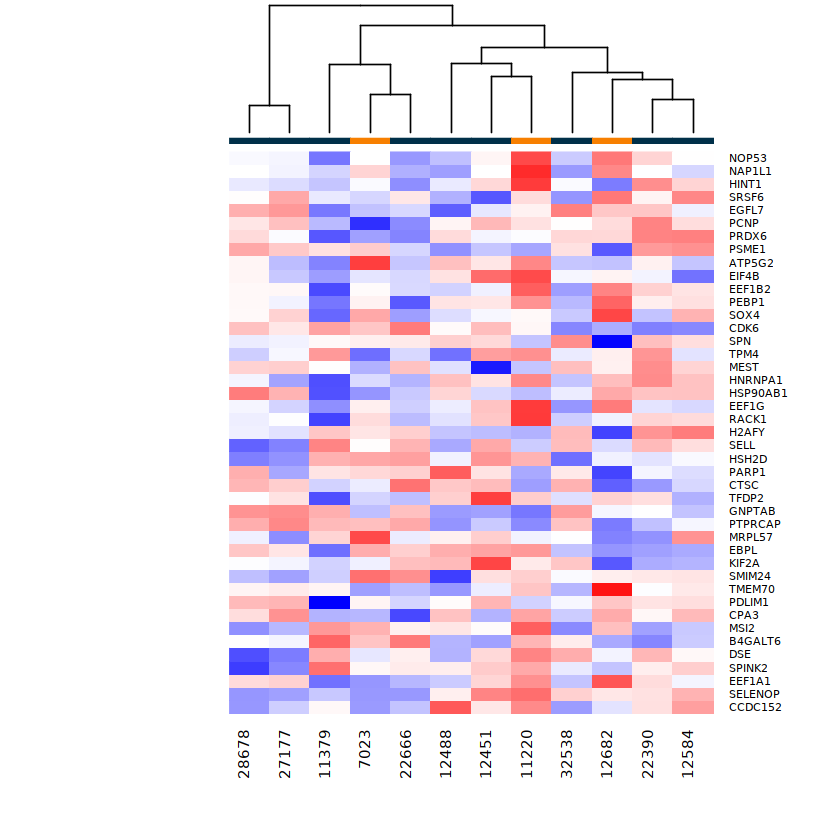

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


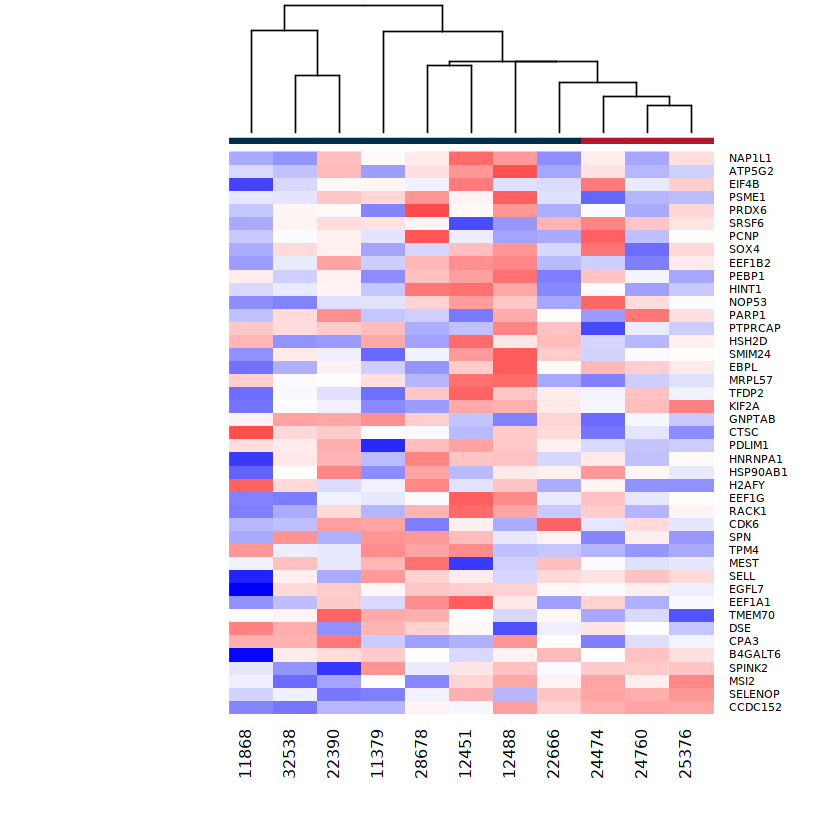

png 
  2

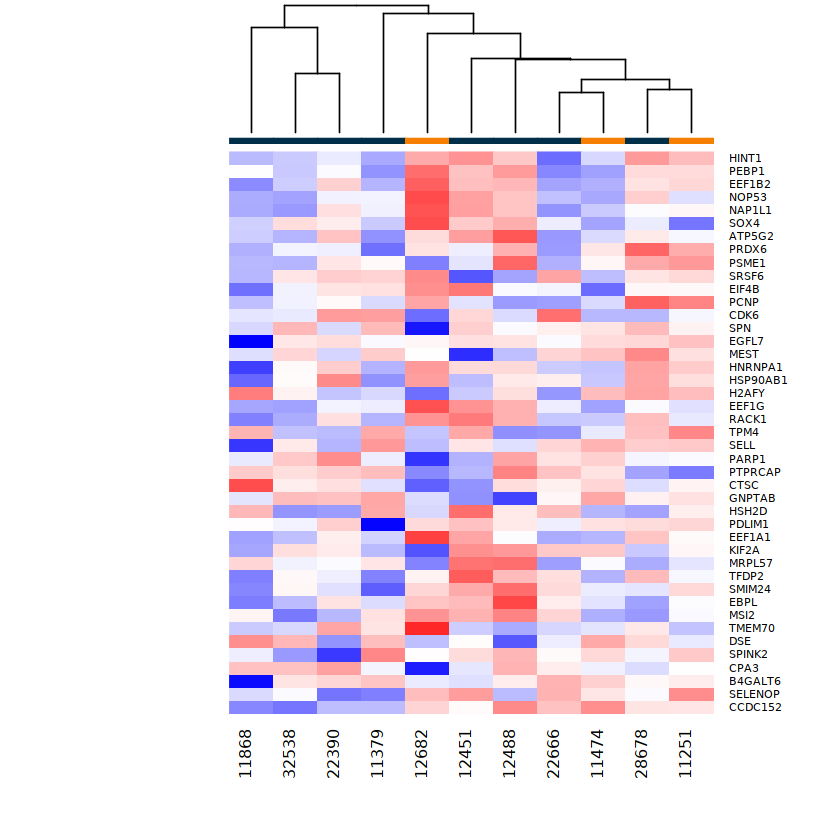

In [95]:
###
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_vanGal_T_Pl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_VG_TumorProgLike_02092022", colid="Patient.ID")
###
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_vanGal_T_Pl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_VG_TumorProgLike_02092022", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_vanGal_T_Pl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_VG_TumorProgLike_02092022", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_vanGal_T_Pl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsAdultAML_VG_TumorProgLike_02092022", colid="Patient.ID")


[Table of Contents](#Table-of-Contents)

## Figure 1C HSC Heatmap

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

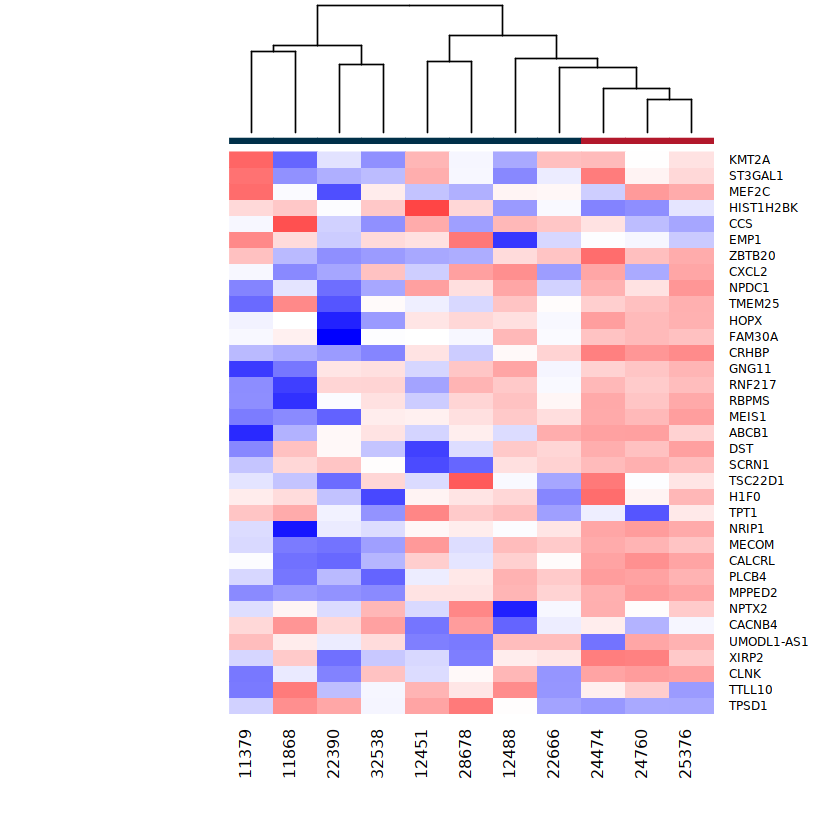

In [96]:
#plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
#                          genelist=TabS3_vanGal_T_Hl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
#                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
#                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_VG_TumorStemLike", colid="Patient.ID")
#plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
#                          genelist=TabS3_vanGal_T_Hl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
#                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
#                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_VG_TumorStemLike", colid="Patient.ID")
###
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_vanGal_T_Hl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_VG_TumorStemLike_02092022", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

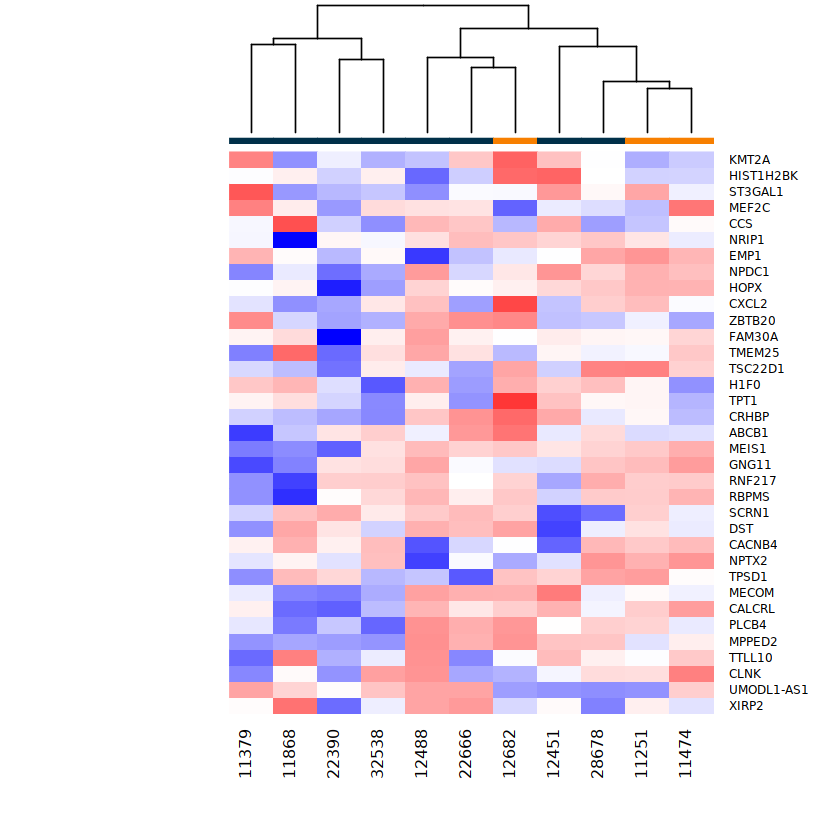

In [75]:
###
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_vanGal_T_Hl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsAdultAML_VG_TumorStemLike_02092022", colid="Patient.ID")


In [40]:
lcpm <- cpm(gNormedFilteredDgeList, log=TRUE)
lcpm.prog <- cpm(gNormedFilteredDgeList.prog, log=TRUE)
lcpm.stem <- cpm(gNormedFilteredDgeList.stem, log=TRUE)
dim(lcpm)
dim(lcpm[rownames(lcpm) %in% "ENSG00000004468",,drop=FALSE])

CD38.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000004468",,drop=FALSE]))
CD38.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000004468",,drop=FALSE]))
CD38.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000004468",,drop=FALSE]))
lcpm.prog

[1] 12685    32

[1]  1 32

,02id38cellPROGENITORS,06id90cellPROGENITORS,04id78cellPROGENITORS,06id00066PRO,01x00077xPROGENIT,03x11379xHPCxxxxx,05x00047xPLUSPLUS,06x00077xPLUSPLUS,07x00023xPLUSPLUS,09x00020xPLUSPLUS,11x00082xPLUSPLUS,14x12488xPLUSPLUS,15x12584xPLUSPLUS,17x12451xPLUSPLUS,18x10720xPLUSPLUS,02pid24760ctHPC,04pid24474ctHPC,06pid25376ctHPC
ENSG00000000419,6.0478762,6.4126740,5.5469482,5.6493940,5.542919270,5.637034,5.890632,5.9068209,4.881729,5.9625510,6.4840081,5.9888332,5.8016882,5.8551251,5.845981,5.5868508,6.08714732,5.8884368
ENSG00000000457,3.3889755,2.3913157,2.8526217,4.5964329,3.745567793,4.170629,3.166816,4.1425876,3.189715,4.2837021,2.0225962,3.0265632,2.4336117,5.1272652,4.285744,4.4518442,1.80056569,3.5163338
ENSG00000000460,4.2957664,4.0513146,4.5833942,4.7015361,4.798015498,4.832173,5.121241,4.9669016,3.414098,2.9279799,2.1932206,4.6498235,3.6288963,2.2841361,5.209977,4.9068022,4.06737525,5.1695589
ENSG00000000938,3.7431196,3.1155995,2.2963818,2.9270208,0.750704106,3.261590,3.561064,2.4328330,2.273617,3.1791456,-0.8500234,1.7035756,2.1374359,2.9197600,2.337693,2.3819489,0.18241738,1.4528248
ENSG00000000971,1.9943761,0.5099768,3.1686702,-1.7064590,2.651440402,-1.707092,2.772611,4.2863927,3.384661,3.4328417,-1.1637268,6.4726254,-4.3872608,-1.5384686,3.599776,3.1815236,3.69855815,5.0774069
ENSG00000001036,6.9511831,6.9759265,6.5451918,5.8305139,6.835709423,3.012845,5.862160,5.7635246,5.501938,5.9754465,6.0805785,6.2074612,6.4995239,7.2841648,5.923879,5.5821660,5.99491351,5.9553655
ENSG00000001084,5.2873870,4.9207160,4.4502357,5.4915664,4.031928241,4.807759,5.252212,6.1439006,4.172849,5.4444436,4.9493550,5.7363692,4.2612583,5.8423057,5.937225,6.0878080,5.53597079,5.6903329
ENSG00000001167,5.7625995,4.6564112,5.8374203,6.3811754,6.029603769,6.231082,5.931753,5.5066506,5.376754,4.9246266,6.3013161,5.1843037,5.7797077,4.4917395,6.090458,6.1603551,4.71154699,5.8956033
ENSG00000001460,3.1313443,1.5224084,3.3083132,3.3288295,3.632738321,3.328083,2.516901,3.5034060,3.021741,0.2430480,1.1068459,3.0702213,0.1291082,1.7496619,3.254994,3.1954706,1.48993329,2.9252695
ENSG00000001461,5.3493152,4.0435410,5.7339083,6.4131474,5.789931874,6.088573,4.815009,5.9127120,5.375770,4.3754189,3.0076657,5.1084763,3.7007281,4.9129109,5.792839,5.7732183,4.64541281,5.5541743


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

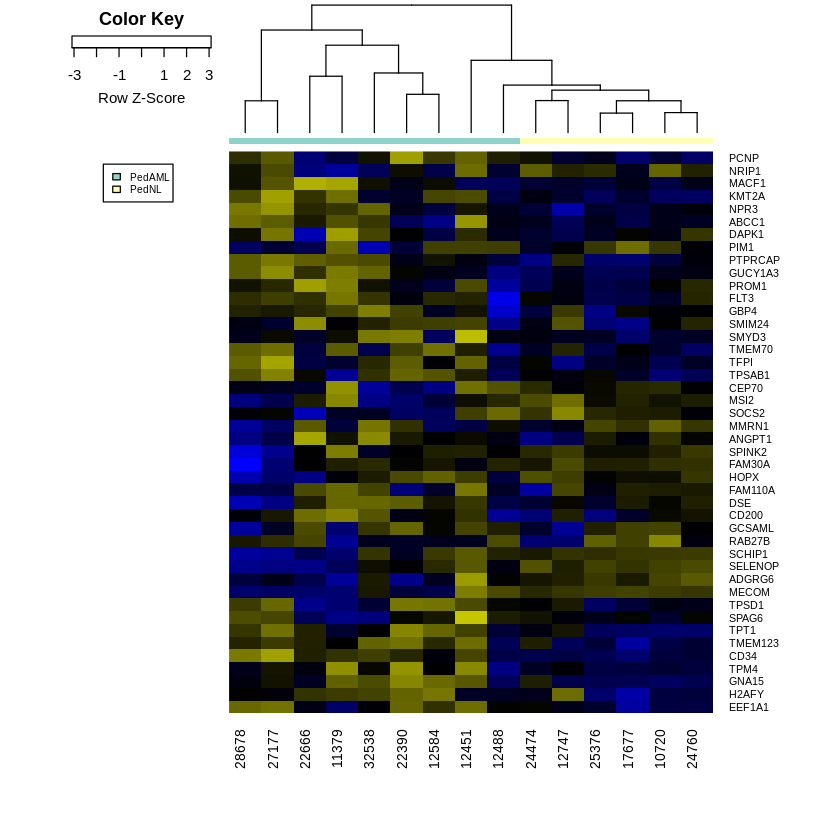

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

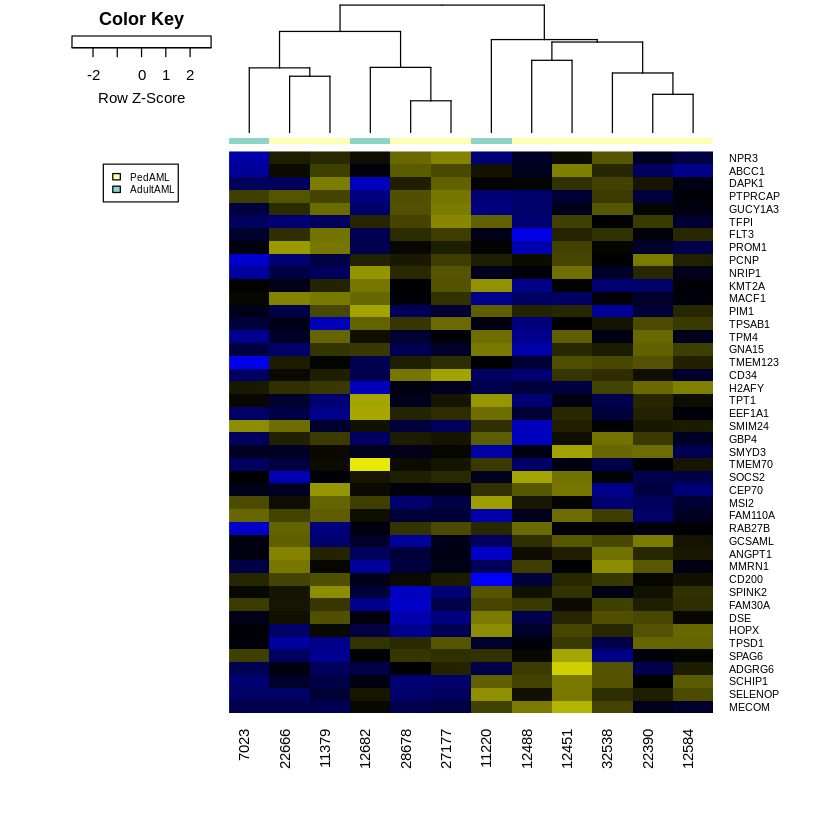

png 
  2

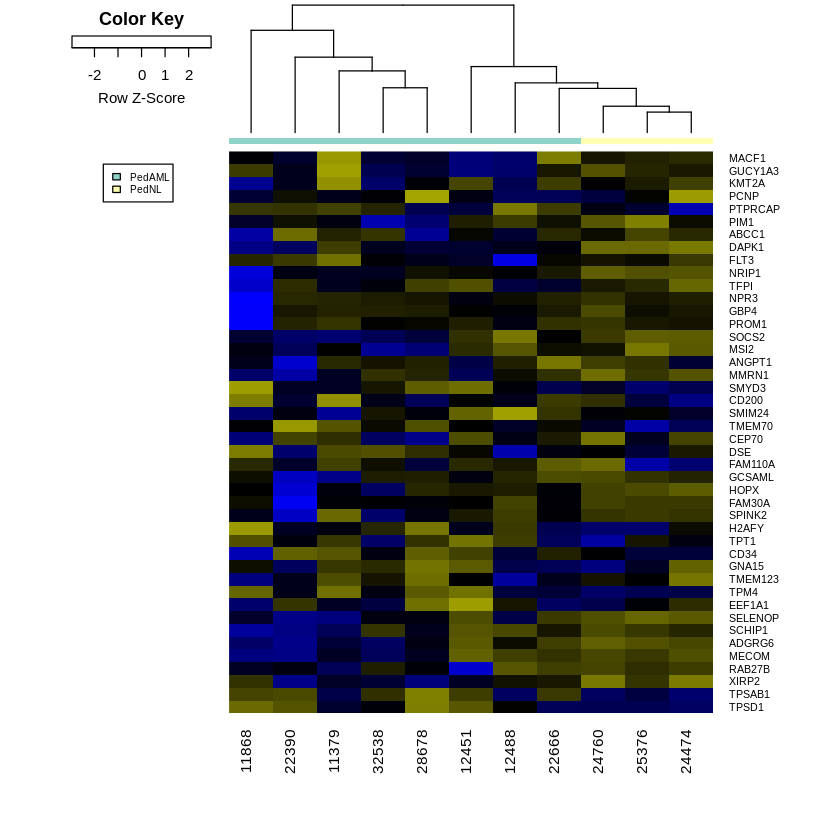

In [178]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_vanGal_T_HPl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_VG_TumorStemProgLike", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_vanGal_T_HPl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_VG_TumorStemProgLike", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_vanGal_T_HPl[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_VG_TumorStemProgLike", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

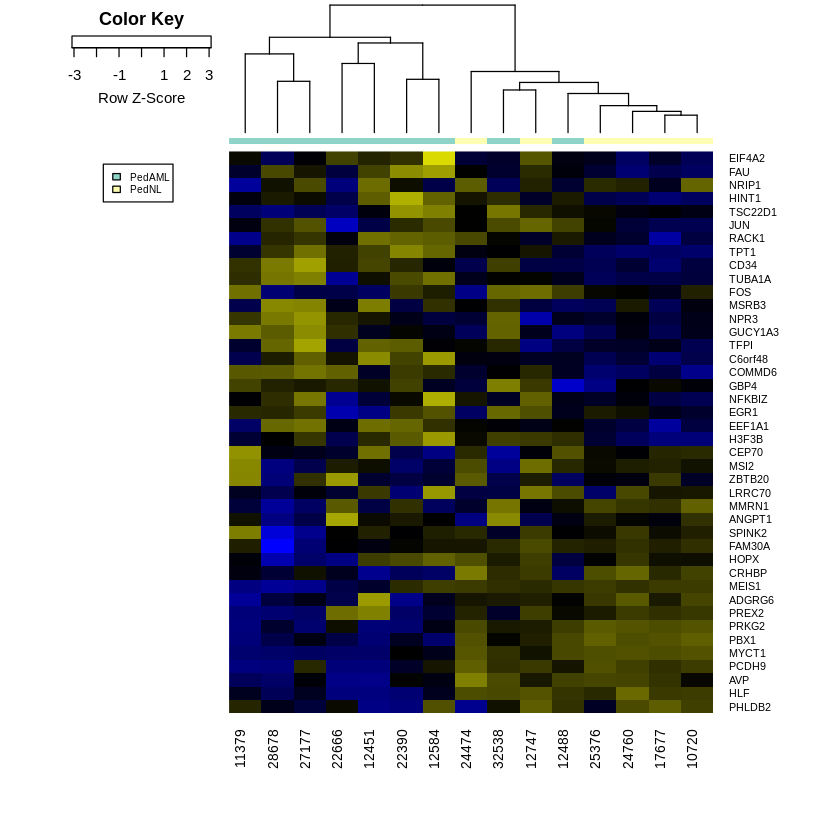

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

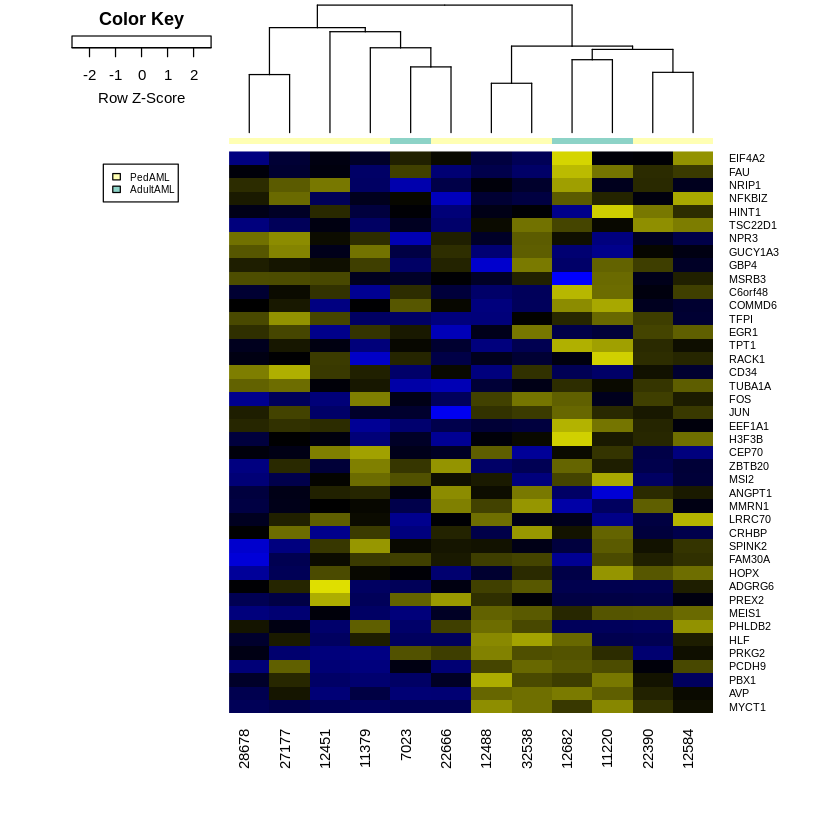

png 
  2

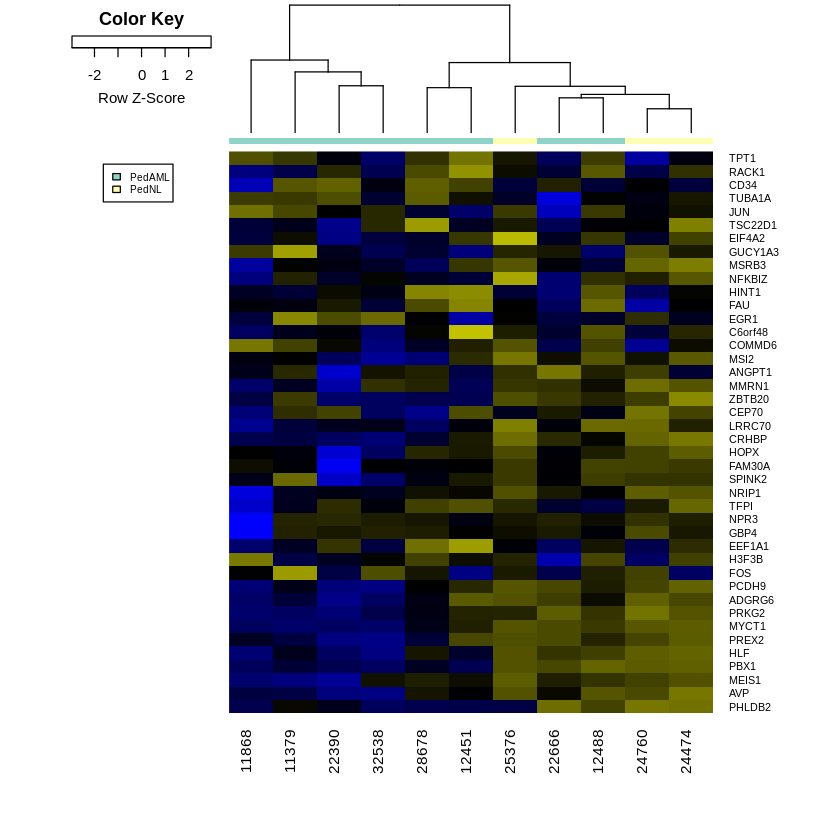

In [179]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_vanGal_N_H_P[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_VG_NormalStemProg", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_vanGal_N_H_P[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_VG_NormalStemProg", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_vanGal_N_H_P[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_VG_NormalStemProg", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

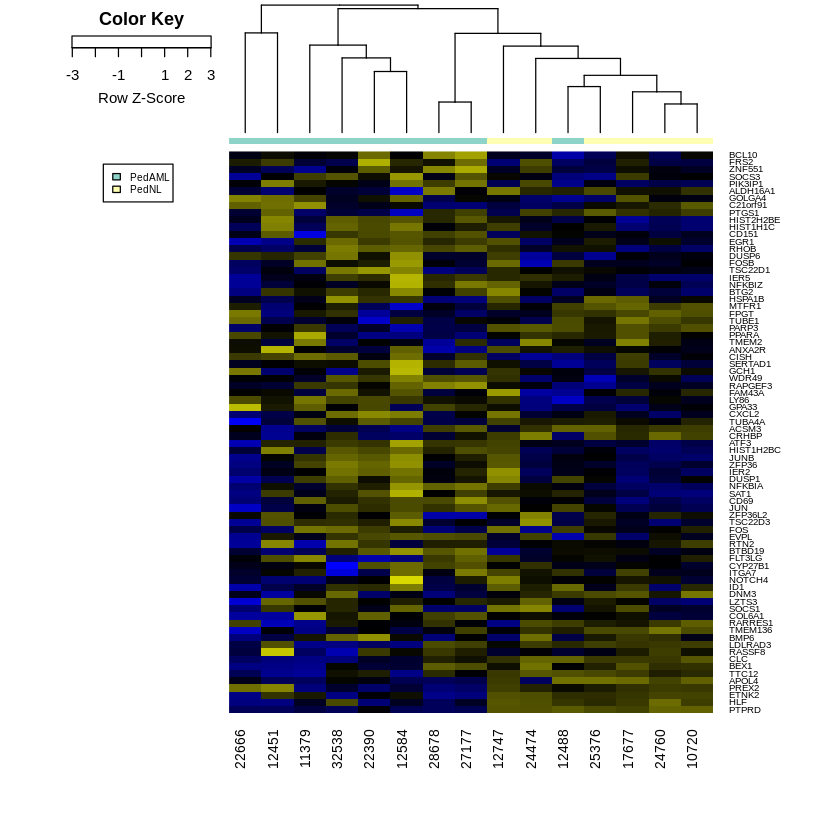

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

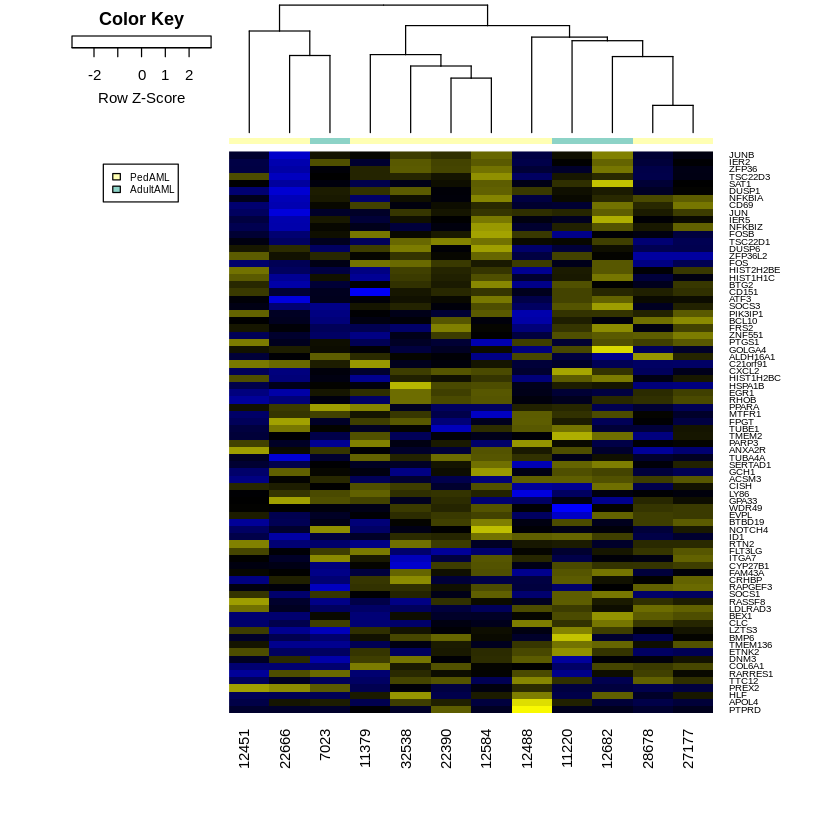

png 
  2

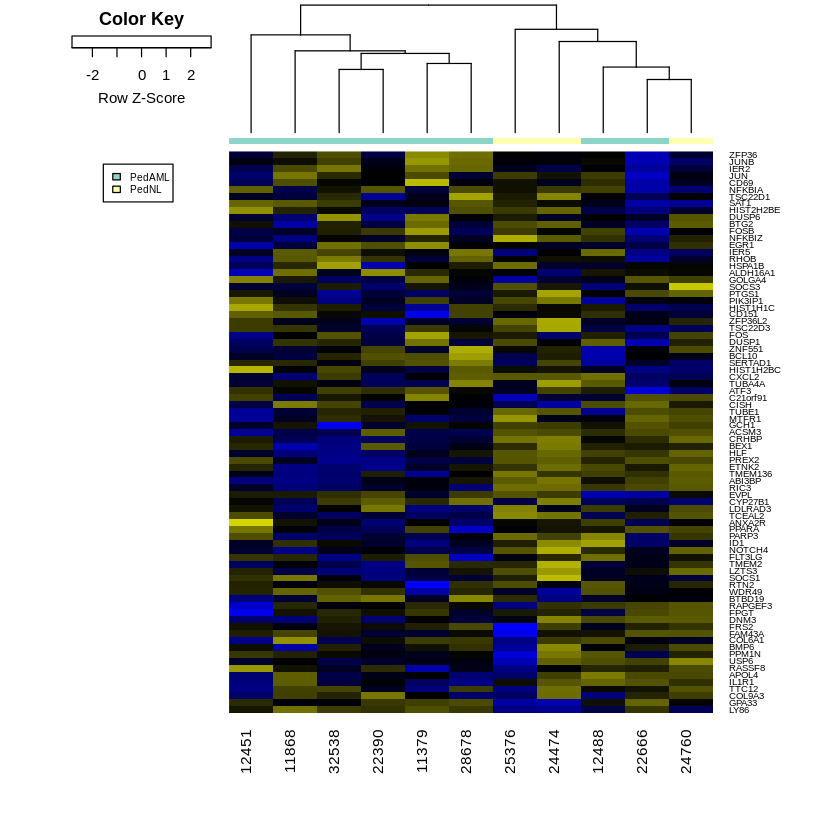

In [180]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_Crews_HSC[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_LC_HSC", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_Crews_HSC[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_LC_HSC", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_Crews_HSC[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_LC_HSC", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

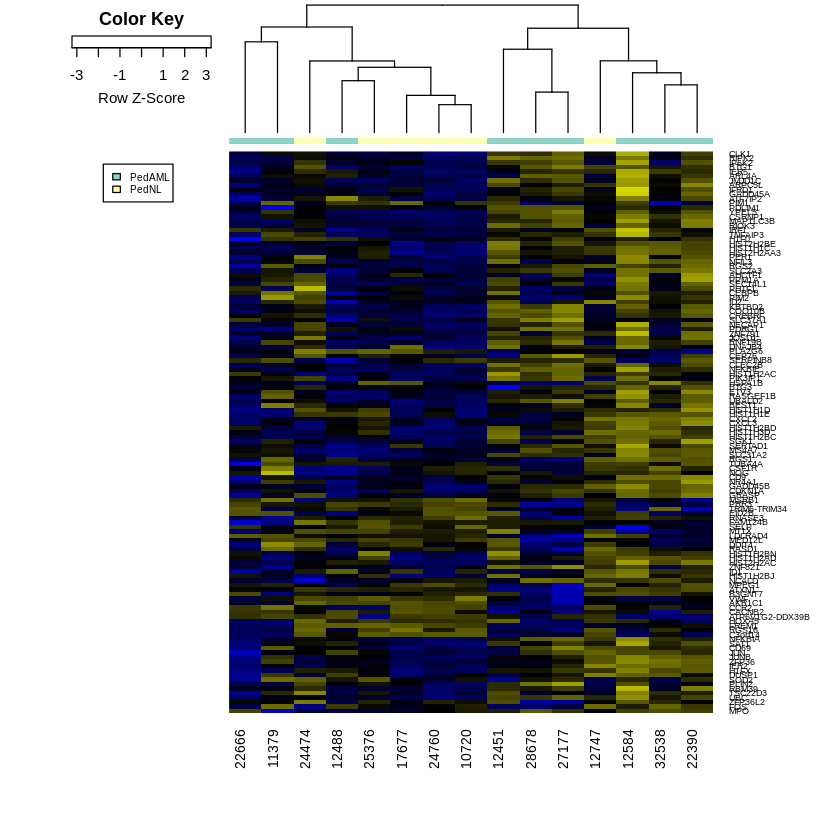

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

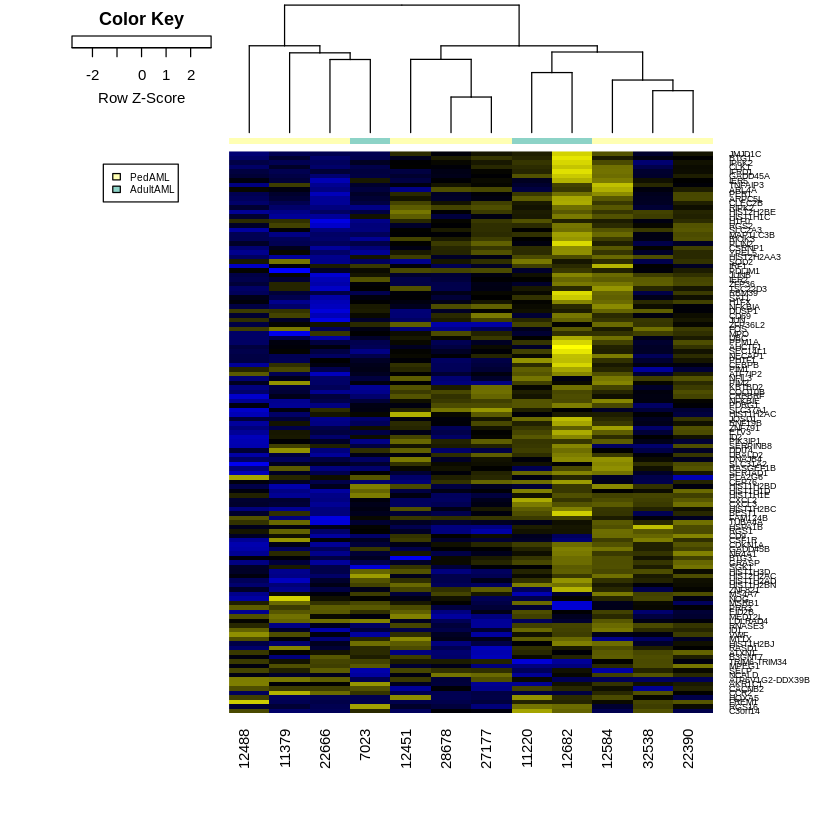

png 
  2

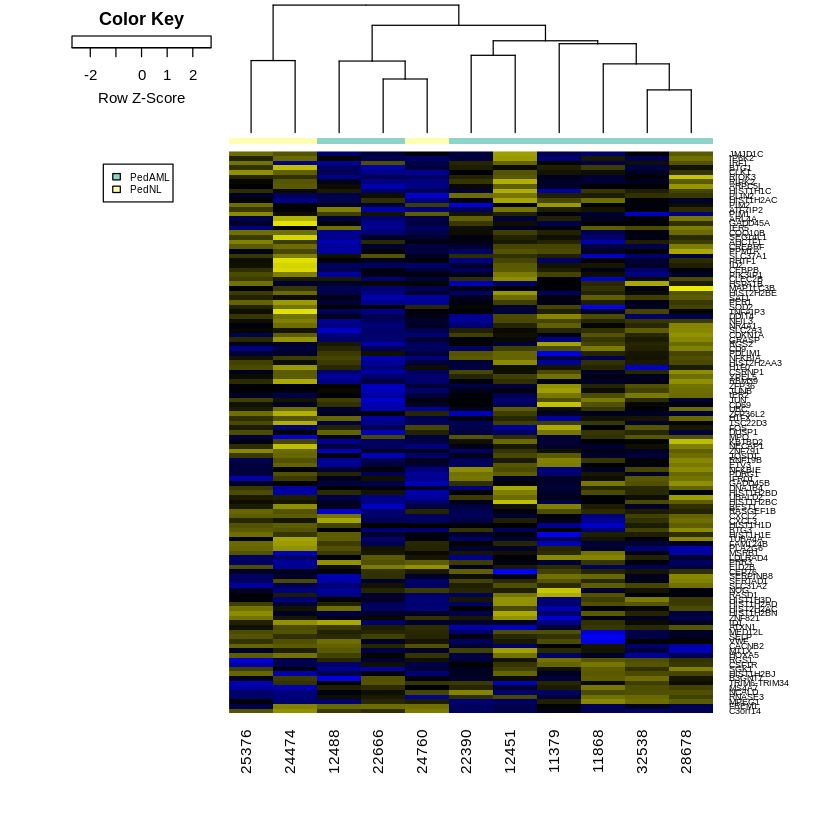

In [181]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_Crews_HPC[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_LC_HPC", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TabS3_Crews_HPC[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_LC_HPC", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=TabS3_Crews_HPC[,1], geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_LC_HPC", colid="Patient.ID")


In [49]:
table(topTable_PedAMLvsAdultAML_Prog$SYMBOL %in% TabS3_Crews_HPC[,1], topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.1 )
table(topTable_PedAMLvsPedNL_Prog$SYMBOL %in% TabS3_Crews_HPC[,1], topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.1 )
table(topTable_PedAMLvsPedNL_Stem$SYMBOL %in% TabS3_Crews_HSC[,1] , topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.1)
sigTabS3_Crews_HPC <- topTable_PedAMLvsAdultAML_Prog[as.character(topTable_PedAMLvsAdultAML_Prog$SYMBOL)
                                                                          %in% TabS3_Crews_HPC[,1] & 
                                                            topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.1,]
sigTabS3_Crews_HPC2 <- topTable_PedAMLvsAdultAML_Prog[as.character(topTable_PedAMLvsPedNL_Prog$SYMBOL)
                                                                          %in% TabS3_Crews_HPC[,1] & 
                                                            topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.1,]
sigTabS3_Crews_HSC <- topTable_PedAMLvsPedNL_Stem[as.character(topTable_PedAMLvsPedNL_Stem$SYMBOL) 
                                                                       %in% TabS3_Crews_HSC[,1] & 
                                                            topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.1,]
sigTabS3_Crews_HPCbarinp <- topTable_PedAMLvsAdultAML_Prog[as.character(topTable_PedAMLvsAdultAML_Prog$SYMBOL)
                                                                          %in% TabS3_Crews_HPC[,1] ,]
sigTabS3_Crews_HPCbarinp2 <- topTable_PedAMLvsPedNL_Prog[as.character(topTable_PedAMLvsPedNL_Prog$SYMBOL)
                                                                          %in% TabS3_Crews_HPC[,1] ,]

sigTabS3_Crews_HSCbarinp <- topTable_PedAMLvsPedNL_Stem[as.character(topTable_PedAMLvsPedNL_Stem$SYMBOL) 
                                                                       %in% TabS3_Crews_HSC[,1] ,]
dim(sigTabS3_Crews_HPCbarinp)
dim(sigTabS3_Crews_HPCbarinp2)
dim(sigTabS3_Crews_HSCbarinp)
sigTabS3_Crews_HPCbarinp$SYMBOL <- as.character(sigTabS3_Crews_HPCbarinp$SYMBOL)
sigTabS3_Crews_HPCbarinp2$SYMBOL <- as.character(sigTabS3_Crews_HPCbarinp2$SYMBOL)
sigTabS3_Crews_HSCbarinp$SYMBOL <- as.character(sigTabS3_Crews_HSCbarinp$SYMBOL)
sigTabS3_Crews_HPCbarinp <- sigTabS3_Crews_HPCbarinp[order(sigTabS3_Crews_HPCbarinp$logFC, decreasing=TRUE),]
sigTabS3_Crews_HPCbarinp2 <- sigTabS3_Crews_HPCbarinp2[order(sigTabS3_Crews_HPCbarinp2$logFC, decreasing=TRUE),]
sigTabS3_Crews_HSCbarinp <- sigTabS3_Crews_HSCbarinp[order(sigTabS3_Crews_HSCbarinp$logFC, decreasing=TRUE),]
#png(file="PedAMLvsAdultAML_Crews_HPCgenesexprBarPlot_Prog_10122020.png", width=9, height=6, units='in', res=300)
#ggbarplot(data = sigTabS3_Crews_HPCbarinp, x="SYMBOL", y="logFC", fill="black") + 
#    theme_bw(base_size=16) + ylab("Log(Fold Change)") + xlab("") + 
#    labs(title="CD34+CD38+Lin- HPC Leukemia Associated Genes Expression") +
#    theme(panel.grid.major = element_blank()) +
#    theme(axis.text.x = element_blank())
#dev.off()

#png(file="PedAMLvsPedNL_Crews_HPCgenesexprBarPlot_Prog_10222020.png", width=9, height=6, units='in', res=300)
#ggbarplot(data = sigTabS3_Crews_HPCbarinp2, x="SYMBOL", y="logFC", fill="black") + 
#    theme_bw(base_size=16) + ylab("Log(Fold Change)") + xlab("") + 
#    labs(title="CD34+CD38+Lin- HPC Leukemia Associated Genes Expression") +
#    theme(panel.grid.major = element_blank()) +
#    theme(axis.text.x = element_blank())
#dev.off()

#png(file="PedAMLvsPedNL_Crews_HSCgenesexprBarplot_Stem_10122020.png", width=9, height=6, units='in', res=300)
#ggbarplot(data = sigTabS3_Crews_HSCbarinp, x="SYMBOL", y="logFC", fill="black") + 
#    theme_bw(base_size=16) + ylab("Log(Fold Change)") + xlab("") + 
#    labs(title="CD34+CD38-Lin- HSC Leukemia Associated Genes Expression") +
#    theme(panel.grid.major = element_blank()) +
#    theme(axis.text.x = element_blank())
#dev.off()

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'table' in selecting a method for function '%in%': object 'TabS3_Crews_HPC' not found


In [48]:
library(ggpubr)
library(reshape2)
Crews_HPC.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% sigTabS3_Crews_HPC$ENSEMBL,,drop=FALSE]))
Crews_HPC.lcpm.prog2 <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% sigTabS3_Crews_HPC2$ENSEMBL,,drop=FALSE]))
Crews_HSC.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                       t(lcpm.stem[rownames(lcpm.stem) %in% sigTabS3_Crews_HSC$ENSEMBL,,drop=FALSE]))
#dim(Crews_HPC.lcpm.prog)
#dim(Crews_HSC.lcpm.stem)
#colnames(Crews_HPC.lcpm.prog)
#colnames(Crews_HSC.lcpm.stem)
colnames(Crews_HPC.lcpm.prog)[18:20] <- as.character(sigTabS3_Crews_HPC$SYMBOL)[match(colnames(Crews_HPC.lcpm.prog)[18:20],
                                                                       sigTabS3_Crews_HPC$ENSEMBL)] 
colnames(Crews_HPC.lcpm.prog2)[18:28] <- as.character(sigTabS3_Crews_HPC2$SYMBOL)[match(colnames(Crews_HPC.lcpm.prog2)[18:28],
                                                                       sigTabS3_Crews_HPC2$ENSEMBL)] 
colnames(Crews_HSC.lcpm.stem)[18:28] <- as.character(sigTabS3_Crews_HSC$SYMBOL)[match(colnames(Crews_HSC.lcpm.stem)[18:28],
                                                                       sigTabS3_Crews_HSC$ENSEMBL)]

#colnames(Crews_HPC.lcpm.prog)
#colnames(Crews_HSC.lcpm.stem)
Crews_HPC.lcpm.prog.m <- melt(Crews_HPC.lcpm.prog[,-c(2:17)])
Crews_HPC.lcpm.prog.m2 <- melt(Crews_HPC.lcpm.prog2[,-c(2:17)])
Crews_HSC.lcpm.stem.m <- melt(Crews_HSC.lcpm.stem[,-c(2:17)])
Crews_HSC.lcpm.stem.m$value[Crews_HSC.lcpm.stem.m$value < 0] <- 0
Crews_HPC.lcpm.prog.m$value[Crews_HPC.lcpm.prog.m$value < 0] <- 0
Crews_HPC.lcpm.prog.m2$value[Crews_HPC.lcpm.prog.m2$value < 0] <- 0
Crews_HSC.lcpm.stem.m.filt <- Crews_HSC.lcpm.stem.m[Crews_HSC.lcpm.stem.m$group %in% c("PedAML", "PedNL"),]
Crews_HPC.lcpm.prog.m.filt <- Crews_HPC.lcpm.prog.m[Crews_HPC.lcpm.prog.m$group %in% c("PedAML", "AdultAML"),]
Crews_HPC.lcpm.prog.m.filt2 <- Crews_HPC.lcpm.prog.m2[Crews_HPC.lcpm.prog.m2$group %in% c("PedAML", "PedNL"),]
Crews_HPC.lcpm.prog.m.filt$group <- factor(as.character(Crews_HPC.lcpm.prog.m.filt$group))
Crews_HSC.lcpm.stem.m.filt$group <- factor(as.character(Crews_HSC.lcpm.stem.m.filt$group))
Crews_HPC.lcpm.prog.m.filt2$group <- factor(as.character(Crews_HPC.lcpm.prog.m.filt2$group))


#head(Crews_HPC.lcpm.prog.m)
#head(Crews_HSC.lcpm.stem.m)
                         #c("#A2C0E5", "#657991", "#C4C7C9")                                         
#png(file="PedAMLvsAdultAML_Crews_HPCgenesexpr_Prog_10122020.png", width=9, height=6, units='in', res=300)
ggboxplot(Crews_HPC.lcpm.prog.m.filt, x="variable", y="value", fill="group", add=c("jitter"), palette=c( "#A2C0E5", "#657991")) +
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(-0.1,12) + xlab("") +
    labs(title="CD34+CD38+Lin- HPC Leukemia Associated Genes Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
    #stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML", label.y=9) 
#dev.off()


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 't': object 'lcpm.prog' not found


[1] 18 28

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,⋯,SRSF3,LPAR6,RPS2,BDP1,RARS2,VSIG4,SLC38A10,CDCA7L,ZNF385C,COX3
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,⋯,9.153395,3.695755,10.541818,5.633718,5.043155,3.8419926,8.089669,7.174527,1.604594,10.18012
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,⋯,9.133825,4.238402,11.192171,6.142186,5.078794,3.8021384,7.002814,6.342839,2.689875,11.58872
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,⋯,8.801767,4.548237,11.164222,6.025312,5.006407,2.1474887,8.338626,7.332760,3.004888,10.27329
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,⋯,8.843278,3.590531,10.441294,6.250354,5.047941,-2.2714191,7.958528,7.334053,3.951028,11.56532
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,⋯,8.635491,6.050361,10.882864,6.543886,5.285910,-1.6890677,8.277609,6.495393,2.382559,11.53186
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,⋯,9.194024,5.024774,9.600739,6.214044,4.845064,1.0523446,7.679251,7.098775,-1.805889,11.18865
05x00047xPLUSPLUS,PedNL,36940541,1.0731430,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,05x00047xPLUSPLUS,47 PlPl,12747,9.8,PedNL,⋯,9.782180,5.519349,10.848567,5.632246,4.731639,0.2528638,7.710309,7.081257,3.406083,11.15491
06x00077xPLUSPLUS,PedNL,62232722,1.3090993,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,06x00077xPLUSPLUS,77 PlPl,17677,9.6,PedNL,⋯,8.911217,3.545864,10.191266,6.197871,4.836381,-2.4915253,7.097160,6.375958,2.046229,10.93442
07x00023xPLUSPLUS,AdultAML,33543583,1.0523582,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,07x00023xPLUSPLUS,23 PlPl,7023,8.2,AdultAML,⋯,9.423345,6.416452,11.264474,6.821020,4.491787,-7.3872606,6.918839,6.089517,3.144786,13.92695


Using group as id variables
Using group as id variables
Using group as id variables
Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (geom_point).”

png 
  2

png 
  2

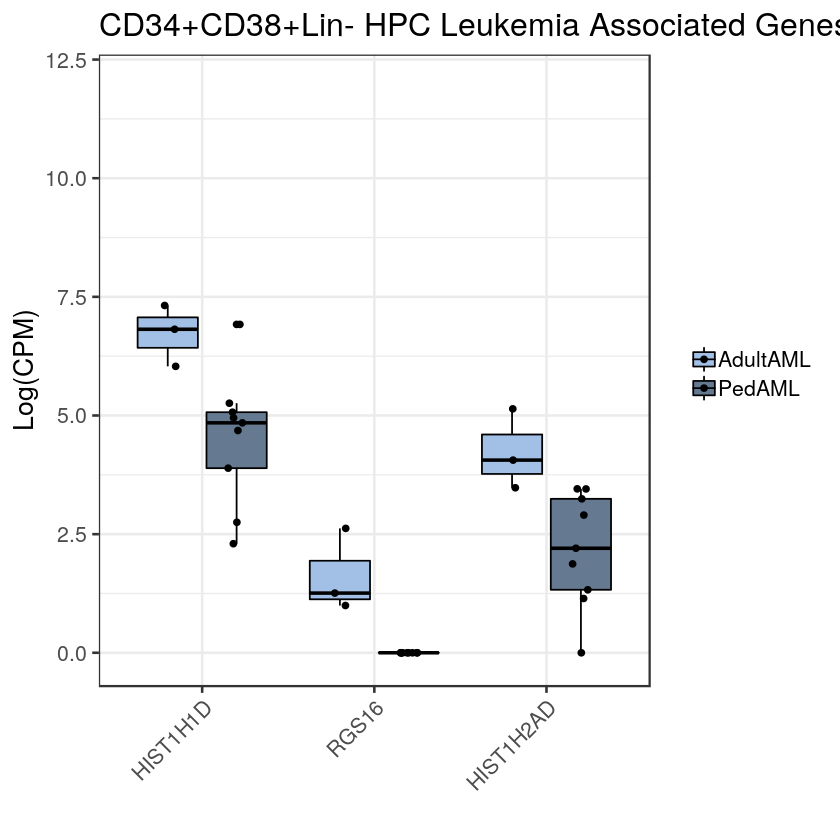

In [91]:
library(ggpubr)
library(reshape2)
Crews_HPC.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% sigTabS3_Crews_HPC$ENSEMBL,,drop=FALSE]))
Crews_HPC.lcpm.prog2 <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% sigTabS3_Crews_HPC2$ENSEMBL,,drop=FALSE]))
Crews_HSC.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                       t(lcpm.stem[rownames(lcpm.stem) %in% sigTabS3_Crews_HSC$ENSEMBL,,drop=FALSE]))
#dim(Crews_HPC.lcpm.prog)
#dim(Crews_HSC.lcpm.stem)
#colnames(Crews_HPC.lcpm.prog)
#colnames(Crews_HSC.lcpm.stem)
colnames(Crews_HPC.lcpm.prog)[18:20] <- as.character(sigTabS3_Crews_HPC$SYMBOL)[match(colnames(Crews_HPC.lcpm.prog)[18:20],
                                                                       sigTabS3_Crews_HPC$ENSEMBL)] 
colnames(Crews_HPC.lcpm.prog2)[18:28] <- as.character(sigTabS3_Crews_HPC2$SYMBOL)[match(colnames(Crews_HPC.lcpm.prog2)[18:28],
                                                                       sigTabS3_Crews_HPC2$ENSEMBL)] 
colnames(Crews_HSC.lcpm.stem)[18:28] <- as.character(sigTabS3_Crews_HSC$SYMBOL)[match(colnames(Crews_HSC.lcpm.stem)[18:28],
                                                                       sigTabS3_Crews_HSC$ENSEMBL)]

#colnames(Crews_HPC.lcpm.prog)
#colnames(Crews_HSC.lcpm.stem)
Crews_HPC.lcpm.prog.m <- melt(Crews_HPC.lcpm.prog[,-c(2:17)])
Crews_HPC.lcpm.prog.m2 <- melt(Crews_HPC.lcpm.prog2[,-c(2:17)])
Crews_HSC.lcpm.stem.m <- melt(Crews_HSC.lcpm.stem[,-c(2:17)])
Crews_HSC.lcpm.stem.m$value[Crews_HSC.lcpm.stem.m$value < 0] <- 0
Crews_HPC.lcpm.prog.m$value[Crews_HPC.lcpm.prog.m$value < 0] <- 0
Crews_HPC.lcpm.prog.m2$value[Crews_HPC.lcpm.prog.m2$value < 0] <- 0
Crews_HSC.lcpm.stem.m.filt <- Crews_HSC.lcpm.stem.m[Crews_HSC.lcpm.stem.m$group %in% c("PedAML", "PedNL"),]
Crews_HPC.lcpm.prog.m.filt <- Crews_HPC.lcpm.prog.m[Crews_HPC.lcpm.prog.m$group %in% c("PedAML", "AdultAML"),]
Crews_HPC.lcpm.prog.m.filt2 <- Crews_HPC.lcpm.prog.m2[Crews_HPC.lcpm.prog.m2$group %in% c("PedAML", "PedNL"),]
Crews_HPC.lcpm.prog.m.filt$group <- factor(as.character(Crews_HPC.lcpm.prog.m.filt$group))
Crews_HSC.lcpm.stem.m.filt$group <- factor(as.character(Crews_HSC.lcpm.stem.m.filt$group))
Crews_HPC.lcpm.prog.m.filt2$group <- factor(as.character(Crews_HPC.lcpm.prog.m.filt2$group))


#head(Crews_HPC.lcpm.prog.m)
#head(Crews_HSC.lcpm.stem.m)
                         #c("#A2C0E5", "#657991", "#C4C7C9")                                         
#png(file="PedAMLvsAdultAML_Crews_HPCgenesexpr_Prog_10122020.png", width=9, height=6, units='in', res=300)
ggboxplot(Crews_HPC.lcpm.prog.m.filt, x="variable", y="value", fill="group", add=c("jitter"), palette=c( "#A2C0E5", "#657991")) +
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(-0.1,12) + xlab("") +
    labs(title="CD34+CD38+Lin- HPC Leukemia Associated Genes Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
    #stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML", label.y=9) 
#dev.off()

png(file="PedAMLvsPedNL_Crews_HPCgenesexpr_Prog_10222020.png", width=9, height=6, units='in', res=300)
ggboxplot(Crews_HPC.lcpm.prog.m.filt2, x="variable", y="value", fill="group", add=c("jitter"), palette=c( "#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(-0.1,12) + xlab("") +
    labs(title="CD34+CD38+Lin- HPC Leukemia Associated Genes Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
    #stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML", label.y=9) 
dev.off()

png(file="PedAMLvsPedNL_Crews_HSCgenesexpr_Stem_10222020.png", width=9, height=6, units='in', res=300)
ggboxplot(Crews_HSC.lcpm.stem.m.filt, x="variable", y="value", fill="group", add=c("jitter"), palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(-0.1,14.5) + xlab("") +
    labs(title="CD34+CD38-Lin- HSC Leukemia Associated Genes Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
    #stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML", label.y=9) 
dev.off()


In [147]:
PedAMLvsPedNL.stem.ret_int_top100 <- read.csv(file="../outputs/PedAMLvsPedNL.stem.ret_int_diffsplice_top100genes.csv")
PedAMLvsPedNL.prog.ret_int_top100 <- read.csv(file="../outputs/PedAMLvsPedNL.prog.ret_int_diffsplice_top100genes.csv")
PedAMLvsPedNL.stem.skip_ex_top100 <- read.csv(file="../outputs/PedAMLvsPedNL.stem.skip_ex_diffsplice_top100genes.csv")
PedAMLvsPedNL.prog.skip_ex_top100 <- read.csv(file="../outputs/PedAMLvsPedNL.prog.skip_ex_diffsplice_top100genes.csv")
head(PedAMLvsPedNL.stem.ret_int_top100)

ID,GeneID,geneSymbol,chr,strand,riExonStart_0base,riExonEnd,upstreamES,upstreamEE,downstreamES,⋯,SJC_SAMPLE_1,IJC_SAMPLE_2,SJC_SAMPLE_2,IncFormLen,SkipFormLen,PValue,FDR,IncLevel1,IncLevel2,IncLevelDifference
<int>,<fct>,<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,⋯,<fct>,<fct>,<fct>,<int>,<int>,<dbl>,<dbl>,<fct>,<fct>,<dbl>
5544,ENSG00000100911,PSME2,chr14,-,24145709,24146240,24145709,24145896,24146207,⋯,"0,0,0","8,2,6,0,15,33,6,4,11","16,1,21,5,1,14,3,7,2",411,100,3.905254e-11,7.591070e-09,"1.0,1.0,1.0","0.108,0.327,0.065,0.0,0.785,0.364,0.327,0.122,0.572",0.703
55,ENSG00000100225,FBXO7,chr22,+,32487744,32493281,32487744,32487828,32493104,⋯,"0,5,0","49,58,20,11,117,31,54,39,60","1,12,53,24,76,101,12,160,7",5376,100,1.137589e-04,1.853617e-03,"1.0,0.236,1.0","0.477,0.082,0.007,0.008,0.028,0.006,0.077,0.005,0.138",0.653
4316,ENSG00000061273,HDAC7,chr12,-,47791870,47792669,47791870,47792004,47792537,⋯,"0,0,0","12,5,4,7,9,4,1,2,18","7,2,0,0,13,8,24,1,3",633,100,1.276756e-13,5.790800e-11,"1.0,1.0,1.0","0.213,0.283,1.0,1.0,0.099,0.073,0.007,0.24,0.487",0.622
3613,ENSG00000130714,POMT1,chr9,+,131509902,131510415,131509902,131509996,131510259,⋯,"90,0,0","27,0,24,8,10,13,6,3,14","65,3,40,48,66,12,30,43,62",363,100,1.106646e-04,1.825314e-03,"0.076,1.0,1.0","0.103,0.0,0.142,0.044,0.04,0.23,0.052,0.019,0.059",0.615
264,ENSG00000130734,ATG4D,chr19,+,10546838,10547253,10546838,10547115,10547188,⋯,"40,1,0","25,10,31,9,192,13,74,6,14","105,17,31,54,493,76,131,37,51",173,100,1.599931e-04,2.492716e-03,"0.233,0.935,1.0","0.121,0.254,0.366,0.088,0.184,0.09,0.246,0.086,0.137",0.548
2093,ENSG00000054148,PHPT1,chr9,+,136850012,136850560,136850012,136850137,136850505,⋯,"11,0,0","80,27,71,23,63,63,25,49,51","53,31,40,11,23,42,4,28,90",468,100,5.076749e-05,9.507752e-04,"0.391,1.0,1.0","0.244,0.157,0.275,0.309,0.369,0.243,0.572,0.272,0.108",0.514


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

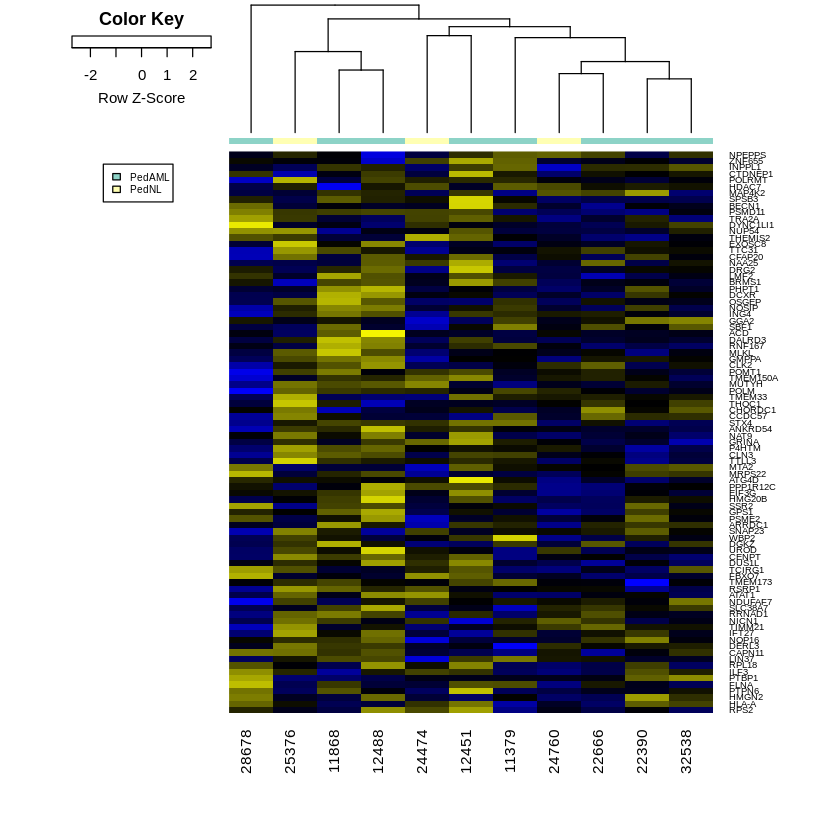

png 
  2

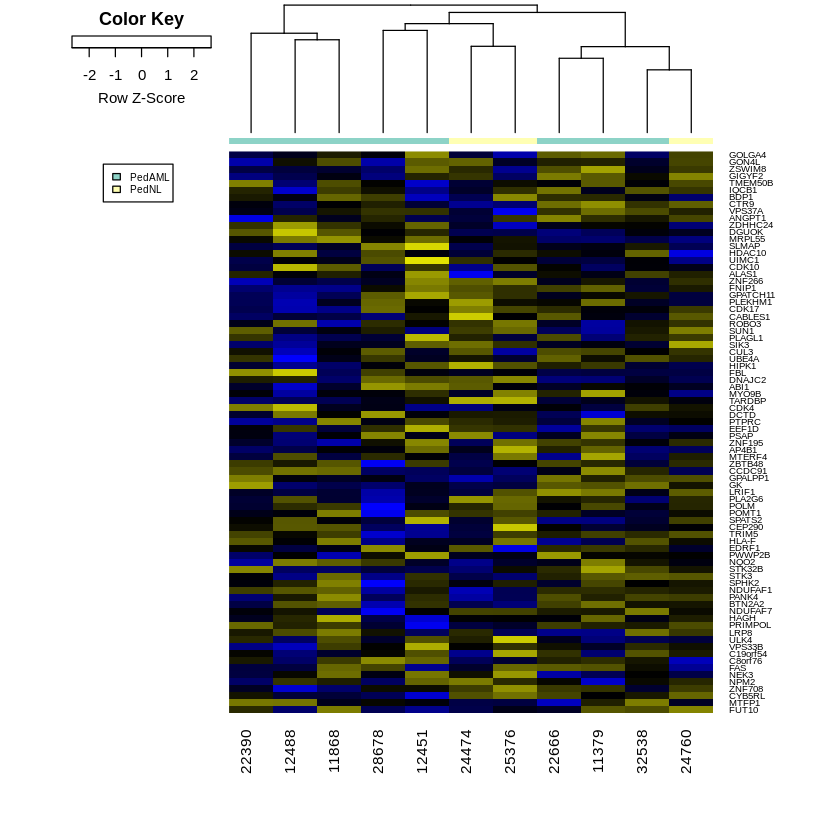

In [152]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=PedAMLvsPedNL.stem.ret_int_top100$geneSymbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_top100_ret_int", colid="Patient.ID")

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=PedAMLvsPedNL.stem.skip_ex_top100$geneSymbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_top100_skip_ex", colid="Patient.ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

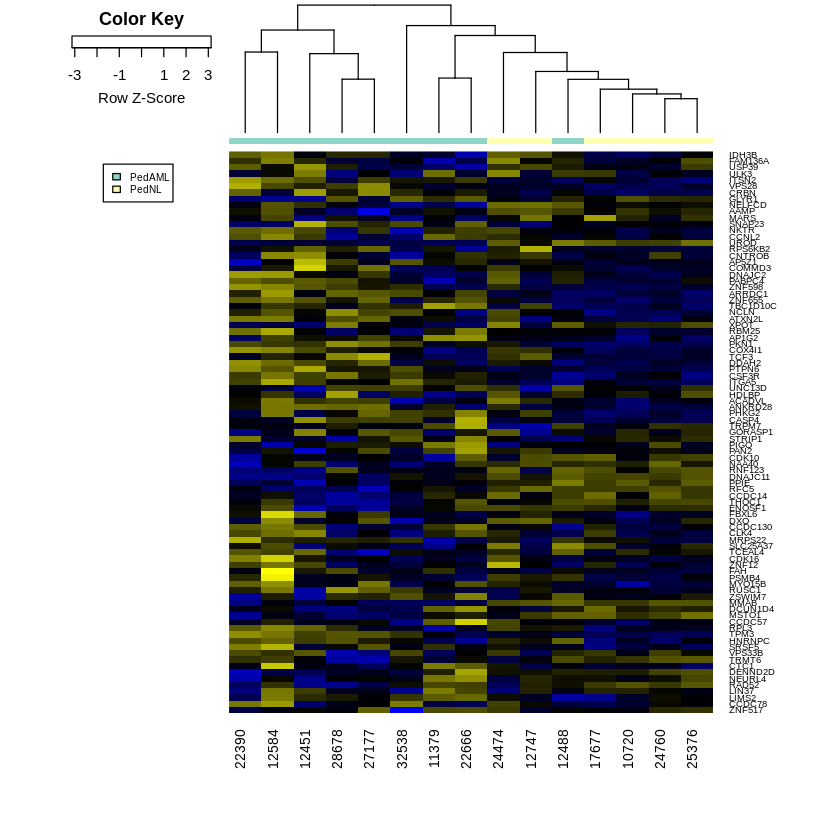

png 
  2

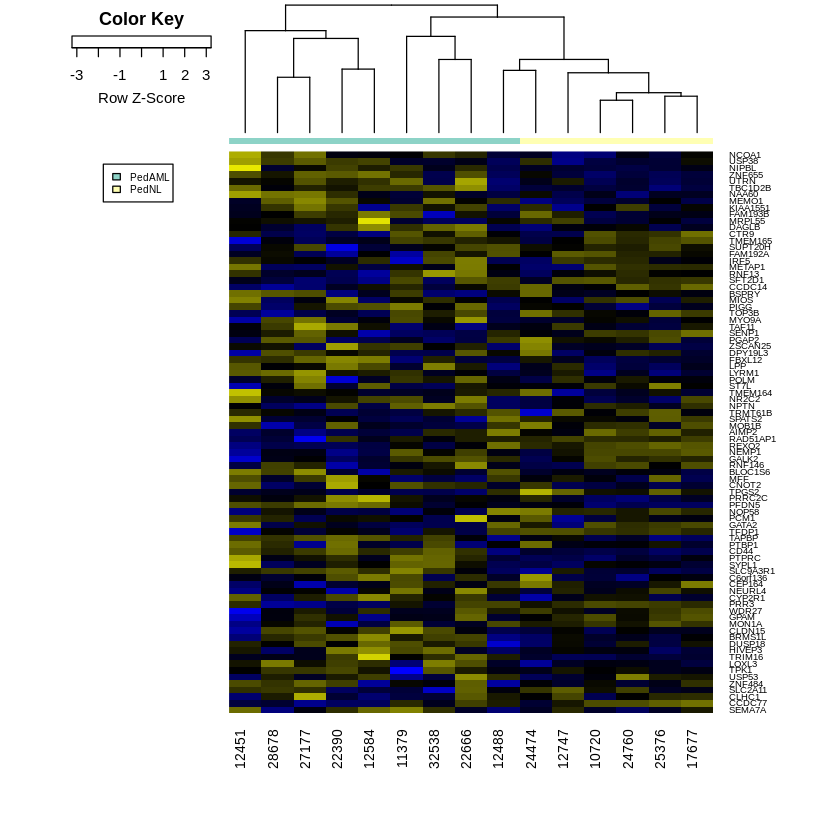

In [153]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=PedAMLvsPedNL.prog.ret_int_top100$geneSymbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_top100_ret_int", colid="Patient.ID")

plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=PedAMLvsPedNL.prog.skip_ex_top100$geneSymbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_top100_skip_ex", colid="Patient.ID")


In [81]:
load("../../msigdb/human_c2_v5p2.rdata")
load("../../msigdb/human_c4_v5p2.rdata")
load("../../msigdb/human_c5_v5p2.rdata")
load("../../msigdb/human_c6_v5p2.rdata")
load("../../msigdb/human_H_v5p2.rdata")
library(SPIA)
library(WebGestaltR)
library(pathview)
library(GSVA)
library(GSEABase)
library(GSVAdata)
library(Biobase)
library(genefilter)
data(c2BroadSets)

comps <- list(c("CP", "BC", 0))
tissues <- list("PB")
#class(get(paste("topTable", comps[[1]][1], comps[[1]][2], "PB", sep=".")))

ENS2EG <- toTable(org.Hs.egENSEMBL2EG)
EG2SYM <- toTable(org.Hs.egSYMBOL2EG)
ENS2EG2SYM <- data.frame(gene_id=ENS2EG$gene_id, ens_id=ENS2EG, 
                         SYM=EG2SYM[match(ENS2EG$gene_id,EG2SYM$gene_id),"symbol"])

Warning message in readChar(con, 5L, useBytes = TRUE):
“cannot open compressed file '../../msigdb/human_c2_v5p2.rdata', probable reason 'No such file or directory'”


ERROR: Error in readChar(con, 5L, useBytes = TRUE): cannot open the connection


In [82]:
class(Hs.c2)
head(names(Hs.c2))
head(Hs.c2[[1]])
tmp <- lapply(Hs.c2, function(x) grep("7091", x))
w <- which(unlist(lapply(tmp, length)) == 1)
names(Hs.c2[w])
wnt.paths <- names(Hs.c2)[grep("WNT", names(Hs.c2))]
wnt.canon.path <- wnt.paths[c(grep("^REACTOME|^BIOCARTA|^KEGG|^PID", wnt.paths))]
wnt.canon.path
wnt.canon.path.Hs.c2 <- Hs.c2[names(Hs.c2) %in% wnt.canon.path]
length(wnt.canon.path.Hs.c2)
wnt.uni.df <- data.frame(geneid=unique(unlist(wnt.canon.path.Hs.c2)))
unlist(lapply(wnt.canon.path.Hs.c2, length))
head(wnt.canon.path.Hs.c2[[1]])
class(wnt.uni.df)
#lapply(telo.canon.path.Hs.c2, function(x) {
#    EG2SYM[match(x, EG2SYM$gene_id), ]
#})
wnt.uni.df$symbol <- EG2SYM[match(wnt.uni.df$geneid, EG2SYM$gene_id), "symbol"]
wnt.uni.df$ens <- ENS2EG2SYM[match(wnt.uni.df$geneid, ENS2EG2SYM$ens_id.gene_id), "ens_id.ensembl_id"]
dim(wnt.uni.df)
#wnt.uni.df
    
bcat.paths <- names(Hs.c2)[grep("CATENIN", names(Hs.c2))]
bcat.canon.path <- bcat.paths[c(grep("^REACTOME|^BIOCARTA|^KEGG|^PID", bcat.paths))] 

bcat.canon.path
bcat.canon.path.Hs.c2 <- Hs.c2[names(Hs.c2) %in% bcat.canon.path]
length(bcat.canon.path.Hs.c2)
bcat.uni.df <- data.frame(geneid=unique(unlist(bcat.canon.path.Hs.c2)))
#lapply(telo.canon.path.Hs.c2, function(x) {
#    EG2SYM[match(x, EG2SYM$gene_id), ]
#})
bcat.uni.df$symbol <- EG2SYM[match(bcat.uni.df$geneid, EG2SYM$gene_id), "symbol"]
bcat.uni.df$ens <- ENS2EG2SYM[match(bcat.uni.df$geneid, ENS2EG2SYM$ens_id.gene_id), "ens_id.ensembl_id"]
dim(bcat.uni.df)
bcat.uni.df[grep("TLE4", bcat.uni.df$symbol),]
bcat.uni.df

wnt_bcat.uni.df <- as.data.frame(rbind(wnt.uni.df, bcat.uni.df))
colnames(wnt_bcat.uni.df) <- c("wnt_bcat_geneid", "wnt_bcat_symbol", "wnt_bcat_ens")
dim(wnt_bcat.uni.df)
head(wnt_bcat.uni.df)
write.table(wnt_bcat.uni.df, file="Wnt_bcat_genes.txt", sep="\t", row.names=FALSE, quote=FALSE)
#save(telo.canon.path.Hs.c2, file="telo.canon.path.Hs.c2.rda")
    


ERROR: Error in eval(expr, envir, enclos): object 'Hs.c2' not found


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

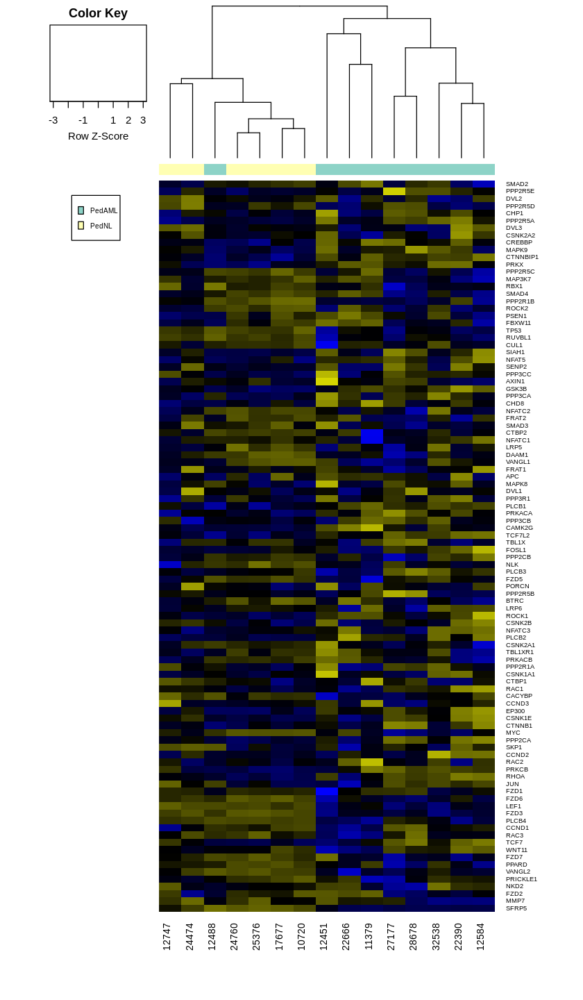

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

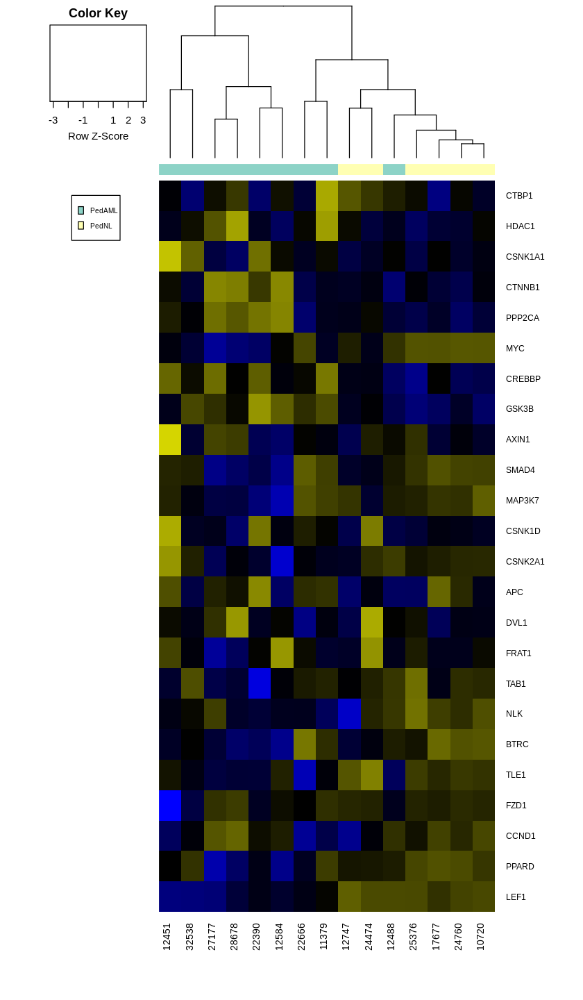

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

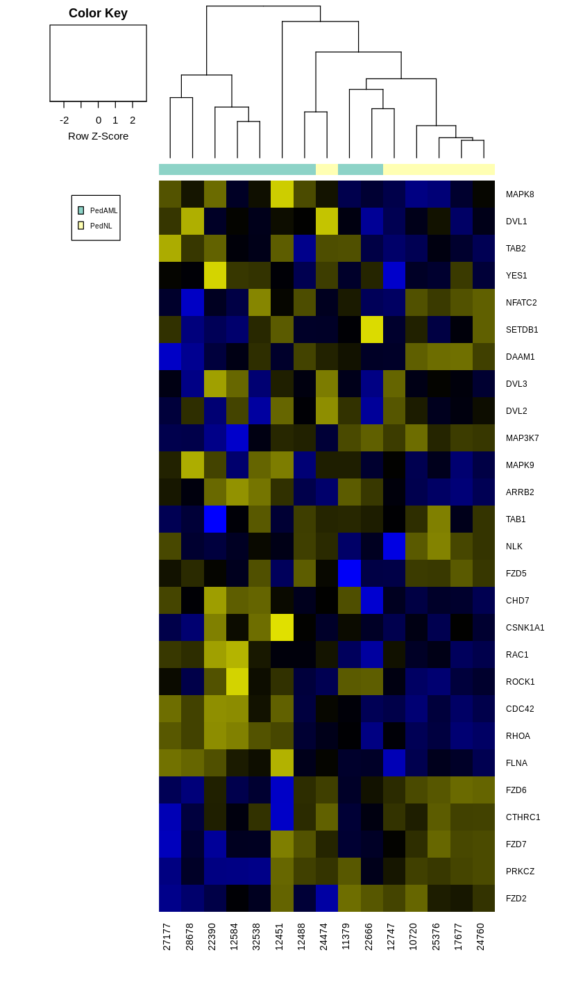

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

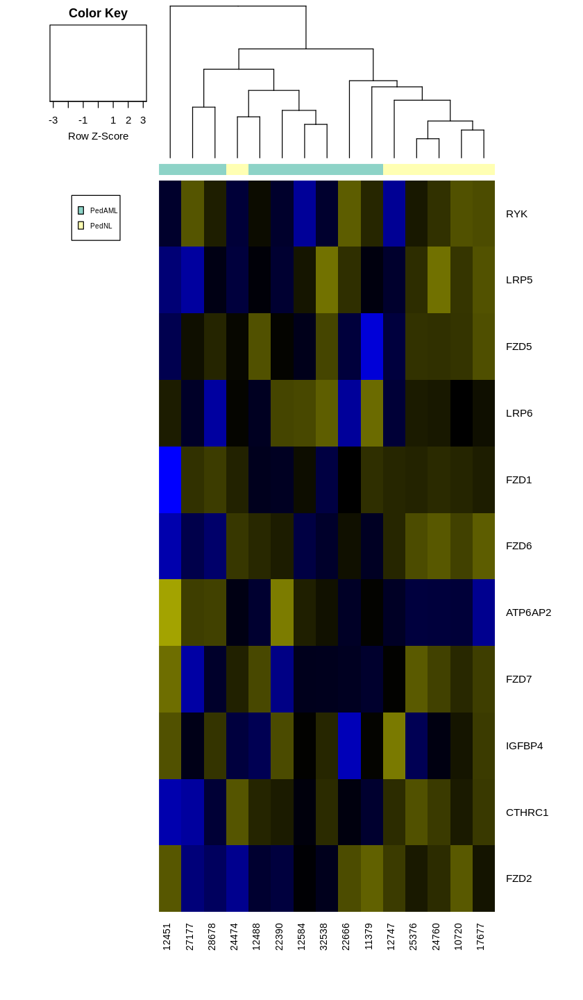

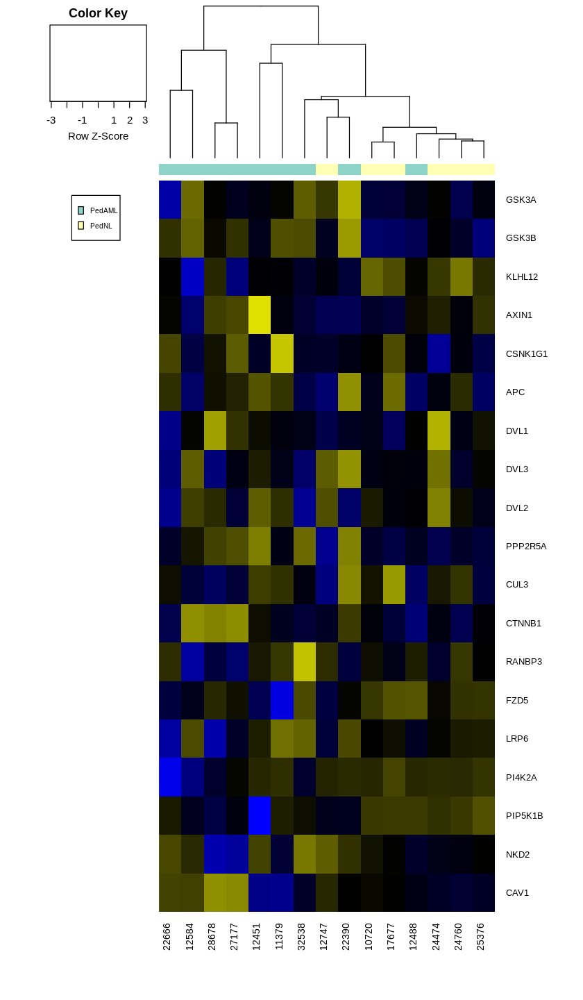

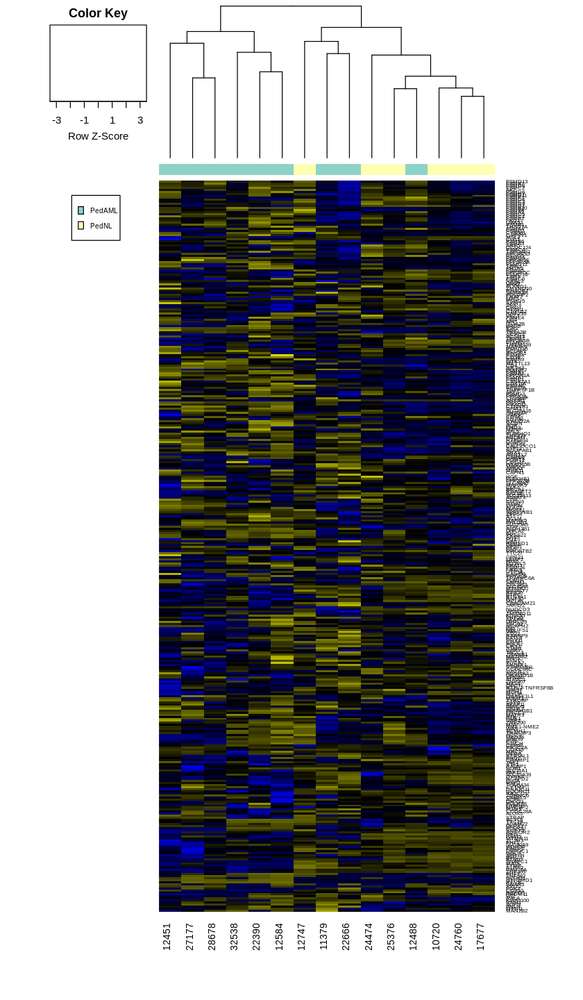

In [209]:
wnt.canon.path.sym <- lapply(wnt.canon.path.Hs.c2, function(x) EG2SYM[match(x, EG2SYM$gene_id), "symbol"])
for (i in 1:length(wnt.canon.path.sym)) {
    plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                              genelist=wnt.canon.path.sym[[i]], geneNaId="SYMBOL", outputDir=gOutputDir,
                              metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                              fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_", wnt.canon.path[i]), 
                              colid="Patient.ID")
}

In [ ]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=wnt.uni.df$symbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_WNTsigpath", colid="Patient.ID")

In [35]:
mapk.paths <- names(Hs.c2)[grep("MAPK", names(Hs.c2))]
mapk.canon.path <- mapk.paths[c(grep("^KEGG", mapk.paths))]
mapk.canon.path
mapk.canon.path.Hs.c2 <- Hs.c2[names(Hs.c2) %in% mapk.canon.path]
length(mapk.canon.path.Hs.c2)
mapk.uni.df <- data.frame(geneid=unique(unlist(mapk.canon.path.Hs.c2)))
unlist(lapply(mapk.canon.path.Hs.c2, length))
head(mapk.canon.path.Hs.c2[[1]])
class(mapk.uni.df)

mapk.uni.df$symbol <- EG2SYM[match(mapk.uni.df$geneid, EG2SYM$gene_id), "symbol"]
mapk.uni.df$ens <- ENS2EG2SYM[match(mapk.uni.df$geneid, ENS2EG2SYM$ens_id.gene_id), "ens_id.ensembl_id"]
dim(mapk.uni.df)
    
TGF.paths <- names(Hs.c2)[grep("TGF", names(Hs.c2))]
TGF.canon.path <- TGF.paths[c(grep("^KEGG", TGF.paths))] 

TGF.canon.path
TGF.canon.path.Hs.c2 <- Hs.c2[names(Hs.c2) %in% TGF.canon.path]
length(TGF.canon.path.Hs.c2)
TGF.uni.df <- data.frame(geneid=unique(unlist(TGF.canon.path.Hs.c2)))

TGF.uni.df$symbol <- EG2SYM[match(TGF.uni.df$geneid, EG2SYM$gene_id), "symbol"]
TGF.uni.df$ens <- ENS2EG2SYM[match(TGF.uni.df$geneid, ENS2EG2SYM$ens_id.gene_id), "ens_id.ensembl_id"]
dim(TGF.uni.df)

CC.paths <- names(Hs.c2)[grep("CELL_CYCLE", names(Hs.c2))]
CC.canon.path <- CC.paths[c(grep("^KEGG", CC.paths))] 

CC.canon.path
CC.canon.path.Hs.c2 <- Hs.c2[names(Hs.c2) %in% CC.canon.path]
length(CC.canon.path.Hs.c2)
CC.uni.df <- data.frame(geneid=unique(unlist(CC.canon.path.Hs.c2)))

CC.uni.df$symbol <- EG2SYM[match(CC.uni.df$geneid, EG2SYM$gene_id), "symbol"]
CC.uni.df$ens <- ENS2EG2SYM[match(CC.uni.df$geneid, ENS2EG2SYM$ens_id.gene_id), "ens_id.ensembl_id"]
dim(CC.uni.df)

[1] "KEGG_MAPK_SIGNALING_PATHWAY"

[1] 1

KEGG_MAPK_SIGNALING_PATHWAY 
                        267

[1] "3725" "4208" "2005" "2002" "3727" "4616"

[1] "data.frame"

[1] 267   3

[1] "KEGG_TGF_BETA_SIGNALING_PATHWAY"

[1] 1

[1] 86  3

[1] "KEGG_CELL_CYCLE"

[1] 1

[1] 128   3

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

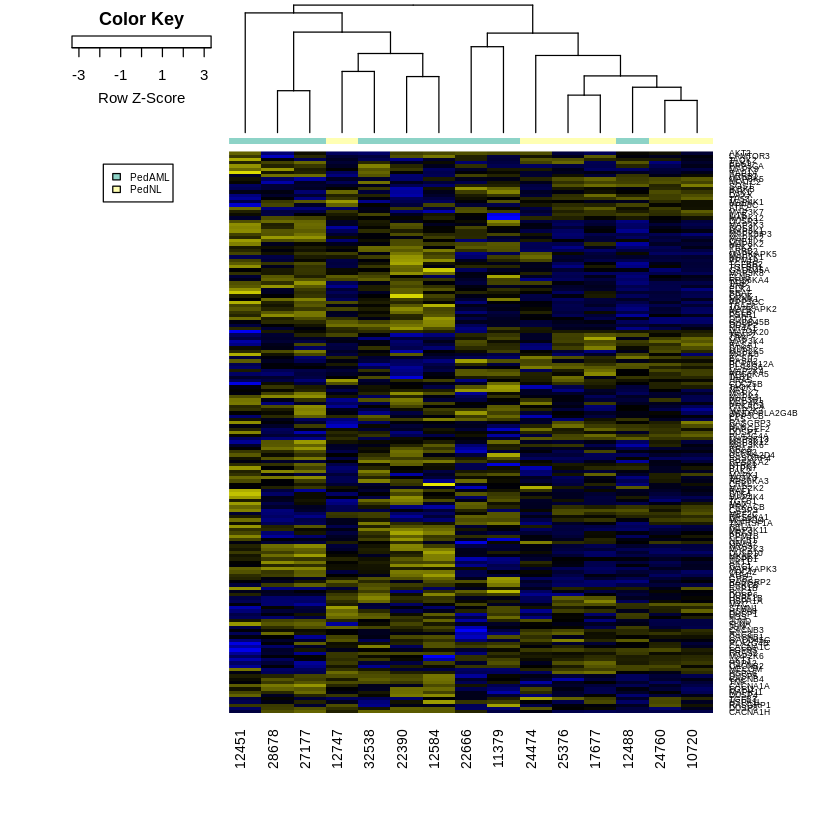

In [45]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=mapk.uni.df$symbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_MAPKsigpath", colid="Patient.ID")

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

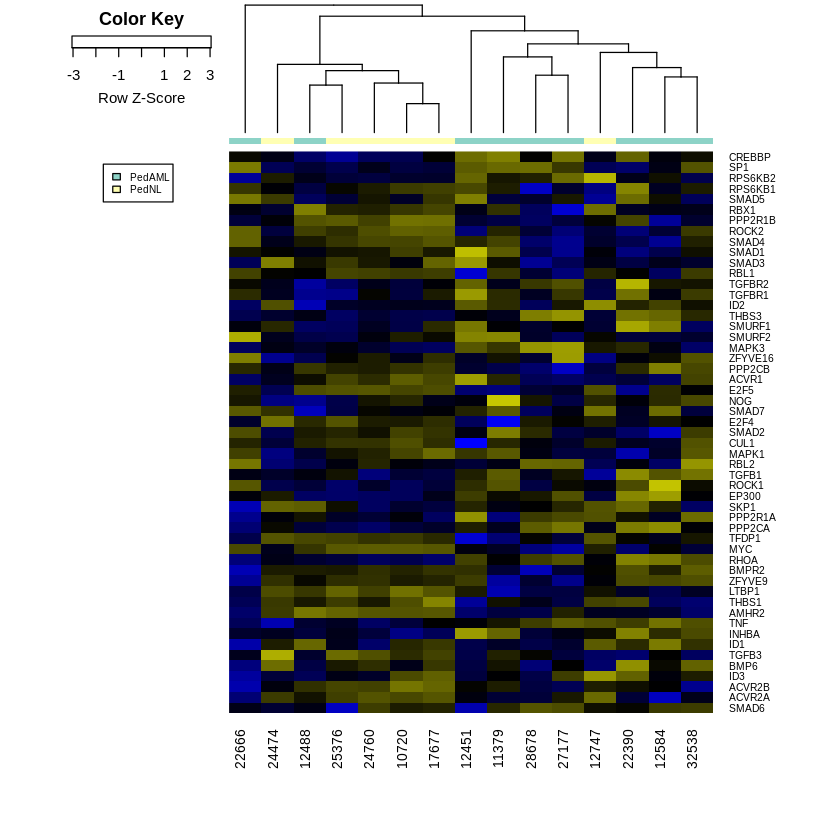

In [46]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TGF.uni.df$symbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_TGFbetasigpath", colid="Patient.ID")

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

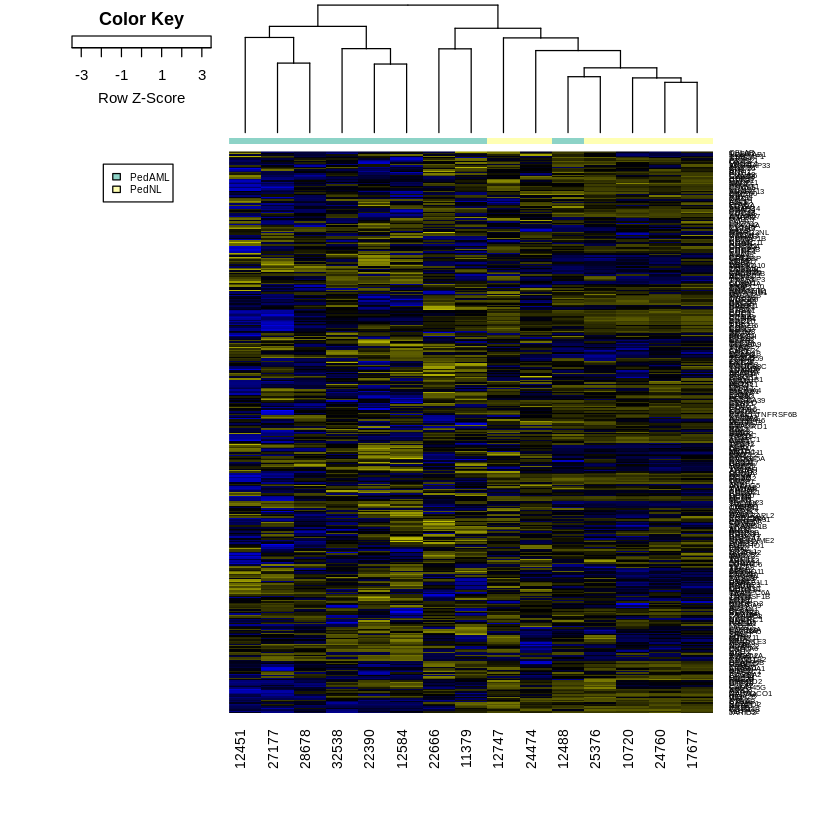

In [47]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=CC.uni.df$symbol, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_CellCyclesigpath", colid="Patient.ID")

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

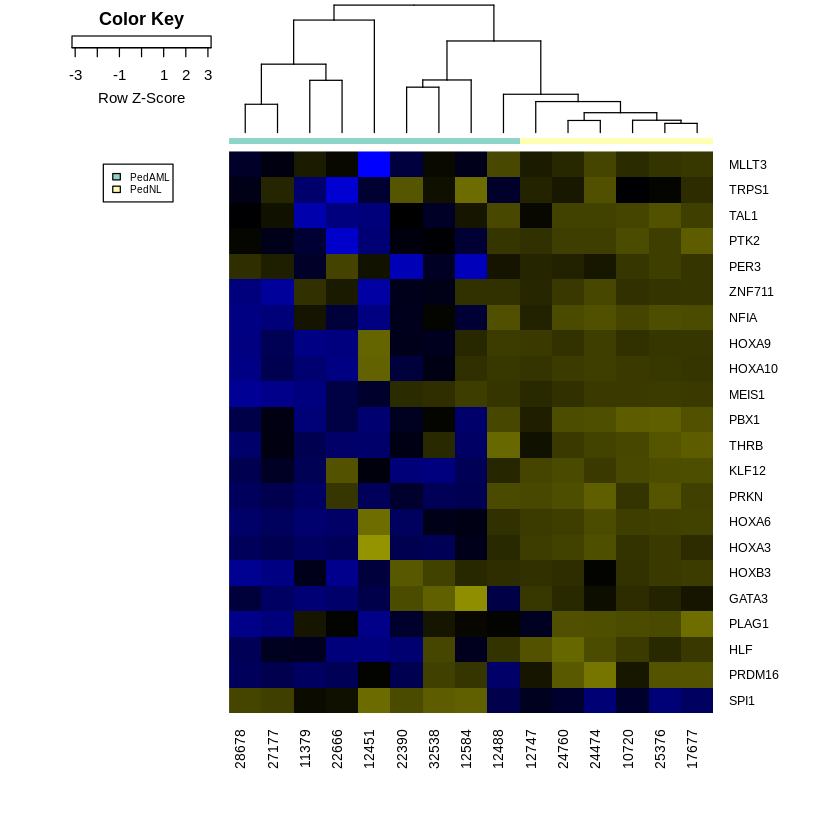

In [49]:
TxMisregCancer <- c("GATA3", "HLF", "HOXA3", "HOXA6", "HOXA9", "HOXA10", "HOXB3", "MEIS1", "NFIA", "PRKN", 
                    "PBX1", "PLAG1", "SPI1", "TAL1", "THRB", "TRPS1", "ZNF711", "PER3", "KLF12", "PRDM16", 
                    "NKX2-3", "FLT1", "PBX1", "PTK2", "MLLT3", "MEIS1")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=TxMisregCancer, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_TxMisregCancerpath", colid="Patient.ID")

In [36]:
canonicalC2BroadSets <- c2BroadSets[c(grep("^KEGG", names(c2BroadSets)),
                                      grep("^REACTOME", names(c2BroadSets)),
                                      grep("^BIOCARTA", names(c2BroadSets)))]

Splicing_c2_paths <- Hs.c2[grep("SPLIC", names(Hs.c2))]
Splicing_c5_paths <- Hs.c5[grep("SPLIC", names(Hs.c5))]
Splicing2_c2_paths <- as.list(canonicalC2BroadSets)[grep("SPLIC", names(canonicalC2BroadSets))]
names(Splicing_c2_paths)
names(Splicing2_c2_paths)

[1] "KEGG_SPLICEOSOME"                          
[2] "REACTOME_MRNA_SPLICING"                    
[3] "REACTOME_MRNA_SPLICING_MINOR_PATHWAY"      
[4] "ULE_SPLICING_VIA_NOVA2"                    
[5] "LEE_METASTASIS_AND_ALTERNATIVE_SPLICING_UP"
[6] "LEE_METASTASIS_AND_ALTERNATIVE_SPLICING_DN"

[1] "KEGG_SPLICEOSOME"                    
[2] "REACTOME_MRNA_SPLICING"              
[3] "REACTOME_MRNA_SPLICING_MINOR_PATHWAY"

In [37]:
head(Splicing_c2_paths[[1]])
table(Splicing_c2_paths[[1]] %in% topTable_PedAMLvsPedNL_Stem$ENTREZID)
table(Splicing_c2_paths[[1]] %in% topTable_PedAMLvsPedNL_Prog$ENTREZID)

KEGG_spl_genes_stem <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
                                                                   topTable_PedAMLvsPedNL_Stem$ENTREZID], ENS2EG2SYM$gene_id)]
KEGG_spl_genes_prog <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
                                                                   topTable_PedAMLvsPedNL_Prog$ENTREZID], ENS2EG2SYM$gene_id)]
KEGG_spl_genes_stem <- KEGG_spl_genes_stem[!is.na(KEGG_spl_genes_stem)]
KEGG_spl_genes_prog <- KEGG_spl_genes_prog[!is.na(KEGG_spl_genes_prog)]
length(KEGG_spl_genes_stem)
length(KEGG_spl_genes_prog)

[1] "9343"   "23658"  "10291"  "144983" "10992"  "27339"


FALSE  TRUE 
    7   121 


FALSE  TRUE 
    4   124 

[1] 121

[1] 124

[1] "9343"   "23658"  "10291"  "144983" "10992"  "27339"


FALSE  TRUE 
    7   121 


FALSE  TRUE 
    4   124 

[1] 121

[1] 124

[1] 656

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

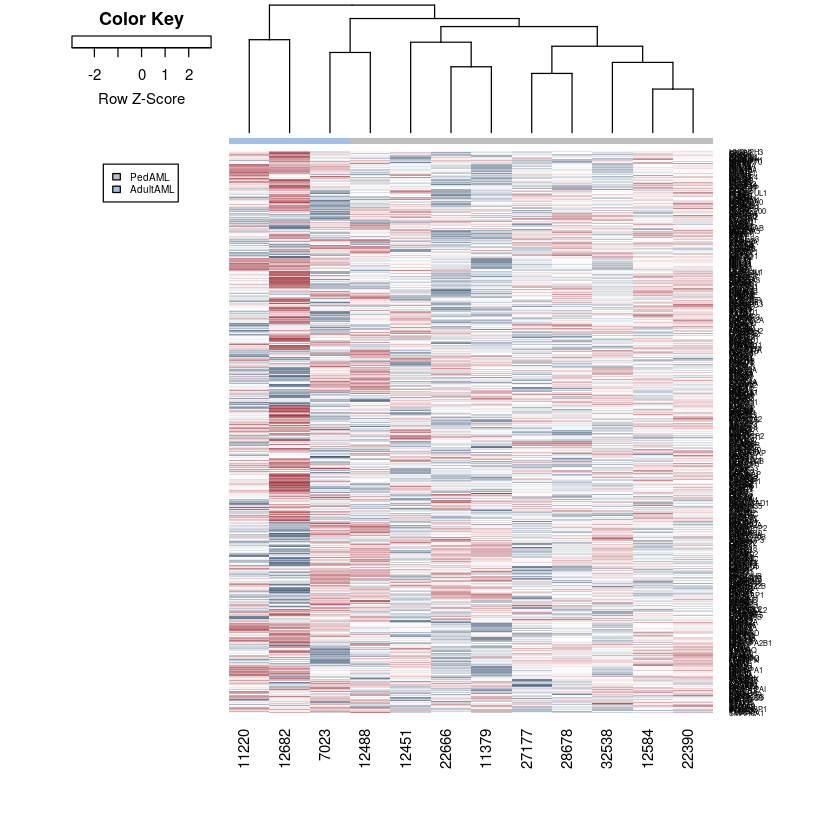

In [125]:
head(Splicing_c2_paths[[1]])
table(Splicing_c2_paths[[1]] %in% topTable_PedAMLvsAdultAML_Stem$ENTREZID)
table(Splicing_c2_paths[[1]] %in% topTable_PedAMLvsAdultAML_Prog$ENTREZID)
KEGG_spl_genes_stem <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
                                                                   topTable_PedAMLvsAdultAML_Stem$ENTREZID], ENS2EG2SYM$gene_id)]
KEGG_spl_genes_prog <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
                                                                   topTable_PedAMLvsAdultAML_Prog$ENTREZID], ENS2EG2SYM$gene_id)]
KEGG_spl_genes_stem <- KEGG_spl_genes_stem[!is.na(KEGG_spl_genes_stem)]
KEGG_spl_genes_prog <- KEGG_spl_genes_prog[!is.na(KEGG_spl_genes_prog)]

REAC_spl_genes_stem <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[2]][Splicing_c2_paths[[2]] %in% 
                                                                   topTable_PedAMLvsAdultAML_Stem$ENTREZID], ENS2EG2SYM$gene_id)]
REAC_spl_genes_prog <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[2]][Splicing_c2_paths[[2]] %in% 
                                                                   topTable_PedAMLvsAdultAML_Prog$ENTREZID], ENS2EG2SYM$gene_id)]
REAC_spl_genes_stem <- REAC_spl_genes_stem[!is.na(REAC_spl_genes_stem)]
REAC_spl_genes_prog <- REAC_spl_genes_prog[!is.na(REAC_spl_genes_prog)]

REAC2_spl_genes_stem <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[3]][Splicing_c2_paths[[3]] %in% 
                                                                   topTable_PedAMLvsAdultAML_Stem$ENTREZID], ENS2EG2SYM$gene_id)]
REAC2_spl_genes_prog <- ENS2EG2SYM$SYM[match(Splicing_c2_paths[[3]][Splicing_c2_paths[[3]] %in% 
                                                                   topTable_PedAMLvsAdultAML_Prog$ENTREZID], ENS2EG2SYM$gene_id)]
REAC2_spl_genes_stem <- REAC2_spl_genes_stem[!is.na(REAC2_spl_genes_stem)]
REAC2_spl_genes_prog <- REAC2_spl_genes_prog[!is.na(REAC2_spl_genes_prog)]

allsplice_genes_stem <- ENS2EG2SYM$SYM[match(unique(unlist(Splicing_c2_paths)), 
                                            topTable_PedAMLvsAdultAML_Stem$ENTREZID)]
allsplice_genes_prog <- ENS2EG2SYM$SYM[match(unique(unlist(Splicing_c2_paths)), 
                                            topTable_PedAMLvsAdultAML_Prog$ENTREZID)]
allsplice_genes_stem <- allsplice_genes_stem[!is.na(allsplice_genes_stem)]
allsplice_genes_prog <- allsplice_genes_prog[!is.na(allsplice_genes_prog)]

canonsplice_genes_stem <- ENS2EG2SYM$SYM[match(unique(unlist(geneIds(Splicing2_c2_paths))), 
                                               topTable_PedAMLvsAdultAML_Stem$ENTREZID)]
canonsplice_genes_prog <- ENS2EG2SYM$SYM[match(unique(unlist(geneIds(Splicing2_c2_paths))), 
                                               topTable_PedAMLvsAdultAML_Prog$ENTREZID)]
canonsplice_genes_stem <- canonsplice_genes_stem[!is.na(canonsplice_genes_stem)]
canonsplice_genes_prog <- canonsplice_genes_prog[!is.na(canonsplice_genes_prog)]
length(KEGG_spl_genes_stem)
length(KEGG_spl_genes_prog)
length(spl_db_sym_test)
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=1, expGroups=c("AdultAML", "PedAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_AdultAMLvsPedAML_SpliceosomeDB_filt"), colid="Patient.ID")
#plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
#                          genelist=allsplice_genes_stem, geneNaId="SYMBOL", outputDir=gOutputDir,
#                          metadataVector=gGroupMetadataVector.stem, coeffNumber=1, expGroups=c("AdultAML", "PedAML"), 
#                          fileprefix=paste0("DeWerf_Human_PediatricAML_Stem_AdultAMLvsPedAML_AllSplicingGenes"), colid="Patient.ID")


* [Table of Contents](#Table-of-Contents)

### Individual Gene Plots

In [83]:
PTPRC.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000081237",,drop=FALSE]))
PTPRC.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000081237",,drop=FALSE]))
PTPRC.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000081237",,drop=FALSE]))

In [52]:
library(ggpubr)
colnames(PTPRC.lcpm)[1]<- colnames(PTPRC.lcpm.prog)[1] <- colnames(PTPRC.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_PTPRCexpr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(PTPRC.lcpm.prog, x="Phenotype", y="ENSG00000081237", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("PTPRC Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - PTPRC Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_PTPRCexpr_Stem_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(PTPRC.lcpm.stem, x="Phenotype", y="ENSG00000081237", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("PTPRC Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38-Lin- - PTPRC Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


Loading required package: magrittr

Attaching package: ‘ggpubr’

The following object is masked from ‘package:cowplot’:

    get_legend



png 
  2

png 
  2

In [84]:
library(ggplot2)
library(reshape2)
WNT.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000164930",,drop=FALSE]),
                  t(lcpm[rownames(lcpm) %in% "ENSG00000104290",,drop=FALSE]),
                  t(lcpm[rownames(lcpm) %in% "ENSG00000196781",,drop=FALSE]),
                  t(lcpm[rownames(lcpm) %in% "ENSG00000120057",,drop=FALSE]))

WNT.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000164930",,drop=FALSE]),
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000104290",,drop=FALSE]),
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000196781",,drop=FALSE]),
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000120057",,drop=FALSE]))
WNT.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000164930",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000104290",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000196781",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000120057",,drop=FALSE]))
dim(WNT.lcpm)
dim(WNT.lcpm.prog)
dim(WNT.lcpm.stem)
colnames(WNT.lcpm)[19:22] <- colnames(WNT.lcpm.prog)[18:21] <- c("FZD6", "FZD3","TLE1","SFRP5")
colnames(WNT.lcpm.stem)[18:20] <- c("FZD6", "FZD3","TLE1")
WNT.lcpm.m <- melt(WNT.lcpm[,-c(1:17)])
WNT.lcpm.prog.m <- melt(WNT.lcpm.prog[,-c(2:17)])
WNT.lcpm.stem.m <- melt(WNT.lcpm.stem[,-c(2:17)])
WNT.lcpm.stem.m$value[WNT.lcpm.stem.m$value < 0] <- 0
WNT.lcpm.prog.m$value[WNT.lcpm.prog.m$value < 0] <- 0
WNT.lcpm.stem.m.filt <- WNT.lcpm.stem.m[WNT.lcpm.stem.m$group %in% c("PedAML", "PedNL"),]
WNT.lcpm.prog.m.filt <- WNT.lcpm.prog.m[WNT.lcpm.prog.m$group %in% c("PedAML", "PedNL"),]
WNT.lcpm.prog.m.filt$group <- factor(as.character(WNT.lcpm.prog.m.filt$group))
WNT.lcpm.stem.m.filt$group <- factor(as.character(WNT.lcpm.stem.m.filt$group))
head(WNT.lcpm.m)
head(WNT.lcpm.prog.m)
head(WNT.lcpm.stem.m)


[1] 32 22

[1] 18 21

[1] 14 20

Using Phenotype as id variables

Using group as id variables

Using group as id variables



,Phenotype,variable,value
,<chr>,<fct>,<dbl>
1,PedAML.Stem,FZD6,1.6262614
2,PedAML.Prog,FZD6,0.5026535
3,PedAML.Stem,FZD6,0.2590458
4,PedAML.Prog,FZD6,2.8422837
5,PedAML.Stem,FZD6,3.5640814
6,PedAML.Prog,FZD6,-1.4606334


,group,variable,value
,<fct>,<fct>,<dbl>
1,PedAML,FZD6,0.5161381
2,PedAML,FZD6,2.8804101
3,PedAML,FZD6,0.0000000
4,PedAML,FZD6,2.4689437
5,PedAML,FZD6,0.0000000
6,PedAML,FZD6,0.7709844


,group,variable,value
,<fct>,<fct>,<dbl>
1,PedAML,FZD6,1.555995
2,PedAML,FZD6,0.232429
3,PedAML,FZD6,3.562142
4,PedAML,FZD6,3.810551
5,AdultAML,FZD6,3.787500
6,AdultAML,FZD6,2.433890


Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (geom_point).”

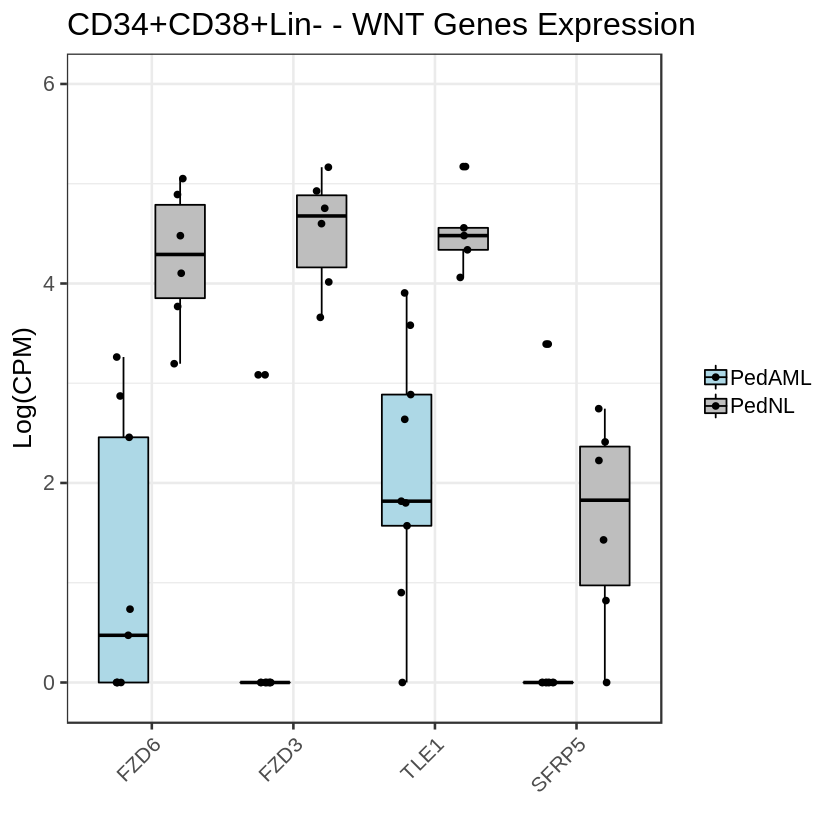

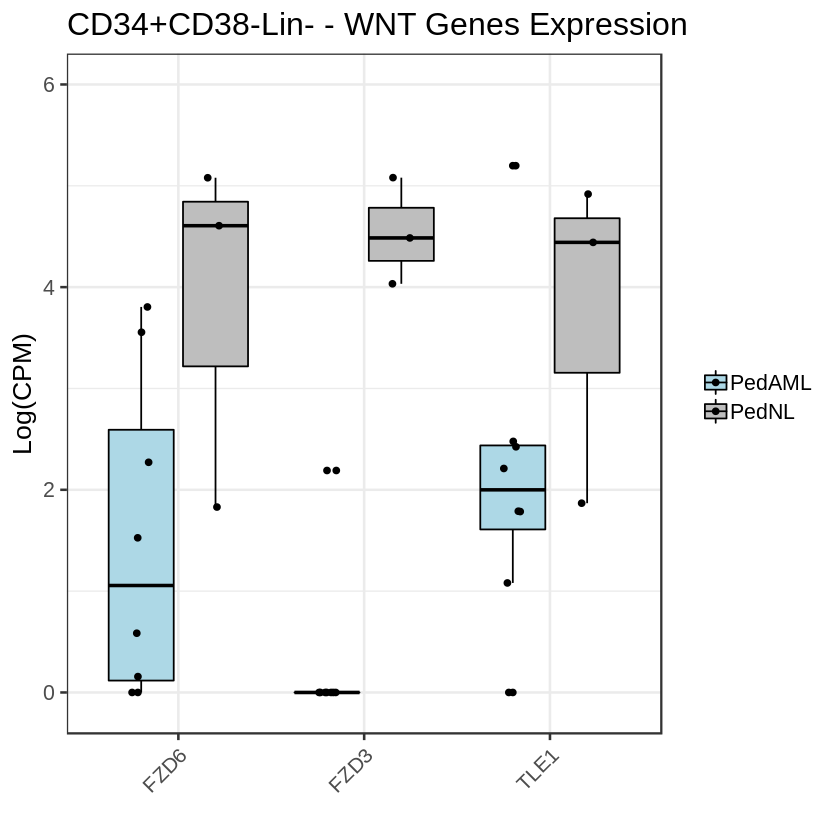

In [213]:
#png(file="PedAML_WNTgenesexpr_Prog_05052020.png", width=10, height=7, units='in', res=300)
ggboxplot(WNT.lcpm.prog.m.filt, x="variable", y="value", fill="group", add=c("jitter"), palette=c("lightblue", "gray")) +
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(-0.1,6) + xlab("") +
    labs(title="CD34+CD38+Lin- - WNT Genes Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
    #stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML", label.y=9) 
#dev.off()

#png(file="PedAML_WNTgenesexpr_Stem_05052020.png", width=10, height=7, units='in', res=300)
ggboxplot(WNT.lcpm.stem.m.filt, x="variable", y="value", fill="group", add=c("jitter"), palette=c("lightblue", "gray")) +
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(-0.1,6) + xlab("") +
    labs(title="CD34+CD38-Lin- - WNT Genes Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
    #stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML", label.y=9) 
#dev.off()

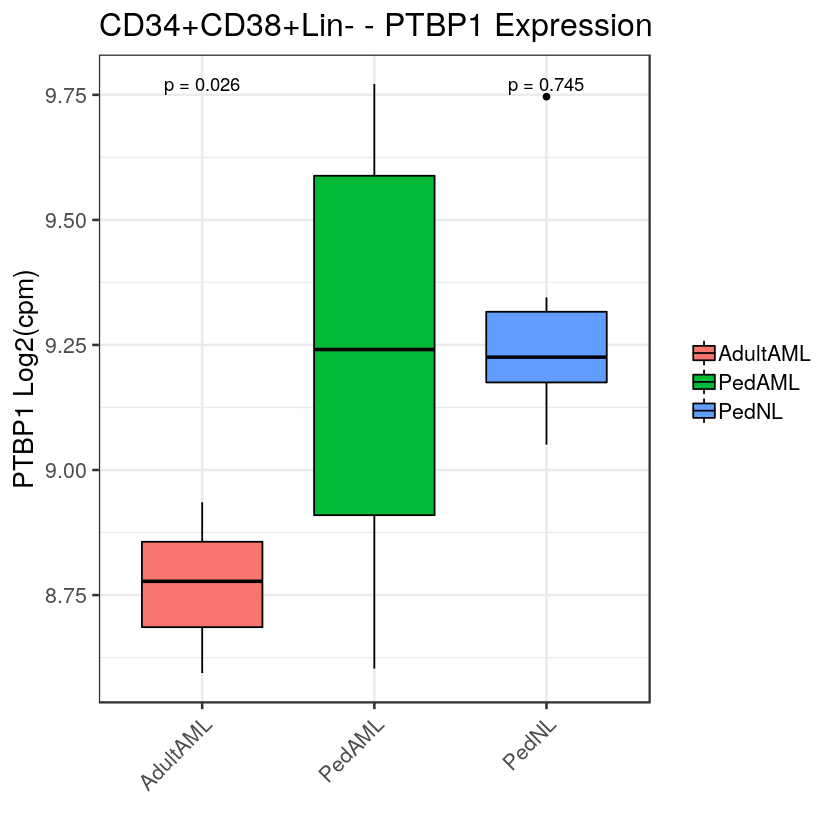

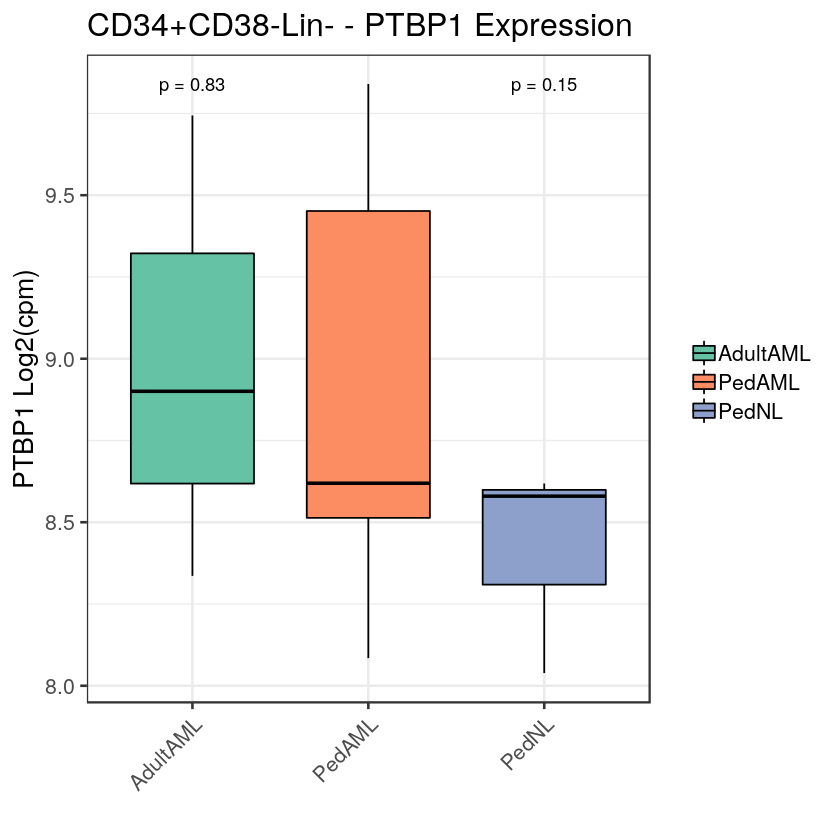

In [265]:
PTBP1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000011304",,drop=FALSE]))
PTBP1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000011304",,drop=FALSE]))
PTBP1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000011304",,drop=FALSE]))
colnames(PTBP1.lcpm)[1]<- colnames(PTBP1.lcpm.prog)[1] <- colnames(PTBP1.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_PTBP1expr_Prog_08042020.png", width=7, height=7, units='in', res=300)
ggboxplot(PTBP1.lcpm.prog, x="Phenotype", y="ENSG00000011304", fill="Phenotype", palette=c("")) +
    theme_bw(base_size=16) + ylab("PTBP1 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - PTBP1 Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_PTBP1expr_Stem_08042020.png", width=7, height=7, units='in', res=300)
ggboxplot(PTBP1.lcpm.stem, x="Phenotype", y="ENSG00000011304", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("PTBP1 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38-Lin- - PTBP1 Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

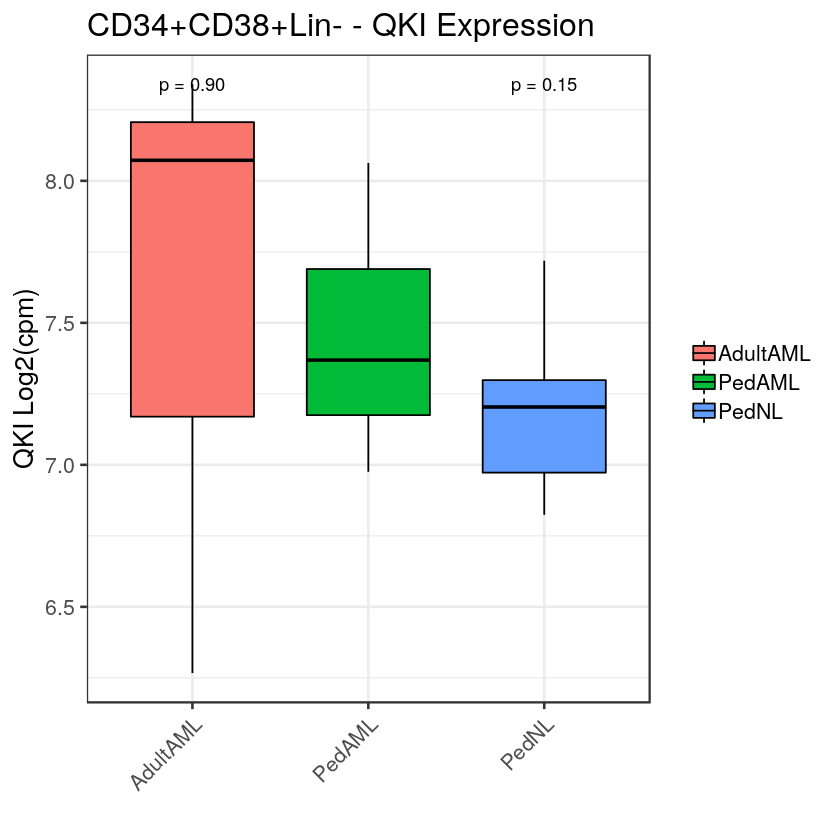

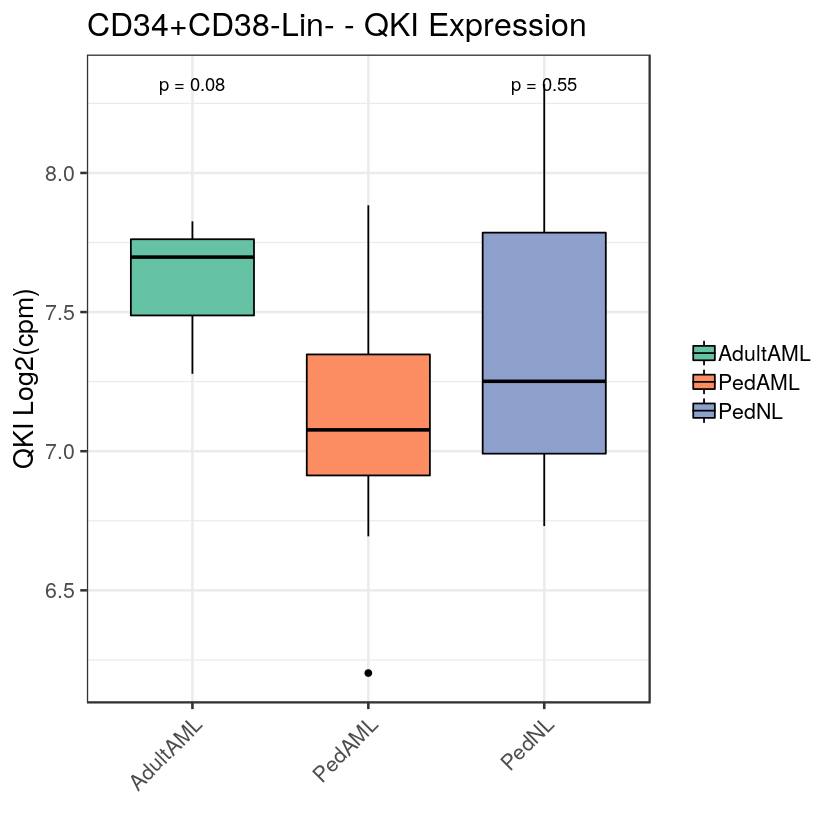

In [264]:
QKI.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000112531",,drop=FALSE]))
QKI.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000112531",,drop=FALSE]))
QKI.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000112531",,drop=FALSE]))
colnames(QKI.lcpm)[1]<- colnames(QKI.lcpm.prog)[1] <- colnames(QKI.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_QKIexpr_Prog_08042020.png", width=7, height=7, units='in', res=300)
ggboxplot(QKI.lcpm.prog, x="Phenotype", y="ENSG00000112531", fill="Phenotype", palette=c("")) +
    theme_bw(base_size=16) + ylab("QKI Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - QKI Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_QKIexpr_Stem_08042020.png", width=7, height=7, units='in', res=300)
ggboxplot(QKI.lcpm.stem, x="Phenotype", y="ENSG00000112531", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("QKI Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38-Lin- - QKI Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [85]:
CELF2.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000048740",,drop=FALSE]))
CELF2.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000048740",,drop=FALSE]))
CELF2.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000048740",,drop=FALSE]))

In [99]:
head(CELF2.lcpm.prog)

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,ENSG00000048740
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,8.474830
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,8.424263
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,7.771269
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883,8.581961
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108,8.052124
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550,8.512412


[1] 15 18

[1] 11 18

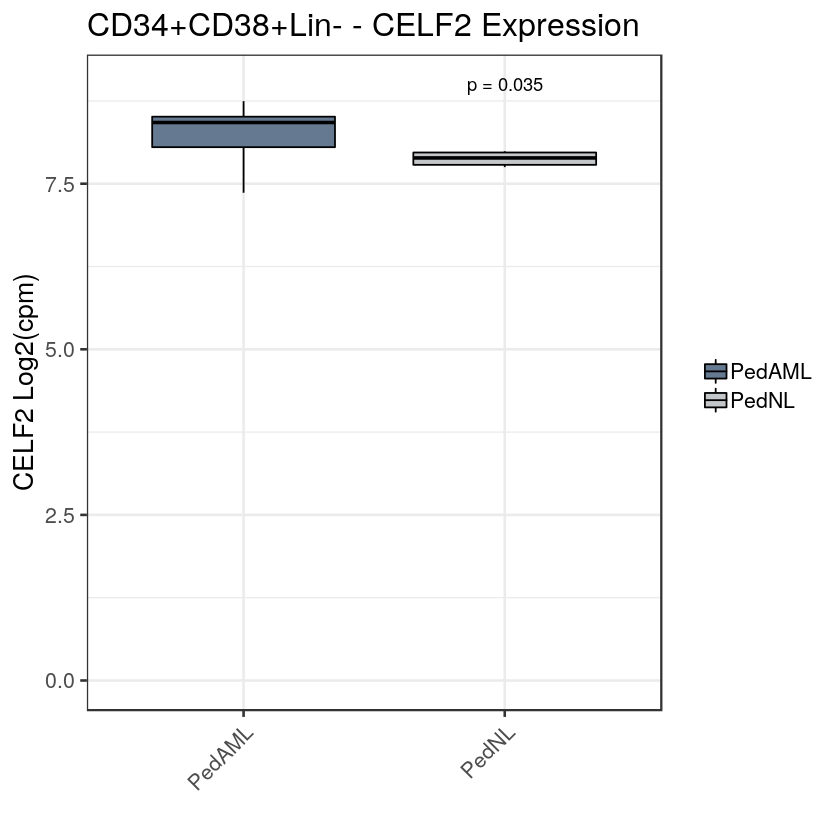

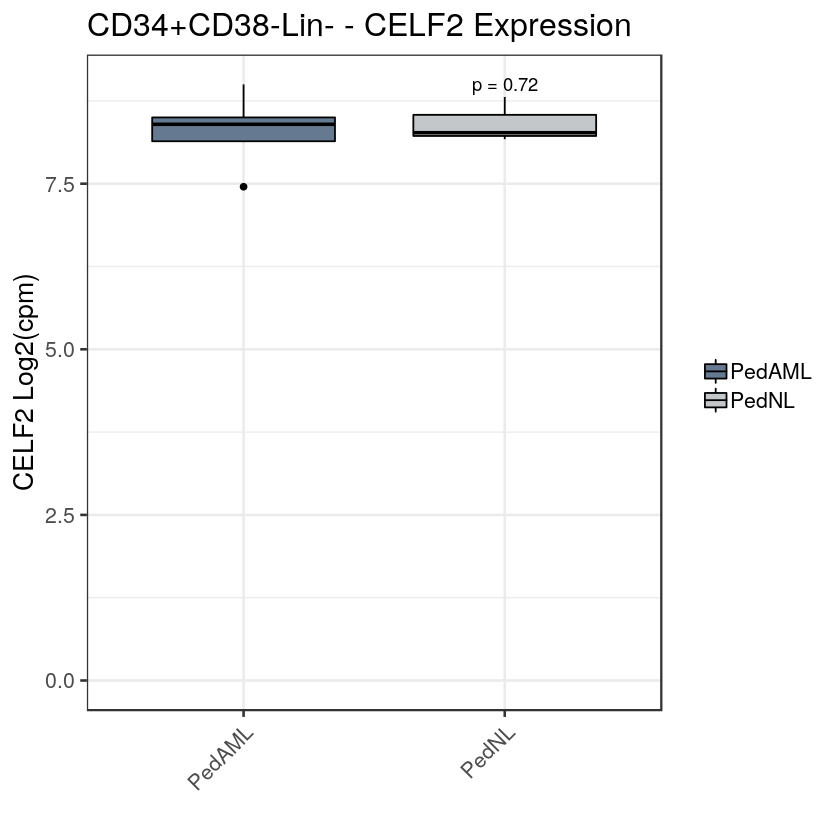

In [105]:
colnames(CELF2.lcpm)[1]<- colnames(CELF2.lcpm.prog)[1] <- colnames(CELF2.lcpm.stem)[1] <- "Phenotype"
CELF2.lcpm.prog.filt <- CELF2.lcpm.prog[CELF2.lcpm.prog$X %in% c("PedAML", "PedNL"),]
CELF2.lcpm.stem.filt <- CELF2.lcpm.stem[CELF2.lcpm.stem$X %in% c("PedAML", "PedNL"),]
dim(CELF2.lcpm.prog.filt)
dim(CELF2.lcpm.stem.filt)
#png(file="PedAML_CELF2expr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CELF2.lcpm.prog.filt, x="Phenotype", y="ENSG00000048740", fill="Phenotype", palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("CELF2 Log2(cpm)") + xlab("") + ylim(0,9) +
    labs(title="CD34+CD38+Lin- - CELF2 Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CELF2expr_Stem_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CELF2.lcpm.stem.filt, x="Phenotype", y="ENSG00000048740", fill="Phenotype", palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("CELF2 Log2(cpm)") + xlab("") + ylim(0,9) +
    labs(title="CD34+CD38-Lin- - CELF2 Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()


In [86]:
IMP1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000159217",,drop=FALSE]))
IMP1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000159217",,drop=FALSE]))
IMP1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000159217",,drop=FALSE]))
IMP1.lcpm.prog
IMP1.lcpm.stem

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550
05x00047xPLUSPLUS,PedNL,36940541,1.0731430,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,05x00047xPLUSPLUS,47 PlPl,12747,9.8,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,81377527
06x00077xPLUSPLUS,PedNL,62232722,1.3090993,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,06x00077xPLUSPLUS,77 PlPl,17677,9.6,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,129445731
07x00023xPLUSPLUS,AdultAML,33543583,1.0523582,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,07x00023xPLUSPLUS,23 PlPl,7023,8.2,AdultAML,Adult,AML,Prog,34+38+,BM,Completed,NA


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
01id38cellHSC,PedAML,40985758,1.0790622,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305
cell05id90HSC,PedAML,32672214,1.0238805,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632
03id78cellHSC,PedAML,28583557,0.8103577,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294
05id00066HSC,PedAML,15869122,1.2862798,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907
04id11474HSC,AdultAML,25449852,1.1381900,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032
02id11251HSC,AdultAML,21994123,0.9289837,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,02id11251HSC,11251 HSC,11251,9.3,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,81776486
02x11379xHSCxxxxx,PedAML,44445664,1.0109713,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,02x11379xHSCxxxxx,11379 HSC,11379,9.6,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,101108249
04x00068xPLUSMINS,PedAML,24457199,1.0422271,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,04x00068xPLUSMINS,68PlMn,11868,6.8,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,61132963
10x00082xPLUSMINS,AdultAML,24600048,0.6074554,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,10x00082xPLUSMINS,82 PlMn,12682,9.9,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,NA


ERROR while rich displaying an object: Error in FUN(X[[i]], ...): object 'ENSG00000159217' not found

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]](obj)
8. repr_text.default(obj)
9

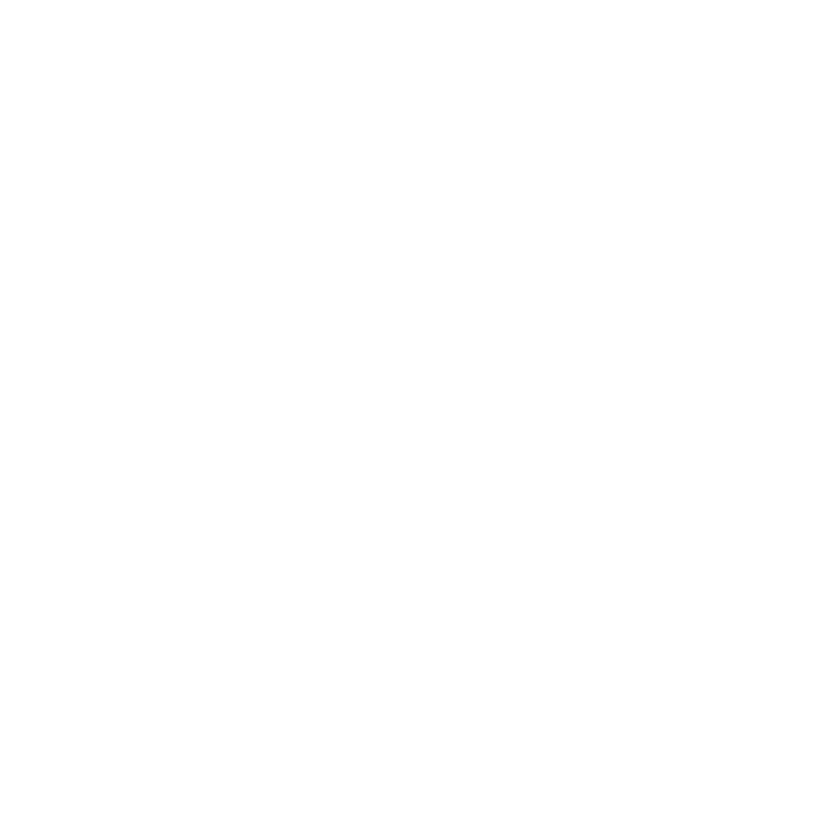

In [131]:
colnames(IMP1.lcpm)[1]<- colnames(IMP1.lcpm.prog)[1] <- colnames(IMP1.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_IMP1expr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(IMP1.lcpm.prog, x="Phenotype", y="ENSG00000159217", fill="Phenotype", palette=c("")) +
    theme_bw(base_size=16) + ylab("IMP1 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - IMP1 Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_IMP1expr_Stem_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(IMP1.lcpm.stem, x="Phenotype", y="ENSG00000159217", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("IMP1 Log2(cpm)") + xlab("") + ylim(0,6) +
    labs(title="CD34+CD38-Lin- - IMP1 Expression") + theme(legend.title=element_text(size=0)) + 
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()


In [78]:
CLEC12A.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000172322",,drop=FALSE]))
CLEC12A.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000172322",,drop=FALSE]))
CLEC12A.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000172322",,drop=FALSE]))

In [79]:
CLEC12A.lcpm.stem

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,ENSG00000172322
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
01id38cellHSC,PedAML,40985758,1.0790622,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,4.6884703
cell05id90HSC,PedAML,32672214,1.0238805,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,6.5875895
03id78cellHSC,PedAML,28583557,0.8103577,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,4.7474881
05id00066HSC,PedAML,15869122,1.2862798,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907,5.9730231
04id11474HSC,AdultAML,25449852,1.1381900,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032,3.7333205
02id11251HSC,AdultAML,21994123,0.9289837,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,02id11251HSC,11251 HSC,11251,9.3,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,81776486,3.8130180
02x11379xHSCxxxxx,PedAML,44445664,1.0109713,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,02x11379xHSCxxxxx,11379 HSC,11379,9.6,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,101108249,6.8709659
04x00068xPLUSMINS,PedAML,24457199,1.0422271,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,04x00068xPLUSMINS,68PlMn,11868,6.8,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,61132963,5.5390811
10x00082xPLUSMINS,AdultAML,24600048,0.6074554,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,10x00082xPLUSMINS,82 PlMn,12682,9.9,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,NA,4.0241352


In [82]:
colnames(CLEC12A.lcpm)[1]<- colnames(CLEC12A.lcpm.prog)[1] <- colnames(CLEC12A.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_CLEC12Aexpr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CLEC12A.lcpm.prog, x="Phenotype", y="ENSG00000172322", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CLEC12A Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - CLEC12A Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_CLEC12Aexpr_Stem_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CLEC12A.lcpm.stem, x="Phenotype", y="ENSG00000172322", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CLEC12A Log2(cpm)") + xlab("") + ylim(0,6) +
    labs(title="CD34+CD38-Lin- - CLEC12A Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


png 
  2

Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”

png 
  2

In [87]:
HAVCR2.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000135077",,drop=FALSE]))
HAVCR2.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000135077",,drop=FALSE]))
HAVCR2.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000135077",,drop=FALSE]))

In [101]:
colnames(HAVCR2.lcpm)[1]<- colnames(HAVCR2.lcpm.prog)[1] <- colnames(HAVCR2.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_HAVCR2expr_Prog_0504020.png", width=7, height=7, units='in', res=300)
ggboxplot(HAVCR2.lcpm.prog, x="Phenotype", y="ENSG00000135077", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("HAVCR2 Log2(cpm)") + xlab("") + ylim(0,5) +
    labs(title="CD34+CD38+Lin- - HAVCR2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_HAVCR2expr_Stem_0504020.png", width=7, height=7, units='in', res=300)
ggboxplot(HAVCR2.lcpm.stem, x="Phenotype", y="ENSG00000135077", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("HAVCR2 Log2(cpm)") + xlab("") + ylim(0,5) +
    labs(title="CD34+CD38-Lin- - HAVCR2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”

png 
  2

Warning message:
“Removed 7 rows containing non-finite values (stat_boxplot).”

png 
  2

In [88]:
CD7.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000173762",,drop=FALSE]))
CD7.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000173762",,drop=FALSE]))
CD7.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000173762",,drop=FALSE]))

In [83]:
colnames(CD7.lcpm)[1]<- colnames(CD7.lcpm.prog)[1] <- colnames(CD7.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_CD7expr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD7.lcpm.prog, x="Phenotype", y="ENSG00000173762", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD7 Log2(cpm)") + xlab("") + ylim(0,7) +
    labs(title="CD34+CD38+Lin- - CD7 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_CD7expr_Stem_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD7.lcpm.stem, x="Phenotype", y="ENSG00000173762", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD7 Log2(cpm)") + xlab("") + ylim(0,6) +
    labs(title="CD34+CD38-Lin- - CD7 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”

png 
  2

Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”

png 
  2

In [89]:
ITGAM.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000169896",,drop=FALSE]))
ITGAM.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000169896",,drop=FALSE]))
ITGAM.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000169896",,drop=FALSE]))

In [60]:
library(ggpubr)
colnames(ITGAM.lcpm)[1]<- colnames(ITGAM.lcpm.prog)[1] <- colnames(ITGAM.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_ITGAMexpr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(ITGAM.lcpm.prog, x="Phenotype", y="ENSG00000169896", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ITGAM Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - ITGAM Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_ITGAMexpr_Stem_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(ITGAM.lcpm.stem, x="Phenotype", y="ENSG00000169896", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ITGAM Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38-Lin- - ITGAM Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


png 
  2

png 
  2

In [90]:
IL3RA.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000185291",,drop=FALSE]))
IL3RA.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000185291",,drop=FALSE]))
IL3RA.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000185291",,drop=FALSE]))

In [84]:
colnames(IL3RA.lcpm)[1]<- colnames(IL3RA.lcpm.prog)[1] <- colnames(IL3RA.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_IL3RAexpr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(IL3RA.lcpm.prog, x="Phenotype", y="ENSG00000185291", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("IL3RA Log2(cpm)") + xlab("") + ylim(0,7) +
    labs(title="CD34+CD38+Lin- - IL3RA Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_IL3RAexpr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(IL3RA.lcpm.stem, x="Phenotype", y="ENSG00000185291", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("IL3RA Log2(cpm)") + xlab("") + ylim(0,8) +
    labs(title="CD34+CD38-Lin- - IL3RA Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


png 
  2

png 
  2

In [91]:
CD33.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000105383",,drop=FALSE]))
CD33.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000105383",,drop=FALSE]))
CD33.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000105383",,drop=FALSE]))

In [85]:
colnames(CD33.lcpm)[1]<- colnames(CD33.lcpm.prog)[1] <- colnames(CD33.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_CD33expr_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD33.lcpm.prog, x="Phenotype", y="ENSG00000105383", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD33 Log2(cpm)") + xlab("") + ylim(0,8) +
    labs(title="CD34+CD38+Lin- - CD33 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_CD33expr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD33.lcpm.stem, x="Phenotype", y="ENSG00000105383", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD33 Log2(cpm)") + xlab("") + ylim(0,8) +
    labs(title="CD34+CD38-Lin- - CD33 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()


png 
  2

png 
  2

In [92]:
CD96.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000153283",,drop=FALSE]))
CD96.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000153283",,drop=FALSE]))
CD96.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000153283",,drop=FALSE]))

In [86]:
colnames(CD96.lcpm)[1]<- colnames(CD96.lcpm.prog)[1] <- colnames(CD96.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_CD96expr_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD96.lcpm.prog, x="Phenotype", y="ENSG00000153283", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD96 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38+Lin- - CD96 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_CD96expr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD96.lcpm.stem, x="Phenotype", y="ENSG00000153283", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD96 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38-Lin- - CD96 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png 
  2

Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”

png 
  2

In [136]:
Auto.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% 
                                                          c("ENSG00000152137", "ENSG00000107262", "ENSG00000151929")
                                    ,,drop=FALSE]))
Auto.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% 
                                    c("ENSG00000152137", "ENSG00000107262", "ENSG00000151929"),,drop=FALSE]))
Auto.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in%  
                                    c("ENSG00000152137", "ENSG00000107262", "ENSG00000151929"),,drop=FALSE]))

Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_compare_means).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”
Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_compare_means).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”


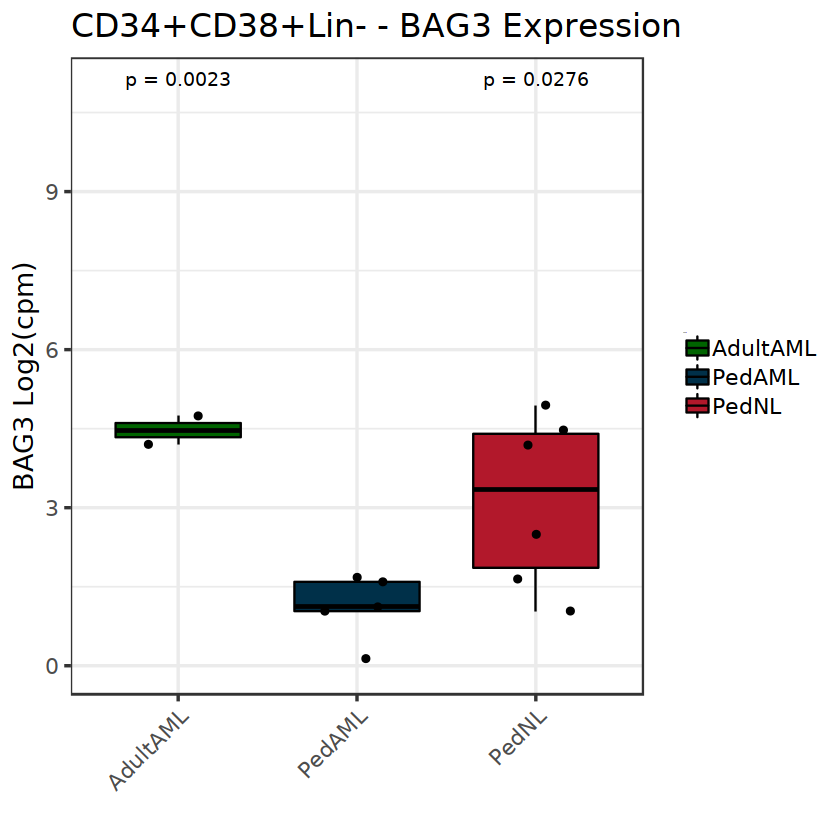

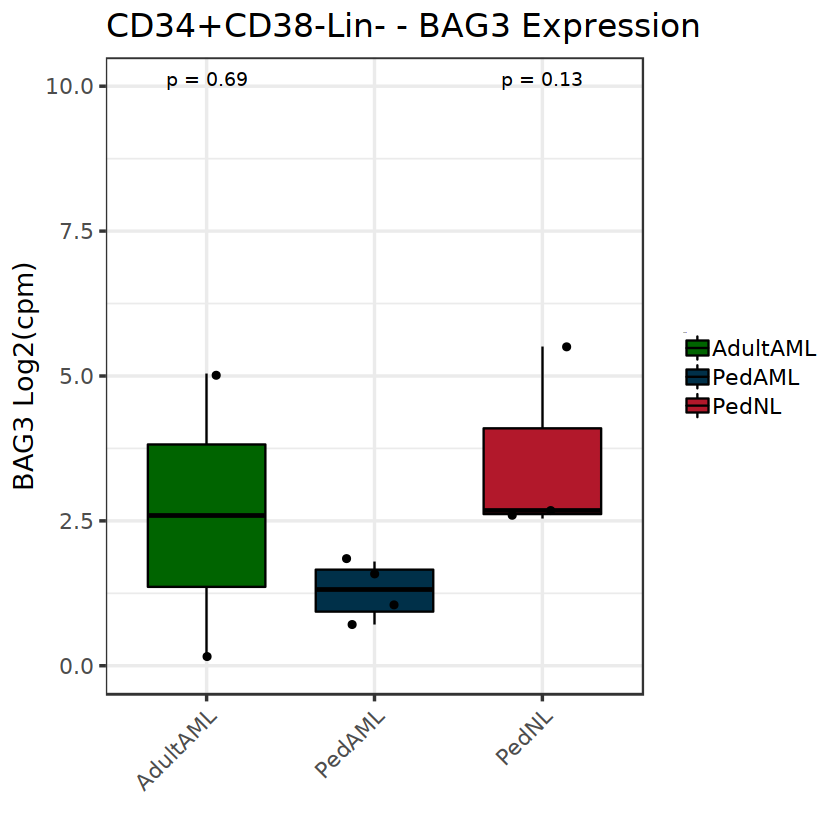

In [134]:
colnames(Auto.lcpm)[1]<- colnames(Auto.lcpm.prog)[1] <- colnames(Auto.lcpm.stem)[1] <- "Phenotype"

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_BAG3expr_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(Auto.lcpm.prog, x="Phenotype", y="ENSG00000151929", fill="Phenotype", 
          add=c("jitter"), palette=c("dark green","#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("BAG3 Log2(cpm)") + xlab("") + ylim(0,11) +
    labs(title="CD34+CD38+Lin- - BAG3 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_BAG3expr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(Auto.lcpm.stem, x="Phenotype", y="ENSG00000151929", fill="Phenotype", 
          add=c("jitter"), palette=c("dark green","#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("BAG3 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38-Lin- - BAG3 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

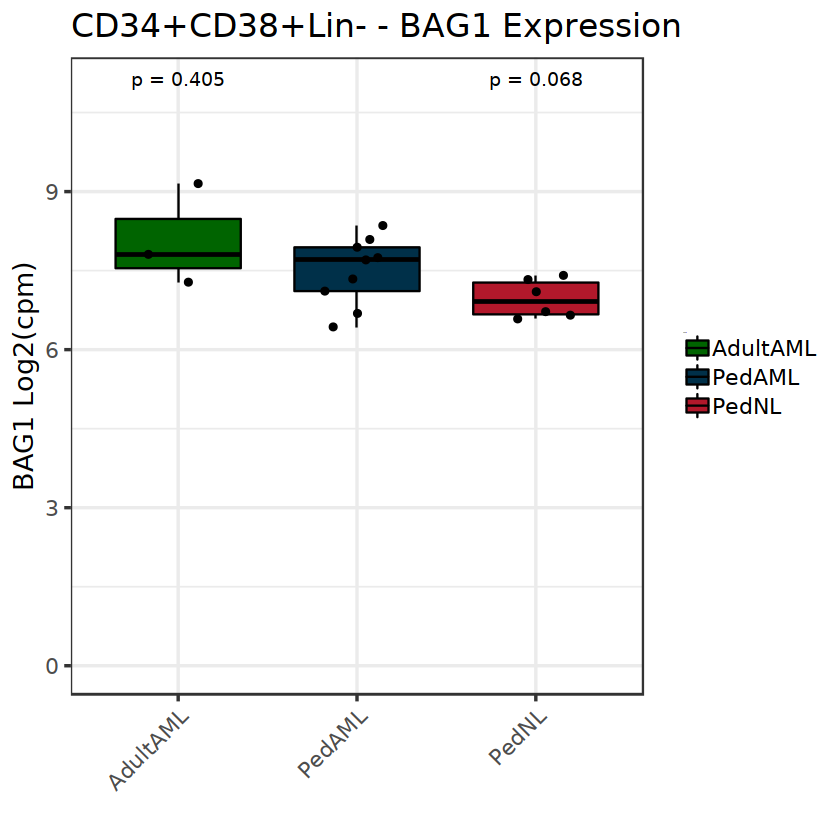

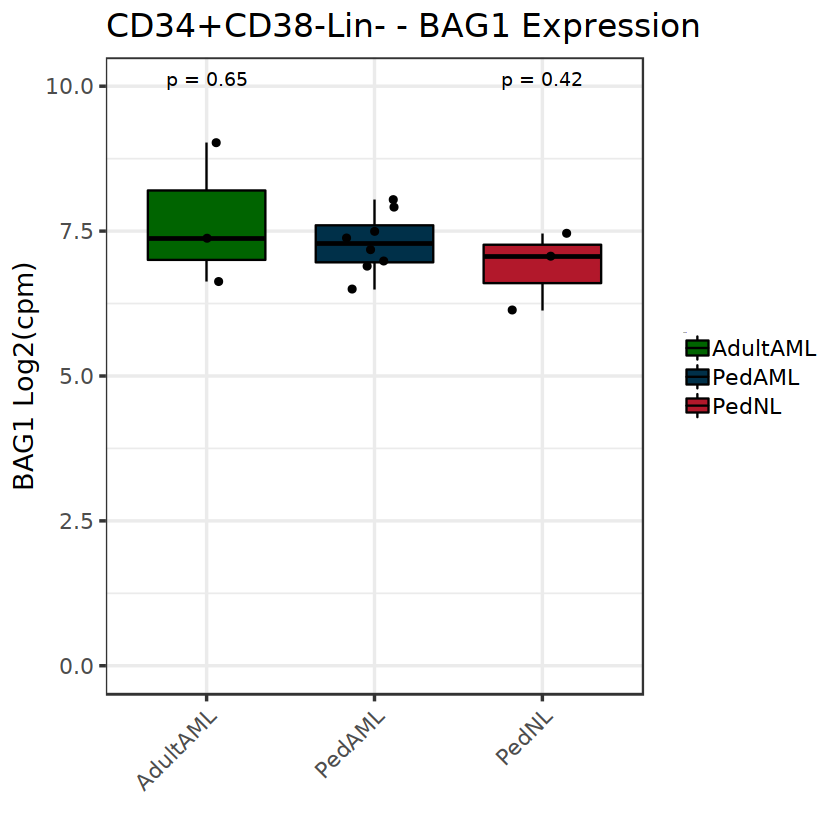

In [135]:
options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_BAG3expr_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(Auto.lcpm.prog, x="Phenotype", y="ENSG00000107262", fill="Phenotype", 
          add=c("jitter"), palette=c("dark green","#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("BAG1 Log2(cpm)") + xlab("") + ylim(0,11) +
    labs(title="CD34+CD38+Lin- - BAG1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_BAG3expr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(Auto.lcpm.stem, x="Phenotype", y="ENSG00000107262", fill="Phenotype", 
          add=c("jitter"), palette=c("dark green","#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("BAG1 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38-Lin- - BAG1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [138]:
Auto.lcpm


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,Phenotype,ENSG00000107262,ENSG00000151929
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>
01id38cellHSC,PedAML,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,PedAML.Stem,7.256687,-2.5196342
02id38cellPROGENITORS,PedAML,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,PedAML.Prog,7.320396,-0.6279357
cell05id90HSC,PedAML,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,PedAML.Stem,7.541740,1.6510487
06id90cellPROGENITORS,PedAML,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,PedAML.Prog,7.901853,1.6415707
03id78cellHSC,PedAML,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,PedAML.Stem,7.916271,1.0019305
04id78cellPROGENITORS,PedAML,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,PedAML.Prog,7.736287,1.1122804
05id00066HSC,PedAML,15897883,1.2330452,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907,PedAML.Stem,6.558041,0.7548293
06id00066PRO,PedAML,30068212,1.1915671,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883,PedAML.Prog,6.387224,-2.5850505
04id11474HSC,AdultAML,25477749,1.1069966,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032,AdultAML.Stem,6.668290,-4.1840865


In [120]:
CD47.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000196776",,drop=FALSE]))
CD47.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000196776",,drop=FALSE]))
CD47.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000196776",,drop=FALSE]))

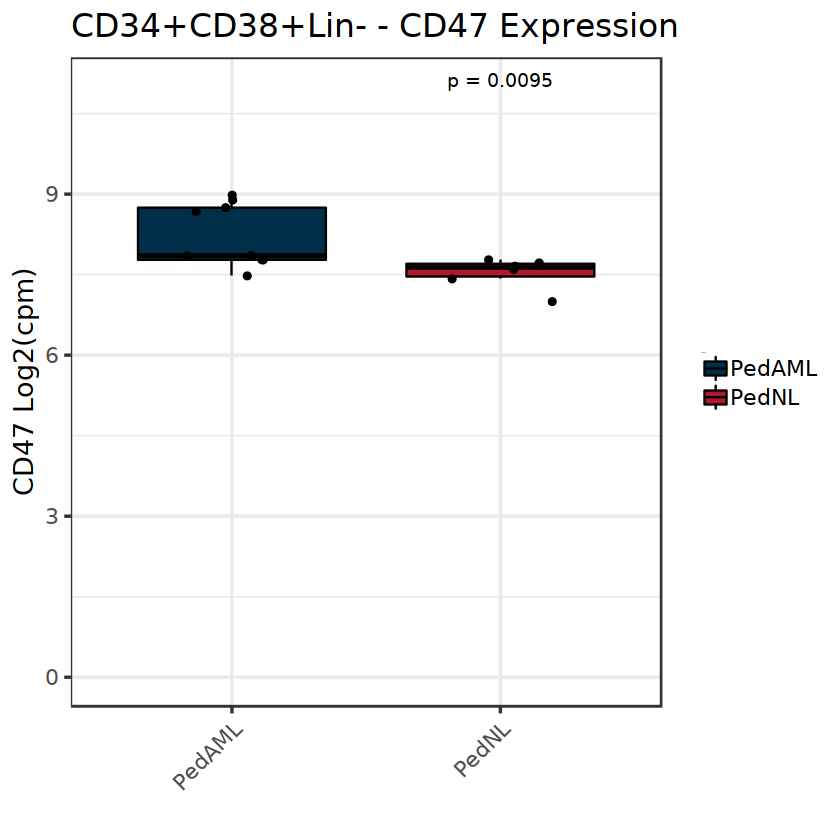

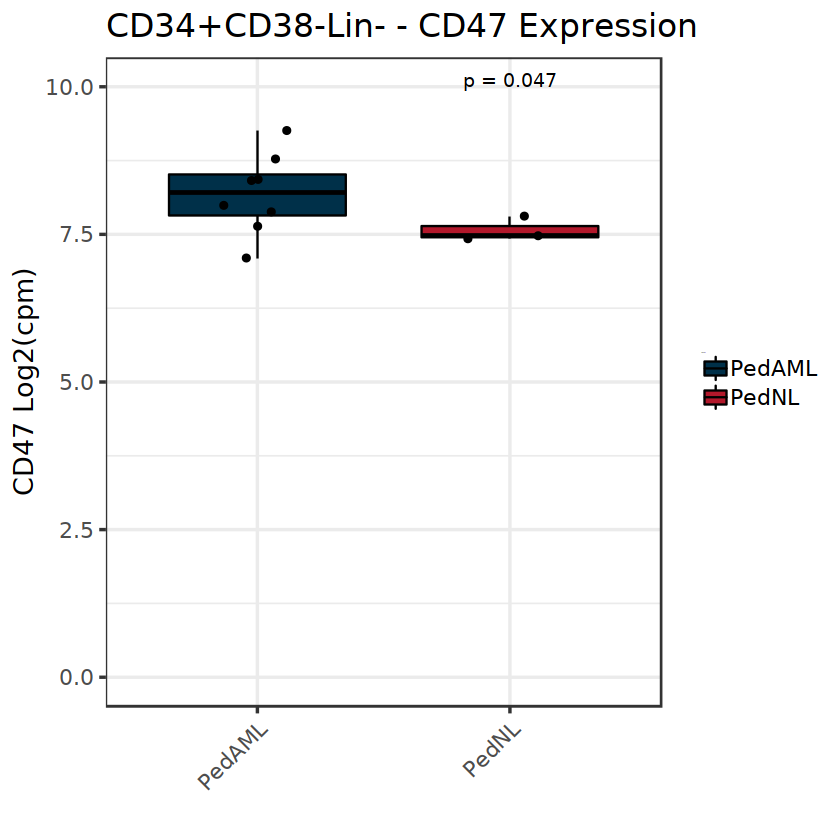

In [123]:
colnames(CD47.lcpm)[1]<- colnames(CD47.lcpm.prog)[1] <- colnames(CD47.lcpm.stem)[1] <- "Phenotype"

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_CD47expr_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(CD47.lcpm.prog, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000196776", fill="Phenotype", 
          add=c("jitter"), palette=c("#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("CD47 Log2(cpm)") + xlab("") + ylim(0,11) +
    labs(title="CD34+CD38+Lin- - CD47 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_CD47expr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(CD47.lcpm.stem, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000196776", fill="Phenotype", 
          add=c("jitter"), palette=c("#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("CD47 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38-Lin- - CD47 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [107]:
MYC.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000136997",,drop=FALSE]))
MYC.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000136997",,drop=FALSE]))
MYC.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000136997",,drop=FALSE]))

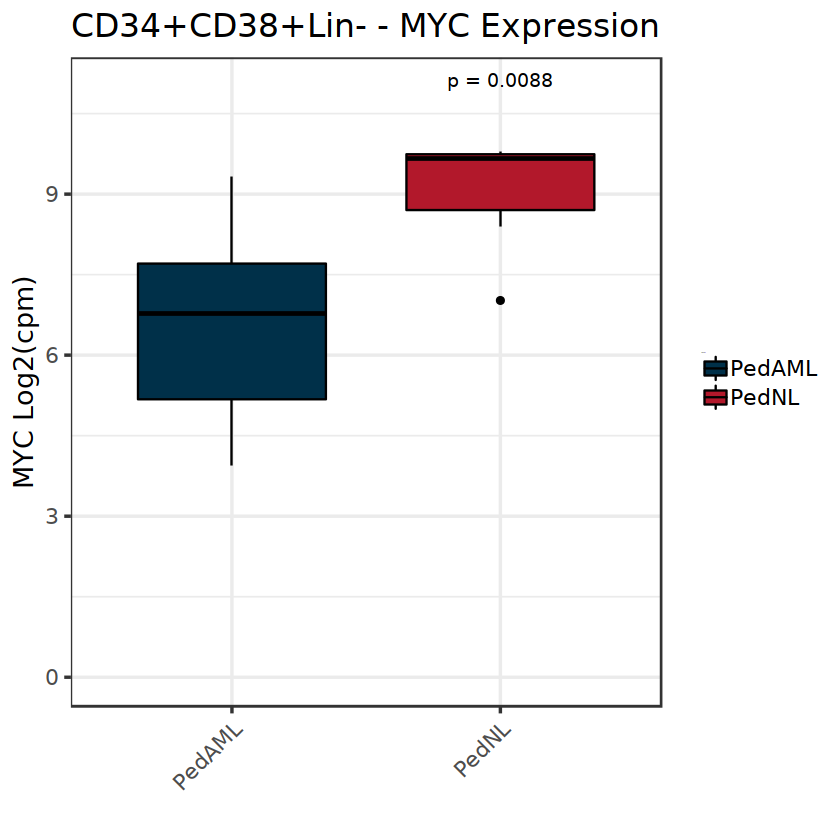

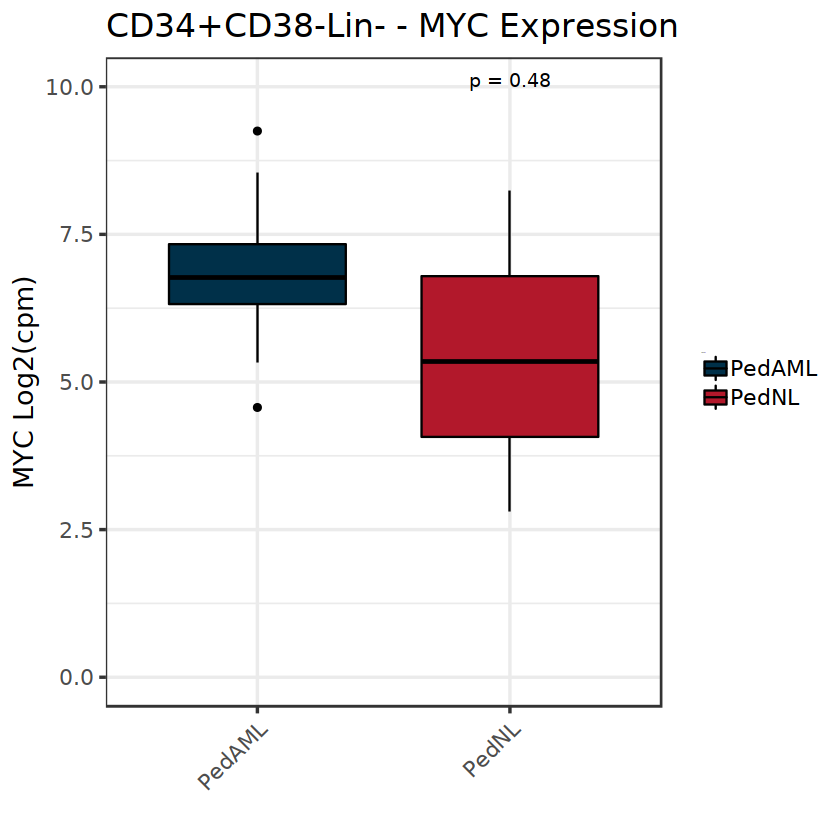

In [113]:
colnames(MYC.lcpm)[1]<- colnames(MYC.lcpm.prog)[1] <- colnames(MYC.lcpm.stem)[1] <- "Phenotype"

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_MYCexpr_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MYC.lcpm.prog, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000136997", fill="Phenotype", palette=c("#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("MYC Log2(cpm)") + xlab("") + ylim(0,11) +
    labs(title="CD34+CD38+Lin- - MYC Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

options(repr.plot.width=7, repr.plot.height=7)
#png(file="PedAML_MYCexpr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MYC.lcpm.stem, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000136997", fill="Phenotype", palette=c("#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("MYC Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38-Lin- - MYC Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [93]:
CD44.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000026508",,drop=FALSE]))
CD44.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000026508",,drop=FALSE]))
CD44.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000026508",,drop=FALSE]))

[1] 18 25

[1] 14 25

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,⋯,RNA.seq.status,Reads,CD47,CLEC12A,Tim3,CD7,CD123,CD96,CD33,CD44
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,⋯,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,⋯,Completed,73196851,8.747535,4.945785,5.461796,0.0000000,5.546792,6.024091,5.561555,10.626831
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,⋯,Completed,81721991,8.980920,4.530941,5.977113,2.1937387,5.334753,6.351922,5.303341,10.771535
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,⋯,Completed,88894032,7.773935,6.384046,4.744285,0.0000000,3.153312,9.383715,4.111063,9.547262
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,⋯,Completed,77343883,8.678458,7.230131,6.253865,5.6057911,2.868618,9.347738,7.652696,9.818021
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,⋯,Completed,68810108,7.859655,6.440383,5.776986,0.4630573,3.838448,9.682569,3.731019,9.991271
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,⋯,Completed,92324550,8.889631,7.665837,4.784268,5.5461803,2.721638,8.793733,3.100637,10.061163


Using group as id variables

Using group as id variables



[1] 96  3

          
           CD47 CLEC12A Tim3 CD7 CD123 CD96 CD33 CD44
  PedAML      9       9    9   9     9    9    9    9
  AdultAML    3       3    3   3     3    3    3    3

Warning message:
“Computation failed in `stat_compare_means()`:
missing value where TRUE/FALSE needed”


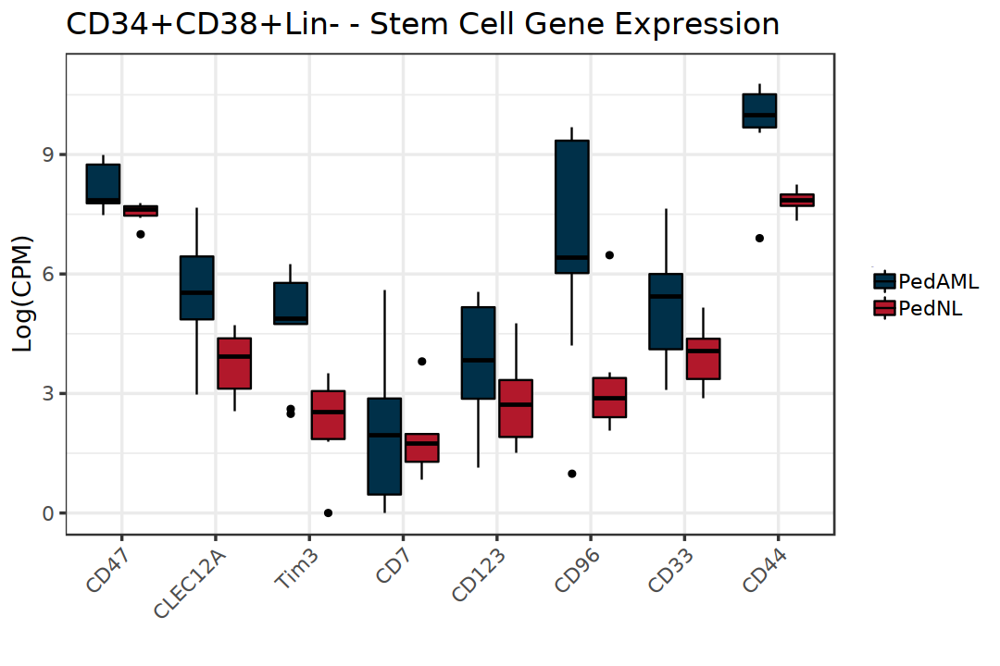

Warning message:
“Computation failed in `stat_compare_means()`:
missing value where TRUE/FALSE needed”


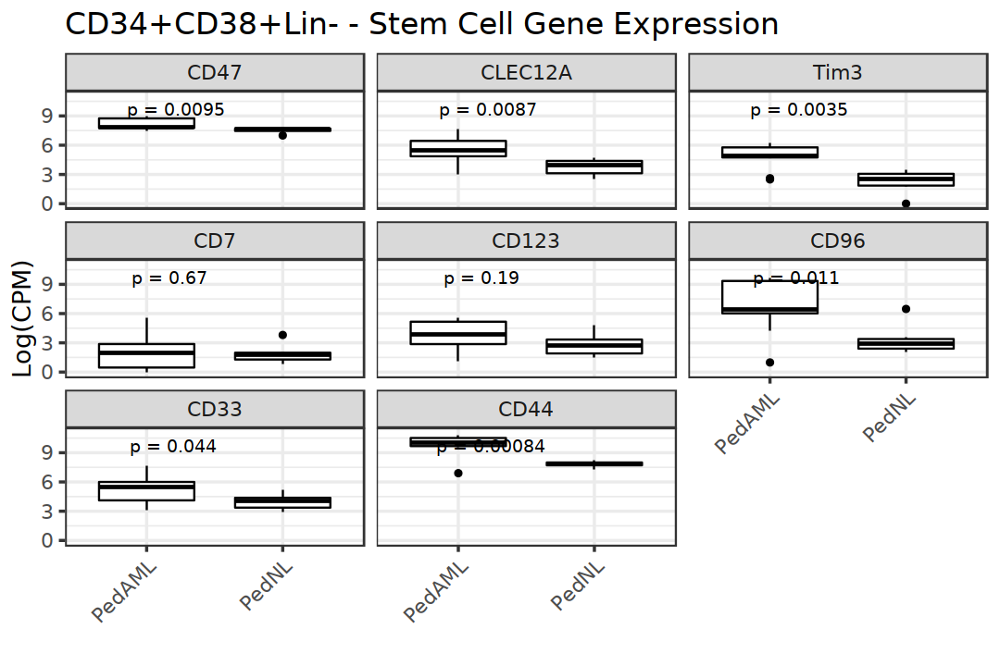

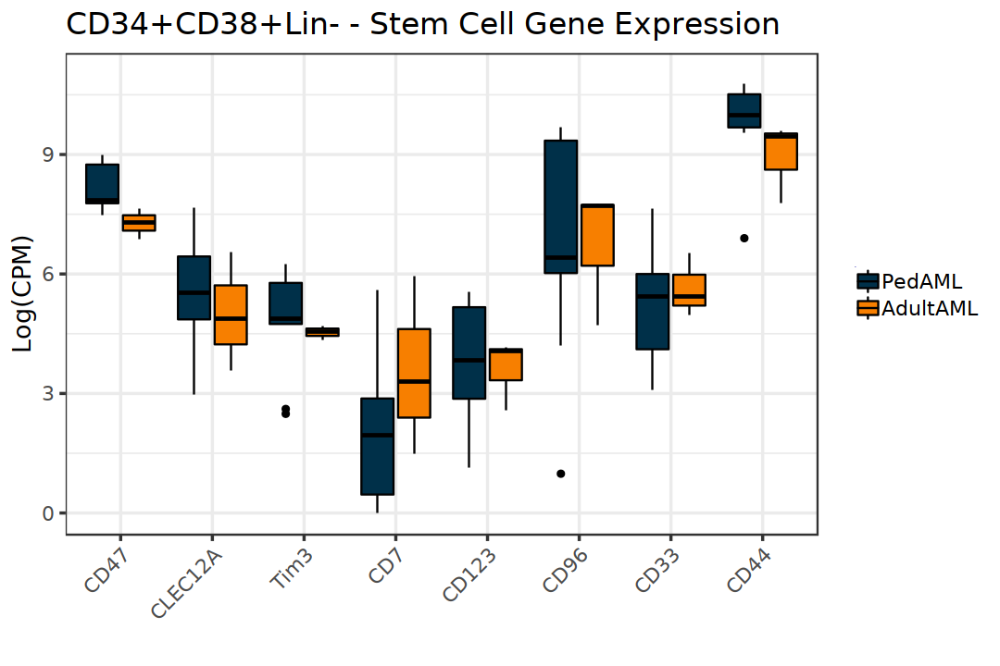

Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”


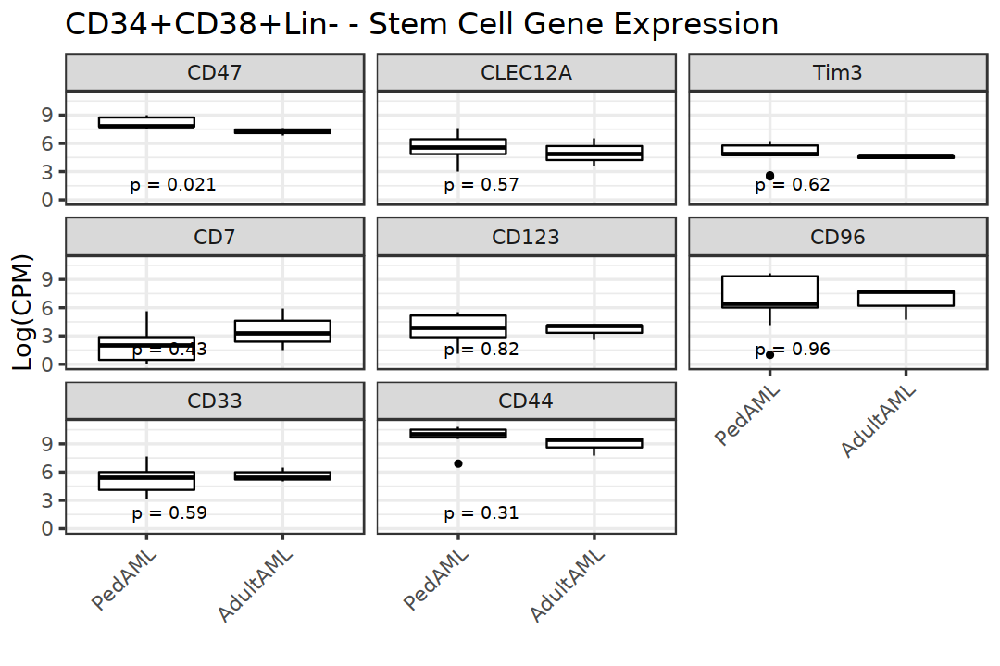

Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”


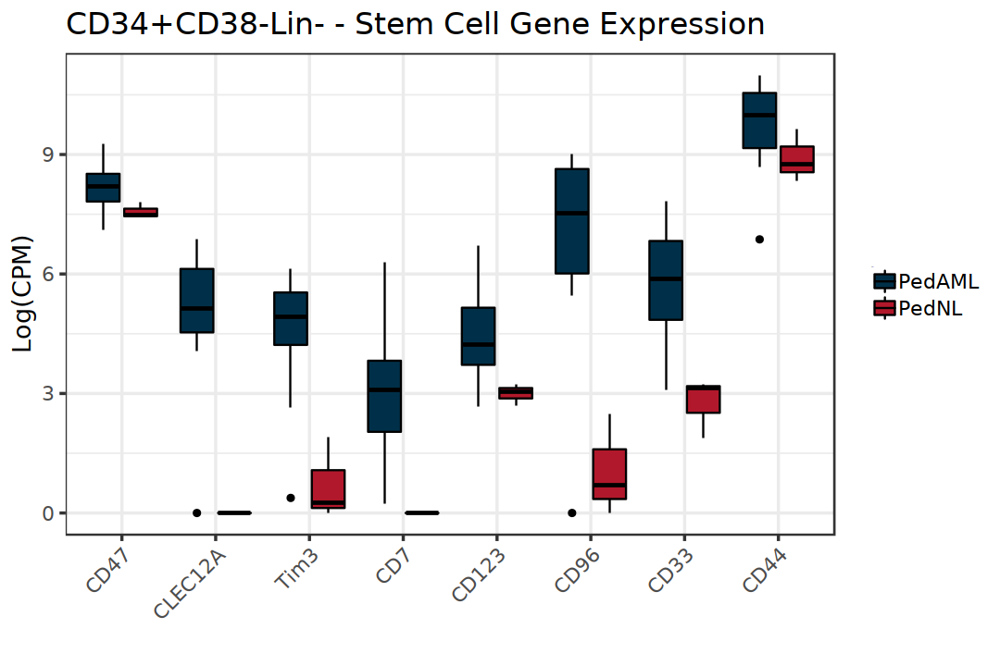

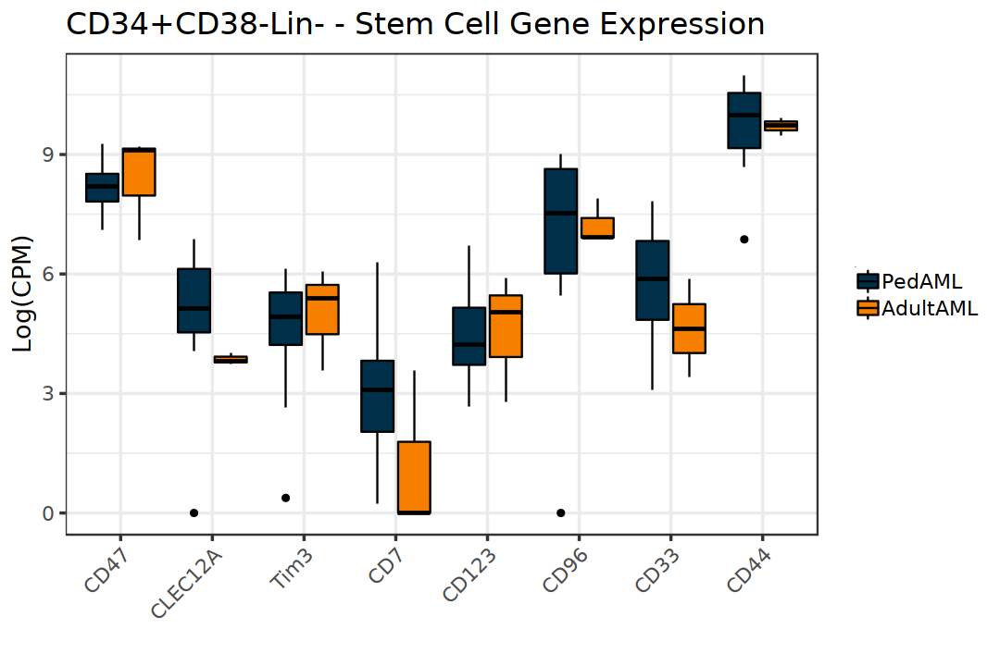

In [141]:
library(reshape2)
library(ggpubr)
LSC.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                       #t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000004468",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000196776",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000172322",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000135077",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000173762",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000185291",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000153283",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000105383",,drop=FALSE]),
                       t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000026508",,drop=FALSE]))

LSC.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                       #t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000004468",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000196776",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000172322",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000135077",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000173762",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000185291",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000153283",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000105383",,drop=FALSE]),
                       t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000026508",,drop=FALSE]))

colnames(LSC.lcpm.prog)[18:25] <- c("CD47", "CLEC12A", "Tim3", "CD7", "CD123", "CD96", "CD33", "CD44")
colnames(LSC.lcpm.stem)[18:25]<- c("CD47","CLEC12A", "Tim3", "CD7", "CD123", "CD96", "CD33", "CD44")
for (i in 18:25) {
    LSC.lcpm.prog[which(LSC.lcpm.prog[,i] < 0),i] <- 0 
    LSC.lcpm.stem[which(LSC.lcpm.stem[,i] < 0),i] <- 0     
}
dim(LSC.lcpm.prog)
dim(LSC.lcpm.stem)
head(LSC.lcpm.prog)
LSC.lcpm.prog.m <- melt(LSC.lcpm.prog[,-c(2:17)])
LSC.lcpm.stem.m <- melt(LSC.lcpm.stem[,-c(2:17)])

LSC.lcpm.prog.m.filt <- LSC.lcpm.prog.m[LSC.lcpm.prog.m$group %in% c("PedAML", "AdultAML"),]
LSC.lcpm.prog.m.filt$group <- factor(as.character(LSC.lcpm.prog.m.filt$group),
                                    levels=c("PedAML", "AdultAML"))
dim(LSC.lcpm.prog.m.filt)
table(LSC.lcpm.prog.m.filt$group, LSC.lcpm.prog.m.filt$variable)
#png(file="PedAMLvPedNL_LSCgenesexpr_Prog_11122020.png", width=9, height=6, units='in', res=300)
options(repr.plot.width=9, repr.plot.height=6)
ggboxplot(subset(LSC.lcpm.prog.m, group != "AdultAML"), x="variable", y="value", fill="group", palette=c("#003049","#B2182B"), remove="legend") + 
    theme_bw(base_size=16) +  ylab("Log(CPM)") + ylim(0,11) + xlab("") +
    labs(title="CD34+CD38+Lin- - Stem Cell Gene Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
stat_compare_means(aes(group=group), method="t.test", label = "p.format", ref.group="PedAML")

ggboxplot(subset(LSC.lcpm.prog.m, group != "AdultAML"), x="group", y="value", 
          palette=c("#003049","#B2182B"), remove="legend", facet.by = "variable") + 
    theme_bw(base_size=16) +  ylab("Log(CPM)") + ylim(0,11) + xlab("") +
    labs(title="CD34+CD38+Lin- - Stem Cell Gene Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
stat_compare_means(method="t.test", label = "p.format", label.y = 9)

#dev.off()
#png(file="PedAMLvAdultAML_LSCgenesexpr_Prog_11122020.png", width=9, height=6, units='in', res=300)
options(repr.plot.width=9, repr.plot.height=6)
ggboxplot(LSC.lcpm.prog.m.filt, x="variable", y="value", fill="group", palette=c("#003049","#f77f00"), remove="legend") + 
    theme_bw(base_size=16) +  ylab("Log(CPM)") + ylim(0,11) + xlab("") +
    labs(title="CD34+CD38+Lin- - Stem Cell Gene Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
stat_compare_means(aes(group=variable), method="t.test", label = "p.format", ref.group="PedAML")

ggboxplot(LSC.lcpm.prog.m.filt, x="group", y="value", facet.by="variable", palette=c("#003049","#f77f00"), remove="legend") + 
    theme_bw(base_size=16) +  ylab("Log(CPM)") + ylim(0,11) + xlab("") +
    labs(title="CD34+CD38+Lin- - Stem Cell Gene Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
stat_compare_means(method="t.test", label = "p.format", label.y=1)


#dev.off()

LSC.lcpm.stem.m.filt <- LSC.lcpm.stem.m[LSC.lcpm.stem.m$group %in% c("PedAML", "AdultAML"),]
LSC.lcpm.stem.m.filt$group <- factor(as.character(LSC.lcpm.stem.m.filt$group),
                                    levels=c("PedAML", "AdultAML"))
#png(file="PedAMLvPedNL_LSCgenesexpr_Stem_11122020.png", width=9, height=6, units='in', res=300)
options(repr.plot.width=9, repr.plot.height=6)
ggboxplot(subset(LSC.lcpm.stem.m, group != "AdultAML"), x="variable", y="value", fill="group", palette=c("#003049","#B2182B"), remove="legend") + 
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(0,11) + xlab("") +
    labs(title="CD34+CD38-Lin- - Stem Cell Gene Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAMLvAdultAML_LSCgenesexpr_Stem_11122020.png", width=9, height=6, units='in', res=300)
options(repr.plot.width=9, repr.plot.height=6)
ggboxplot(LSC.lcpm.stem.m.filt, x="variable", y="value", fill="group", palette=c("#003049","#f77f00"), remove="legend") + 
    theme_bw(base_size=16) + ylab("Log(CPM)") + ylim(0,11) + xlab("") +
    labs(title="CD34+CD38-Lin- - Stem Cell Gene Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [103]:
colnames(CD44.lcpm)[1]<- colnames(CD44.lcpm.prog)[1] <- colnames(CD44.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_CD44expr_Prog_04292020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD44.lcpm.prog, x="Phenotype", y="ENSG00000026508", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD44 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - CD44 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_CD44expr_Stem_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD44.lcpm.stem, x="Phenotype", y="ENSG00000026508", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("CD44 Log2(cpm)") + xlab("") + ylim(0,12) +
    labs(title="CD34+CD38-Lin- - CD44 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()



png 
  2

png 
  2

In [8]:

CD34.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000174059",,drop=FALSE]))
CD34.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000174059",,drop=FALSE]))
CD34.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000174059",,drop=FALSE]))

ERROR: Error in cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% : object 'gNormedFilteredDgeList' not found


In [ ]:

CD34.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000174059",,drop=FALSE]))
CD34.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000174059",,drop=FALSE]))
CD34.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000174059",,drop=FALSE]))

In [109]:

MBNL1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000152601",,drop=FALSE]))
MBNL1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000152601",,drop=FALSE]))
MBNL1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000152601",,drop=FALSE]))


ZEB2.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000169554",,drop=FALSE]))
ZEB2.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000169554",,drop=FALSE]))
ZEB2.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000169554",,drop=FALSE]))

ELF1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000120690",,drop=FALSE]))
ELF1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000120690",,drop=FALSE]))
ELF1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000120690",,drop=FALSE]))

In [76]:
SF3B1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000115524",,drop=FALSE]))
SF3B1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000115524",,drop=FALSE]))
SF3B1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000115524",,drop=FALSE]))

In [121]:
RBFOX1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG0000078328",,drop=FALSE]))
RBFOX1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG0000078328",,drop=FALSE]))
RBFOX1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG0000078328",,drop=FALSE]))
RBFOX1.lcpm.prog
RBFOX1.lcpm.stem
#write.csv(RBFOX2.lcpm, file="DeWerf_PedAML_RBFOX2_LogCPM_all.csv", row.names=FALSE)
#write.csv(RBFOX2.lcpm.prog, file="DeWerf_PedAML_RBFOX2_LogCPM_prog.csv", row.names=FALSE)
#write.csv(RBFOX2.lcpm.stem, file="DeWerf_PedAML_RBFOX2_LogCPM_stem.csv", row.names=FALSE)

[1] "ENSG00000000003" "ENSG00000000419" "ENSG00000000457" "ENSG00000000460"
[5] "ENSG00000000938" "ENSG00000000971"


FALSE 
12685 


FALSE 
12069 


FALSE 
11837 

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550
05x00047xPLUSPLUS,PedNL,36940541,1.0731430,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,05x00047xPLUSPLUS,47 PlPl,12747,9.8,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,81377527
06x00077xPLUSPLUS,PedNL,62232722,1.3090993,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,06x00077xPLUSPLUS,77 PlPl,17677,9.6,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,129445731
07x00023xPLUSPLUS,AdultAML,33543583,1.0523582,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,07x00023xPLUSPLUS,23 PlPl,7023,8.2,AdultAML,Adult,AML,Prog,34+38+,BM,Completed,NA


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
01id38cellHSC,PedAML,40985758,1.0790622,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305
cell05id90HSC,PedAML,32672214,1.0238805,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632
03id78cellHSC,PedAML,28583557,0.8103577,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294
05id00066HSC,PedAML,15869122,1.2862798,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907
04id11474HSC,AdultAML,25449852,1.1381900,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032
02id11251HSC,AdultAML,21994123,0.9289837,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,02id11251HSC,11251 HSC,11251,9.3,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,81776486
02x11379xHSCxxxxx,PedAML,44445664,1.0109713,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,02x11379xHSCxxxxx,11379 HSC,11379,9.6,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,101108249
04x00068xPLUSMINS,PedAML,24457199,1.0422271,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,04x00068xPLUSMINS,68PlMn,11868,6.8,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,61132963
10x00082xPLUSMINS,AdultAML,24600048,0.6074554,ca_ne_645_001_300_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,10x00082xPLUSMINS,82 PlMn,12682,9.9,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,NA


In [42]:
RBFOX2.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000100320",,drop=FALSE]))
RBFOX2.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000100320",,drop=FALSE]))
RBFOX2.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000100320",,drop=FALSE]))
#write.csv(RBFOX2.lcpm, file="DeWerf_PedAML_RBFOX2_LogCPM_all.csv", row.names=FALSE)
#write.csv(RBFOX2.lcpm.prog, file="DeWerf_PedAML_RBFOX2_LogCPM_prog.csv", row.names=FALSE)
#write.csv(RBFOX2.lcpm.stem, file="DeWerf_PedAML_RBFOX2_LogCPM_stem.csv", row.names=FALSE)

In [63]:
ADAR1.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000160710",,drop=FALSE]))
ADAR1.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000160710",,drop=FALSE]))
ADAR1.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000160710",,drop=FALSE]))

In [64]:
MBNL2.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000139793",,drop=FALSE]))
MBNL2.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000139793",,drop=FALSE]))
MBNL2.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000139793",,drop=FALSE]))
#MBNL2.lcpm.prog.filt <- MBNL2.lcpm.prog[MBNL2.lcpm.prog$X %in% c("PedAML", "PedNL"),]
#MBNL2.lcpm.stem.filt <- MBNL2.lcpm.stem[MBNL2.lcpm.stem$X %in% c("PedAML", "PedNL"),]

In [65]:
MBNL3.lcpm <- cbind(gNormedFilteredDgeList$samples, t(lcpm[rownames(lcpm) %in% "ENSG00000076770",,drop=FALSE]))
MBNL3.lcpm.prog <- cbind(gNormedFilteredDgeList.prog$samples, 
                        t(lcpm.prog[rownames(lcpm.prog) %in% "ENSG00000076770",,drop=FALSE]))
MBNL3.lcpm.stem <- cbind(gNormedFilteredDgeList.stem$samples, 
                        t(lcpm.stem[rownames(lcpm.stem) %in% "ENSG00000076770",,drop=FALSE]))

In [66]:
head(CD38.lcpm)
head(CD38.lcpm.prog)
head(CD38.lcpm.stem)

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,Phenotype,ENSG00000004468
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>
01id38cellHSC,PedAML,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,PedAML.Stem,7.245381
02id38cellPROGENITORS,PedAML,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,PedAML.Prog,5.753944
cell05id90HSC,PedAML,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,PedAML.Stem,9.279243
06id90cellPROGENITORS,PedAML,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,PedAML.Prog,6.427732
03id78cellHSC,PedAML,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,PedAML.Stem,4.905086
04id78cellPROGENITORS,PedAML,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,PedAML.Prog,9.457856


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,ENSG00000004468
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,5.775320
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,6.467432
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,9.467989
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883,9.492376
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108,8.824364
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550,9.662403


,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,ENSG00000004468
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
01id38cellHSC,PedAML,40985758,1.0790622,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,7.167084
cell05id90HSC,PedAML,32672214,1.0238805,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,9.233543
03id78cellHSC,PedAML,28583557,0.8103577,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,4.902119
05id00066HSC,PedAML,15869122,1.2862798,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907,8.352636
04id11474HSC,AdultAML,25449852,1.1381900,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032,5.738923
02id11251HSC,AdultAML,21994123,0.9289837,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,02id11251HSC,11251 HSC,11251,9.3,AdultAML,Adult,AML,Stem,34+38-,BM,Completed,81776486,5.533542


[Table of Contents](#Table-of-Contents)

Save the workspace objects for future reference:


# Brief editing results summary visualization

In [6]:
load("~/DeWerf/RNAediting/Pediatric_AML.RData")

In [7]:
str(maf)

Classes ‘data.table’ and 'data.frame':	555639 obs. of  137 variables:
 $ Hugo_Symbol                  : chr  "7SK" "7SK" "A1BG" "A1BG" ...
 $ Entrez_Gene_Id               : int  0 0 0 0 0 0 0 0 0 0 ...
 $ Center                       : chr  "." "." "." "." ...
 $ NCBI_Build                   : chr  "GRCh37" "GRCh37" "GRCh37" "GRCh37" ...
 $ Chromosome                   : chr  "chr6" "chr6" "chr19" "chr19" ...
 $ Start_Position               : int  136865302 136865310 58859552 58855500 58855510 58860513 58860522 58860615 33780591 43114365 ...
 $ End_Position                 : int  136865302 136865310 58859552 58855500 58855510 58860513 58860522 58860615 33780591 43114365 ...
 $ Strand                       : chr  "+" "+" "+" "+" ...
 $ Variant_Classification       : chr  "5'Flank" "5'Flank" "Intron" "3'Flank" ...
 $ Variant_Type                 : chr  "SNP" "SNP" "SNP" "SNP" ...
 $ Reference_Allele             : chr  "T" "T" "T" "T" ...
 $ Tumor_Seq_Allele1            : chr  "C" "C" "T"

In [31]:
PedAML.edits <- maf[,c(1,5,6,7,8,9,10:13,16,43, 44, 45, 50, 51)]
head(PedAML.edits)
PedAML.edits$Sample <- gsub("09x00020px", "09x00020x", gsub("_S[0-9]+$", "", PedAML.edits$Tumor_Sample_Barcode))
PedAML.edits.filt <- PedAML.edits[PedAML.edits$Sample %in% CD38.lcpm$Sample]
unique(PedAML.edits$Sample)[!unique(PedAML.edits$Sample) %in% CD38.lcpm$Sample]
CD38.lcpm$Sample
PedAML.edits.filt$Cell.type <- CD38.lcpm[match(PedAML.edits.filt$Sample, CD38.lcpm$Sample),"Cell.type"]
PedAML.edits.filt$Phenotype <- CD38.lcpm[match(PedAML.edits.filt$Sample, CD38.lcpm$Sample),"group"]
PedAML.edits.filt$Phenotype2 <- paste0(PedAML.edits.filt$Phenotype, "_", PedAML.edits.filt$Cell.type)
PedAML.edits.filt$VAF <- PedAML.edits.filt$n_alt_count/PedAML.edits.filt$n_depth
PedAML.edits.filt$Phenotype2 <- factor(PedAML.edits.filt$Phenotype2, 
                                      levels=c("PedAML_Stem", "PedNL_Stem", "AdultAML_Stem",
                                               "PedAML_Prog", "PedNL_Prog", "AdultAML_Prog"))
#head(PedAML.edits.filt)

Hugo_Symbol,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,Tumor_Sample_Barcode,n_depth,n_ref_count,n_alt_count,Feature_type,Consequence
<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
7SK,chr6,136865302,136865302,+,5'Flank,SNP,T,C,C,16x12451xPLUSMINS_S4,8,0,8,Transcript,upstream_gene_variant
7SK,chr6,136865310,136865310,+,5'Flank,SNP,T,C,C,16x12451xPLUSMINS_S4,8,0,8,Transcript,upstream_gene_variant
A1BG,chr19,58859552,58859552,+,Intron,SNP,T,T,C,01pid24760ctHSC_S1,25,19,6,Transcript,intron_variant
A1BG,chr19,58855500,58855500,+,3'Flank,SNP,T,T,C,02x11379xHSCxxxxx_S2,5,3,2,Transcript,downstream_gene_variant
A1BG,chr19,58855510,58855510,+,3'Flank,SNP,T,T,C,02x11379xHSCxxxxx_S2,5,3,2,Transcript,downstream_gene_variant
A1BG,chr19,58860513,58860513,+,Intron,SNP,T,T,C,17x12451xPLUSPLUS_S5,6,4,2,Transcript,intron_variant


[1] "12x12484xPLUSMINS" "01id11251HPC"      "03id11474HPC"     
[4] "08x00020xPLUSMINS"

[1] "01id38cellHSC"         "02id38cellPROGENITORS" "cell05id90HSC"        
 [4] "06id90cellPROGENITORS" "03id78cellHSC"         "04id78cellPROGENITORS"
 [7] "05id00066HSC"          "06id00066PRO"          "04id11474HSC"         
[10] "02id11251HSC"          "01x00077xPROGENIT"     "02x11379xHSCxxxxx"    
[13] "03x11379xHPCxxxxx"     "04x00068xPLUSMINS"     "05x00047xPLUSPLUS"    
[16] "06x00077xPLUSPLUS"     "07x00023xPLUSPLUS"     "09x00020xPLUSPLUS"    
[19] "10x00082xPLUSMINS"     "11x00082xPLUSPLUS"     "13x12488xPLUSMINS"    
[22] "14x12488xPLUSPLUS"     "15x12584xPLUSPLUS"     "16x12451xPLUSMINS"    
[25] "17x12451xPLUSPLUS"     "18x10720xPLUSPLUS"     "01pid24760ctHSC"      
[28] "02pid24760ctHPC"       "03pid24474ctHSC"       "04pid24474ctHPC"      
[31] "05pid25376ctHSC"       "06pid25376ctHPC"

In [34]:
table(PedAML.edits.filt$Hugo_Symbol %in% c("MBNL1", "MBNL2", "MBNL3", "RBFOX2", "MCL1"))
tmp.PedAML.edits <- PedAML.edits.filt[PedAML.edits.filt$Hugo_Symbol %in% c("MBNL1", "MBNL2", "MBNL3", "RBFOX2"),]
table(tmp.PedAML.edits$Hugo_Symbol, tmp.PedAML.edits$Phenotype2)


 FALSE   TRUE 
516518    176 

        
         PedAML_Stem PedNL_Stem AdultAML_Stem PedAML_Prog PedNL_Prog
  MBNL1           16         13             4          19         27
  MBNL2            1          1             1          15          2
  RBFOX2           3          2             3           0          0
        
         AdultAML_Prog
  MBNL1              8
  MBNL2              4
  RBFOX2             0

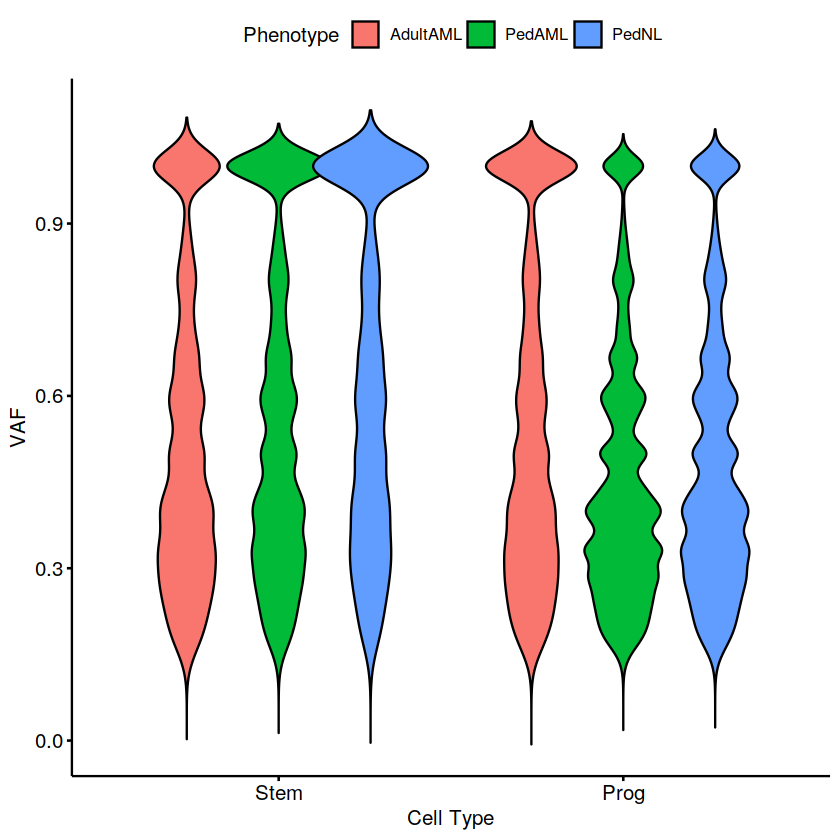

In [43]:
library(ggpubr)
ggviolin(PedAML.edits.filt, x="Cell.type", y="VAF", fill="Phenotype", xlab="Cell Type")

Warning message:
“Removed 52 rows containing non-finite values (stat_boxplot).”


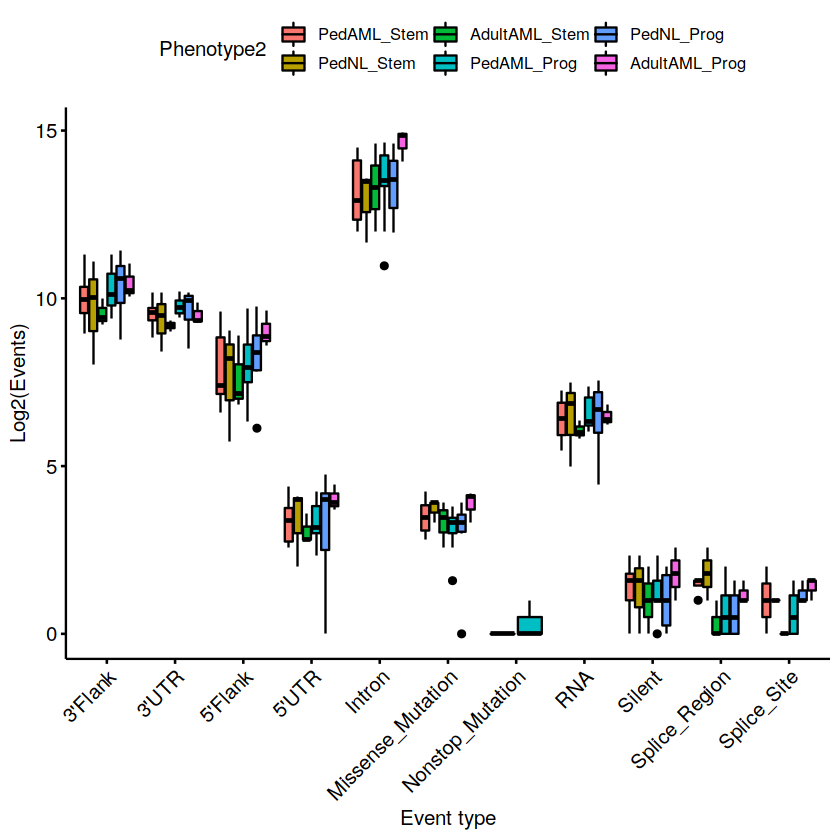

In [53]:
PedAML.edits.filt.varclass <- as.data.frame(table(PedAML.edits.filt$Variant_Classification, PedAML.edits.filt$Sample))
PedAML.edits.filt.varclass$Freq_log <- log2(PedAML.edits.filt.varclass$Freq)
PedAML.edits.filt.varclass$Cell.type <- CD38.lcpm[match(PedAML.edits.filt.varclass$Var2, CD38.lcpm$Sample),"Cell.type"]
PedAML.edits.filt.varclass$Phenotype <- CD38.lcpm[match(PedAML.edits.filt.varclass$Var2, CD38.lcpm$Sample),"group"]
PedAML.edits.filt.varclass$Phenotype2 <- paste0(PedAML.edits.filt.varclass$Phenotype, "_", PedAML.edits.filt.varclass$Cell.type)
PedAML.edits.filt.varclass$Phenotype2 <- factor(PedAML.edits.filt.varclass$Phenotype2, 
                                      levels=c("PedAML_Stem", "PedNL_Stem", "AdultAML_Stem",
                                               "PedAML_Prog", "PedNL_Prog", "AdultAML_Prog"))
#head(PedAML.edits.filt)
ggboxplot(PedAML.edits.filt.varclass, x="Var1", y="Freq_log", fill="Phenotype2", xlab="Event type", ylab="Log2(Events)") +
 theme(axis.text.x = element_text(angle = 45, hjust = 1))

,Var1,Freq,Cell.type,Phenotype,Phenotype2,Counts,CPM
,<fct>,<int>,<chr>,<fct>,<fct>,<dbl>,<dbl>
1,01id38cellHSC,7804,Stem,PedAML,PedAML_Stem,41053037,190.0956
2,01pid24760ctHSC,15570,Stem,PedNL,PedNL_Stem,39200447,397.1893
3,01x00077xPROGENIT,14010,Prog,PedAML,PedAML_Prog,29159791,480.4561
4,02id11251HSC,11546,Stem,AdultAML,AdultAML_Stem,22018607,524.3747
5,02id38cellPROGENITORS,3598,Prog,PedAML,PedAML_Prog,33880305,106.1974
6,02pid24760ctHPC,17687,Prog,PedNL,PedNL_Prog,45367079,389.8642


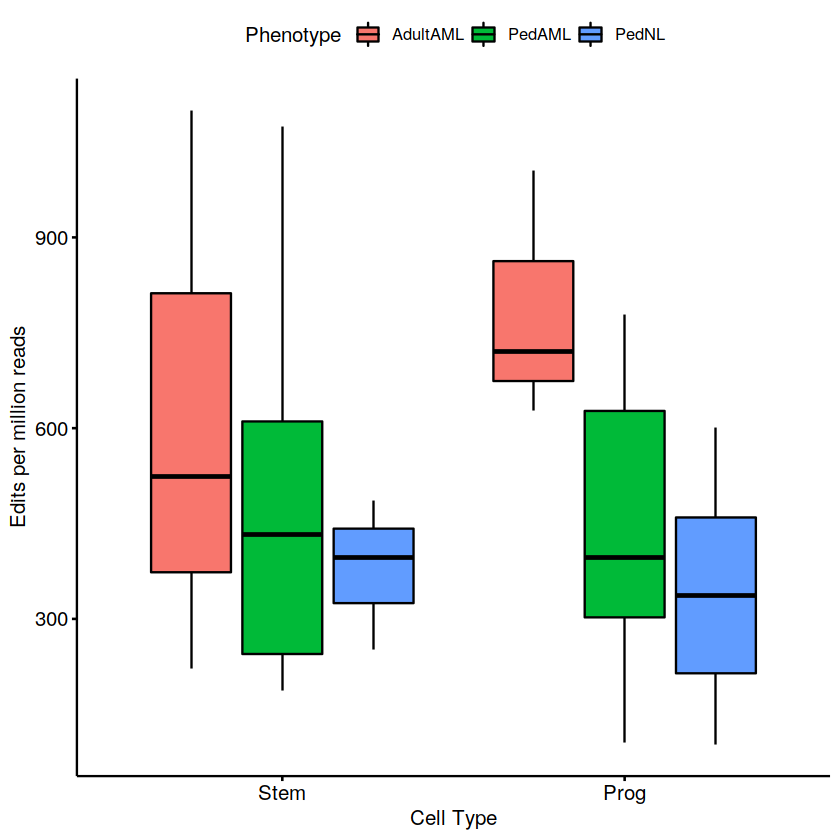

In [57]:
PedAML.edits.filt.edm <- as.data.frame(table(PedAML.edits.filt$Sample))
PedAML.edits.filt.edm$Cell.type <- CD38.lcpm[match(PedAML.edits.filt.edm$Var1, CD38.lcpm$Sample),"Cell.type"]
PedAML.edits.filt.edm$Phenotype <- CD38.lcpm[match(PedAML.edits.filt.edm$Var1, CD38.lcpm$Sample),"group"]
PedAML.edits.filt.edm$Phenotype2 <- paste0(PedAML.edits.filt.edm$Phenotype, "_", PedAML.edits.filt.edm$Cell.type)
PedAML.edits.filt.edm$Phenotype2 <- factor(PedAML.edits.filt.edm$Phenotype2, 
                                      levels=c("PedAML_Stem", "PedNL_Stem", "AdultAML_Stem",
                                               "PedAML_Prog", "PedNL_Prog", "AdultAML_Prog"))
PedAML.edits.filt.edm$Counts <- CD38.lcpm[match(PedAML.edits.filt.edm$Var1, CD38.lcpm$Sample),"lib.size"]
PedAML.edits.filt.edm$CPM <- PedAML.edits.filt.edm$Freq/(PedAML.edits.filt.edm$Counts/1000000)
head(PedAML.edits.filt.edm)
ggboxplot(PedAML.edits.filt.edm, x="Cell.type", y="CPM", fill="Phenotype", xlab="Cell Type", ylab="Edits per million reads")

In [58]:
table(PedAML.edits$Hugo_Symbol %in% "CELF2")
table(PedAML.edits$Hugo_Symbol %in% "PTBP1")


 FALSE   TRUE 
555521    118 


 FALSE   TRUE 
555624     15 

In [62]:
PedAML.edits.filt.edm

Var1,Freq,Cell.type,Phenotype,Phenotype2,Counts,CPM
<fct>,<int>,<chr>,<fct>,<fct>,<dbl>,<dbl>
01id38cellHSC,7804,Stem,PedAML,PedAML_Stem,41053037,190.0956
01pid24760ctHSC,15570,Stem,PedNL,PedNL_Stem,39200447,397.1893
01x00077xPROGENIT,14010,Prog,PedAML,PedAML_Prog,29159791,480.4561
02id11251HSC,11546,Stem,AdultAML,AdultAML_Stem,22018607,524.3747
02id38cellPROGENITORS,3598,Prog,PedAML,PedAML_Prog,33880305,106.1974
02pid24760ctHPC,17687,Prog,PedNL,PedNL_Prog,45367079,389.8642
02x11379xHSCxxxxx,27075,Stem,PedAML,PedAML_Stem,44517357,608.1897
03id78cellHSC,7524,Stem,PedAML,PedAML_Stem,28605524,263.0261
03pid24474ctHSC,14387,Stem,PedNL,PedNL_Stem,29555510,486.7789


In [71]:
l <- "PTCH1"
#write.csv(as.matrix(table(PedAML.edits.filt$Start_Position[PedAML.edits.filt$Hugo_Symbol %in% l], 
#      PedAML.edits.filt$Sample[PedAML.edits.filt$Hugo_Symbol %in% l])), file="RHOA_PedAMLedits_for_MARY.csv")
table(PedAML.edits.filt$Start_Position[PedAML.edits.filt$Hugo_Symbol %in% l], 
      PedAML.edits.filt$Phenotype[PedAML.edits.filt$Hugo_Symbol %in% l])

          
           AdultAML PedAML PedNL
  98252511        0      1     0
  98252576        0      1     0
  98252592        0      1     0
  98252749        0      1     0

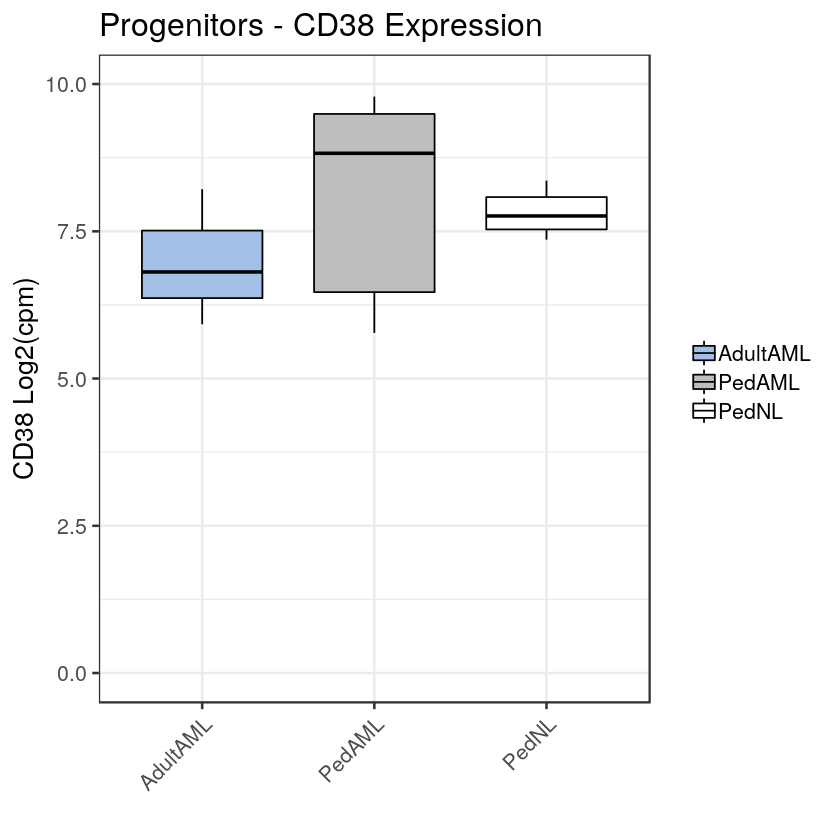

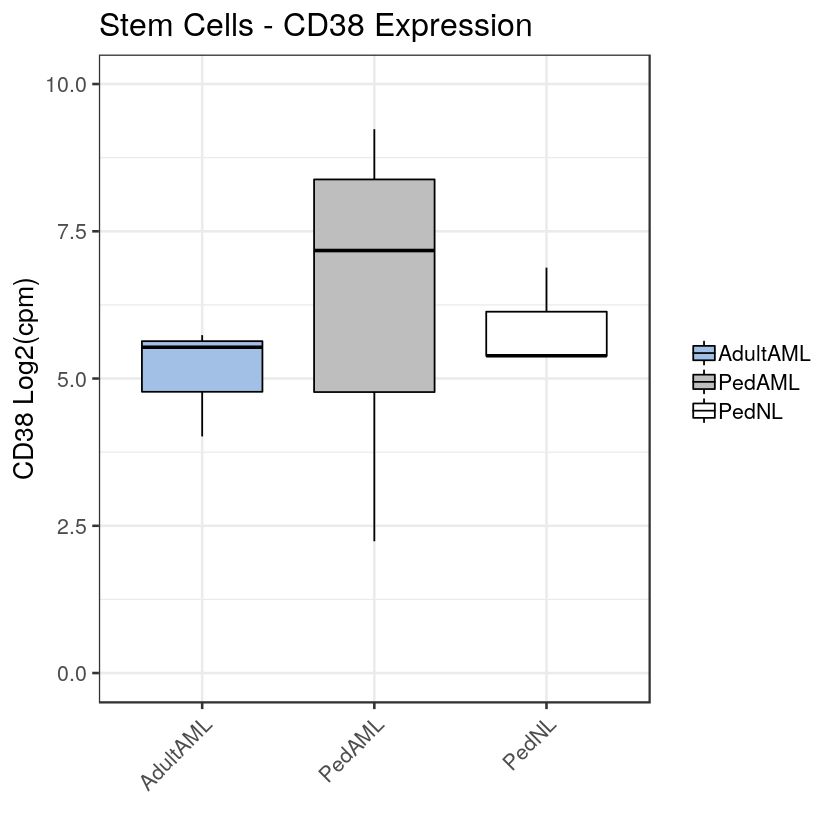

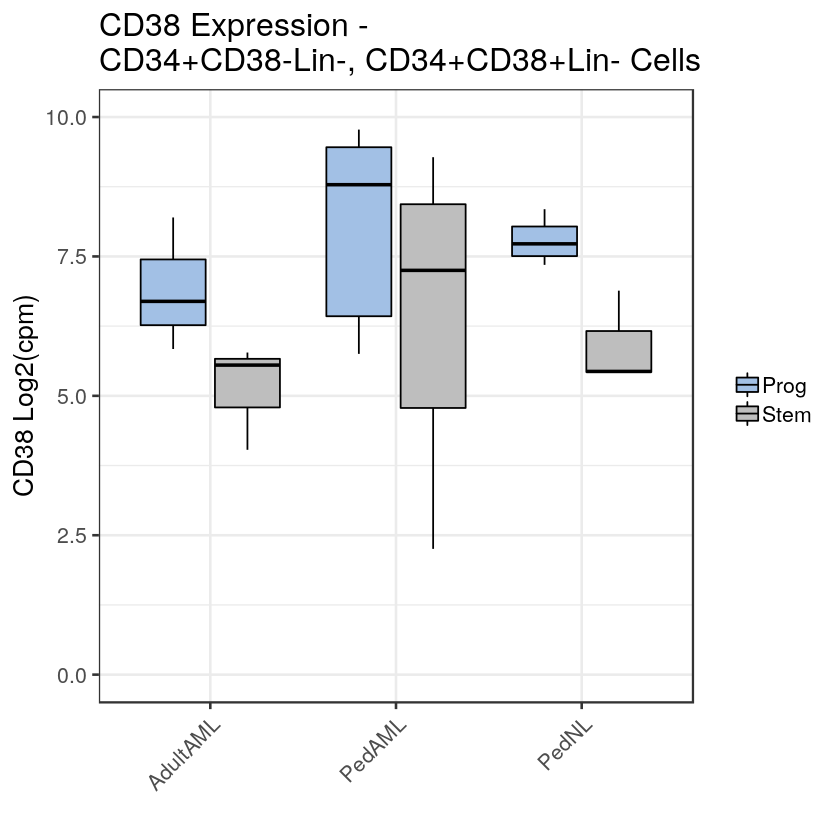

In [258]:
library(ggpubr)
colnames(CD38.lcpm)[1]<- colnames(CD38.lcpm.prog)[1] <- colnames(CD38.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_CD38expr_Prog_07202020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD38.lcpm.prog, x="Phenotype", y="ENSG00000004468", fill="Phenotype", 
          palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("CD38 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="Progenitors - CD38 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD38expr_Stem_07202020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD38.lcpm.stem, x="Phenotype", y="ENSG00000004468", fill="Phenotype", 
          palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("CD38 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="Stem Cells - CD38 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD38expr_Stem_Prog_07202020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD38.lcpm[,-18], x="Phenotype", y="ENSG00000004468", fill="Cell.type", 
          palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("CD38 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD38 Expression - 
CD34+CD38-Lin-, CD34+CD38+Lin- Cells") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

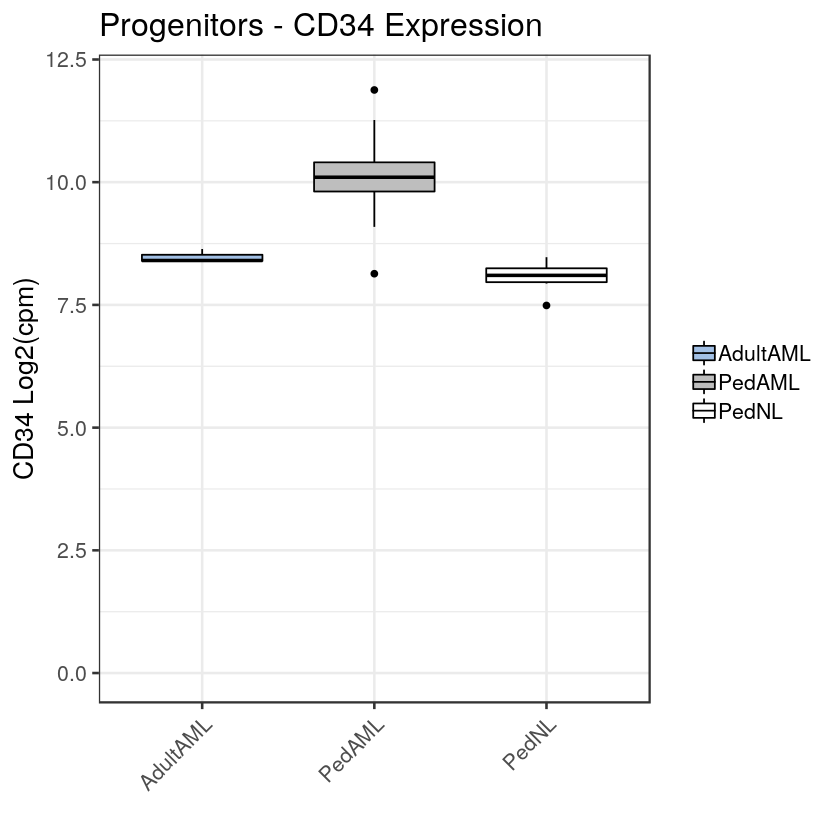

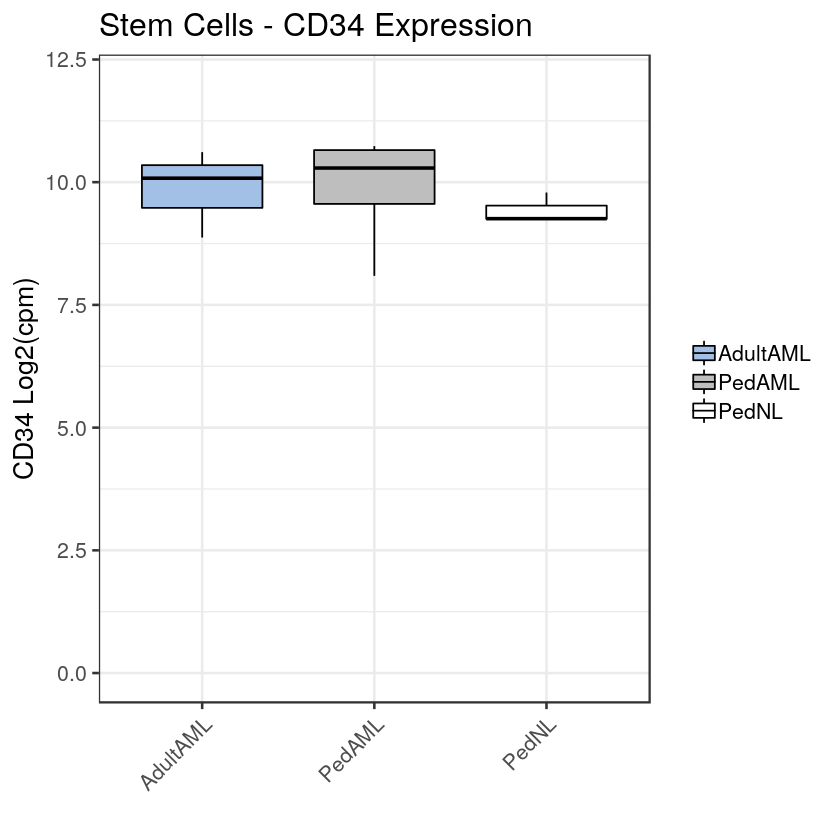

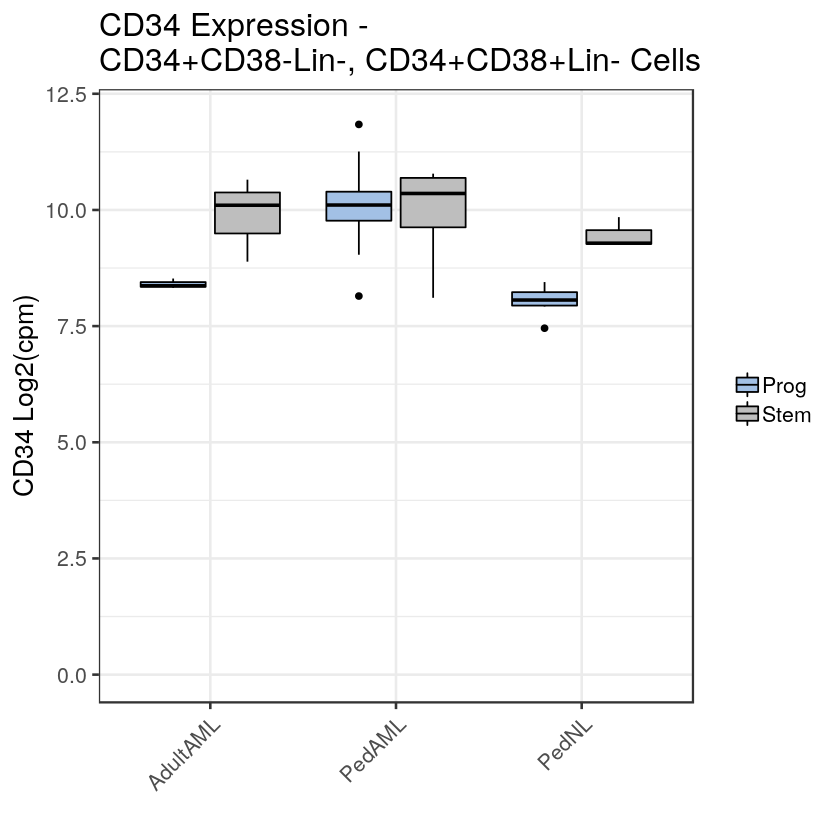

In [257]:
library(ggpubr)
colnames(CD34.lcpm)[1]<- colnames(CD34.lcpm.prog)[1] <- colnames(CD34.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_CD34expr_Prog_07202020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD34.lcpm.prog, x="Phenotype", y="ENSG00000174059", fill="Phenotype", 
          palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("CD34 Log2(cpm)") + xlab("") + ylim(0,12) +
    labs(title="Progenitors - CD34 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD34expr_Stem_07202020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD34.lcpm.stem, x="Phenotype", y="ENSG00000174059", fill="Phenotype", 
          palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("CD34 Log2(cpm)") + xlab("") + ylim(0,12) +
    labs(title="Stem Cells - CD34 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD34expr_Stem_Prog_07202020.png", width=7, height=7, units='in', res=300)
ggboxplot(CD34.lcpm[,-18], x="Phenotype", y="ENSG00000174059", fill="Cell.type", 
          palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("CD34 Log2(cpm)") + xlab("") + ylim(0,12) +
    labs(title="CD34 Expression - 
CD34+CD38-Lin-, CD34+CD38+Lin- Cells") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

png 
  2

png 
  2

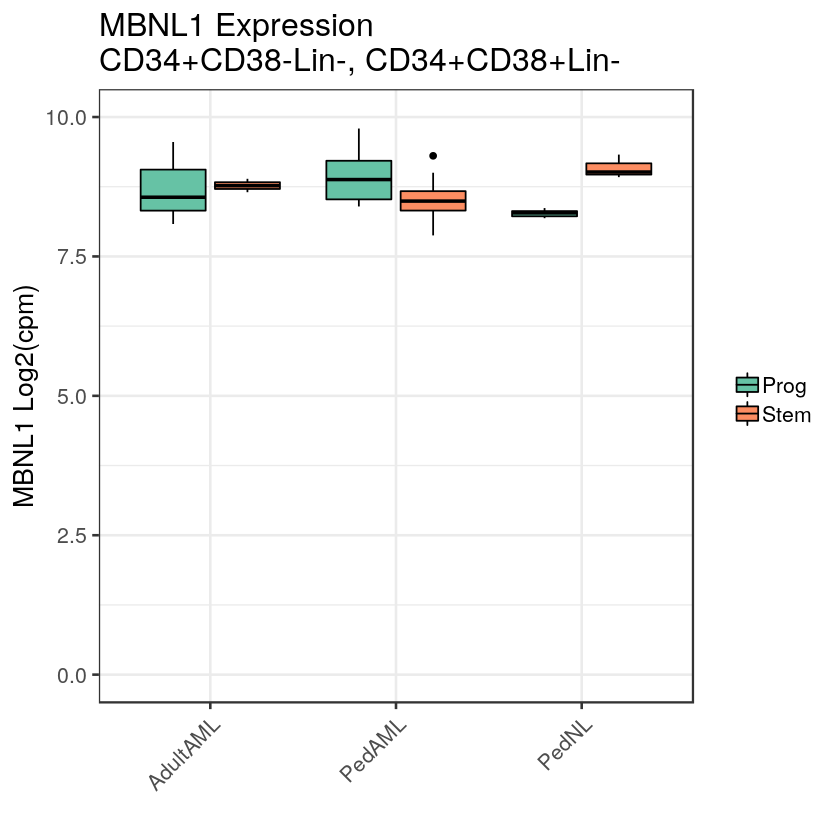

In [110]:

colnames(MBNL1.lcpm)[1]<- colnames(MBNL1.lcpm.prog)[1] <- colnames(MBNL1.lcpm.stem)[1] <- "Phenotype"
MBNL1.lcpm.prog$ENSG00000152601[which(MBNL1.lcpm.prog$ENSG00000152601 < 0)] <- 0
png(file="PedAML_MBNL1expr_Prog_10292020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MBNL1.lcpm.prog, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000152601", 
          fill="Phenotype", palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("MBNL1 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38+Lin- - MBNL1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
dev.off()
MBNL1.lcpm.stem$ENSG00000152601[which(MBNL1.lcpm.stem$ENSG00000152601 < 0)] <- 0
png(file="PedAML_MBNL1expr_Stem_10292020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MBNL1.lcpm.stem, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000152601", 
          fill="Phenotype", palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("MBNL1 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="CD34+CD38-Lin- - MBNL1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
dev.off()

#png(file="PedAML_MBNL1expr_Stem_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(MBNL1.lcpm[,-18], x="Phenotype", y="ENSG00000152601", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("MBNL1 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="MBNL1 Expression
CD34+CD38-Lin-, CD34+CD38+Lin-") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

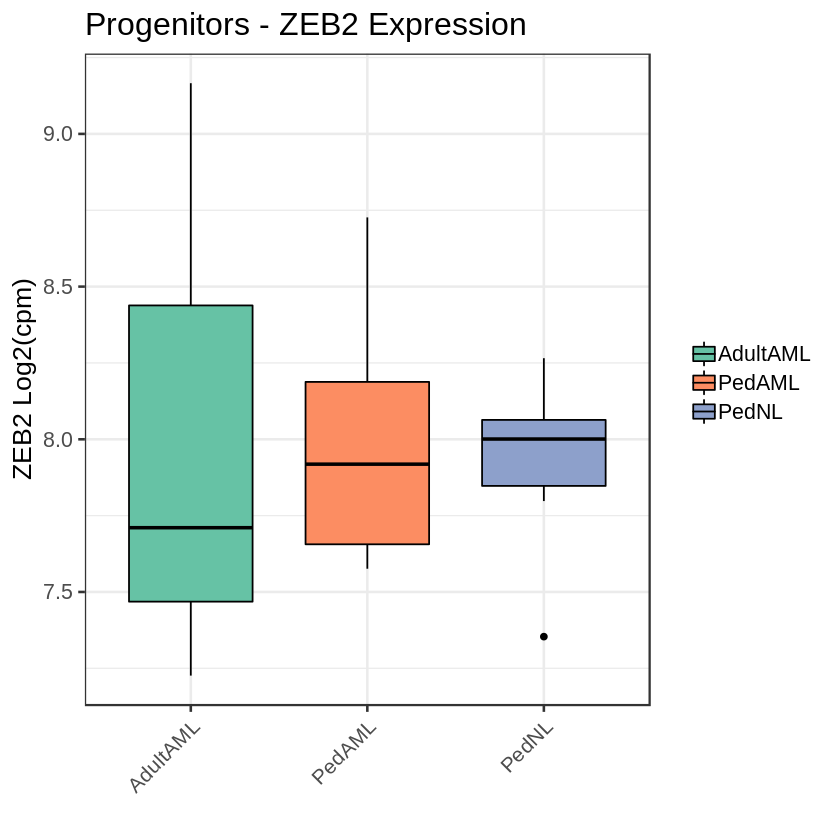

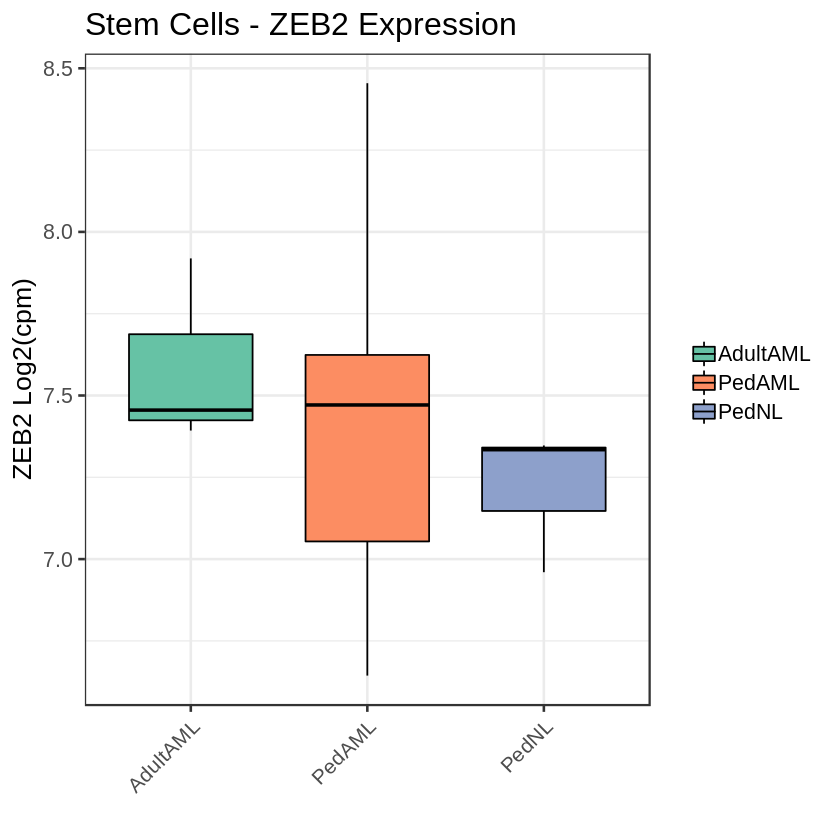

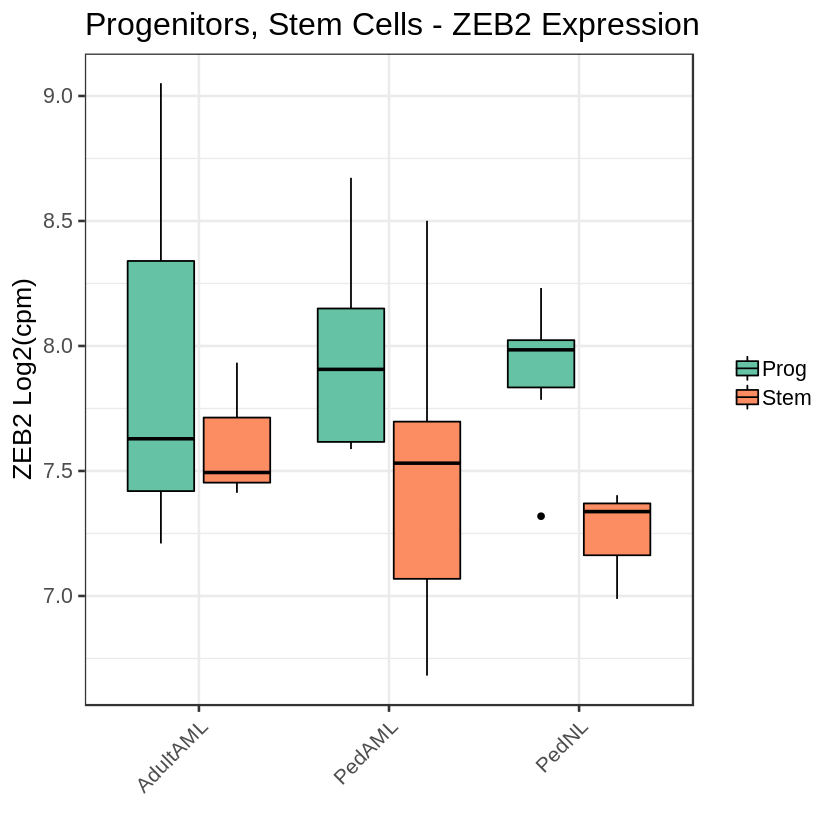

In [74]:

colnames(ZEB2.lcpm)[1]<- colnames(ZEB2.lcpm.prog)[1] <- colnames(ZEB2.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_ZEB2expr_Prog_04082020.png", width=7, height=7, units='in', res=300)
ggboxplot(ZEB2.lcpm.prog, x="Phenotype", y="ENSG00000169554", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ZEB2 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - ZEB2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_ZEB2expr_Stem_04082020.png", width=7, height=7, units='in', res=300)
ggboxplot(ZEB2.lcpm.stem, x="Phenotype", y="ENSG00000169554", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ZEB2 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38-Lin- - ZEB2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_ZEB2expr_Stem_Prog_04082020.png", width=7, height=7, units='in', res=300)
ggboxplot(ZEB2.lcpm[,-18], x="Phenotype", y="ENSG00000169554", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("ZEB2 Log2(cpm)") + xlab("") + 
    labs(title="ZEB2 Expression
CD34+CD38-Lin-, CD34+CD38+Lin-") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

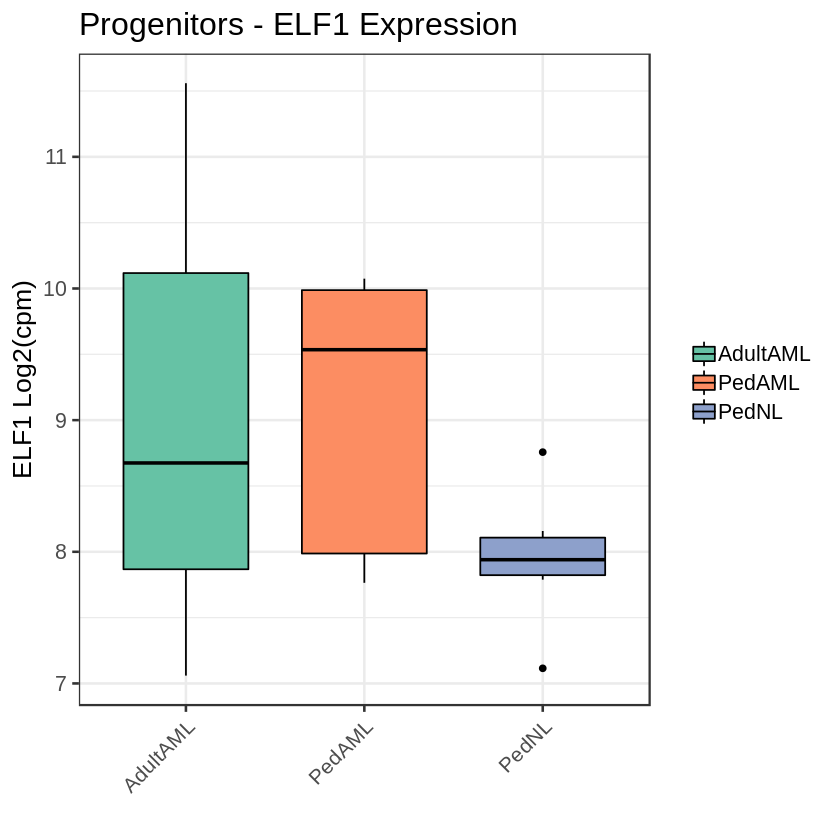

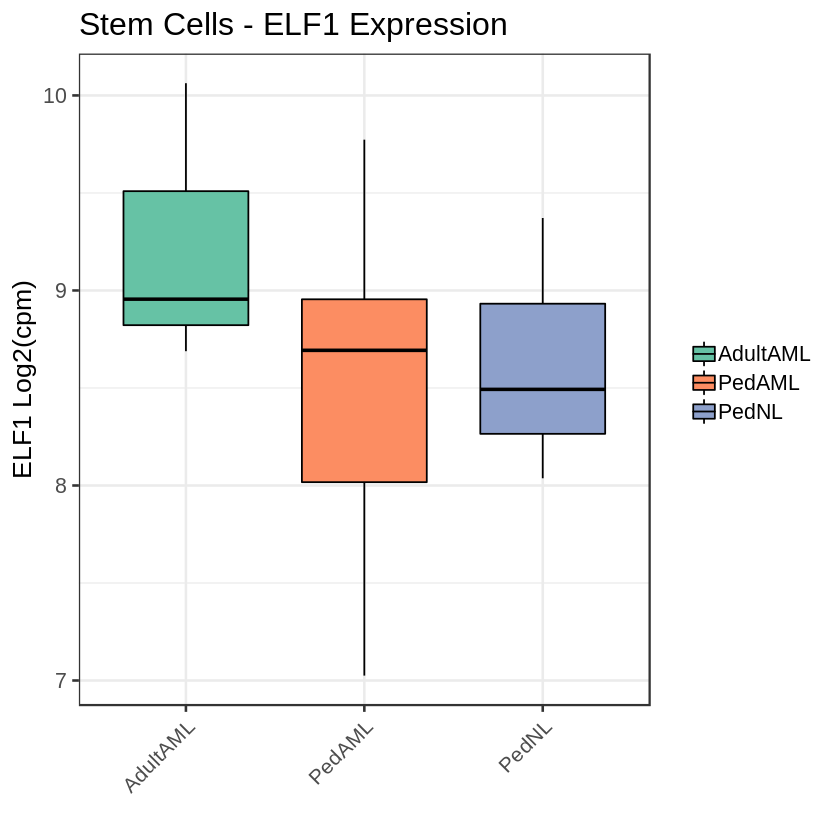

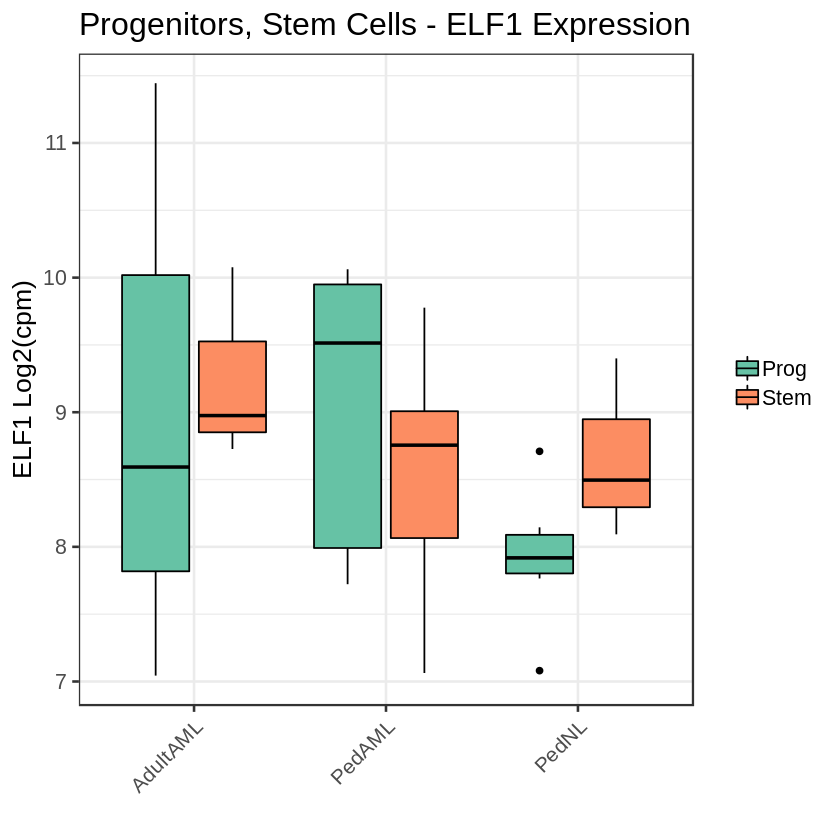

In [72]:

colnames(ELF1.lcpm)[1]<- colnames(ELF1.lcpm.prog)[1] <- colnames(ELF1.lcpm.stem)[1] <- "Phenotype"

#png(file="PedAML_ELF1expr_Prog_04082020.png", width=7, height=7, units='in', res=300)
ggboxplot(ELF1.lcpm.prog, x="Phenotype", y="ENSG00000120690", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ELF1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors - ELF1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_ELF1expr_Stem_04082020.png", width=7, height=7, units='in', res=300)
ggboxplot(ELF1.lcpm.stem, x="Phenotype", y="ENSG00000120690", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ELF1 Log2(cpm)") + xlab("") + 
    labs(title="Stem Cells - ELF1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_ELF1expr_Stem_Prog_04082020.png", width=7, height=7, units='in', res=300)
ggboxplot(ELF1.lcpm[,-18], x="Phenotype", y="ENSG00000120690", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("ELF1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - ELF1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [127]:
head(CD38.lcpm.prog)

,Phenotype,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,ENSG00000004468
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
02id38cellPROGENITORS,PedAML,33857287,0.9828611,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,5.774219
06id90cellPROGENITORS,PedAML,33182123,0.8321179,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,6.466751
04id78cellPROGENITORS,PedAML,41582383,0.9294246,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,9.467904
06id00066PRO,PedAML,30046504,1.1581854,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883,9.492292
01x00077xPROGENIT,PedAML,29106100,0.9036754,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108,8.824232
03x11379xHPCxxxxx,PedAML,42324440,1.0968453,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550,9.662329


In [77]:
library(ggpubr)
colnames(SF3B1.lcpm)[1]<- colnames(SF3B1.lcpm.prog)[1] <- colnames(SF3B1.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_SF3B1expr_Prog_05192020.png", width=7, height=7, units='in', res=300)
ggboxplot(SF3B1.lcpm.prog, x="Phenotype", y="ENSG00000115524", fill="Phenotype", palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("SF3B1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors - SF3B1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_SF3B1expr_Stem_05192020.png", width=7, height=7, units='in', res=300)
ggboxplot(SF3B1.lcpm.stem, x="Phenotype", y="ENSG00000115524", fill="Phenotype", palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("SF3B1 Log2(cpm)") + xlab("") + 
    labs(title="Stem Cells - SF3B1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_SF3B1expr_Stem_Prog_05192020.png", width=7, height=7, units='in', res=300)
ggboxplot(SF3B1.lcpm[,-18], x="Phenotype", y="ENSG00000115524", fill="Cell.type", palette=c("#A2C0E5", "gray", "white")) +
    theme_bw(base_size=16) + ylab("SF3B1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - SF3B1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png 
  2

png 
  2

png 
  2

Warning message:
“Removed 7 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 7 rows containing non-finite values (stat_compare_means).”
Warning message:
“Computation failed in `stat_compare_means()`:
not enough 'x' observations”


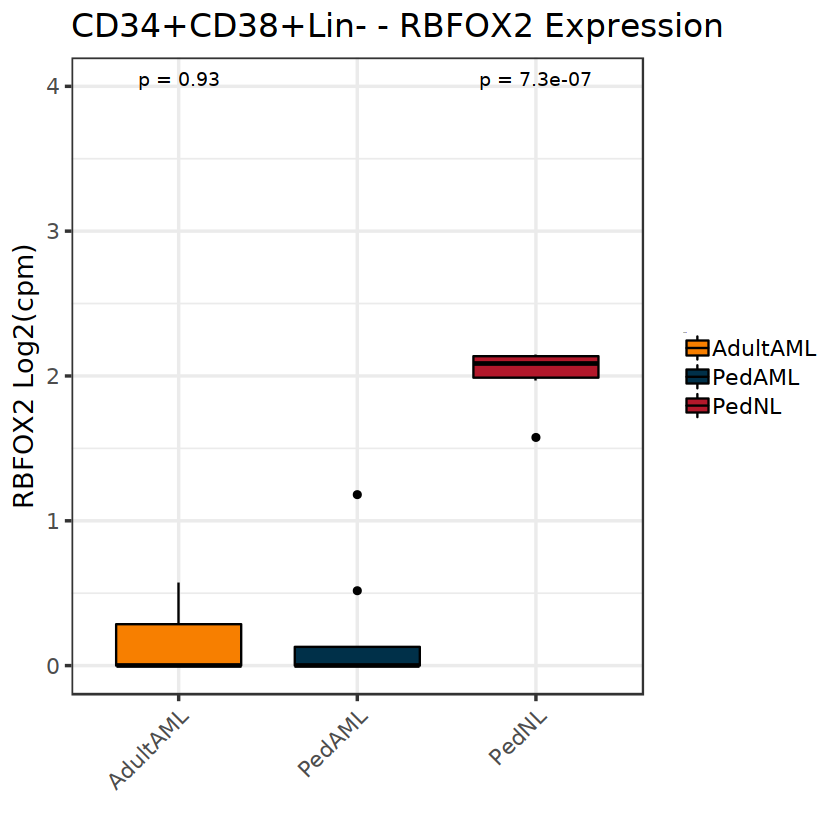

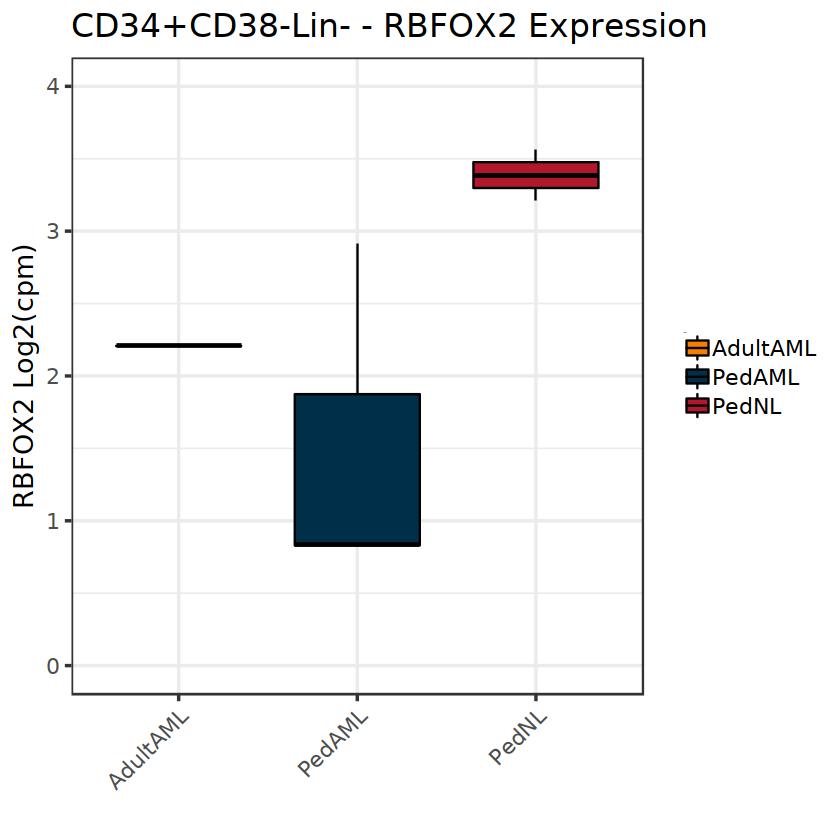

In [82]:
#        pal1 <- c("#009292","#490092","#b6dbff")
#        pal2 <- c("#2166AC","#F4A582","#B2182B")
# Adult AML #f77f00; Pediatric AML #003049; Non-Leukemic "#B2182B".
# c("#f77f00","#003049","#B2182B")

library(ggpubr)
colnames(RBFOX2.lcpm)[1]<- colnames(RBFOX2.lcpm.prog)[1] <- colnames(RBFOX2.lcpm.stem)[1] <- "Phenotype"
RBFOX2.lcpm.prog$ENSG00000100320[which(RBFOX2.lcpm.prog$ENSG00000100320 < 0)] <- 0
ggboxplot(subset(RBFOX2.lcpm.prog[-12,]), x="Phenotype", y="ENSG00000100320",
          fill="Phenotype", palette=c("#f77f00","#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="CD34+CD38+Lin- - RBFOX2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")

ggboxplot(subset(RBFOX2.lcpm.stem[-12,]), x="Phenotype", y="ENSG00000100320", 
          fill="Phenotype", palette=c("#f77f00","#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="CD34+CD38-Lin- - RBFOX2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")

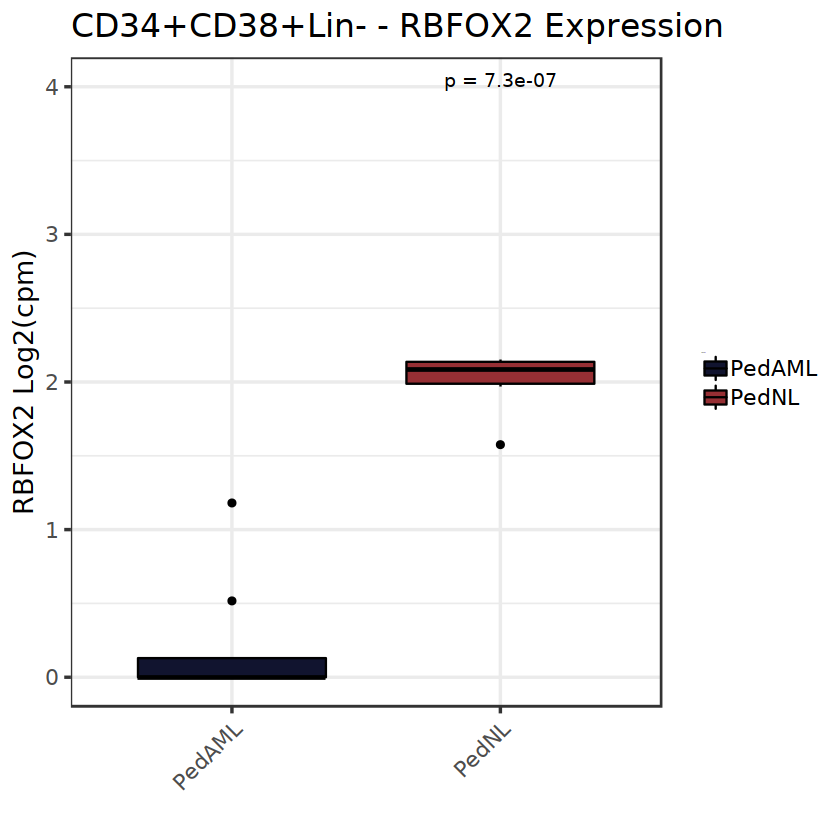

Warning message:
“Removed 15 rows containing non-finite values (stat_boxplot).”


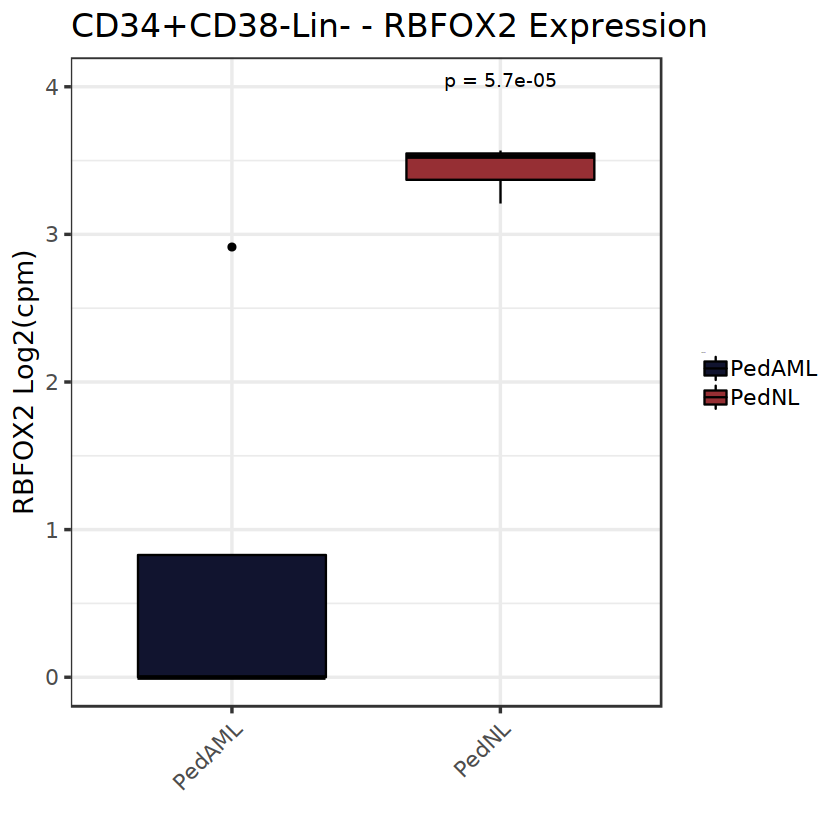

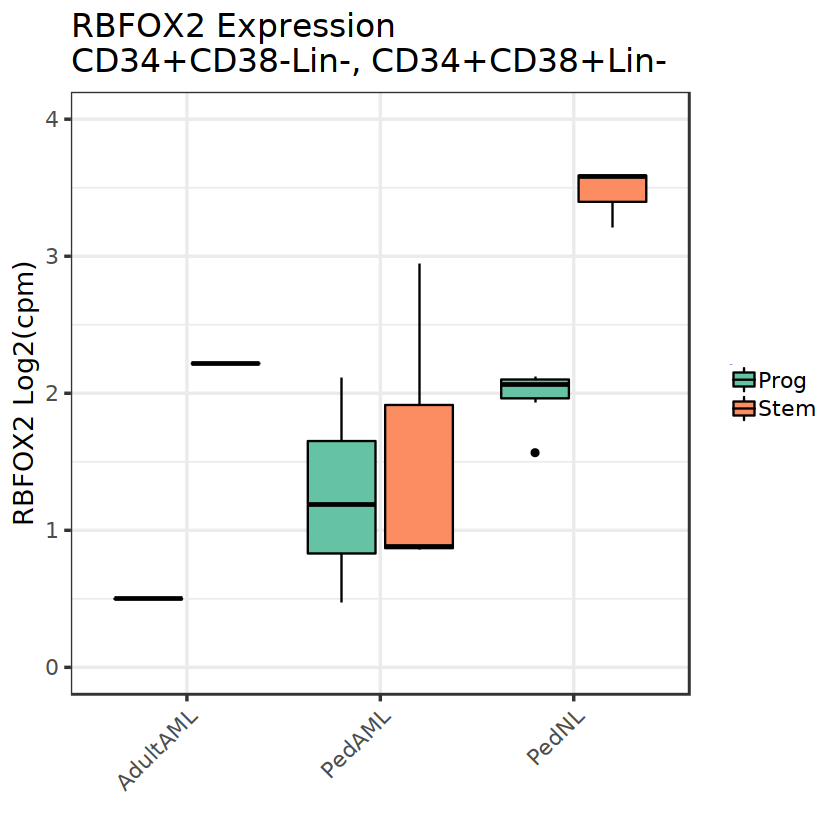

In [49]:
colnames(RBFOX2.lcpm)[1]<- colnames(RBFOX2.lcpm.prog)[1] <- colnames(RBFOX2.lcpm.stem)[1] <- "Phenotype"
RBFOX2.lcpm.prog$ENSG00000100320[which(RBFOX2.lcpm.prog$ENSG00000100320 < 0)] <- 0
#png(file="PedAML_RBFOX2expr_Prog_05192020.png", width=7, height=7, units='in', res=300)
options(repr.plot.width=7, repr.plot.height=7)
ggboxplot(subset(RBFOX2.lcpm.prog[-12,], Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000100320", 
          fill="Phenotype", palette=c( "#11142F","#962F34")) +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="CD34+CD38+Lin- - RBFOX2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
#dev.off()

RBFOX2.lcpm.stem$ENSG00000100320[which(RBFOX2.lcpm.stem$ENSG00000100320 < 0)] <- 0
#png(file="PedAML_RBFOX2expr_Stem_05192020.png", width=7, height=7, units='in', res=300)
options(repr.plot.width=7, repr.plot.height=7)
ggboxplot(subset(RBFOX2.lcpm.stem, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000100320", 
          fill="Phenotype", palette=c( "#11142F","#962F34")) +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="CD34+CD38-Lin- - RBFOX2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
#dev.off()

#png(file="PedAML_RBFOX2expr_Stem_Prog_05042020.png", width=7, height=7, units='in', res=300)
options(repr.plot.width=7, repr.plot.height=7)
ggboxplot(RBFOX2.lcpm[,-18], x="Phenotype", y="ENSG00000100320", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="RBFOX2 Expression
CD34+CD38-Lin-, CD34+CD38+Lin-") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

Warning message in set.seed(123):
“'.Random.seed' is not an integer vector but of type 'double', so ignored”


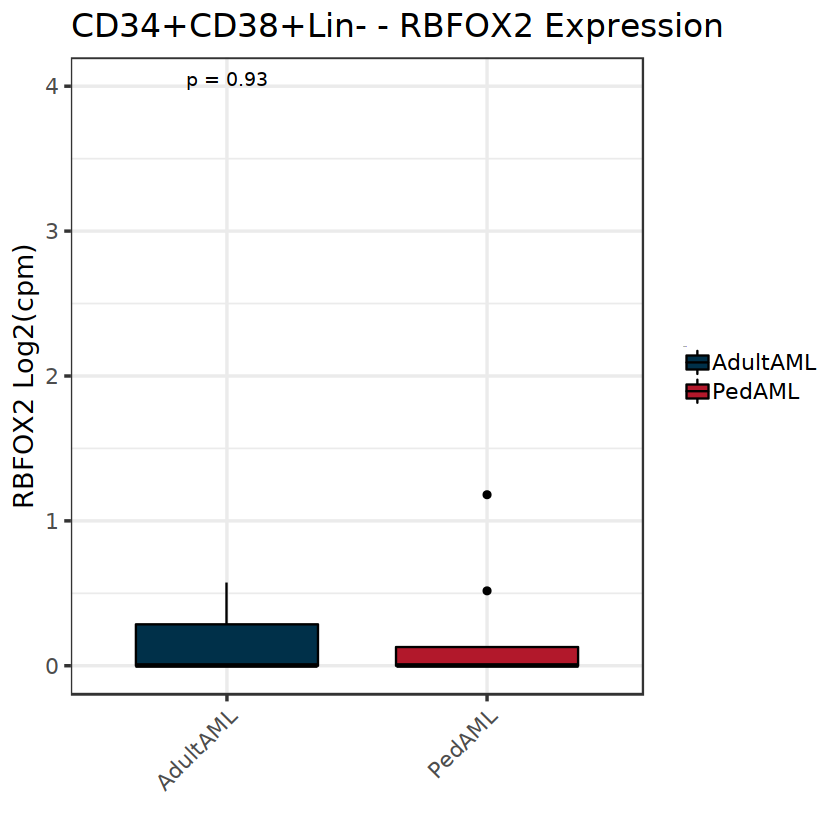

Warning message:
“Removed 15 rows containing non-finite values (stat_boxplot).”


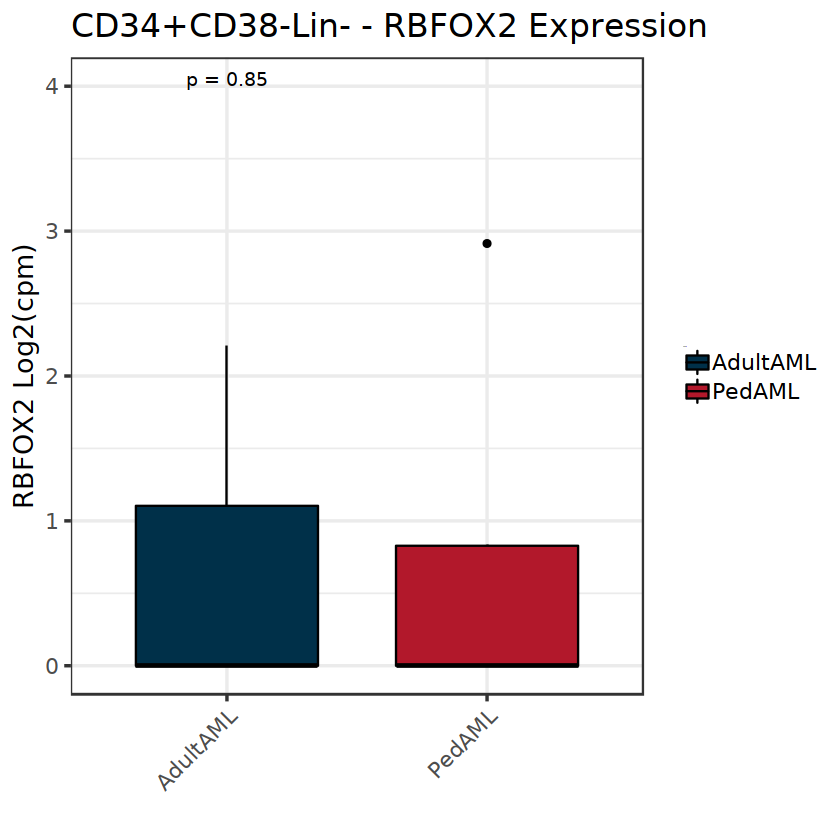

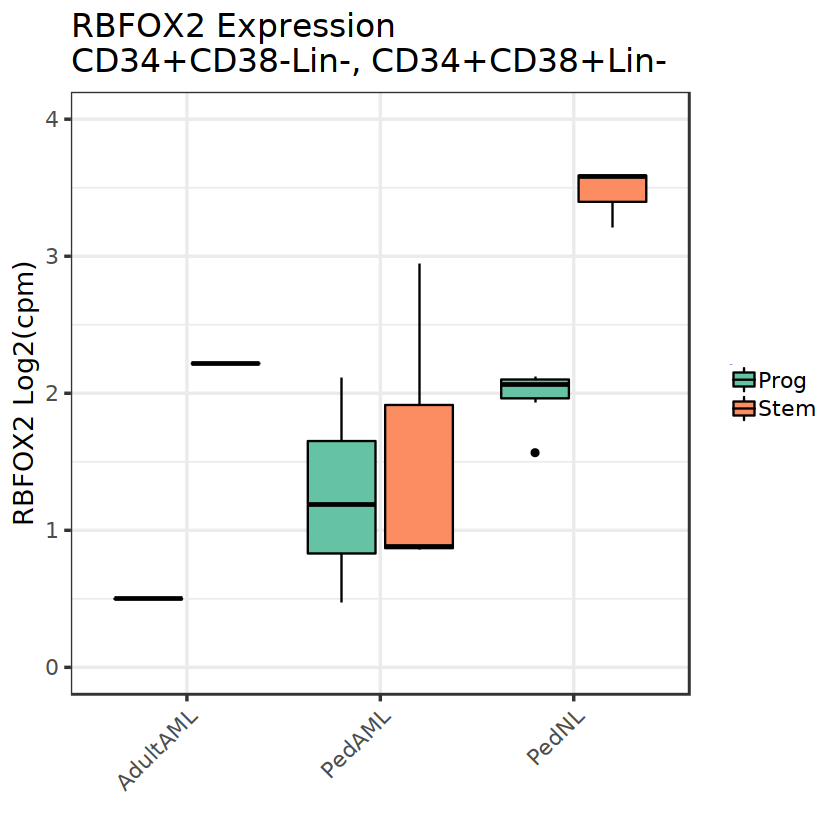

In [43]:
colnames(RBFOX2.lcpm)[1]<- colnames(RBFOX2.lcpm.prog)[1] <- colnames(RBFOX2.lcpm.stem)[1] <- "Phenotype"
RBFOX2.lcpm.prog$ENSG00000100320[which(RBFOX2.lcpm.prog$ENSG00000100320 < 0)] <- 0
#png(file="PedAML_RBFOX2expr_Prog_05192020.png", width=7, height=7, units='in', res=300)
options(repr.plot.width=7, repr.plot.height=7)
ggboxplot(subset(RBFOX2.lcpm.prog[-12,], Phenotype != "PedNL"), x="Phenotype", y="ENSG00000100320", 
          fill="Phenotype", palette=c("#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="CD34+CD38+Lin- - RBFOX2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
#dev.off()

RBFOX2.lcpm.stem$ENSG00000100320[which(RBFOX2.lcpm.stem$ENSG00000100320 < 0)] <- 0
#png(file="PedAML_RBFOX2expr_Stem_05192020.png", width=7, height=7, units='in', res=300)
options(repr.plot.width=7, repr.plot.height=7)
ggboxplot(subset(RBFOX2.lcpm.stem, Phenotype != "PedNL"), x="Phenotype", y="ENSG00000100320", 
          fill="Phenotype", palette=c("#003049","#B2182B")) +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="CD34+CD38-Lin- - RBFOX2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
#dev.off()

#png(file="PedAML_RBFOX2expr_Stem_Prog_05042020.png", width=7, height=7, units='in', res=300)
options(repr.plot.width=7, repr.plot.height=7)
ggboxplot(RBFOX2.lcpm[,-18], x="Phenotype", y="ENSG00000100320", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("RBFOX2 Log2(cpm)") + xlab("") + ylim(0,4) +
    labs(title="RBFOX2 Expression
CD34+CD38-Lin-, CD34+CD38+Lin-") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [92]:
colnames(ADAR1.lcpm)[1]<- colnames(ADAR1.lcpm.prog)[1] <- colnames(ADAR1.lcpm.stem)[1] <- "Phenotype"

png(file="PedAML_ADAR1expr_Prog_04132020.png", width=7, height=7, units='in', res=300)
ggboxplot(ADAR1.lcpm.prog, x="Phenotype", y="ENSG00000160710", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ADAR1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors - ADAR1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_ADAR1expr_Stem_04132020.png", width=7, height=7, units='in', res=300)
ggboxplot(ADAR1.lcpm.stem, x="Phenotype", y="ENSG00000160710", fill="Phenotype", palette="Set2") +
    theme_bw(base_size=16) + ylab("ADAR1 Log2(cpm)") + xlab("") + 
    labs(title="Stem Cells - ADAR1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png(file="PedAML_ADAR1expr_Stem_Prog_04132020.png", width=7, height=7, units='in', res=300)
ggboxplot(ADAR1.lcpm[,-18], x="Phenotype", y="ENSG00000160710", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("ADAR1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - ADAR1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

png 
  2

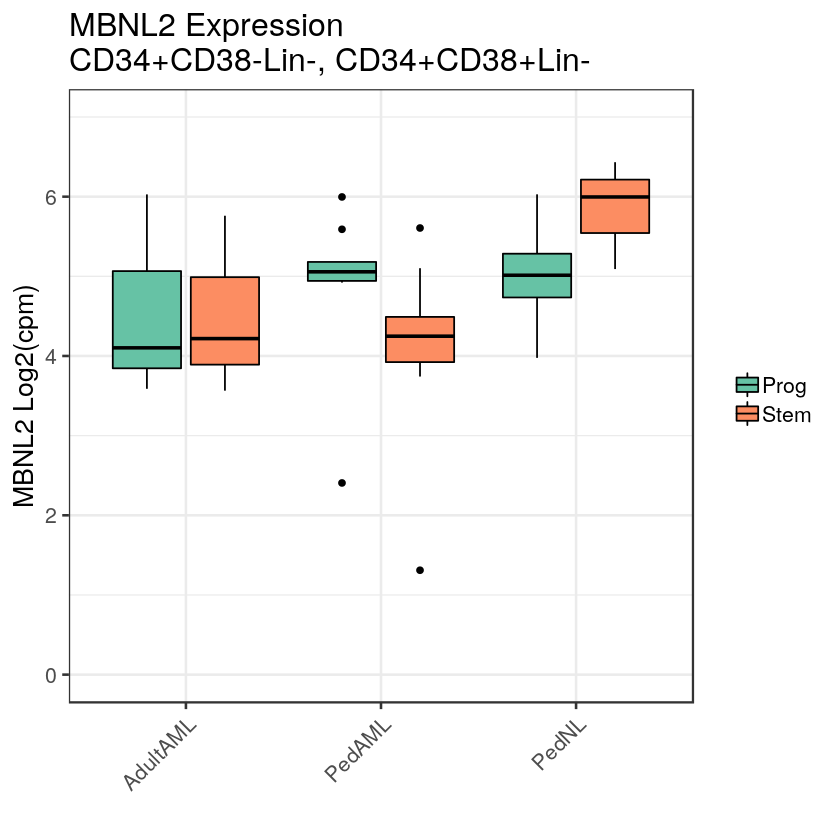

In [117]:
colnames(MBNL2.lcpm)[1]<- colnames(MBNL2.lcpm.prog)[1] <- colnames(MBNL2.lcpm.stem)[1] <- "Phenotype"
MBNL2.lcpm.prog$ENSG00000139793[which(MBNL2.lcpm.prog$ENSG00000139793 < 0)] <- 0
png(file="PedAML_MBNL2expr_Prog_10292020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MBNL2.lcpm.prog, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000139793", 
          fill="Phenotype", palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("MBNL2 Log2(cpm)") + xlab("") +  ylim(0,7) +
    labs(title="CD34+CD38+Lin- - MBNL2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
dev.off()
MBNL2.lcpm.prog$ENSG00000139793[which(MBNL2.lcpm.prog$ENSG00000139793 < 0)] <- 0
png(file="PedAML_MBNL2expr_Stem_10292020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MBNL2.lcpm.stem, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000139793", 
          fill="Phenotype", palette=c("#657991", "#C4C7C9")) +
    theme_bw(base_size=16) + ylab("MBNL2 Log2(cpm)") + xlab("") +  ylim(0,7) +
    labs(title="CD34+CD38-Lin- - MBNL2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
dev.off()

#png(file="PedAML_MBNL2expr_Stem_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(MBNL2.lcpm[,-18], x="Phenotype", y="ENSG00000139793", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("MBNL2 Log2(cpm)") + xlab("") + ylim(0,7) +
    labs(title="MBNL2 Expression
CD34+CD38-Lin-, CD34+CD38+Lin-") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

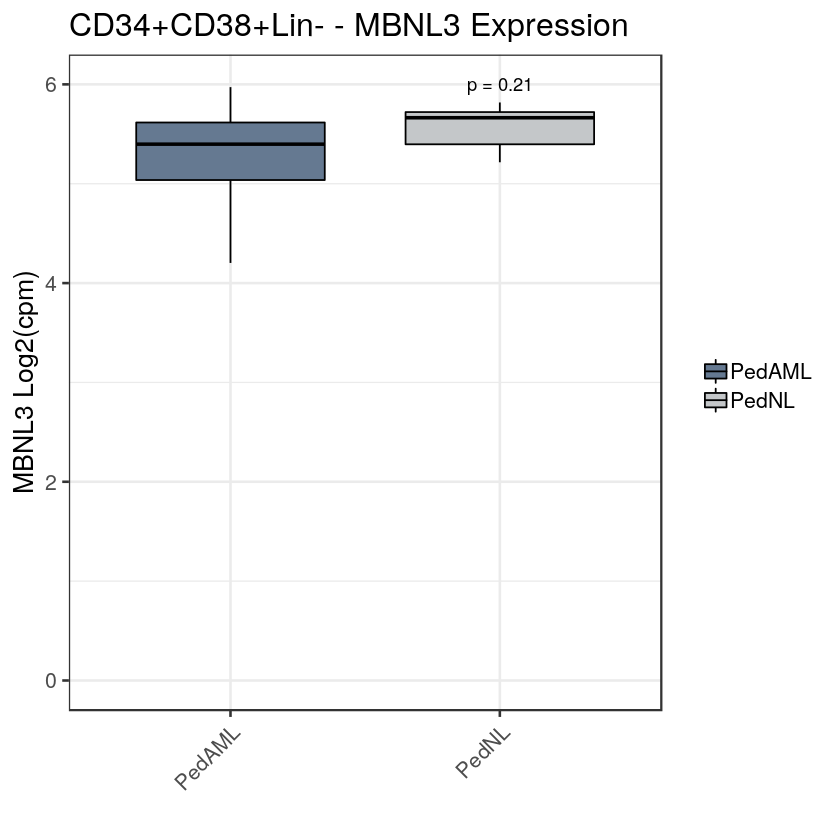

png 
  2

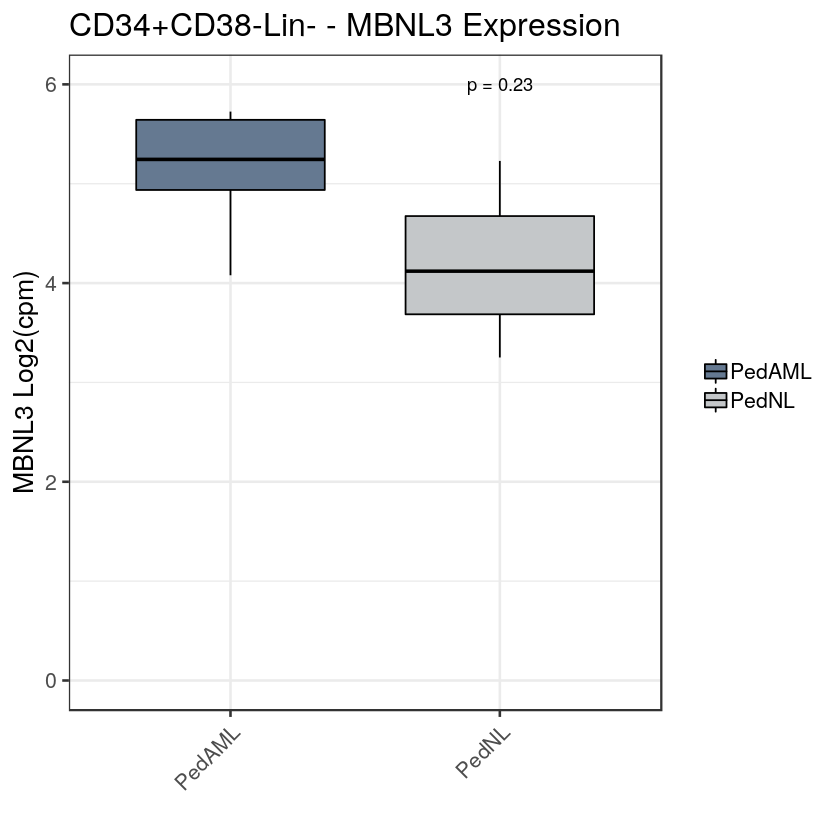

In [114]:
colnames(MBNL3.lcpm)[1]<- colnames(MBNL3.lcpm.prog)[1] <- colnames(MBNL3.lcpm.stem)[1] <- "Phenotype"
MBNL3.lcpm.prog$ENSG00000076770[which(MBNL3.lcpm.prog$ENSG00000076770 < 0)] <- 0

#png(file="PedAML_MBNL3expr_Prog_10292020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MBNL3.lcpm.prog, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000076770", 
          fill="Phenotype", palette=c("#657991", "#C4C7C9")) + ylim(0,6) +
    theme_bw(base_size=16) + ylab("MBNL3 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38+Lin- - MBNL3 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
#dev.off()
MBNL3.lcpm.stem$ENSG00000076770[which(MBNL3.lcpm.stem$ENSG00000076770 < 0)] <- 0

#png(file="PedAML_MBNL3expr_Stem_10292020.png", width=7, height=7, units='in', res=300)
ggboxplot(subset(MBNL3.lcpm.stem, Phenotype != "AdultAML"), x="Phenotype", y="ENSG00000076770", 
          fill="Phenotype", palette=c("#657991", "#C4C7C9")) + ylim(0,6) +
    theme_bw(base_size=16) + ylab("MBNL3 Log2(cpm)") + xlab("") + 
    labs(title="CD34+CD38-Lin- - MBNL3 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_compare_means(method="t.test", label = "p.format", ref.group="PedAML")
#dev.off()

png(file="PedAML_MBNL3expr_Stem_Prog_05042020.png", width=7, height=7, units='in', res=300)
ggboxplot(MBNL3.lcpm[,-18], x="Phenotype", y="ENSG00000076770", fill="Cell.type", palette="Set2") +
    theme_bw(base_size=16) + ylab("MBNL3 Log2(cpm)") + xlab("") + ylim(0,10) +
    labs(title="MBNL3 Expression
CD34+CD38-Lin-, CD34+CD38+Lin-") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
dev.off()

In [77]:
dim(CD38.lcpm)
head(CD38.lcpm)

[1] 32 19

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,Phenotype,ENSG00000004468
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>
01id38cellHSC,PedAML,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,PedAML.Stem,7.244924
02id38cellPROGENITORS,PedAML,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,PedAML.Prog,5.752657
cell05id90HSC,PedAML,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,PedAML.Stem,9.279131
06id90cellPROGENITORS,PedAML,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,PedAML.Prog,6.426926
03id78cellHSC,PedAML,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,PedAML.Stem,4.902766
04id78cellPROGENITORS,PedAML,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,PedAML.Prog,9.457758


In [95]:
class(CD38.lcpm$Patient.ID)
unique(CD38.lcpm$Patient.ID)
class(CD38.lcpm$Phenotype)
unique(CD38.lcpm$Phenotype)
CD38.lcpm

[1] "factor"

[1] 32538 22390 28678 22666 11474 11251 27177 11379 11868 12747 17677 7023 
[13] 11220 12682 12488 12584 12451 10720 24760 24474 25376
21 Levels: 32538 22390 28678 22666 11379 12584 12488 12451 27177 ... 17677

[1] "factor"

[1] PedAML.Stem   PedAML.Prog   AdultAML.Stem PedNL.Prog    AdultAML.Prog
[6] PedNL.Stem   
6 Levels: PedAML.Stem PedAML.Prog AdultAML.Stem AdultAML.Prog ... PedNL.Prog

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,Phenotype,ENSG00000004468
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<fct>,<dbl>
01id38cellHSC,PedAML,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,PedAML.Stem,7.244924
02id38cellPROGENITORS,PedAML,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,PedAML.Prog,5.752657
cell05id90HSC,PedAML,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,PedAML.Stem,9.279131
06id90cellPROGENITORS,PedAML,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,PedAML.Prog,6.426926
03id78cellHSC,PedAML,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,PedAML.Stem,4.902766
04id78cellPROGENITORS,PedAML,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,PedAML.Prog,9.457758
05id00066HSC,PedAML,15897883,1.2330452,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907,PedAML.Stem,8.410728
06id00066PRO,PedAML,30068212,1.1915671,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883,PedAML.Prog,9.450258
04id11474HSC,AdultAML,25477749,1.1069966,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032,AdultAML.Stem,5.775755


[1] 9

[1] 8


	Welch Two Sample t-test

data:  CD38.lcpm.pedAML.Prog$ENSG00000004468 and CD38.lcpm.pedAML.Stem$ENSG00000004468
t = 1.5879, df = 11.974, p-value = 0.1383
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.6004813  3.8248657
sample estimates:
mean of x mean of y 
 8.147168  6.534976 



	Paired t-test

data:  CD38.lcpm.pedAML.Prog.paired$ENSG00000004468 and CD38.lcpm.pedAML.Stem.paired$ENSG00000004468
t = 1.1837, df = 6, p-value = 0.2813
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.246356  3.582108
sample estimates:
mean of the differences 
               1.167876 


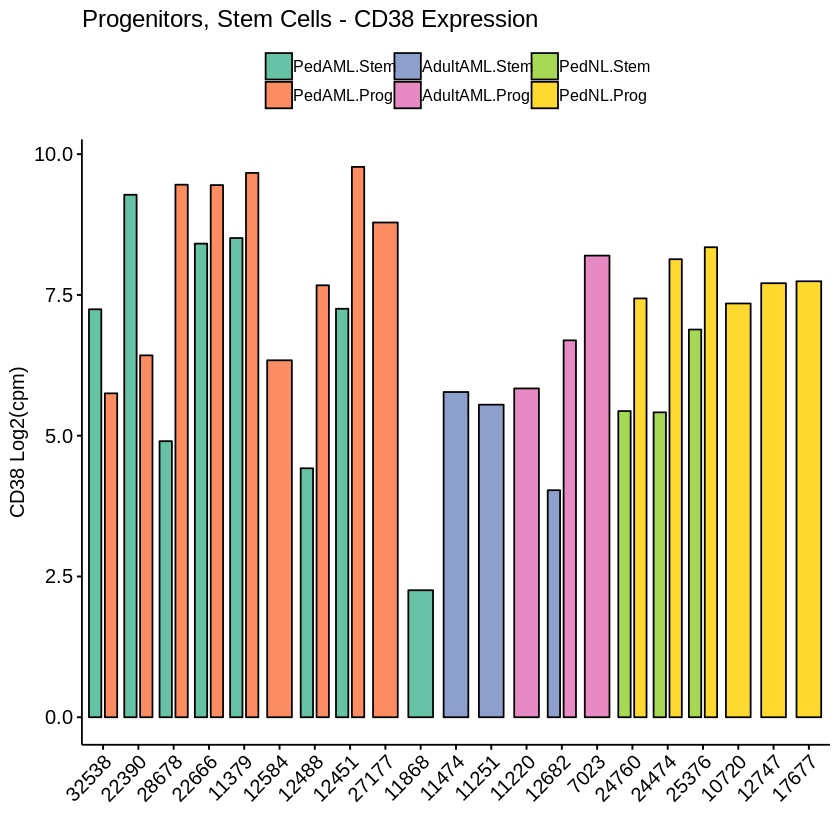

In [90]:
CD38.lcpm$Patient.ID <- factor(as.character(CD38.lcpm$Patient.ID), 
                              levels=c("32538", "22390", "28678", "22666", "11379", "12584", "12488", "12451",
                                       "27177", "11868", "11474", "11251", "11220", "12682", "7023", "24760",
                                       "24474", "25376", "10720", "12747", "17677"))
CD38.lcpm$Phenotype <- factor(CD38.lcpm$Phenotype, 
                             levels=c('PedAML.Stem','PedAML.Prog','AdultAML.Stem','AdultAML.Prog','PedNL.Stem','PedNL.Prog'))
CD38.lcpm.pedAML.Prog <- subset(CD38.lcpm, X == "PedAML" & Cell.type == "Prog")
CD38.lcpm.pedAML.Stem <- subset(CD38.lcpm, X == "PedAML" & Cell.type == "Stem")
length(CD38.lcpm.pedAML.Prog$ENSG00000004468)
length(CD38.lcpm.pedAML.Stem$ENSG00000004468)
t.test(CD38.lcpm.pedAML.Prog$ENSG00000004468, CD38.lcpm.pedAML.Stem$ENSG00000004468)
CD38.lcpm.pedAML.Prog.paired <- CD38.lcpm.pedAML.Prog[CD38.lcpm.pedAML.Prog$Patient.ID %in% paired_patients,]
CD38.lcpm.pedAML.Stem.paired <- CD38.lcpm.pedAML.Stem[CD38.lcpm.pedAML.Stem$Patient.ID %in% paired_patients,]
#CD38.lcpm.pedAML.Prog.paired[,c("Patient.ID", "ENSG00000004468")]
#CD38.lcpm.pedAML.Stem.paired[,c("Patient.ID", "ENSG00000004468")]
t.test(CD38.lcpm.pedAML.Prog.paired$ENSG00000004468, CD38.lcpm.pedAML.Stem.paired$ENSG00000004468,paired = TRUE)

#png(file="PedAML_CD38expr_Prog_byPatient_03312020.png", width=7, height=7, units='in', res=300)
#ggbarplot(CD38.lcpm.prog, x="Patient.ID", y="ENSG00000004468", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("CD38 Log2(cpm)") + xlab("") + 
#    labs(title="Progenitors - CD38 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD38expr_Stem_byPatient_03312020.png", width=7, height=7, units='in', res=300)
#ggbarplot(CD38.lcpm.stem, x="Patient.ID", y="ENSG00000004468", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("CD38 Log2(cpm)") + xlab("") + 
#    labs(title="Stem Cells - CD38 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD38expr_Stem_Prog_byPatient_03312020.png", width=7, height=7, units='in', res=300)
ggbarplot(CD38.lcpm, x="Patient.ID", y="ENSG00000004468", fill="Phenotype", palette="Set2", size=0.5,
         position=position_dodge(0.9)) +
    #theme_bw(base_size=10) + 
    ylab("CD38 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - CD38 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [64]:
MBNL1.lcpm$Patient.ID <- factor(as.character(MBNL1.lcpm$Patient.ID), 
                              levels=c("32538", "22390", "28678", "22666", "11379", "12584", "12488", "12451",
                                       "27177", "11868", "11474", "11251", "11220", "12682", "7023", "24760",
                                       "24474", "25376", "10720", "12747", "17677"))
MBNL1.lcpm$Phenotype <- factor(MBNL1.lcpm$Phenotype, 
                             levels=c('PedAML.Stem','PedAML.Prog','AdultAML.Stem','AdultAML.Prog','PedNL.Stem','PedNL.Prog'))
MBNL1.lcpm.pedAML.Prog <- subset(MBNL1.lcpm, X == "PedAML" & Cell.type == "Prog")
MBNL1.lcpm.pedAML.Stem <- subset(MBNL1.lcpm, X == "PedAML" & Cell.type == "Stem")
length(MBNL1.lcpm.pedAML.Prog$ENSG00000152601)
length(MBNL1.lcpm.pedAML.Stem$ENSG00000152601)
t.test(MBNL1.lcpm.pedAML.Prog$ENSG00000152601, MBNL1.lcpm.pedAML.Stem$ENSG00000152601)
MBNL1.lcpm.pedAML.Prog.paired <- MBNL1.lcpm.pedAML.Prog[MBNL1.lcpm.pedAML.Prog$Patient.ID %in% paired_patients,]
MBNL1.lcpm.pedAML.Stem.paired <- MBNL1.lcpm.pedAML.Stem[MBNL1.lcpm.pedAML.Stem$Patient.ID %in% paired_patients,]
#MBNL1.lcpm.pedAML.Prog.paired[,c("Patient.ID", "ENSG00000152601")]
#MBNL1.lcpm.pedAML.Stem.paired[,c("Patient.ID", "ENSG00000152601")]
t.test(MBNL1.lcpm.pedAML.Prog.paired$ENSG00000152601, MBNL1.lcpm.pedAML.Stem.paired$ENSG00000152601,paired = TRUE)

MBNL1.lcpm.prog$ENSG00000152601[which(MBNL1.lcpm.prog$ENSG00000152601 < 0)] <- 0
#png(file="PedAML_MBNL1expr_Prog_byPatient_05132020.png", width=7, height=7, units='in', res=300)
ggbarplot(subset(MBNL1.lcpm.prog, Phenotype != "AdultAML"), x="Patient.ID", y="ENSG00000152601", 
          fill="Phenotype", palette=c("gray", "white"), size=0.5) +
    #theme_bw(base_size=10) + 
    ylab("MBNL1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors - MBNL1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

MBNL1.lcpm.stem$ENSG00000152601[which(MBNL1.lcpm.stem$ENSG00000152601 < 0)] <- 0
#png(file="PedAML_MBNL1expr_Stem_byPatient_05132020.png", width=7, height=7, units='in', res=300)
ggbarplot(subset(MBNL1.lcpm.stem, Phenotype != "AdultAML"), x="Patient.ID", y="ENSG00000152601", 
          fill="Phenotype", palette=c("gray", "white"), size=0.5) +
    #theme_bw(base_size=10) + 
    ylab("MBNL1 Log2(cpm)") + xlab("") + 
    labs(title="Stem Cells - MBNL1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_MBNL1expr_Stem_Prog_byPatient_04132020.png", width=7, height=7, units='in', res=300)
ggbarplot(MBNL1.lcpm, x="Patient.ID", y="ENSG00000152601", fill="Phenotype", palette="Set2", size=0.5,
         position=position_dodge(0.9)) +
    #theme_bw(base_size=10) + 
    ylab("MBNL1 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - MBNL1 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

ERROR: Error in factor(as.character(MBNL1.lcpm$Patient.ID), levels = c("32538", : object 'MBNL1.lcpm' not found


In [102]:
dim(MBNL2.lcpm)
head(MBNL2.lcpm)

[1] 32 19

,Phenotype,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,Phenotype,ENSG00000139793
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>
01id38cellHSC,NA,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,PedAML.Stem,5.101773
02id38cellPROGENITORS,NA,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,PedAML.Prog,5.180797
cell05id90HSC,NA,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,PedAML.Stem,4.281416
06id90cellPROGENITORS,NA,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,PedAML.Prog,4.921483
03id78cellHSC,NA,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,PedAML.Stem,4.215261
04id78cellPROGENITORS,NA,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,PedAML.Prog,5.114432


[1] 9

[1] 8


	Welch Two Sample t-test

data:  MBNL2.lcpm.pedAML.Prog$ENSG00000139793 and MBNL2.lcpm.pedAML.Stem$ENSG00000139793
t = 1.5184, df = 13.345, p-value = 0.1522
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.3561221  2.0557183
sample estimates:
mean of x mean of y 
 4.915792  4.065993 



	Paired t-test

data:  MBNL2.lcpm.pedAML.Prog.paired$ENSG00000139793 and MBNL2.lcpm.pedAML.Stem.paired$ENSG00000139793
t = 1.1808, df = 6, p-value = 0.2824
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.7753848  2.2216689
sample estimates:
mean of the differences 
              0.7231421 


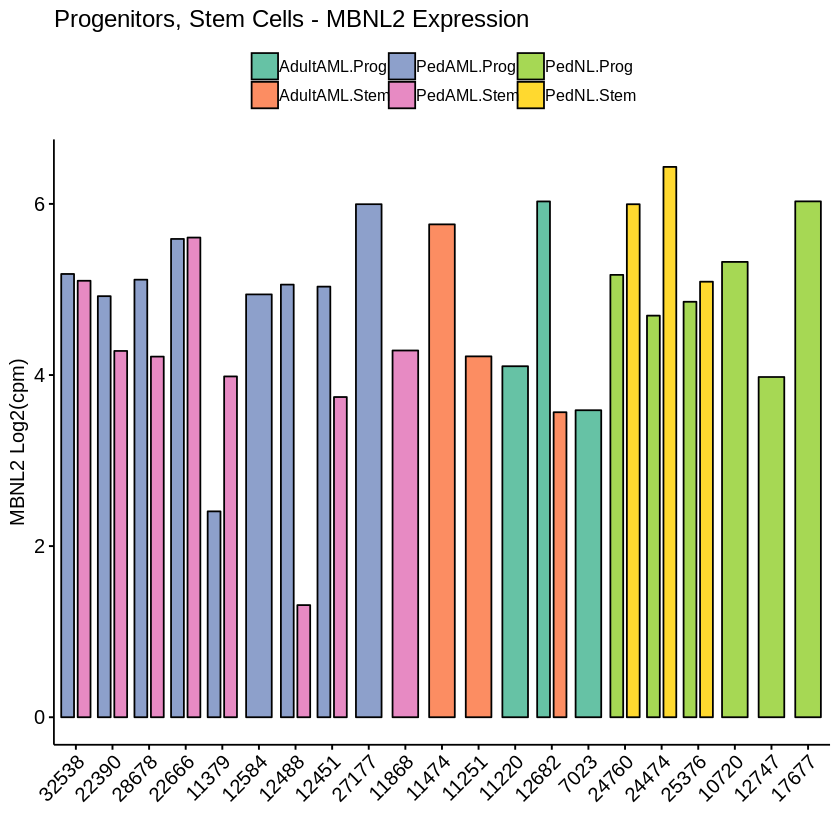

In [103]:
MBNL2.lcpm$Patient.ID <- factor(as.character(MBNL2.lcpm$Patient.ID), 
                              levels=c("32538", "22390", "28678", "22666", "11379", "12584", "12488", "12451",
                                       "27177", "11868", "11474", "11251", "11220", "12682", "7023", "24760",
                                       "24474", "25376", "10720", "12747", "17677"))
MBNL2.lcpm$Phenotype <- factor(MBNL2.lcpm$Phenotype, 
                             levels=c('PedAML.Stem','PedAML.Prog','AdultAML.Stem','AdultAML.Prog','PedNL.Stem','PedNL.Prog'))
MBNL2.lcpm.pedAML.Prog <- subset(MBNL2.lcpm, X == "PedAML" & Cell.type == "Prog")
MBNL2.lcpm.pedAML.Stem <- subset(MBNL2.lcpm, X == "PedAML" & Cell.type == "Stem")
length(MBNL2.lcpm.pedAML.Prog$ENSG00000139793)
length(MBNL2.lcpm.pedAML.Stem$ENSG00000139793)
t.test(MBNL2.lcpm.pedAML.Prog$ENSG00000139793, MBNL2.lcpm.pedAML.Stem$ENSG00000139793)
MBNL2.lcpm.pedAML.Prog.paired <- MBNL2.lcpm.pedAML.Prog[MBNL2.lcpm.pedAML.Prog$Patient.ID %in% paired_patients,]
MBNL2.lcpm.pedAML.Stem.paired <- MBNL2.lcpm.pedAML.Stem[MBNL2.lcpm.pedAML.Stem$Patient.ID %in% paired_patients,]
#MBNL2.lcpm.pedAML.Prog.paired[,c("Patient.ID", "ENSG00000139793")]
#MBNL2.lcpm.pedAML.Stem.paired[,c("Patient.ID", "ENSG00000139793")]
t.test(MBNL2.lcpm.pedAML.Prog.paired$ENSG00000139793, MBNL2.lcpm.pedAML.Stem.paired$ENSG00000139793,paired = TRUE)

#png(file="PedAML_MBNL2expr_Prog_byPatient_04132020.png", width=7, height=7, units='in', res=300)
#ggbarplot(MBNL2.lcpm.prog, x="Patient.ID", y="ENSG00000139793", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("MBNL2 Log2(cpm)") + xlab("") + 
#    labs(title="Progenitors - MBNL2 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_MBNL2expr_Stem_byPatient_04132020.png", width=7, height=7, units='in', res=300)
#ggbarplot(MBNL2.lcpm.stem, x="Patient.ID", y="ENSG00000139793", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("MBNL2 Log2(cpm)") + xlab("") + 
#    labs(title="Stem Cells - MBNL2 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_MBNL2expr_Stem_Prog_byPatient_04132020.png", width=7, height=7, units='in', res=300)
ggbarplot(MBNL2.lcpm[,-1], x="Patient.ID", y="ENSG00000139793", fill="Phenotype", palette="Set2", size=0.5,
         position=position_dodge(0.9)) +
    #theme_bw(base_size=10) + 
    ylab("MBNL2 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - MBNL2 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

[1] 9

[1] 8


	Welch Two Sample t-test

data:  MBNL3.lcpm.pedAML.Prog$ENSG00000076770 and MBNL3.lcpm.pedAML.Stem$ENSG00000076770
t = 0.26115, df = 14.384, p-value = 0.7977
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.5071554  0.6481810
sample estimates:
mean of x mean of y 
 5.276029  5.205516 



	Paired t-test

data:  MBNL3.lcpm.pedAML.Prog.paired$ENSG00000076770 and MBNL3.lcpm.pedAML.Stem.paired$ENSG00000076770
t = 0.20928, df = 6, p-value = 0.8412
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.4801024  0.5699089
sample estimates:
mean of the differences 
             0.04490324 


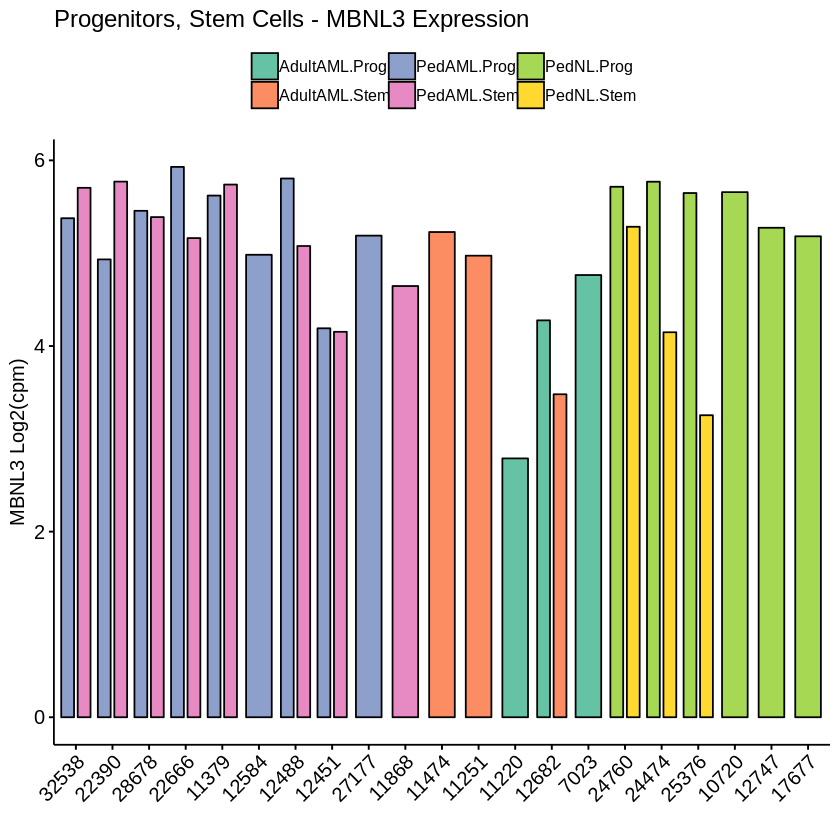

In [104]:
MBNL3.lcpm$Patient.ID <- factor(as.character(MBNL3.lcpm$Patient.ID), 
                              levels=c("32538", "22390", "28678", "22666", "11379", "12584", "12488", "12451",
                                       "27177", "11868", "11474", "11251", "11220", "12682", "7023", "24760",
                                       "24474", "25376", "10720", "12747", "17677"))
MBNL3.lcpm$Phenotype <- factor(MBNL3.lcpm$Phenotype, 
                             levels=c('PedAML.Stem','PedAML.Prog','AdultAML.Stem','AdultAML.Prog','PedNL.Stem','PedNL.Prog'))
MBNL3.lcpm.pedAML.Prog <- subset(MBNL3.lcpm, X == "PedAML" & Cell.type == "Prog")
MBNL3.lcpm.pedAML.Stem <- subset(MBNL3.lcpm, X == "PedAML" & Cell.type == "Stem")
length(MBNL3.lcpm.pedAML.Prog$ENSG00000076770)
length(MBNL3.lcpm.pedAML.Stem$ENSG00000076770)
t.test(MBNL3.lcpm.pedAML.Prog$ENSG00000076770, MBNL3.lcpm.pedAML.Stem$ENSG00000076770)
MBNL3.lcpm.pedAML.Prog.paired <- MBNL3.lcpm.pedAML.Prog[MBNL3.lcpm.pedAML.Prog$Patient.ID %in% paired_patients,]
MBNL3.lcpm.pedAML.Stem.paired <- MBNL3.lcpm.pedAML.Stem[MBNL3.lcpm.pedAML.Stem$Patient.ID %in% paired_patients,]
#MBNL3.lcpm.pedAML.Prog.paired[,c("Patient.ID", "ENSG00000076770")]
#MBNL3.lcpm.pedAML.Stem.paired[,c("Patient.ID", "ENSG00000076770")]
t.test(MBNL3.lcpm.pedAML.Prog.paired$ENSG00000076770, MBNL3.lcpm.pedAML.Stem.paired$ENSG00000076770,paired = TRUE)

#png(file="PedAML_MBNL3expr_Prog_byPatient_03312020.png", width=7, height=7, units='in', res=300)
#ggbarplot(MBNL3.lcpm.prog, x="Patient.ID", y="ENSG00000076770", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("MBNL3 Log2(cpm)") + xlab("") + 
#    labs(title="Progenitors - MBNL3 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_MBNL3expr_Stem_byPatient_03312020.png", width=7, height=7, units='in', res=300)
#ggbarplot(MBNL3.lcpm.stem, x="Patient.ID", y="ENSG00000076770", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("MBNL3 Log2(cpm)") + xlab("") + 
#    labs(title="Stem Cells - MBNL3 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_MBNL3expr_Stem_Prog_byPatient_03312020.png", width=7, height=7, units='in', res=300)
ggbarplot(MBNL3.lcpm[,-1], x="Patient.ID", y="ENSG00000076770", fill="Phenotype", palette="Set2", size=0.5,
         position=position_dodge(0.9)) +
    #theme_bw(base_size=10) + 
    ylab("MBNL3 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - MBNL3 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [94]:
CD34.lcpm

,Phenotype,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads,Phenotype,ENSG00000174059
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>
01id38cellHSC,NA,41053037,1.0202671,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,01id38cellHSC,38 HSC,32538,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,81234305,PedAML.Stem,9.725959
02id38cellPROGENITORS,NA,33880305,0.9970015,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851,PedAML.Prog,10.283052
cell05id90HSC,NA,32756184,0.9893871,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,cell05id90HSC,90 HSC,22390,10.0,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,72625632,PedAML.Stem,10.780631
06id90cellPROGENITORS,NA,33202985,0.8548814,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991,PedAML.Prog,9.864608
03id78cellHSC,NA,28605524,0.8076966,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,03id78cellHSC,78 HSC,28678,10.0,PedAML,Pediatric,AML,Stem,34+38-,PB,Completed,68483294,PedAML.Stem,10.718530
04id78cellPROGENITORS,NA,41632102,0.9348678,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032,PedAML.Prog,11.256977
05id00066HSC,NA,15897883,1.2330452,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,05id00066HSC,66 HSC,22666,7.7,PedAML,Pediatric,AML,Stem,34+38-,BM,Completed,77519907,PedAML.Stem,10.190836
06id00066PRO,NA,30068212,1.1915671,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883,PedAML.Prog,9.768645
04id11474HSC,NA,25477749,1.1069966,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,04id11474HSC,11474 HSC,11474,10.0,AdultAML,Adult,AML,Stem,34+38-,PB,Completed,79123032,AdultAML.Stem,10.651418


[1] 9

[1] 8


	Welch Two Sample t-test

data:  CD34.lcpm.pedAML.Prog$ENSG00000174059 and CD34.lcpm.pedAML.Stem$ENSG00000174059
t = 0.14498, df = 14.973, p-value = 0.8867
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9739917  1.1161375
sample estimates:
mean of x mean of y 
 10.07720  10.00613 



	Paired t-test

data:  CD34.lcpm.pedAML.Prog.paired$ENSG00000174059 and CD34.lcpm.pedAML.Stem.paired$ENSG00000174059
t = -1.1929, df = 6, p-value = 0.2779
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9242914  0.3184393
sample estimates:
mean of the differences 
              -0.302926 


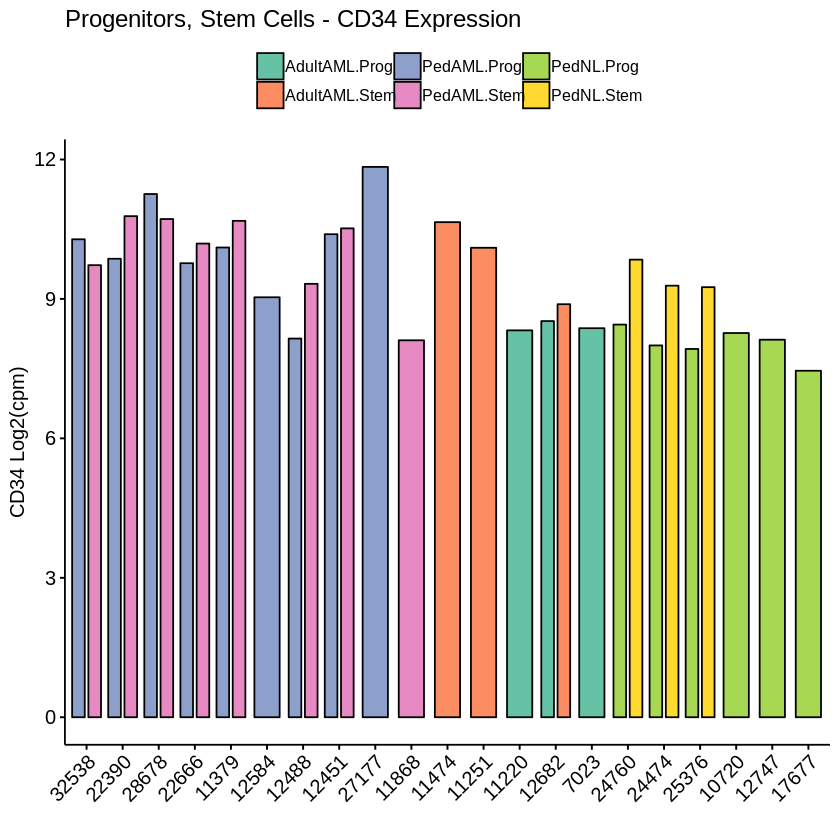

In [93]:
CD34.lcpm$Patient.ID <- factor(as.character(CD34.lcpm$Patient.ID), 
                              levels=c("32538", "22390", "28678", "22666", "11379", "12584", "12488", "12451",
                                       "27177", "11868", "11474", "11251", "11220", "12682", "7023", "24760",
                                       "24474", "25376", "10720", "12747", "17677"))
CD34.lcpm$Phenotype <- factor(CD34.lcpm$Phenotype, 
                             levels=c('PedAML.Stem','PedAML.Prog','AdultAML.Stem','AdultAML.Prog','PedNL.Stem','PedNL.Prog'))
CD34.lcpm.pedAML.Prog <- subset(CD34.lcpm, X == "PedAML" & Cell.type == "Prog")
CD34.lcpm.pedAML.Stem <- subset(CD34.lcpm, X == "PedAML" & Cell.type == "Stem")
length(CD34.lcpm.pedAML.Prog$ENSG00000174059)
length(CD34.lcpm.pedAML.Stem$ENSG00000174059)
t.test(CD34.lcpm.pedAML.Prog$ENSG00000174059, CD34.lcpm.pedAML.Stem$ENSG00000174059)
CD34.lcpm.pedAML.Prog.paired <- CD34.lcpm.pedAML.Prog[CD34.lcpm.pedAML.Prog$Patient.ID %in% paired_patients,]
CD34.lcpm.pedAML.Stem.paired <- CD34.lcpm.pedAML.Stem[CD34.lcpm.pedAML.Stem$Patient.ID %in% paired_patients,]
#CD34.lcpm.pedAML.Prog.paired[,c("Patient.ID", "ENSG00000174059")]
#CD34.lcpm.pedAML.Stem.paired[,c("Patient.ID", "ENSG00000174059")]
t.test(CD34.lcpm.pedAML.Prog.paired$ENSG00000174059, CD34.lcpm.pedAML.Stem.paired$ENSG00000174059,paired = TRUE)

#png(file="PedAML_CD34expr_Prog_byPatient_03312020.png", width=7, height=7, units='in', res=300)
#ggbarplot(CD34.lcpm.prog, x="Patient.ID", y="ENSG00000174059", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("CD34 Log2(cpm)") + xlab("") + 
#    labs(title="Progenitors - CD34 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD34expr_Stem_byPatient_03312020.png", width=7, height=7, units='in', res=300)
#ggbarplot(CD34.lcpm.stem, x="Patient.ID", y="ENSG00000174059", fill="Phenotype", palette="Set2", size=0.5) +
#    #theme_bw(base_size=10) + 
#    ylab("CD34 Log2(cpm)") + xlab("") + 
#    labs(title="Stem Cells - CD34 Expression") + theme(legend.title=element_text(size=0)) + 
#    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

#png(file="PedAML_CD34expr_Stem_Prog_byPatient_03312020.png", width=7, height=7, units='in', res=300)
ggbarplot(CD34.lcpm[,-1], x="Patient.ID", y="ENSG00000174059", fill="Phenotype", palette="Set2", size=0.5,
         position=position_dodge(0.9)) +
    #theme_bw(base_size=10) + 
    ylab("CD34 Log2(cpm)") + xlab("") + 
    labs(title="Progenitors, Stem Cells - CD34 Expression") + theme(legend.title=element_text(size=0)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
#dev.off()

In [103]:
gDgeList.prog <- gPreviousStepEnv$gDgeList.prog
dim(gDgeList.prog$counts)
dim(gDgeList.prog$samples)

[1] 20345    20

[1] 20 17

In [104]:
#name <- "comp2"
#name2 <- "20180216"
genes_rsem_mpn <- read.csv("../../Jamieson/all_genes_results.txt", sep="\t", stringsAsFactors=FALSE)
dim(genes_rsem_mpn)
gene_counts_mpn <- genes_rsem_mpn[,sapply(colnames(genes_rsem_mpn), function(x) any(grepl(".results_expected_count",x)))]
colnames(gene_counts_mpn) <- gsub(".genes.results_expected_count","", colnames(gene_counts_mpn))
row.names(gene_counts_mpn) <- genes_rsem_mpn$gene_id
dim(gene_counts_mpn)
head(gene_counts_mpn)

[1] 57820   734

[1] 57820   146

,X4259_GTGAAA_S0,X87,X97,X4727sp1,X22_15,X4215_GTGAAA_S0,X26_2,X4066_GTGAAA_S0,X91,X426_ACAGTG_S0,⋯,X670A.PB.Prog_S3,X664.Stroma_S6,X767_Stroma_S0,X600.PB.Prog_S0,X689.BM.Prog_S11,X666.PB.Stem_S3,X571.Stroma_S0,X672A.PB.Prog_S3,X591.BM.Stem_S0,X767.BM.Prog_S0
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000003.10,65.00,38.00,0.00,377.00,228,151.00,221.00,60.00,13.00,51.0,⋯,9.00,762.00,420.00,217.00,63.00,64.00,13.00,4.00,19.00,219.00
ENSG00000000005.5,0.00,1.00,0.00,50.00,0,0.00,0.00,0.00,0.00,0.0,⋯,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
ENSG00000000419.8,1216.00,684.00,1442.00,451.00,373,1501.00,571.00,1695.00,715.00,1170.0,⋯,1787.00,1130.00,2541.00,1287.00,2163.00,892.00,888.00,3708.00,2472.00,1451.00
ENSG00000000457.9,1066.71,907.39,1244.89,322.88,229,877.56,819.19,697.84,414.76,918.1,⋯,746.18,302.92,187.13,525.52,684.85,924.19,254.78,470.46,266.73,1044.81
ENSG00000000460.12,2372.29,1066.61,1404.11,128.12,44,2212.44,297.81,1339.16,391.24,1744.9,⋯,543.82,129.08,112.87,295.48,1453.15,346.81,208.22,354.54,29.27,1254.19
ENSG00000000938.8,137.00,103.00,71.00,107.00,8,9.00,92.00,173.00,335.00,38.0,⋯,152.00,3153.00,15773.00,234.00,203.00,343.00,13697.00,737.00,49.00,416.00


In [104]:
RBFOX2_target_gn_SE_PedAMLvsPedNL_Prog <- read.csv("../rMATS_SplicingResults/DeWerf_RBFOX2_TargetGeneOverlap_DiffSpl_SE_Prog_PedNLvsPedAML.csv",
                                                  stringsAsFactors=FALSE, header=TRUE)
RBFOX2_target_gn_SE_PedAMLvsPedNL_Stem <- read.csv("../rMATS_SplicingResults/DeWerf_RBFOX2_TargetGeneOverlap_DiffSpl_SE_Stem_PedNLvsPedAML.csv",
                                                  stringsAsFactors=FALSE, header=TRUE)
RBFOX2_target_gn_RI_PedAMLvsPedNL_Prog <- read.csv("../rMATS_SplicingResults/DeWerf_RBFOX2_TargetGeneOverlap_DiffSpl_RI_Prog_PedNLvsPedAML.csv",
                                                  stringsAsFactors=FALSE, header=TRUE)
RBFOX2_target_gn_RI_PedAMLvsPedNL_Stem <- read.csv("../rMATS_SplicingResults/DeWerf_RBFOX2_TargetGeneOverlap_DiffSpl_RI_Stem_PedNLvsPedAML.csv",
                                                  stringsAsFactors=FALSE, header=TRUE)
dim(RBFOX2_target_gn_SE_PedAMLvsPedNL_Prog)
dim(RBFOX2_target_gn_SE_PedAMLvsPedNL_Stem)
dim(RBFOX2_target_gn_RI_PedAMLvsPedNL_Prog)
dim(RBFOX2_target_gn_RI_PedAMLvsPedNL_Stem)
length(unique(RBFOX2_target_gn_SE_PedAMLvsPedNL_Prog$geneSymbol))
head(RBFOX2_target_gn_SE_PedAMLvsPedNL_Prog)

[1] 1399   27

[1] 1187   27

[1] 43 27

[1] 56 27

[1] 919

,X,ID,GeneID,geneSymbol,chr,strand,exonStart_0base,exonEnd,upstreamES,upstreamEE,⋯,IncFormLen,SkipFormLen,PValue,FDR,IncLevel1,IncLevel2,IncLevelDifference,external_gene_name,scores,times
,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<int>
1,1,5085,ENSG00000127616,SMARCA4,chr19,+,10977652,10977815,10961080,10961174,⋯,263,100,1.740903e-03,2.618650e-02,"0.022,0.0,0.0,0.0,0.0,0.0","0.041,0.024,1.0,0.0,0.037,0.202,0.0,0.275,0.071",-0.180,SMARCA4,"0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1",62
2,2,114826,ENSG00000204463,BAG6,chr6,-,31644306,31644414,31644081,31644194,⋯,208,100,9.066433e-05,2.126387e-03,"0.337,0.286,0.377,0.49,0.362,0.318","0.405,0.517,0.582,0.74,0.623,0.322,0.582,0.361,0.625",-0.167,BAG6,"0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677",62
3,3,101463,ENSG00000116337,AMPD2,chr1,+,109625302,109625433,109619836,109620278,⋯,231,100,3.434272e-03,4.603683e-02,"0.942,0.952,0.529,0.872,0.875,0.93","0.871,0.448,0.536,0.666,0.884,0.86,0.78,0.963,0.561",0.120,AMPD2,"0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,1,1,1,1,1,1,1",36
4,4,69337,ENSG00000169554,ZEB2,chr2,-,144396411,144396592,144388015,144388882,⋯,281,100,2.567481e-10,2.884062e-08,"1.0,0.977,0.975,0.76,0.861,1.0","0.804,0.52,0.657,0.587,0.928,0.634,0.516,0.897,0.607",0.245,ZEB2,"0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677,0.913821677",35
5,5,132984,ENSG00000204209,DAXX,chr6,-,33320735,33321567,33320379,33320591,⋯,932,100,1.665148e-07,9.124055e-06,"1.0,1.0,1.0,0.92,0.976,0.993","0.94,0.797,0.644,0.953,0.877,1.0,0.97,0.956,0.757",0.104,DAXX,"0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085,0.774279085",31
6,6,1434,ENSG00000100354,TNRC6B,chr22,+,40264687,40267036,40261831,40262173,⋯,2449,100,2.483883e-10,2.796821e-08,"0.561,0.726,1.0,0.427,1.0,0.628","0.814,1.0,0.698,1.0,1.0,1.

In [149]:
table(unique(RBFOX2_target_gn_SE_PedAMLvsPedNL_Prog$GeneID) %in% 
      topTable_PedAMLvsPedNL_Prog$ENSEMBL[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05])
table(unique(RBFOX2_target_gn_RI_PedAMLvsPedNL_Prog$GeneID) %in% 
      topTable_PedAMLvsPedNL_Prog$ENSEMBL[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05])
table(unique(RBFOX2_target_gn_SE_PedAMLvsPedNL_Stem$GeneID) %in% 
      topTable_PedAMLvsPedNL_Stem$ENSEMBL[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05])
table(unique(RBFOX2_target_gn_RI_PedAMLvsPedNL_Stem$GeneID) %in% 
      topTable_PedAMLvsPedNL_Stem$ENSEMBL[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05])


FALSE  TRUE 
  897    22 


FALSE 
   41 


FALSE  TRUE 
  824     4 


FALSE  TRUE 
   51     1 

In [150]:
topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05 & 
                                    topTable_PedAMLvsPedNL_Prog$ENSEMBL %in% RBFOX2_target_gn_SE_PedAMLvsPedNL_Prog$GeneID,]
topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05 & 
                                    topTable_PedAMLvsPedNL_Stem$ENSEMBL %in% RBFOX2_target_gn_SE_PedAMLvsPedNL_Stem$GeneID,]
topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05 & 
                                    topTable_PedAMLvsPedNL_Stem$ENSEMBL %in% RBFOX2_target_gn_RI_PedAMLvsPedNL_Stem$GeneID,]


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000138346,ENSG00000138346,1763,DNA2,protein_coding,-1.4355139,3.135099,-4.500203,0.0002487957,0.01668321,0.3159867
ENSG00000026508,ENSG00000026508,960,CD44,protein_coding,1.9443270,8.984828,4.319054,0.0003750592,0.01940553,-0.5469002
ENSG00000214517,ENSG00000214517,51400,PPME1,protein_coding,-1.4325807,4.870218,-3.981865,0.0008075866,0.02833361,-1.1288682
ENSG00000136122,ENSG00000136122,79866,BORA,protein_coding,-0.9121973,4.212668,-3.853430,0.0010819393,0.03284386,-1.3440979
ENSG00000155755,ENSG00000155755,65062,TMEM237,protein_coding,-1.0600466,4.563156,-3.763580,0.0013274218,0.03544609,-1.5660989
ENSG00000134516,ENSG00000134516,1794,DOCK2,protein_coding,0.7497269,8.258134,3.869775,0.0010424167,0.03214586,-1.5689515
ENSG00000140525,ENSG00000140525,55215,FANCI,protein_coding,-1.3558281,5.993677,-3.808607,0.0011981558,0.03409428,-1.6440917
ENSG00000099204,ENSG00000099204,3983,ABLIM1,protein_coding,-1.4497507,4.917569,-3.761788,0.0013328445,0.03544609,-1.6555687
ENSG00000159399,ENSG00000159399,3099,HK2,protein_coding,1.3314488,5.907988,3.778406,0.0012833964,0.03472940,-1.6942111


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000134324,ENSG00000134324,23175,LPIN1,protein_coding,-2.064899,6.277752,-5.869572,2.534431e-05,0.01639303,2.67966143
ENSG00000054392,ENSG00000054392,55733,HHAT,protein_coding,-2.456804,2.888683,-4.364272,4.991696e-04,0.03878437,0.01399729
ENSG00000175455,ENSG00000175455,64770,CCDC14,protein_coding,-1.428419,5.548391,-4.290605,5.811226e-04,0.04119011,-0.41541753
ENSG00000174099,ENSG00000174099,253827,MSRB3,protein_coding,-1.626723,7.308875,-4.089190,8.823721e-04,0.04837461,-0.87035164


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000145632,ENSG00000145632,10769,PLK2,protein_coding,-2.350482,3.039965,-4.231523,0.0006566704,0.04294479,-0.2516248


## Analysis of Pediatric AML and Adult AML with sAMLs from Crews and MPN Datasets

In [44]:
meta <- read.csv("../../Jamieson/combined_meta2.csv", stringsAsFactors=FALSE)
#meta <- meta[-grep("X672A.PB.Prog_S3", meta$Sample),]
meta$CellType <- rep("BM", nrow(meta))
meta$Sample <- gsub("_S[0-9]+$","",meta$Sample)
types <- unlist(lapply(meta$ID, function(x) strsplit(x, split="\\.")[[1]][2]))
meta$CellType[which(!meta$Sample.type %in% c("Aged normal bone marrow","Young normal bone marrow"))] <- types[which(!meta$Sample.type %in% c("Aged normal bone marrow","Young normal bone marrow"))]
meta$Sample.type2 <- meta$Sample.type3 <- meta$Phenotype <- meta$Sample.type4 <- recode(meta$Sample.type, 
                                            `Aged normal bone marrow`="ABM", `Young normal bone marrow`="YBM")
meta$Sample.type2[which(meta$Sample.type %in% c("Aged normal bone marrow","Young normal bone marrow"))] <- "NBM"
meta$Sample.type2 <- gsub("sAML", "AML", meta$Sample.type2)
meta$Sample.type3 <- gsub("sAML", "AML", meta$Sample.type3)
meta$Sample.type4 <- recode(meta$Sample.type3, sAML="sAML_UnTx", `de novo AML`="sAML_UnTx", AML="sAML_Tx")                       
meta$Sample.type2 <- gsub("^AML$", "sAML", meta$Sample.type2)
meta$Sample.type3 <- gsub("^AML$", "sAML", meta$Sample.type3)
meta$Sample.type2[which(meta$Condition == "de novo AML")] <- "dnAML"
meta$Sample.type3[which(meta$Condition == "de novo AML")] <- "dnAML"
#meta[!meta$Sample.type4 %in% c("ABM", "YBM", "PV", "ET", "CML"),]
meta2.Prog.filt <- meta[meta$Sample.type3 %in% c("ABM", "YBM", "CML", "sAML", "ET", "PV", "MF", "dnAML") & 
                         meta$Cell.type %in% c("Progenitor", "Sorted progenitors"),]
meta2.Prog.filt$Phenotype <- factor(as.character(meta2.Prog.filt$Phenotype), 
                                           levels=c("ABM", "YBM", "ET", "PV", "MF", "CML", "AML"))
meta2.Prog.filt$Sample.type3 <- factor(as.character(meta2.Prog.filt$Sample.type3),
                                      levels=c("ABM", "YBM", "ET", "PV", "MF", "CML", "sAML", "dnAML"))

table(meta2.Prog.filt$Sample.type3, meta2.Prog.filt$Cell.type)
head(meta2.Prog.filt)
           

       
        Progenitor Sorted progenitors
  ABM            0                  8
  YBM            0                  8
  ET             2                  0
  PV             6                  0
  MF            24                  0
  CML            5                  0
  sAML           4                  7
  dnAML          0                  2

,File_ID,Sample,ID,Sample.type,Age,Condition,Cell.type,Patient_ID,Mutation,Gender,CellType,Sample.type4,Phenotype,Sample.type3,Sample.type2
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>,<chr>
10,368_ACAGTG_S0,X368_ACAGTG,pt368,Aged normal bone marrow,Aged,Normal,Sorted progenitors,368,Normal,F,BM,ABM,ABM,ABM,NBM
11,380_ACAGTG_S0,X380_ACAGTG,pt380,Aged normal bone marrow,Aged,Normal,Sorted progenitors,380,Normal,F,BM,ABM,ABM,ABM,NBM
12,401_ACAGTG_S0,X401_ACAGTG,pt401,Aged normal bone marrow,Aged,Normal,Sorted progenitors,401,Normal,F,BM,ABM,ABM,ABM,NBM
13,402_ACAGTG_S0,X402_ACAGTG,pt402,Aged normal bone marrow,Aged,Normal,Sorted progenitors,402,Normal,F,BM,ABM,ABM,ABM,NBM
14,410_ACAGTG_S0,X410_ACAGTG,pt410,Aged normal bone marrow,Aged,Normal,Sorted progenitors,410,Normal,M,BM,ABM,ABM,ABM,NBM
15,415_ACAGTG_S0,X415_ACAGTG,pt415,Aged normal bone marrow,Aged,Normal,Sorted progenitors,415,Normal,F,BM,ABM,ABM,ABM,NBM


In [45]:
library(gdata)
colnames(gene_counts_mpn) <- gsub("_S[0-9]+", "", colnames(gene_counts_mpn))
colnames(gene_counts_mpn)[sapply(c('X19_MDStoAML', 'X20_MDStoAML', 'X48_MDStoAML', 'X36$', 'X42$', 'X87$', 'X89$', 'X102$', 'X107$',
                                  'X735.PB.Prog', #'X591.BM.Prog',
                                   'X672A.PB.Prog', 'X672B.PB.Prog'), 
                                function(x) grep(x, colnames(gene_counts_mpn)))]
                                     
group.sAML.prog <- c(#'X368_ACAGTG_S0', 'X380_ACAGTG_S0', 'X401_ACAGTG_S0', 'X402_ACAGTG_S0', 
                      #'X410_ACAGTG_S0', 'X415_ACAGTG_S0', 'X416_ACAGTG_S0', 'X426_ACAGTG_S0',
                      #'X19_MDStoAML', 'X20_MDStoAML', 
                      'X48_MDStoAML', 'X36', 'X42', 'X87', 'X89', 'X102', 'X107',
                      'X735.PB.Prog', #'X591.BM.Prog', 
    'X672A.PB.Prog', 'X672B.PB.Prog')
#meta[meta$Sample.type3 %in% "sAML",]
geneCountCrop.sAML.prog <- gene_counts_mpn[, group.sAML.prog]
dim(geneCountCrop.sAML.prog)

geneCount_names_order <- c(colnames(geneCountCrop.sAML.prog)[1:11])
geneCount_names_order
table(meta$File_ID %in% geneCount_names_order)
table(meta$Sample %in% geneCount_names_order)

metaCrop.sAML.prog <- meta[which(meta$Sample %in% geneCount_names_order), ]
geneCount.sAML.prog <- geneCountCrop.sAML.prog

metaCrop.sAML.prog$Sample <- reorder.factor(metaCrop.sAML.prog$Sample, new.order=geneCount_names_order)
metaCrop.sAML.prog <- metaCrop.sAML.prog[order(metaCrop.sAML.prog$Sample),] #%>% arrange(Sample)
metaCrop.sAML.prog 
                                 
group.sAML.prog.noCrews <- c(#'X368_ACAGTG_S0', 'X380_ACAGTG_S0', 'X401_ACAGTG_S0', 'X402_ACAGTG_S0', 
                      #'X410_ACAGTG_S0', 'X415_ACAGTG_S0', 'X416_ACAGTG_S0', 'X426_ACAGTG_S0',
                      #'X19_MDStoAML', 'X20_MDStoAML', 
                      #'X48_MDStoAML', 'X36', 'X42', 'X87', 'X89', 'X102', 'X107',
                      'X735.PB.Prog', #'X591.BM.Prog',
    'X672A.PB.Prog', 'X672B.PB.Prog')
#meta[meta$Sample.type3 %in% "sAML",]
geneCountCrop.sAML.prog.noCrews <- gene_counts_mpn[, group.sAML.prog.noCrews]
dim(geneCountCrop.sAML.prog.noCrews)

geneCount_names_order.noCrews <- c(colnames(geneCountCrop.sAML.prog.noCrews)[1:4])
geneCount_names_order.noCrews
table(meta$File_ID %in% geneCount_names_order.noCrews)
table(meta$Sample %in% geneCount_names_order.noCrews)

metaCrop.sAML.prog.noCrews <- meta[which(meta$Sample %in% geneCount_names_order.noCrews), ]
geneCount.sAML.prog.noCrews <- geneCountCrop.sAML.prog.noCrews

metaCrop.sAML.prog.noCrews$Sample <- reorder.factor(metaCrop.sAML.prog.noCrews$Sample, new.order=geneCount_names_order.noCrews)
metaCrop.sAML.prog.noCrews <- metaCrop.sAML.prog.noCrews[order(metaCrop.sAML.prog.noCrews$Sample),] #%>% arrange(Sample)
metaCrop.sAML.prog.noCrews 

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'gsub': error in evaluating the argument 'x' in selecting a method for function 'colnames': object 'gene_counts_mpn' not found


In [46]:
genes_rsem_pedAML <- read.csv("../inputs/all_genes_results.txt", sep="\t", stringsAsFactors=FALSE)
dim(genes_rsem_pedAML)
gene_counts_pedAML <- genes_rsem_pedAML[,sapply(colnames(genes_rsem_pedAML), function(x) any(grepl(".results_expected_count",x)))]
colnames(gene_counts_pedAML) <- gsub(".genes.results_expected_count","", colnames(gene_counts_pedAML))
colnames(gene_counts_pedAML) <- gsub("_S[0-9]+_R1_001$", "", colnames(gene_counts_pedAML))
row.names(gene_counts_pedAML) <- genes_rsem_pedAML$gene_id
colnames(gene_counts_pedAML) <- gsub('X09x00020pxPLUSPLUS', 'X09x00020xPLUSPLUS', colnames(gene_counts_pedAML))
dim(gene_counts_pedAML)
head(gene_counts_pedAML)
colnames(gDgeList.prog$counts)
gDgeList.prog$samples

[1] 57820   182

[1] 57820    36

,X14x12488xPLUSPLUS,X02pid24760ctHPC,cell05id90HSC,X02id11251HSC,X04id11474HSC,X05x00047xPLUSPLUS,X06x00077xPLUSPLUS,X04pid24474ctHPC,X09x00020xPLUSPLUS,X03id78cellHSC,⋯,X13x12488xPLUSMINS,X03id11474HPC,X05id00066HSC,X15x12584xPLUSPLUS,X01id11251HPC,X17x12451xPLUSPLUS,X11x00082xPLUSPLUS,X01x00077xPROGENIT,X16x12451xPLUSMINS,X04x00068xPLUSMINS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000003.10,10.00,35.00,0.00,3.0,0.00,18.00,49.00,116.00,0.00,1.00,⋯,54.00,0.00,0.00,15.00,0.00,0.00,0.00,0.00,0.00,0.00
ENSG00000000005.5,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,⋯,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
ENSG00000000419.8,3579.00,2724.00,1705.00,1759.0,1923.00,2350.00,4884.00,3125.00,1646.00,1872.00,⋯,1712.00,2125.00,818.00,1652.00,1777.00,2146.00,2294.00,1225.00,1082.00,910.00
ENSG00000000457.9,456.88,1238.85,322.03,160.2,529.39,354.12,1435.02,158.04,513.23,96.22,⋯,151.32,424.19,488.89,158.72,20.94,1295.05,102.96,351.54,178.19,145.25
ENSG00000000460.12,1413.12,1699.15,1042.97,352.8,543.61,1377.88,2543.98,768.96,199.77,297.78,⋯,378.68,596.81,271.11,365.28,292.06,178.95,116.04,730.46,121.81,281.75
ENSG00000000938.8,181.00,293.00,18.00,70.0,357.00,466.00,436.00,50.00,238.00,199.00,⋯,230.00,659.00,91.00,129.00,286.00,279.00,13.00,43.00,133.00,114.00


[1] "02id38cellPROGENITORS" "06id90cellPROGENITORS" "04id78cellPROGENITORS"
 [4] "06id00066PRO"          "03id11474HPC"          "01id11251HPC"         
 [7] "01x00077xPROGENIT"     "03x11379xHPCxxxxx"     "05x00047xPLUSPLUS"    
[10] "06x00077xPLUSPLUS"     "07x00023xPLUSPLUS"     "09x00020xPLUSPLUS"    
[13] "11x00082xPLUSPLUS"     "14x12488xPLUSPLUS"     "15x12584xPLUSPLUS"    
[16] "17x12451xPLUSPLUS"     "18x10720xPLUSPLUS"     "02pid24760ctHPC"      
[19] "04pid24474ctHPC"       "06pid25376ctHPC"

,group,lib.size,norm.factors,SequenceRun,SequenceDate,Sample,SampleName,Patient.ID,RIN,X,Adult.Pediatric,Disease,Cell.type,Sorted.Cell.Type,Tissue.Source,RNA.seq.status,Reads
,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
02id38cellPROGENITORS,PedAML,33900321,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,02id38cellPROGENITORS,38 Progenitors,32538,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,73196851
06id90cellPROGENITORS,PedAML,33228834,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,06id90cellPROGENITORS,90 Progenitors,22390,10.0,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,81721991
04id78cellPROGENITORS,PedAML,41665738,1,ca_ne_586_001_400_000_JAMIESON_SR_human-ensembl-grch38-r91,5/5/19,04id78cellPROGENITORS,78 Progenitors,28678,10.0,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,88894032
06id00066PRO,PedAML,30096534,1,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,06id00066PRO,66 Progenitors,22666,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,77343883
03id11474HPC,AdultAML,24344437,1,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,03id11474HPC,11474 HPC,11474,9.6,AdultAML,Adult,AML,Prog,34+38+,PB,Completed,79871449
01id11251HPC,AdultAML,23597968,1,ca_ne_618_001_400_070_JAMIESON_SR_human-ensembl-ghrc38-r91,6/26/19,01id11251HPC,11251 HPC,11251,9.3,AdultAML,Adult,AML,Prog,34+38+,BM,Completed,80917720
01x00077xPROGENIT,PedAML,29192031,1,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,01x00077xPROGENIT,77 Progenitors,27177,9.8,PedAML,Pediatric,AML,Prog,34+38+,BM,Completed,68810108
03x11379xHPCxxxxx,PedAML,42440181,1,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,03x11379xHPCxxxxx,11379 HPC,11379,9.7,PedAML,Pediatric,AML,Prog,34+38+,PB,Completed,92324550
05x00047xPLUSPLUS,PedNL,37030789,1,ca_ne_630_001_400_060_JAMIESON_SN_human-ensembl-grch38-r91,8/31/19,05x00047xPLUSPLUS,47 PlPl,12747,9.8,PedNL,Pediatric,non-leukemic,Prog,34+38+,BM,Completed,81377527


In [47]:
table(gsub("[.].*$","", rownames(geneCountCrop.sAML.prog)) %in% rownames(gDgeList.prog$counts))
geneCountCrop.sAML.prog.filt <- geneCountCrop.sAML.prog[gsub("[.].*$","", rownames(geneCountCrop.sAML.prog)) %in% 
                                                             rownames(gDgeList.prog$counts),]
dim(geneCountCrop.sAML.prog.filt)
geneCountCrop.pedAML.filt <- gene_counts_pedAML[gsub("[.].*$","", rownames(gene_counts_pedAML)) %in% 
                                                             rownames(gDgeList.prog$counts),]
dim(geneCountCrop.pedAML.filt)
table(colnames(gene_counts_pedAML) %in% paste0("X", gDgeList.prog$samples$Sample))

rem <- !(gDgeList.prog$samples$Sample %in% c("03id11474HPC","01id11251HPC"))
gDgeList.prog.filt <- gDgeList.prog[,rem]
#gDgeList.prog.filt$samples
#metaCrop.sAML.prog
geneCountCrop.pedAML.filt <- geneCountCrop.pedAML.filt[,match(paste0("X", gDgeList.prog.filt$samples$Sample), 
                                      colnames(geneCountCrop.pedAML.filt))]

#meta.pedAML.pedNL.sAML <- rbind(gDgeList.prog.filt$samples[,c()], 
#                                metaCrop.sAML.prog)
meta.pedAML.pedNL.sAML.prog <- data.frame(Group=c(as.character(gDgeList.prog.filt$samples$group), as.character(metaCrop.sAML.prog$Sample.type3)),
                                     Sample=c(paste0("X", as.character(gDgeList.prog.filt$samples$Sample)),as.character(metaCrop.sAML.prog$Sample)),
                                     Patient_ID=c(as.character(gDgeList.prog.filt$samples$Patient.ID),as.character(metaCrop.sAML.prog$Patient_ID))
                                     #lib.size=c(as.character(gDgeList.prog.filt$samples$lib.size),as.character(metaCrop.sAML.prog$))
                                    )

dim(meta.pedAML.pedNL.sAML.prog)
dim(geneCountCrop.pedAML.filt)
dim(geneCountCrop.sAML.prog.filt)
geneCountCrop.pedAML.pedNL.sAML <- cbind(geneCountCrop.pedAML.filt, geneCountCrop.sAML.prog.filt)
dim(geneCountCrop.pedAML.pedNL.sAML)
colnames(geneCountCrop.pedAML.pedNL.sAML)
DGE_PedAML_PedNL_sAML.Prog.pre <- DGEList(counts = geneCountCrop.pedAML.pedNL.sAML, 
                                      lib.size = colSums(geneCountCrop.pedAML.pedNL.sAML),
                      norm.factors = rep(1,ncol(geneCountCrop.pedAML.pedNL.sAML)), samples = meta.pedAML.pedNL.sAML.prog,
                      group = meta.pedAML.pedNL.sAML.prog$Group, genes = gDgeList.prog$genes, remove.zeros = FALSE) 

cpm.PedAML_PedNL_sAML.Prog <- cpm(DGE_PedAML_PedNL_sAML.Prog.pre)
lcpm.PedAML_PedNL_sAML.Prog <- cpm(DGE_PedAML_PedNL_sAML.Prog.pre, log=TRUE)
dim(lcpm.PedAML_PedNL_sAML.Prog)
keep.exprs.PedAML_PedNL_sAML.Prog <- rowSums(cpm.PedAML_PedNL_sAML.Prog>3)>=15
DGE_PedAML_PedNL_sAML.Prog <- DGE_PedAML_PedNL_sAML.Prog.pre[keep.exprs.PedAML_PedNL_sAML.Prog,, keep.lib.sizes=FALSE]
DGE_PedAML_PedNL_sAML.Prog <- calcNormFactors(DGE_PedAML_PedNL_sAML.Prog, method = "TMM")
DGE_PedAML_PedNL_sAML.Prog$samples
lcpm2.PedAML_PedNL_sAML.Prog <- cpm(DGE_PedAML_PedNL_sAML.Prog, log=TRUE)
#lcpm2.PedAML_PedNL_sAML.Prog <- lcpm2.PedAML_PedNL_sAML.Prog[rowSums(lcpm2.PedAML_PedNL_sAML.Prog>6)>=20,]
dim(lcpm2.PedAML_PedNL_sAML.Prog)
#dim(lcpm2.PedAML_PedNL_sAML.Prog)
rownames(lcpm2.PedAML_PedNL_sAML.Prog) <- gsub("[.].*$", "", rownames(lcpm2.PedAML_PedNL_sAML.Prog))
#head(lcpm2.PedAML_PedNL_sAML.Prog)

geneCountCrop.sAML.prog.noCrews.filt <- geneCountCrop.sAML.prog.noCrews[gsub("[.].*$","", rownames(geneCountCrop.sAML.prog.noCrews)) %in%
                                                                   rownames(gDgeList.prog$counts),]

meta.pedAML.pedNL.sAML.prog.noCrews <- data.frame(Group=c(as.character(gDgeList.prog.filt$samples$group), as.character(metaCrop.sAML.prog.noCrews$Sample.type3)),
                                     Sample=c(paste0("X", as.character(gDgeList.prog.filt$samples$Sample)),as.character(metaCrop.sAML.prog.noCrews$Sample)),
                                     Patient_ID=c(as.character(gDgeList.prog.filt$samples$Patient.ID),as.character(metaCrop.sAML.prog.noCrews$Patient_ID))
                                     #lib.size=c(as.character(gDgeList.prog.filt$samples$lib.size),as.character(metaCrop.sAML.prog$))
                                    )

geneCountCrop.pedAML.pedNL.sAML.noCrews <- cbind(geneCountCrop.pedAML.filt, geneCountCrop.sAML.prog.noCrews.filt)
DGE_PedAML_PedNL_sAML.Prog.pre.noCrews <- DGEList(counts = geneCountCrop.pedAML.pedNL.sAML.noCrews, 
                                      lib.size = colSums(geneCountCrop.pedAML.pedNL.sAML.noCrews),
                      norm.factors = rep(1,ncol(geneCountCrop.pedAML.pedNL.sAML.noCrews)), samples = meta.pedAML.pedNL.sAML.prog.noCrews,
                      group = meta.pedAML.pedNL.sAML.prog.noCrews$Group, genes = gDgeList.prog$genes, remove.zeros = FALSE) 
cpm.PedAML_PedNL_sAML.Prog.noCrews <- cpm(DGE_PedAML_PedNL_sAML.Prog.pre.noCrews)
lcpm.PedAML_PedNL_sAML.Prog.noCrews <- cpm(DGE_PedAML_PedNL_sAML.Prog.pre.noCrews, log=TRUE)

keep.exprs.PedAML_PedNL_sAML.Prog.noCrews <- rowSums(cpm.PedAML_PedNL_sAML.Prog.noCrews>3)>=10
DGE_PedAML_PedNL_sAML.Prog.noCrews <- DGE_PedAML_PedNL_sAML.Prog.pre.noCrews[keep.exprs.PedAML_PedNL_sAML.Prog.noCrews,, keep.lib.sizes=FALSE]
DGE_PedAML_PedNL_sAML.Prog.noCrews <- calcNormFactors(DGE_PedAML_PedNL_sAML.Prog.noCrews, method = "TMM")
DGE_PedAML_PedNL_sAML.Prog.noCrews$samples
lcpm2.PedAML_PedNL_sAML.Prog.noCrews <- cpm(DGE_PedAML_PedNL_sAML.Prog.noCrews, log=TRUE)
#lcpm2.PedAML_PedNL_sAML.Prog.noCrews <- lcpm2.PedAML_PedNL_sAML.Prog.noCrews[rowSums(lcpm2.PedAML_PedNL_sAML.Prog.noCrews>6)>=20,]
dim(lcpm2.PedAML_PedNL_sAML.Prog.noCrews)
rownames(lcpm2.PedAML_PedNL_sAML.Prog.noCrews) <- gsub("[.].*$", "", rownames(lcpm2.PedAML_PedNL_sAML.Prog.noCrews))
head(lcpm2.PedAML_PedNL_sAML.Prog.noCrews)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function '%in%': error in evaluating the argument 'x' in selecting a method for function 'gsub': error in evaluating the argument 'x' in selecting a method for function 'rownames': object 'geneCountCrop.sAML.prog' not found


In [ ]:
dim(DGE_PedAML_PedNL_sAML.Prog$samples)
head(DGE_PedAML_PedNL_sAML.Prog$samples)
dim(DGE_PedAML_PedNL_sAML.Prog$counts)
head(DGE_PedAML_PedNL_sAML.Prog$counts)

In [ ]:
generateGroupMeansDesignModel_MPN = function(designDf){

    design_levels.prim <- designDf[["Group"]]
    unique_levels.prim <- unique(design_levels.prim)
    design_levels.sec <- paste0("x", designDf[["Patient.ID"]])
    unique_levels.sec <- unique(design_levels.sec)
    f.prim = factor(design_levels.prim, levels=unique_levels.prim)
    f.sec = factor(design_levels.sec, levels=unique_levels.sec)
    #designModel = model.matrix(~0 + f.prim + f.sec)
    designModel = model.matrix(~0 + f.prim)
    rownames(designModel) = designDf[["Sample"]] # or potentially rownames(designDf)
    colnames(designModel) = gsub("f.prim|f.sec", "", gsub("/", "", colnames(designModel)))

    return(designModel)
}

gDesignModel_MPN_PedAML_Prog = generateGroupMeansDesignModel_MPN(DGE_PedAML_PedNL_sAML.Prog$samples)
gDesignModel_MPN_PedAML_Prog.noCrews = generateGroupMeansDesignModel_MPN(DGE_PedAML_PedNL_sAML.Prog.noCrews$samples)
head(gDesignModel_MPN_PedAML_Prog)
gVoomResult_MPN_PedAML_Prog = voom(DGE_PedAML_PedNL_sAML.Prog, gDesignModel_MPN_PedAML_Prog, plot=TRUE)
gVoomResult_MPN_PedAML_Prog.noCrews = voom(DGE_PedAML_PedNL_sAML.Prog.noCrews, gDesignModel_MPN_PedAML_Prog.noCrews, plot=TRUE)

gVoomedFit_MPN_PedAML_Prog = lmFit(gVoomResult_MPN_PedAML_Prog, gDesignModel_MPN_PedAML_Prog)
gVoomedFit_MPN_PedAML_Prog.noCrews = lmFit(gVoomResult_MPN_PedAML_Prog.noCrews, gDesignModel_MPN_PedAML_Prog.noCrews)

gContrastMatrix_MPN_PedAML_Prog = makeContrasts(
    PedAMLvsPedNL = PedAML - PedNL, PedAMLvsAdultAML = PedAML - AdultAML,
    PedAMLvssAML = PedAML - sAML, AdultAMLvssAML=AdultAML - sAML, levels=colnames(gDesignModel_MPN_PedAML_Prog))
gContrastMatrix_MPN_PedAML_Prog.noCrews = makeContrasts(
    PedAMLvsPedNL = PedAML - PedNL, PedAMLvsAdultAML = PedAML - AdultAML,
    PedAMLvssAML = PedAML - sAML, AdultAMLvssAML=AdultAML - sAML, levels=colnames(gDesignModel_MPN_PedAML_Prog.noCrews))

gVoomedFitForContrasts_MPN_PedAML_Prog = contrasts.fit(gVoomedFit_MPN_PedAML_Prog, 
                                                       contrasts=gContrastMatrix_MPN_PedAML_Prog)
gVoomedFitForContrasts_MPN_PedAML_Prog.noCrews = contrasts.fit(gVoomedFit_MPN_PedAML_Prog.noCrews, 
                                                               contrasts=gContrastMatrix_MPN_PedAML_Prog.noCrews)

gModeratedVoomedFitForContrasts_MPN_PedAML_Prog = eBayes(gVoomedFitForContrasts_MPN_PedAML_Prog)
gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews = eBayes(gVoomedFitForContrasts_MPN_PedAML_Prog.noCrews)


In [ ]:
summary(decideTests(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog, method=gMultipleTestingStrategy))
summary(decideTests(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews, method=gMultipleTestingStrategy))

gModeratedVoomedFitForContrastsWithLogFcThreshold_MPN_PedAML_Prog = treat(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog)
gModeratedVoomedFitForContrastsWithLogFcThreshold_MPN_PedAML_Prog.noCrews = treat(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews)

gLogThresholdedTestResults_MPN_PedAML_Prog = decideTests(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog)
gLogThresholdedTestResults_MPN_PedAML_Prog.noCrews = decideTests(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews)

summary(gLogThresholdedTestResults_MPN_PedAML_Prog, method=gMultipleTestingStrategy)
summary(gLogThresholdedTestResults_MPN_PedAML_Prog.noCrews, method=gMultipleTestingStrategy)

topTable_MPN_PedAMLvssAML_Prog <- topTable(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog, coef=3, n=Inf)
topTable_MPN_PedAMLvssAML_Prog.noCrews <- topTable(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews, coef=3, n=Inf)

topTable_MPN_AdultAMLvssAML_Prog <- topTable(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog, coef=4, n=Inf)
topTable_MPN_AdultAMLvssAML_Prog.noCrews <- topTable(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews, coef=4, n=Inf)

head(topTable_MPN_PedAMLvssAML_Prog)
head(topTable_MPN_PedAMLvssAML_Prog.noCrews)
head(topTable_MPN_AdultAMLvssAML_Prog)
head(topTable_MPN_AdultAMLvssAML_Prog.noCrews)

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

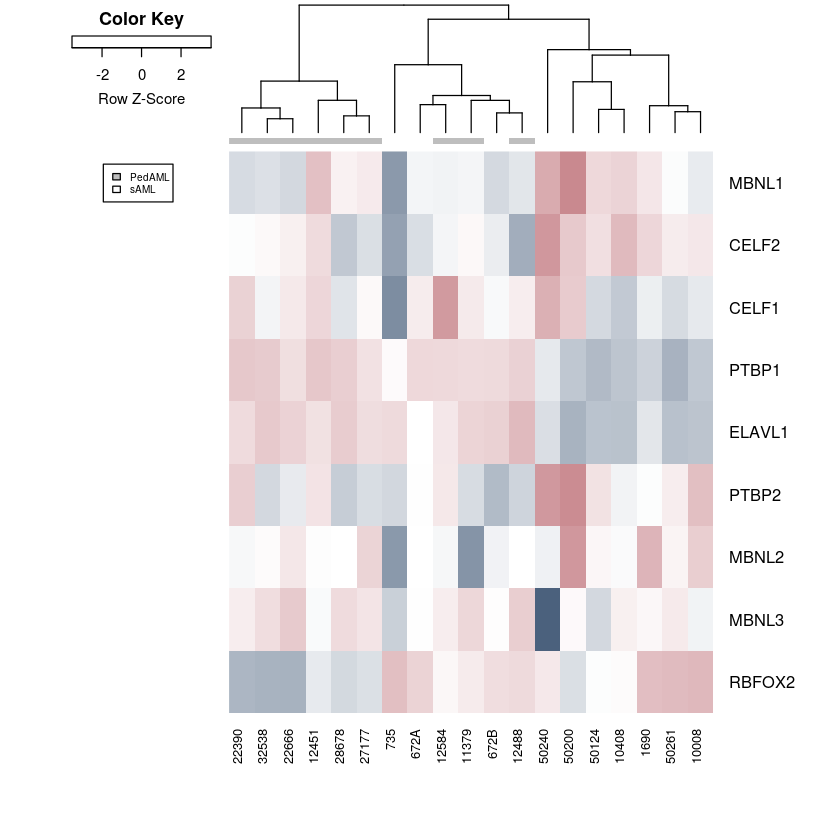

png 
  2

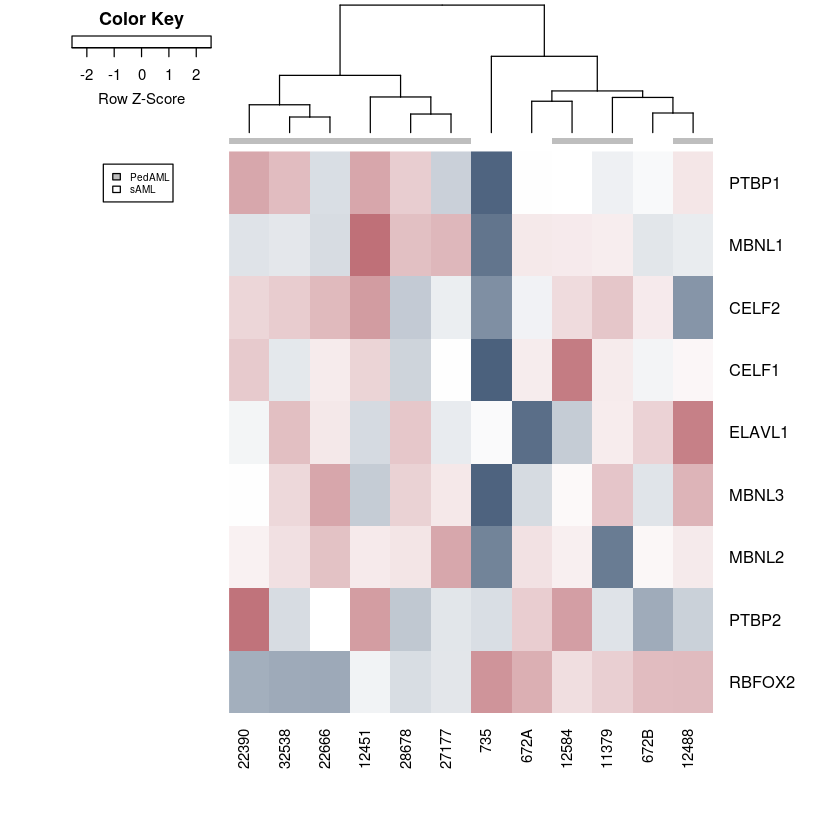

In [241]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrastsWithLogFcThreshold_MPN_PedAML_Prog, gVoomResult_MPN_PedAML_Prog, 
                          genelist=ASF2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, coeffNumber=3, expGroups=c("PedAML",  "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvssAML_SpliceosomeDF_AltSplFac", colid="Patient_ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrastsWithLogFcThreshold_MPN_PedAML_Prog.noCrews, gVoomResult_MPN_PedAML_Prog.noCrews, 
                          genelist=ASF2, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog.noCrews$samples$group, coeffNumber=3, expGroups=c("PedAML",  "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvssAML_noCrews_SpliceosomeDF_AltSplFac", colid="Patient_ID")


In [177]:
source(paste0(gSourceDir, "PcaPlotter.R"))
source(paste0(gSourceDir, "CountsPcaPlotter.R"))
doRawCountsPca = function (dgeList, sampleNameMetadataCol, shapeMetadataCol, labelsMetadataCol, 
                           labelOnlyOutliers = FALSE) {
    makeAndPrintRawCountsPca(data.frame(dgeList$counts, check.names = FALSE), 
        dgeList$samples, shapeMetadataCol, sampleNameMetadataCol, 
        designColNameForLabels = labelsMetadataCol, labelOnlyOutliers = labelOnlyOutliers)
}

makeNormalizedPca<-function(normedDgeList, designDf, groupColName, sampleColName, 
                            designColNameForLabels=NULL, labelOnlyOutliers=TRUE){
    cpm_matrix = cpm(normedDgeList, normalized.lib.sizes=T)
    cpmDf = data.frame(cpm_matrix, check.names=FALSE)
    title = "PCA of Normalized Counts" 
    makeAndPrintPca(title, cpmDf, designDf, groupColName, sampleColName, 
                    designColNameForLabels=designColNameForLabels, 
                    labelOnlyOutliers=labelOnlyOutliers)    
    return("")
}
gSampleColName = "Sample"

PCA of Raw Counts

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22
Standard deviation,74.61982,41.93860,35.19696,32.77299,31.83202,27.88200,27.26985,26.57764,25.88006,24.87199,⋯,22.53913,20.82259,19.61065,18.84370,18.19157,17.28606,16.86779,16.29106,15.50734,1.283513e-14
Proportion of Variance,0.30296,0.09570,0.06740,0.05844,0.05513,0.04230,0.04046,0.03843,0.03644,0.03366,⋯,0.02764,0.02359,0.02092,0.01932,0.01801,0.01626,0.01548,0.01444,0.01308,0.000000e+00
Cumulative Proportion,0.30296,0.39866,0.46606,0.52450,0.57964,0.62193,0.66240,0.70083,0.73727,0.77093,⋯,0.85889,0.88249,0.90341,0.92273,0.94074,0.95699,0.97248,0.98692,1.00000,1.000000e+00


Coordinate system already present. Adding new coordinate system, which will replace the existing one.


PCA of Raw Counts

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29
Standard deviation,70.45354,46.27437,32.77361,30.67103,28.58396,27.87556,26.07728,24.15281,23.54531,23.06936,⋯,16.94969,15.96616,15.46268,14.97218,14.59608,14.00924,13.73195,12.89438,11.3398,3.128766e-14
Proportion of Variance,0.26616,0.11482,0.05760,0.05044,0.04381,0.04167,0.03646,0.03128,0.02973,0.02854,⋯,0.01541,0.01367,0.01282,0.01202,0.01142,0.01052,0.01011,0.00892,0.0069,0.000000e+00
Cumulative Proportion,0.26616,0.38099,0.43858,0.48903,0.53284,0.57450,0.61097,0.64225,0.67198,0.70051,⋯,0.91362,0.92729,0.94011,0.95213,0.96355,0.97408,0.98419,0.99310,1.0000,1.000000e+00


Coordinate system already present. Adding new coordinate system, which will replace the existing one.


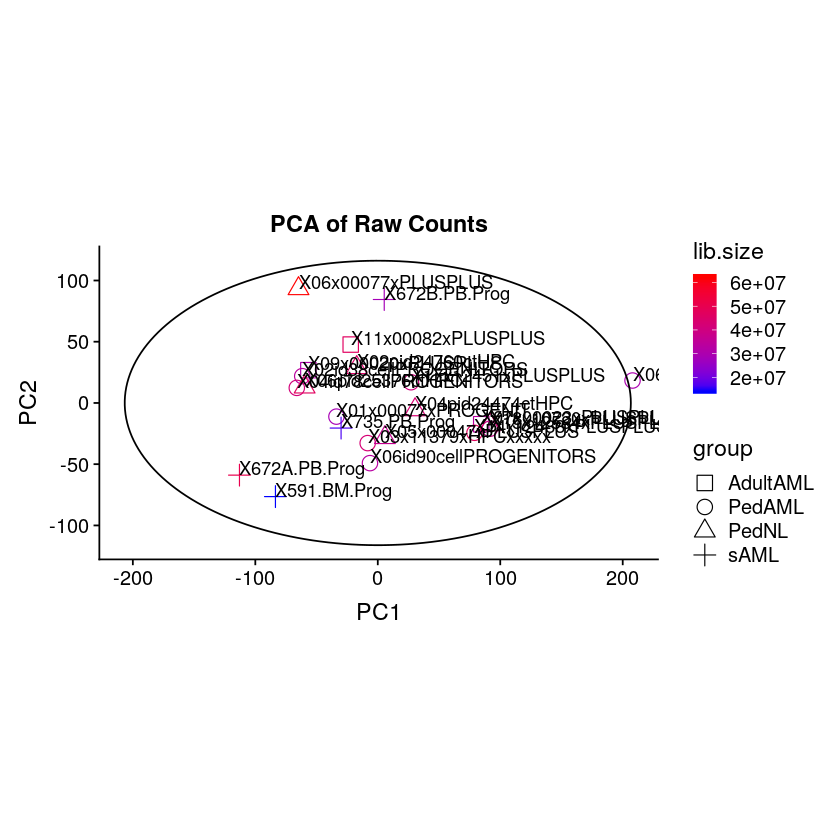

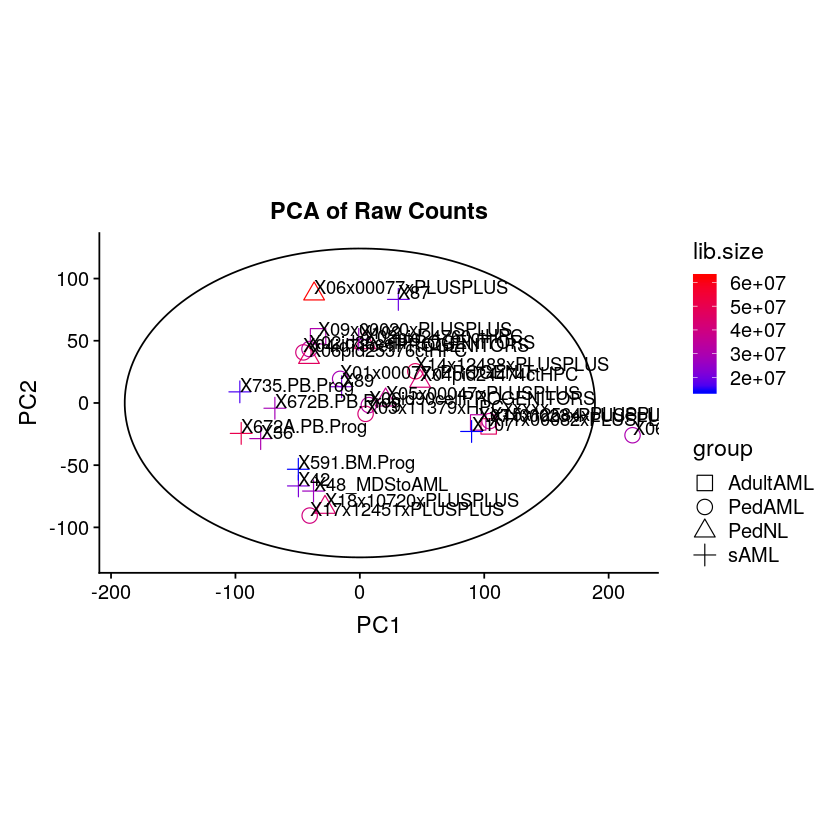

In [179]:
doRawCountsPca(DGE_PedAML_PedNL_sAML.Prog.pre.noCrews, gSampleColName, "group", "Sample")
doRawCountsPca(DGE_PedAML_PedNL_sAML.Prog.pre, gSampleColName, "group", "Sample")

PCA of Normalized Counts

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22
Standard deviation,54.63708,45.05254,37.43823,33.83610,30.60603,30.05085,28.08868,26.64014,24.99687,22.17357,⋯,18.14419,16.95420,15.63013,13.60834,13.03078,12.17816,11.44878,9.983421,9.214319,1.230846e-14
Proportion of Variance,0.20566,0.13984,0.09656,0.07888,0.06454,0.06222,0.05436,0.04889,0.04305,0.03387,⋯,0.02268,0.01980,0.01683,0.01276,0.01170,0.01022,0.00903,0.006870,0.005850,0.000000e+00
Cumulative Proportion,0.20566,0.34550,0.44206,0.52094,0.58548,0.64769,0.70205,0.75094,0.79399,0.82786,⋯,0.90695,0.92675,0.94358,0.95634,0.96804,0.97825,0.98728,0.994150,1.000000,1.000000e+00


Coordinate system already present. Adding new coordinate system, which will replace the existing one.


[1] ""

PCA of Normalized Counts

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29
Standard deviation,55.83392,43.00758,36.71985,29.33970,27.15247,26.51588,24.07654,22.95927,22.19457,21.10664,⋯,13.36515,12.28146,11.22566,9.836252,9.576854,8.872771,8.340128,7.215149,6.675254,2.479524e-14
Proportion of Variance,0.22024,0.13067,0.09526,0.06081,0.05208,0.04967,0.04095,0.03724,0.03480,0.03147,⋯,0.01262,0.01066,0.00890,0.006840,0.006480,0.005560,0.004910,0.003680,0.003150,0.000000e+00
Cumulative Proportion,0.22024,0.35091,0.44616,0.50698,0.55906,0.60873,0.64968,0.68692,0.72172,0.75320,⋯,0.94983,0.96048,0.96938,0.976220,0.982700,0.988260,0.993170,0.996850,1.000000,1.000000e+00


Coordinate system already present. Adding new coordinate system, which will replace the existing one.


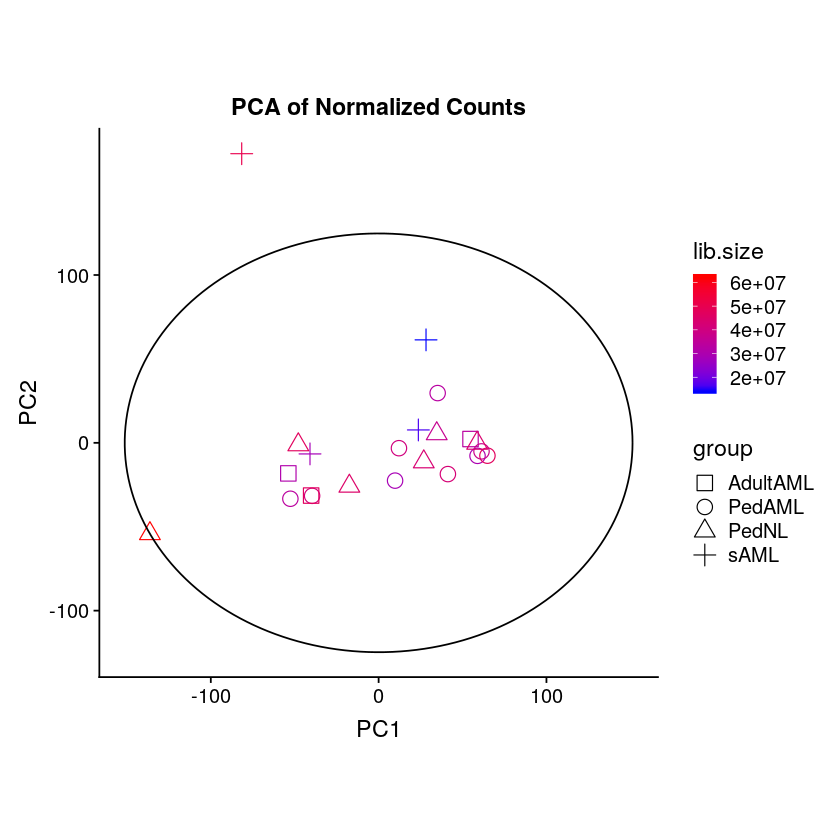

[1] ""

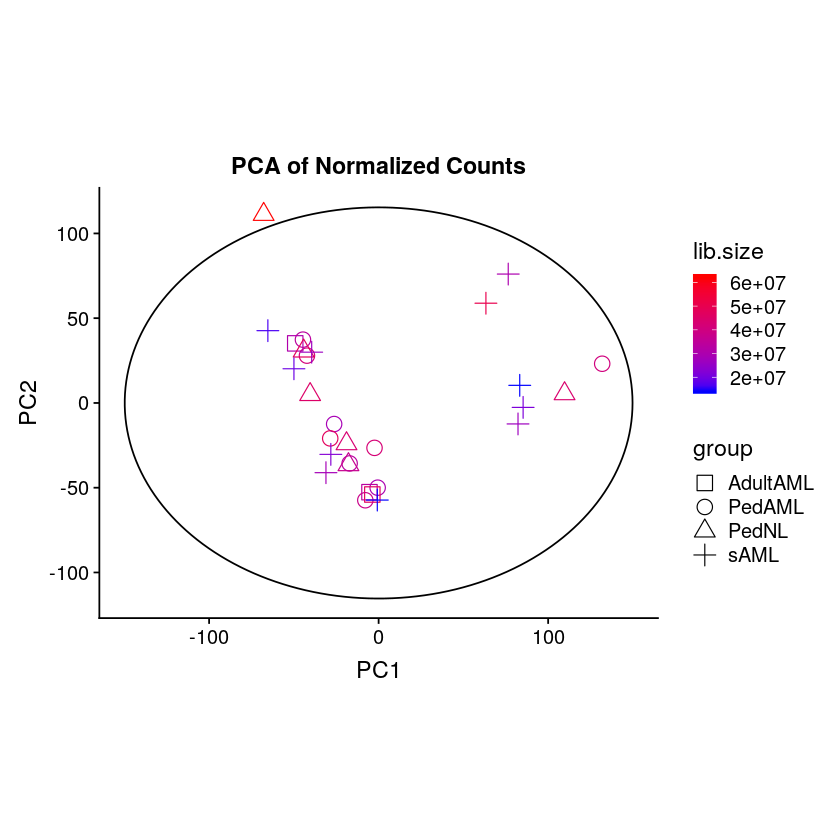

In [181]:
makeNormalizedPca(DGE_PedAML_PedNL_sAML.Prog.noCrews, DGE_PedAML_PedNL_sAML.Prog.noCrews$samples, 
                  "group", gSampleColName, labelOnlyOutliers=FALSE)
makeNormalizedPca(DGE_PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog$samples, 
                  "group", gSampleColName, labelOnlyOutliers=FALSE)

In [151]:
plotMdsColoredByColumn = function(aDgeList, colNameInSampleDf, dimensions=c(1,2), 
                                  brewerPaletteName="Dark2", labelColNameInSampleDf=NULL){
    condition <- as.factor(aDgeList$sample[[colNameInSampleDf]])
    lcpm <- cpm(aDgeList, log=TRUE)
    par(mfrow=c(1,1))
    col.condition <- condition
    naive_palette = brewer.pal(nlevels(col.condition), brewerPaletteName) #if more than 2 conditions
    extended_palette = colorRampPalette(naive_palette)(nlevels(col.condition)) 
    levels(col.condition) = extended_palette
    
    # levels(col.condition) <-  brewer.pal(nlevels(col.condition), brewerPaletteName) #if more than 2 conditions
    col.condition <- as.character(col.condition) 
    if(is.null(labelColNameInSampleDf)) {
        plotMDS(lcpm, labels=condition, col=col.condition, cex=.5, dim=dimensions)
        title(main=paste("MDS plot labeled by", colNameInSampleDf))
    } else {
        
        plotMDS(lcpm, labels=as.factor(aDgeList$sample[[labelColNameInSampleDf]]), 
                col=col.condition, cex=.5, dim=dimensions, legend="all")
        title(main=paste("MDS plot labeled by", colNameInSampleDf))
 #       legend(fill=col.condition, levels(condition))
    }
}

Warning message in brewer.pal(nlevels(col.condition), brewerPaletteName):
“n too large, allowed maximum for palette Dark2 is 8
Returning the palette you asked for with that many colors
”

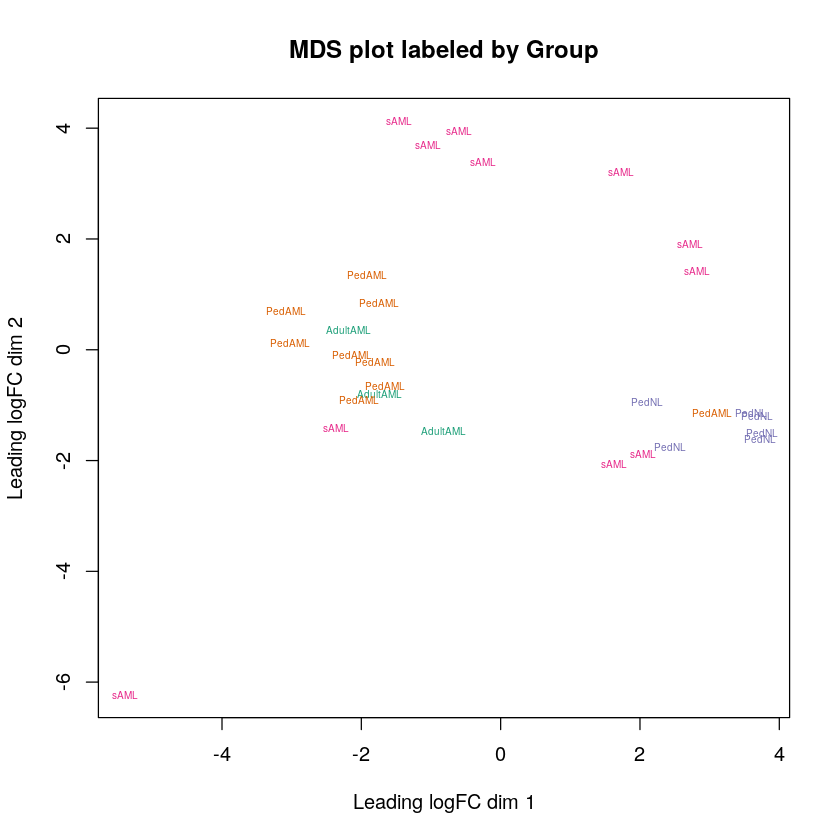

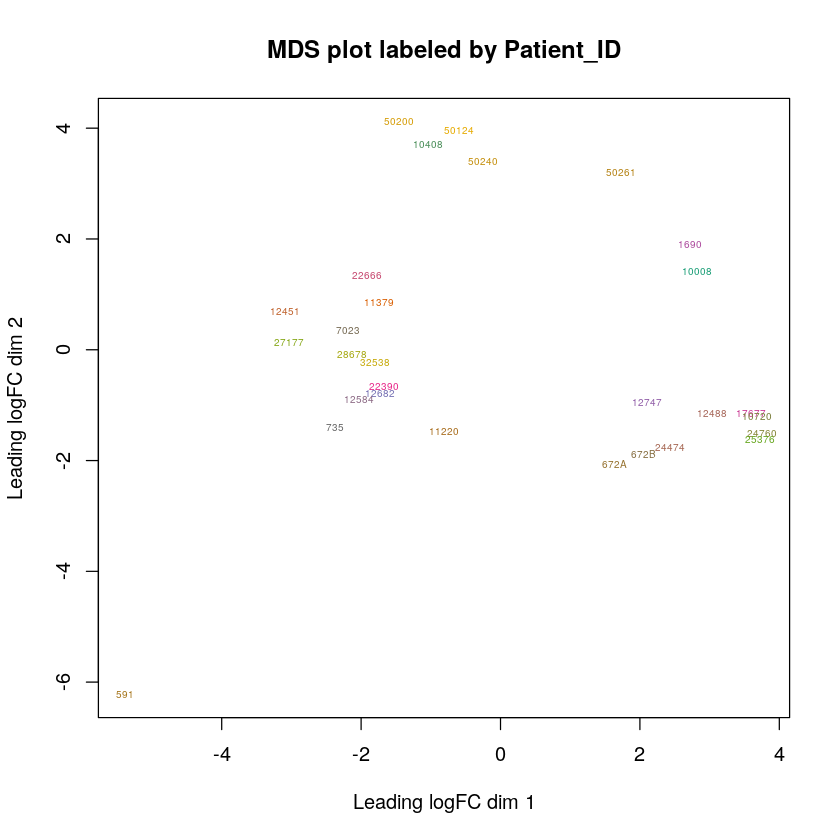

Warning message in brewer.pal(nlevels(col.condition), brewerPaletteName):
“n too large, allowed maximum for palette Dark2 is 8
Returning the palette you asked for with that many colors
”

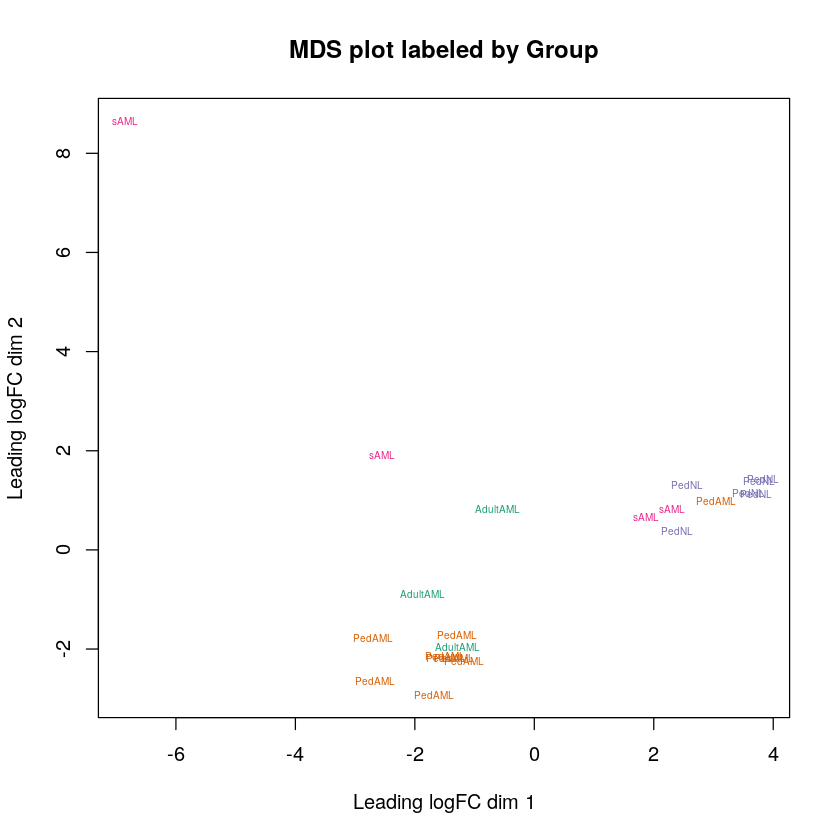

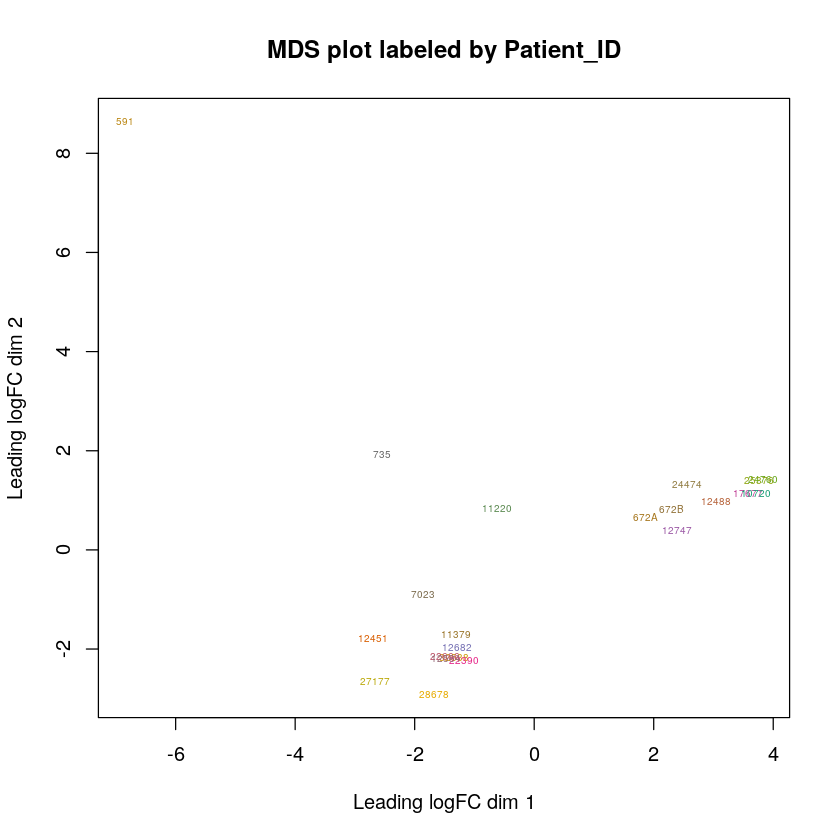

In [152]:
plotMdsColoredByColumn(DGE_PedAML_PedNL_sAML.Prog, "Group", c(1,2))
plotMdsColoredByColumn(DGE_PedAML_PedNL_sAML.Prog, "Patient_ID", c(1,2))
plotMdsColoredByColumn(DGE_PedAML_PedNL_sAML.Prog.noCrews, "Group", c(1,2))
plotMdsColoredByColumn(DGE_PedAML_PedNL_sAML.Prog.noCrews, "Patient_ID", c(1,2))

In [79]:
library(gplots)
plotGroupSumHeatmapForGenelist = function(lcpm, DGE, genelist, outputDir, runName, metadataVector, description, 
                                          expGroups, id="SYMBOL", colid="Sample_ID",
                                          fileprefix=NULL){
    
    mycol = colorpanel(1000, "#4B617D", "white", "#a63a45")
    if(id == "ENS") {
        lcpm.hits <- lcpm[rownames(lcpm) %in% genelist,]
    } else {
        geneIds.df <- ENS2EG2SYM[match(genelist, ENS2EG2SYM[[id]]),]
        lcpm.hits <- lcpm[rownames(lcpm) %in% geneIds.df$ens_id.ensembl_id,]
    }
    geneIds <- ENS2EG2SYM$SYM[match(rownames(lcpm.hits), ENS2EG2SYM$ens_id.ensembl_id)]
    i <- which(is.na(geneIds))
    if(length(i) > 0) {
        lcpm.hits <- lcpm.hits[-i,]
        geneIds <- geneIds[-i]
    }
    if (tolower(expGroups) == "all") {
      subGroups <- which(metadataVector %in% metadataVector) #Take all samples
    } else {
      subGroups <- which(metadataVector %in% expGroups)
    } 
    
    f <- as.factor(metadataVector[subGroups])
    #if (length(expGroups) == 2){
    #    group_col = c("yellow","dark green")[f]
    #} else {
        group_col = c("#A2C0E5","gray", "black", "dark green")[f]
    #}
    
        makeCustomHeatmap = function(){
        heatmap.2(lcpm.hits[,subGroups], scale="row", labRow=geneIds, 
                 labCol=DGE$samples[[colid]][subGroups], # May need to change to represent variable containing sample name
                 ColSideColors=group_col,
                 col=mycol, trace="none", density.info="none", dendrogram="column",
                 margin=c(8,8), lhei=c(2,10))  
        legend("topleft", fill=unique(group_col), legend=unique(metadataVector[subGroups]), 
             inset=c(0,0.1), cex=0.5)
    }
   
  makeCustomHeatmap()
  if(is.null(fileprefix)) {
      fileName = composeFileNameForHeatmap(aFit, outputDir, ".png", runName, description, coeffNumber, expGroups)
  } else {
      fileName = paste0(fileprefix, "_heatmap.png")
  }
  png(filename = file.path(outputDir, fileName), height = 10, width = 7, 
      units = "in", res = 300)   
  makeCustomHeatmap()
  dev.off()      
}

In [80]:
head(Splicing_c2_paths[[1]])
#table(Splicing_c2_paths[[1]] %in% gDgeList.stem$genes$ENTREZID)
table(Splicing_c2_paths[[1]] %in% DGE_PedAML_PedNL_sAML.Prog$genes$ENTREZID)
#KEGG_spl_genes_stem <- ENS2EG2SYM$ens_id.ensembl_id[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
#                                                                   gDgeList.stem$genes$ENTREZID], ENS2EG2SYM$gene_id)]
KEGG_spl_genes_prog <- ENS2EG2SYM$ens_id.ensembl_id[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
                                                                   DGE_PedAML_PedNL_sAML.Prog$genes$ENTREZID], ENS2EG2SYM$gene_id)]
#KEGG_spl_genes_stem <- KEGG_spl_genes_stem[!is.na(KEGG_spl_genes_stem)]
KEGG_spl_genes_prog <- KEGG_spl_genes_prog[!is.na(KEGG_spl_genes_prog)]
allsplice_genes <- ENS2EG2SYM$ens_id.ensembl_id[match(unique(unlist(Splicing_c2_paths)), ENS2EG2SYM$gene_id)]
length(allsplice_genes)

[1] "9343"   "23658"  "10291"  "144983" "10992"  "27339"


FALSE  TRUE 
    4   124 

[1] 343

[1] 124  29


FALSE  TRUE 
14031   124 


FALSE  TRUE 
13861   294 

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

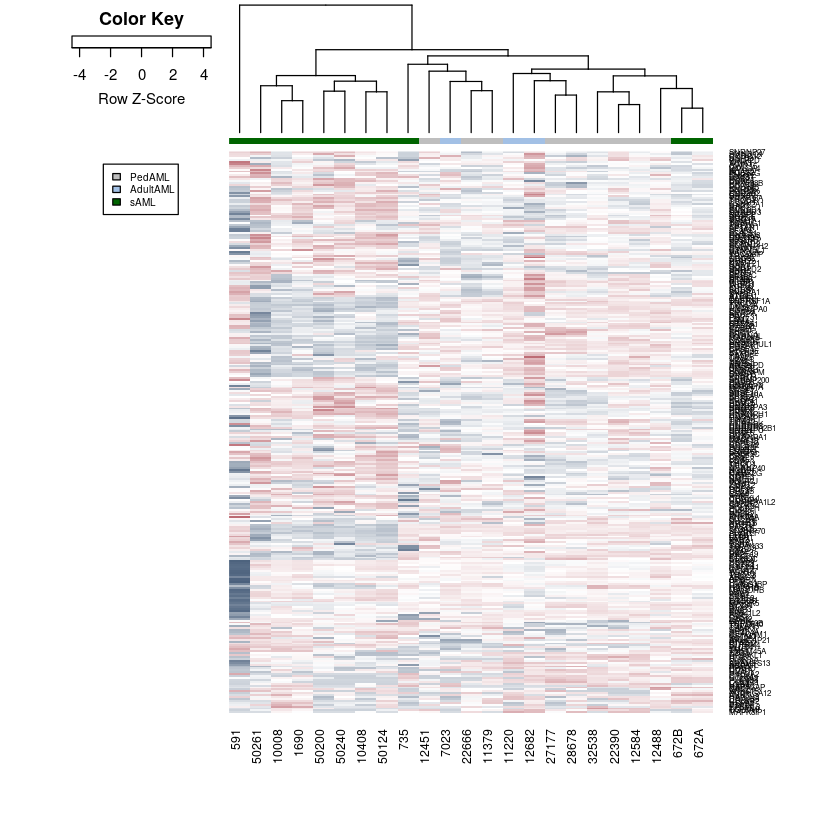

In [81]:
#head(KEGG_spl_genes_stem)
#head(KEGG_spl_genes_prog)
#table(DGE_PedAML_PedNL_sAML.Prog$samples$group)
dim(lcpm2.PedAML_PedNL_sAML.Prog[rownames(lcpm2.PedAML_PedNL_sAML.Prog) %in% KEGG_spl_genes_prog,])
table(rownames(lcpm2.PedAML_PedNL_sAML.Prog) %in% KEGG_spl_genes_prog)
table(rownames(lcpm2.PedAML_PedNL_sAML.Prog) %in% allsplice_genes)
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=allsplice_genes, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("AdultAML", "PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAMLvssAML_KEGG_Spliceosome", colid="Patient_ID")



FALSE  TRUE 
    4   124 


FALSE  TRUE 
14391   124 

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

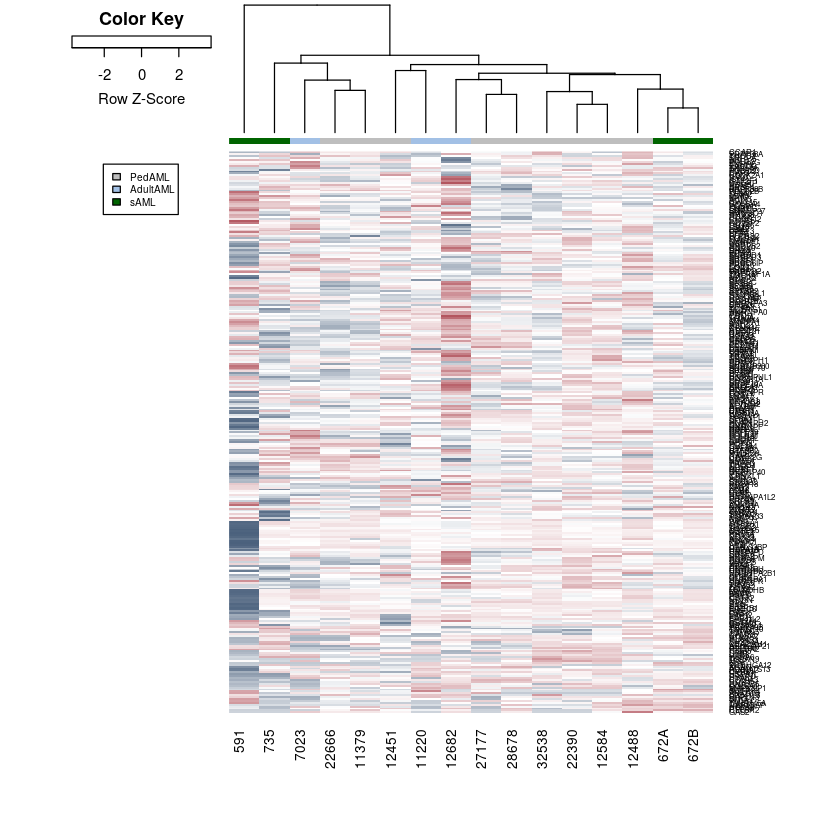

In [227]:
table(Splicing_c2_paths[[1]] %in% DGE_PedAML_PedNL_sAML.Prog$genes$ENTREZID)
KEGG_spl_genes_prog.noCrews <- ENS2EG2SYM$ens_id.ensembl_id[match(Splicing_c2_paths[[1]][Splicing_c2_paths[[1]] %in% 
                                                                   DGE_PedAML_PedNL_sAML.Prog.noCrews$genes$ENTREZID], ENS2EG2SYM$gene_id)]
KEGG_spl_genes_prog.noCrews <- KEGG_spl_genes_prog[!is.na(KEGG_spl_genes_prog.noCrews)]
table(rownames(lcpm2.PedAML_PedNL_sAML.Prog.noCrews) %in% KEGG_spl_genes_prog.noCrews)
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog.noCrews, DGE_PedAML_PedNL_sAML.Prog.noCrews, 
                          genelist=allsplice_genes, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog.noCrews$samples$group, expGroups=c("AdultAML", "PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAMLvsNoCrewssAML_KEGG_Spliceosome", colid="Patient_ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

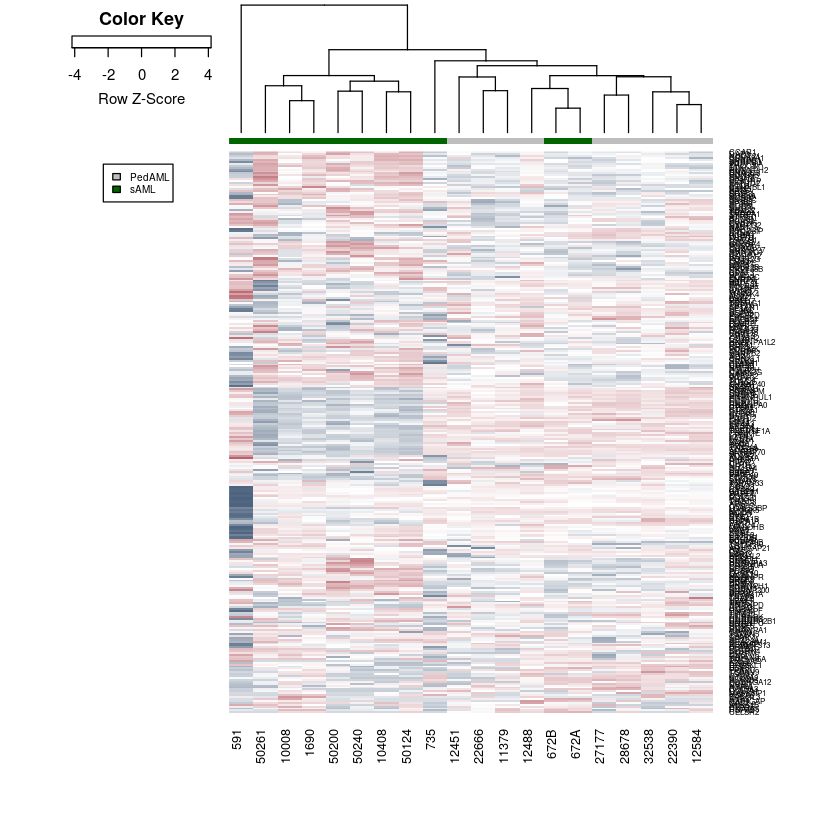

png 
  2

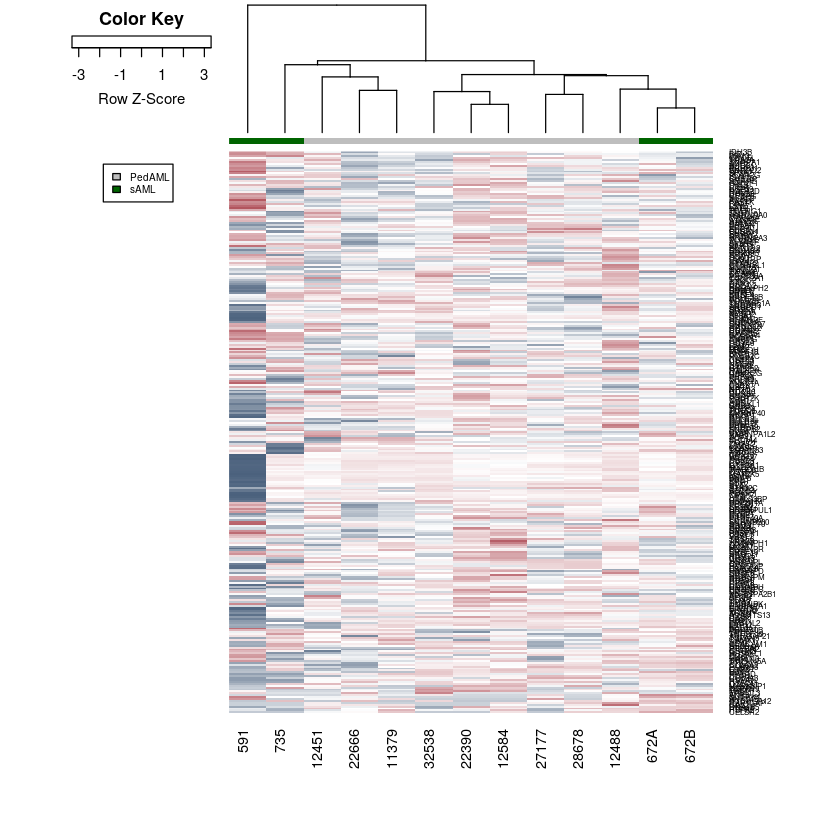

In [82]:
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=allsplice_genes, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvssAML_KEGG_Spliceosome", colid="Patient_ID")
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog.noCrews, DGE_PedAML_PedNL_sAML.Prog.noCrews, 
                          genelist=allsplice_genes, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog.noCrews$samples$group, expGroups=c("PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsnoCrewssAML_KEGG_Spliceosome", colid="Patient_ID")



FALSE  TRUE 
14031   124 

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

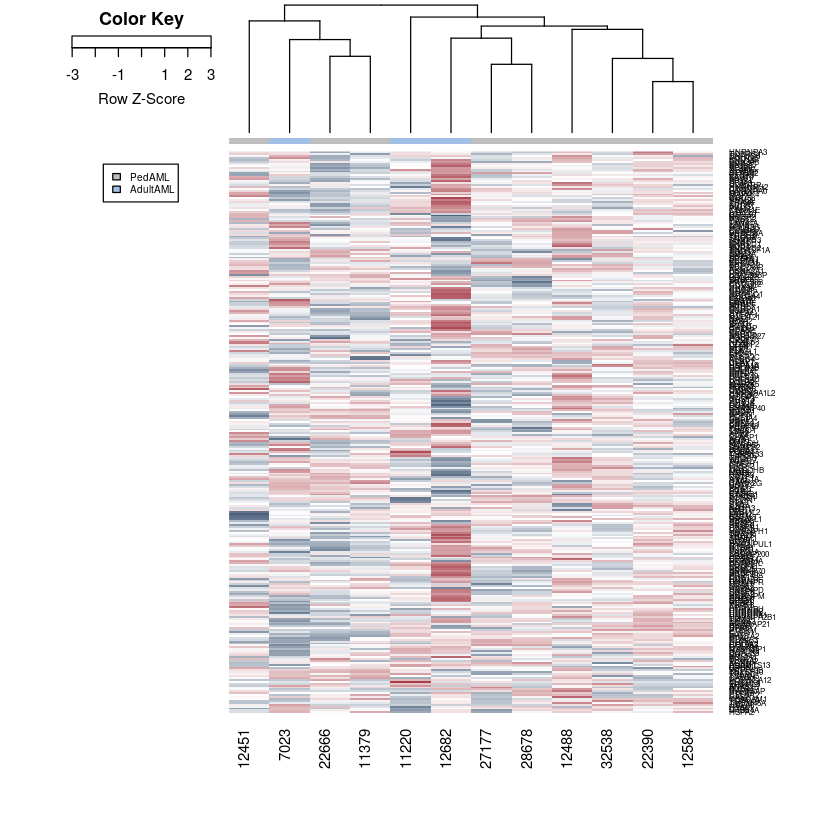

In [229]:
table(rownames(lcpm2.PedAML_PedNL_sAML.Prog) %in% KEGG_spl_genes_prog)
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=allsplice_genes, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_KEGG_Spliceosome", colid="Patient_ID")


In [131]:
spl_db <- read.csv("../inputs//SpliceosomeDB_HumanProteins.csv", header=TRUE, stringsAsFactors=FALSE)
dim(spl_db)
#length(unique(spl_db$Gene.Symbol))
#head(spl_db)
spl_db_uni <- unique(spl_db$Gene.Symbol)
#spl_db_ensgenes <- ENS2EG2SYM$ens_id.ensembl_id[match(spl_db_uni, ENS2EG2SYM$SYM)]
spl_db_ens <- spl_db$Ensemble.Gene.ID
#table(spl_db$Class...family)
table(spl_db_uni %in% ENS2EG2SYM$SYM)
spl_db_cats <- c("17S U2 snRNP", "17S U2 snRNP associated", 
            "alternative splicing factor", "anaphase promoting complex", "chaperonin/heat shock", 
            "chromatin-related", "coatomer protein complex", "common MS contaminants", "CPSF", "CSTF", "EJC/mRNP",
            "exocyst", "exosome", "GEM","hnRNP", "integrator complex", "linked to splicing ", "LSm", 
            "misc. proteins found irregularly with spliceosomes", "nuclear import/export machinery", 
            "nuclear pore complex", "Occasionally detected in Bact complex", "Occasionally detected in C complex", 
            "other rna binding domain containing", "pre-mRNA/mRNA binding proteins", "proteosome", "PRP19 complex", 
            "PRP19 related", "Recruited at A complex", "Recruited at B complex", "Recruited at Bact complex", 
            "Recruited at C complex", "RES complex", "ribosome", "Second step factors", "Sm", 
            "SMARC- chromatin-related", "SR protein", "SR related", "translation-related", "TREX",
            "tri-snRNP","U1 snRNP","U11/U12 snRNP", "U4/U6 recycling", "U4/U6 snRNP","U5 snRNP")
spl_db_test <- spl_db[spl_db$Class...family %in% c("", "17S U2 snRNP", "17S U2 snRNP associated", 
            "alternative splicing factor", "chaperonin/heat shock", 
            "CPSF", "CSTF", "EJC/mRNP",
            "exocyst", "exosome", "GEM","hnRNP", "integrator complex", "linked to splicing ", "LSm", 
            "misc. proteins found irregularly with spliceosomes", 
            "Occasionally detected in Bact complex", "Occasionally detected in C complex", 
            "other rna binding domain containing", "pre-mRNA/mRNA binding proteins", "proteosome", "PRP19 complex", 
            "PRP19 related", "Recruited at A complex", "Recruited at B complex", "Recruited at Bact complex", 
            "Recruited at C complex", "RES complex", "ribosome", "Second step factors", "Sm", 
            "SR protein", "SR related", "translation-related", "TREX",
            "tri-snRNP","U1 snRNP","U11/U12 snRNP", "U4/U6 recycling", "U4/U6 snRNP","U5 snRNP"),]
spl_db_test2 <- spl_db[spl_db$Class...family %in% c("", "hnRNP", "SR protein", "U1 snRNP", "U5 snRNP",
                                                    "U11/U12 snRNP", "17S U2 snRNP", "17S U2 snRNP associated", 
                                                   "pre-mRNA/mRNA binding proteins"
                                                   ),]
spl_db_test3 <- spl_db[spl_db$Class...family %in% c("", "hnRNP", "SR protein", "U1 snRNP", "U5 snRNP",
                                                    "U11/U12 snRNP", "17S U2 snRNP", "17S U2 snRNP associated", 
                                                   "pre-mRNA/mRNA binding proteins", "alternative splicing factor"
                                                   ),]
spl_db_ens_test <- spl_db_test2$Ensemble.Gene.ID
spl_db_sym_test <- spl_db_test2$Gene.Symbol
length(spl_db_ens_test)
table(spl_db_test2$Class...family)
#table(spl_db_ensgenes %in% rownames(lcpm2.PedAML_PedNL_sAML.Prog))
dim(topTable_PedAMLvsAdultAML_Prog)
table(abs(topTable_PedAMLvsAdultAML_Prog$AveExpr) > 7)
spl_db_ens_int <- spl_db_ens[spl_db_ens %in% topTable_PedAMLvsAdultAML_Prog$ENSEMBL[abs(topTable_PedAMLvsAdultAML_Prog$AveExpr) > 7]]
table(spl_db_ens %in% topTable_PedAMLvsAdultAML_Prog$ENSEMBL[abs(topTable_PedAMLvsAdultAML_Prog$AveExpr) > 7])



[1] 1110   16


FALSE  TRUE 
   75  1035 

[1] 677


                                                 17S U2 snRNP 
                           568                             13 
       17S U2 snRNP associated                          hnRNP 
                            11                             29 
pre-mRNA/mRNA binding proteins                     SR protein 
                            21                             16 
                      U1 snRNP                  U11/U12 snRNP 
                             5                              5 
                      U5 snRNP 
                             9 

[1] 12069    12


FALSE  TRUE 
10597  1472 


FALSE  TRUE 
  678   432 

In [128]:
levels(gVoomResult_MPN_PedAML_Prog$targets$group)

[1] "AdultAML" "PedAML"   "PedNL"    "sAML"

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


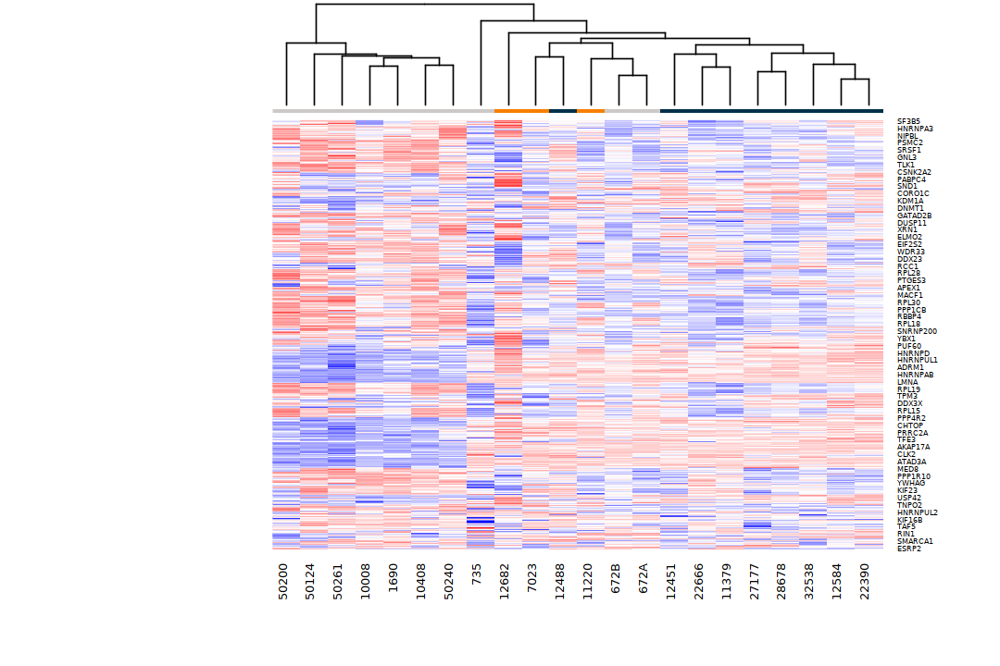

png 
  2

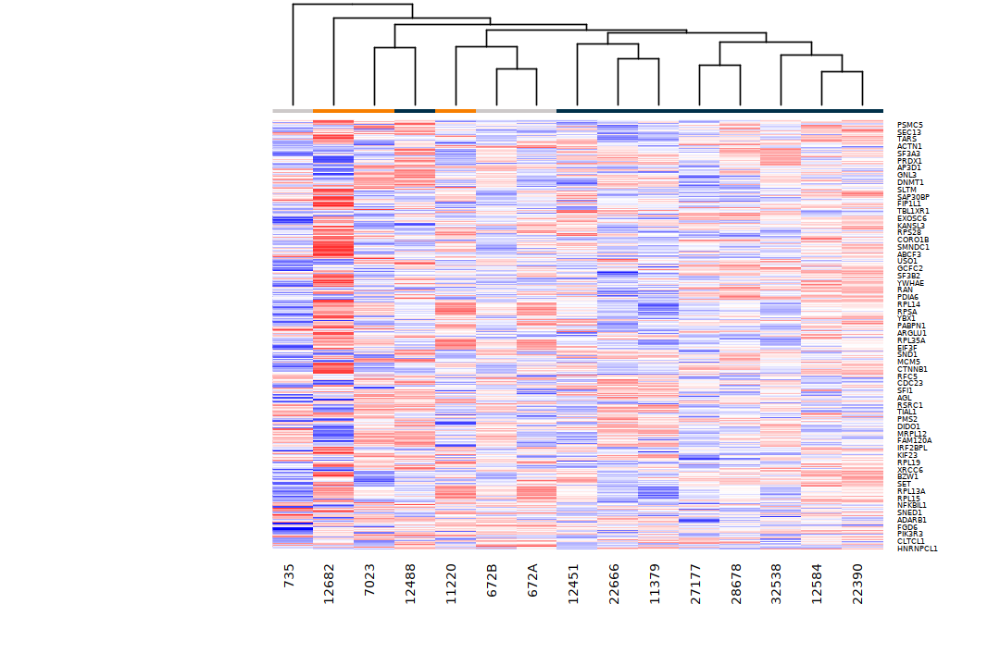

In [130]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog, gVoomResult_MPN_PedAML_Prog, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gVoomResult_MPN_PedAML_Prog$targets$group, coeffNumber=1, expGroups=c("AdultAML", "PedAML", "sAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_Voom_PedAMLvsAdultAMLvssAML_no591_SpliceosomeDB_filt_02092022"), colid="Patient_ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews, gVoomResult_MPN_PedAML_Prog.noCrews, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gVoomResult_MPN_PedAML_Prog.noCrews$targets$group, coeffNumber=1, expGroups=c("AdultAML", "PedAML", "sAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_Voom_PedAMLvsAdultAMLvsnoCrewssAML_no591_SpliceosomeDB_filt_02092022"), colid="Patient_ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”


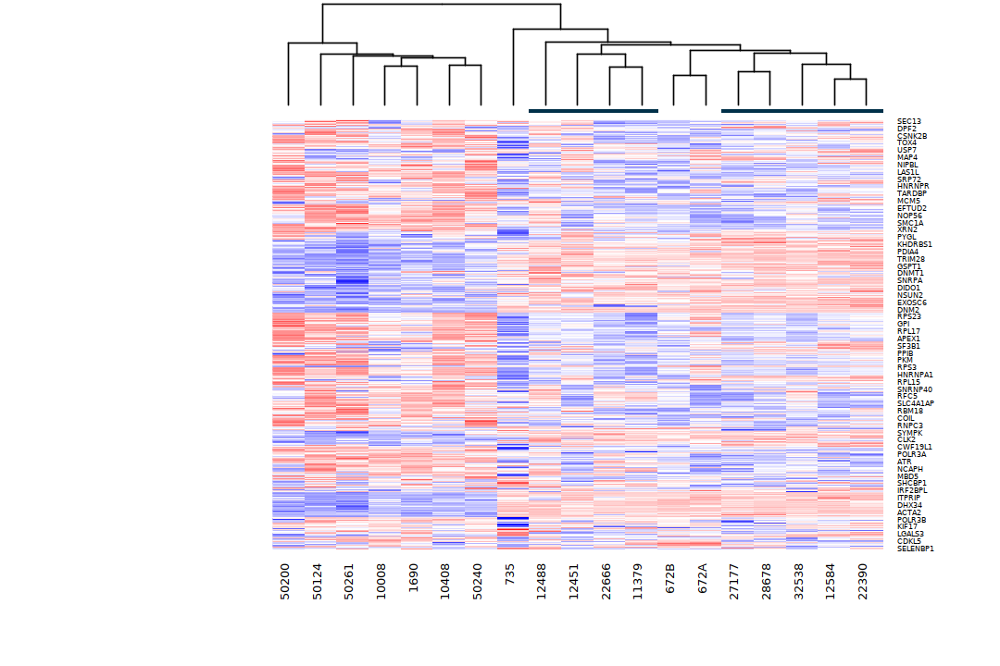

png 
  2

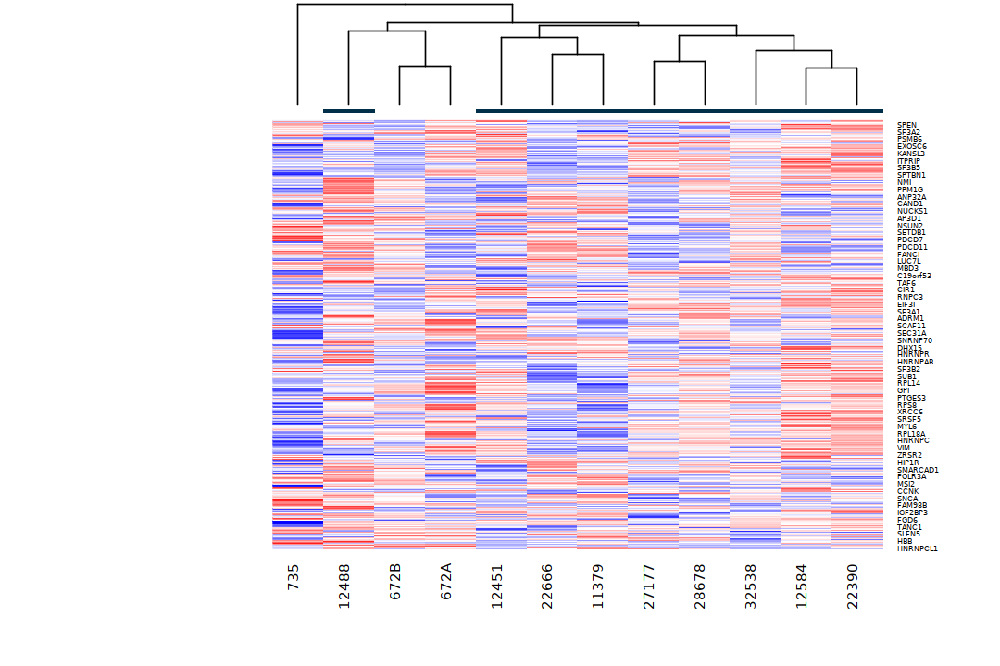

In [115]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog, gVoomResult_MPN_PedAML_Prog, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gVoomResult_MPN_PedAML_Prog$targets$group, coeffNumber=1, expGroups=c("PedAML", "sAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_Voom_PedAMLvssAML_no591_SpliceosomeDB_677"), colid="Patient_ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews, gVoomResult_MPN_PedAML_Prog.noCrews, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gVoomResult_MPN_PedAML_Prog.noCrews$targets$group, coeffNumber=1, expGroups=c("PedAML", "sAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_Voom_PedAMLvsnoCrewssAML_no591_SpliceosomeDB_677"), colid="Patient_ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

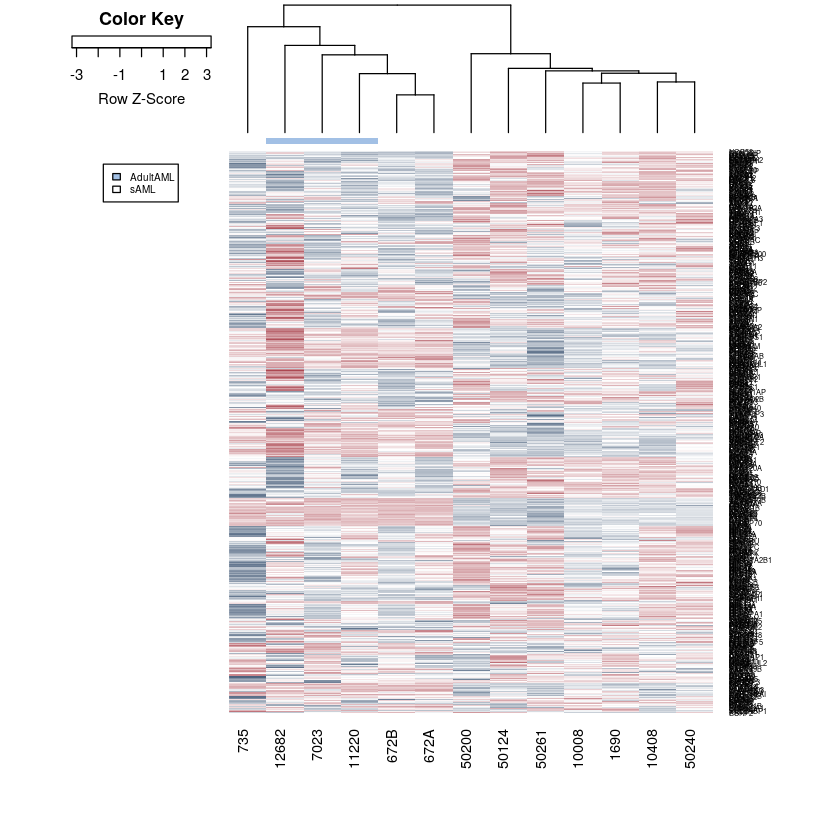

png 
  2

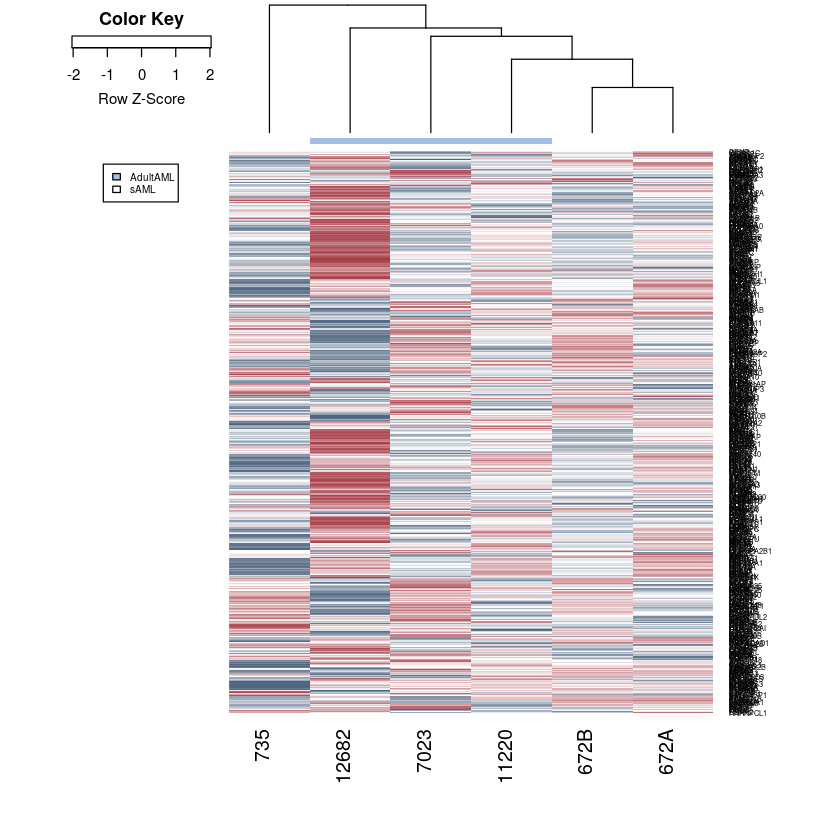

In [190]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog, gVoomResult_MPN_PedAML_Prog, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gVoomResult_MPN_PedAML_Prog$targets$group, coeffNumber=1, expGroups=c("AdultAML", "sAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_Voom_AdultAMLvssAML_no591_SpliceosomeDB_677"), colid="Patient_ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts_MPN_PedAML_Prog.noCrews, gVoomResult_MPN_PedAML_Prog.noCrews, 
                          genelist=spl_db_sym_test, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gVoomResult_MPN_PedAML_Prog.noCrews$targets$group, coeffNumber=1, expGroups=c("AdultAML", "sAML"), 
                          fileprefix=paste0("DeWerf_Human_PediatricAML_Prog_Voom_AdultAMLvsnoCrewssAML_no591_SpliceosomeDB_677"), colid="Patient_ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

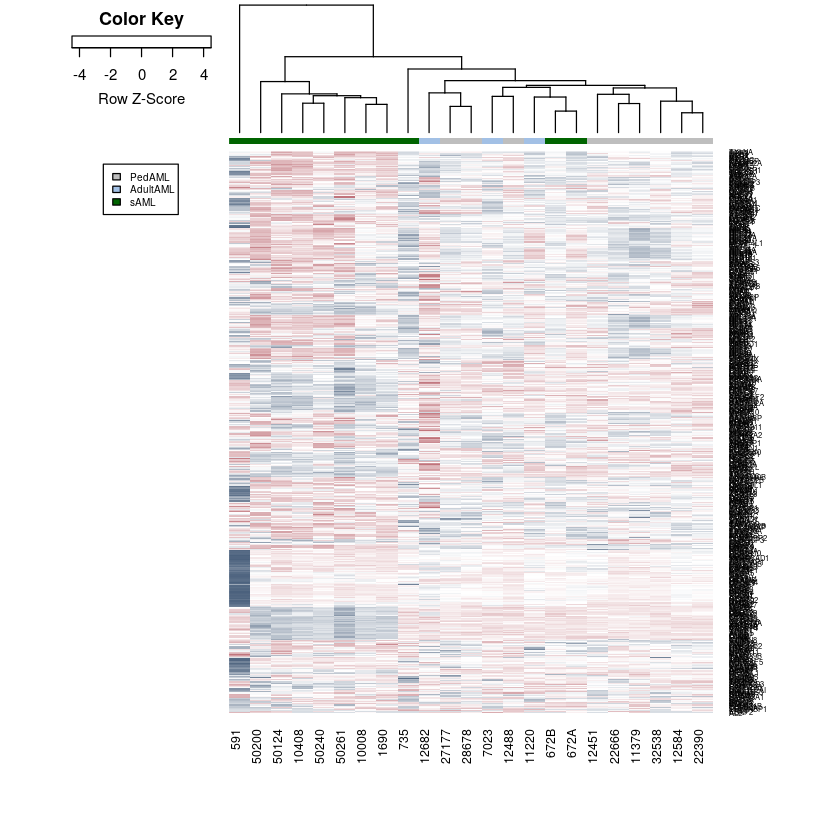

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

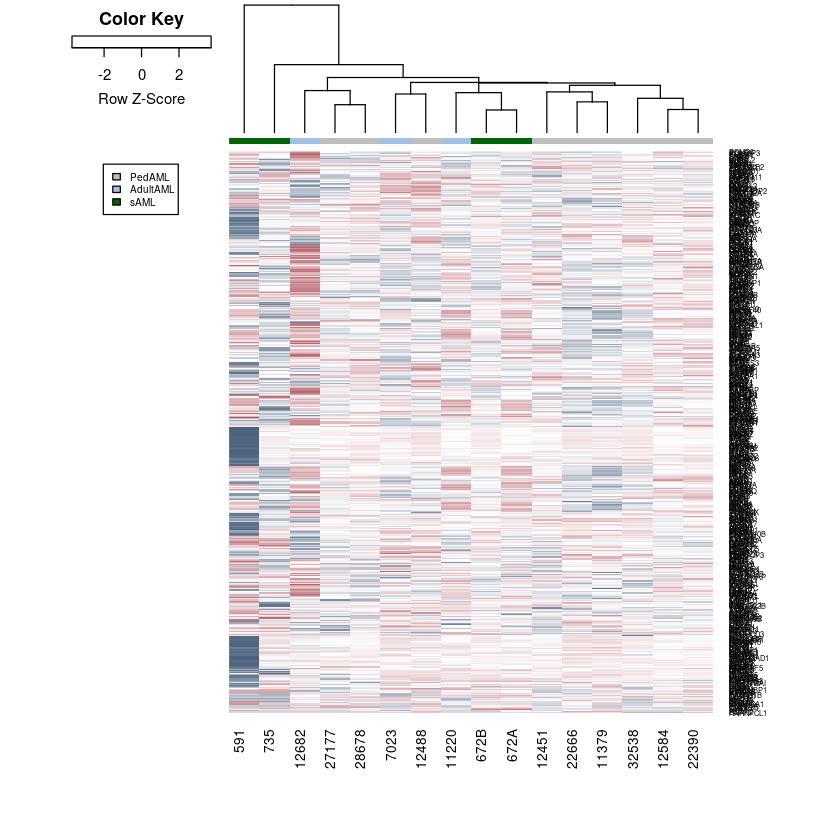

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

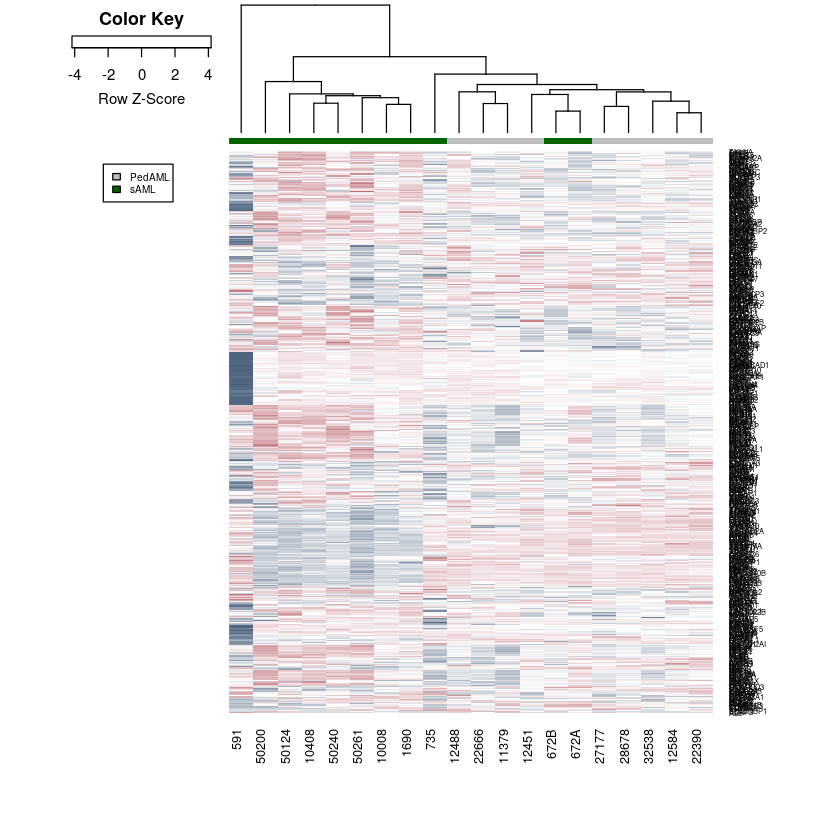

png 
  2

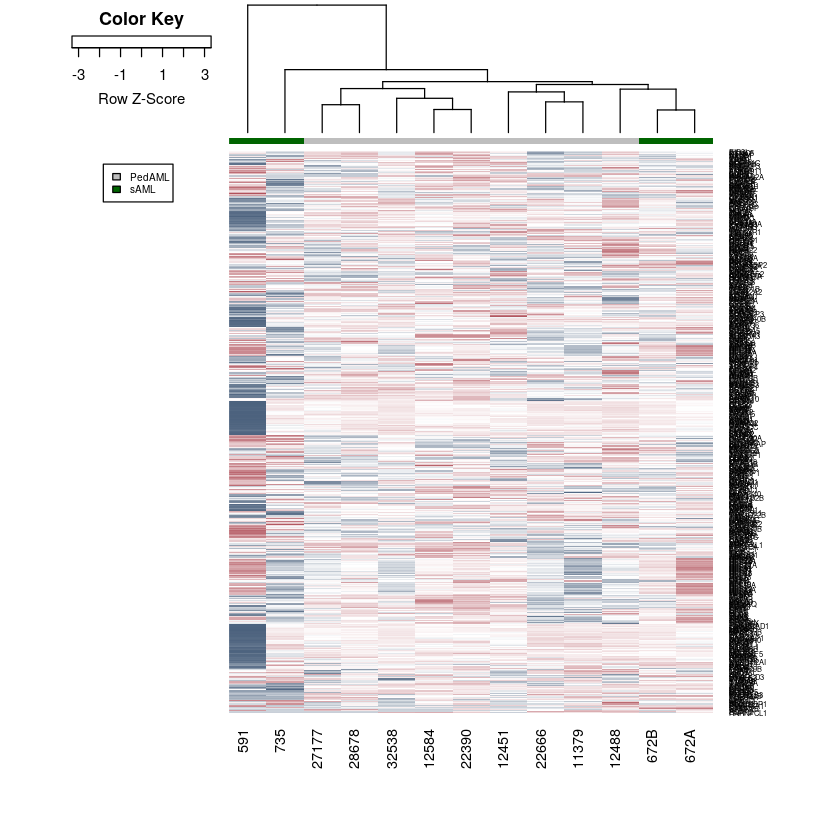

In [92]:
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=spl_db_ens_test, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("AdultAML", "PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAMLvssAML_SpliceosomeDB_filt", colid="Patient_ID")
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog.noCrews, DGE_PedAML_PedNL_sAML.Prog.noCrews, 
                          genelist=spl_db_ens_test, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog.noCrews$samples$group, expGroups=c("AdultAML", "PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAMLvsNoCrewssAML_SpliceosomeDB_filt", colid="Patient_ID")


plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=spl_db_ens_test, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvssAML_SpliceosomeDB_filt", colid="Patient_ID")
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog.noCrews, DGE_PedAML_PedNL_sAML.Prog.noCrews, 
                          genelist=spl_db_ens_test, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog.noCrews$samples$group, expGroups=c("PedAML", "sAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsnoCrewssAML_SpliceosomeDB_filt", colid="Patient_ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

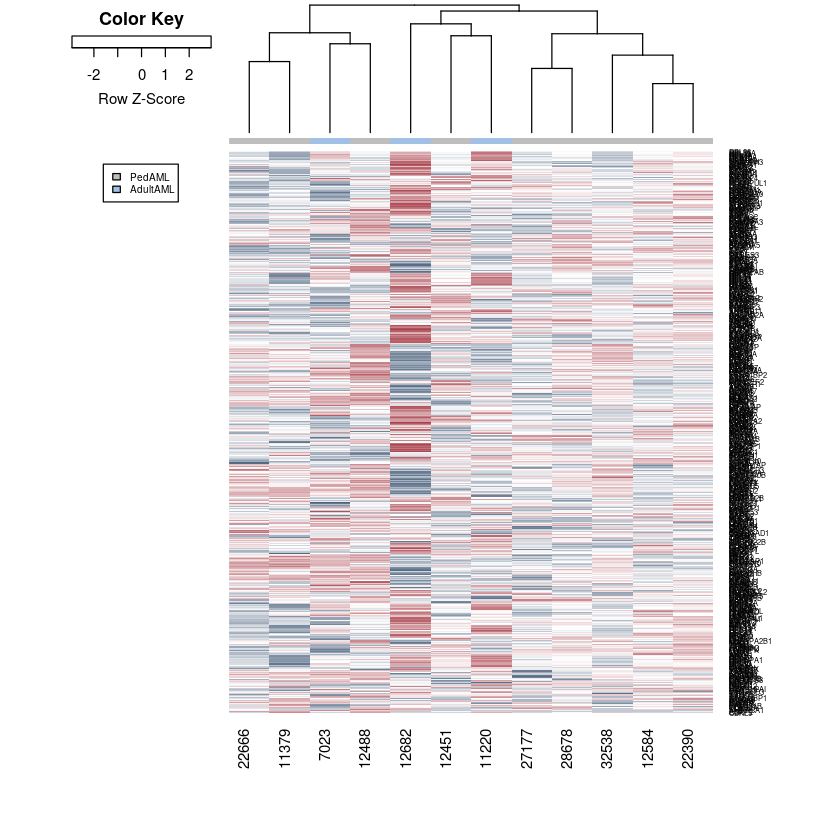

In [110]:
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=spl_db_ens_test, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_SpliceosomeDB_filt_lcpm", colid="Patient_ID")


In [219]:
#topTable_PedAMLvsPedNL_Prog <- topTable(gModeratedVoomedFitForContrasts.prog, coef=2, n=Inf)
#topTable_PedAMLvsPedNL_Stem <- topTable(gModeratedVoomedFitForContrasts.stem, coef=2, n=Inf)
dim(topTable_PedAMLvsPedNL_Prog)
dim(topTable_PedAMLvsPedNL_Stem)
table(topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05, topTable_PedAMLvsPedNL_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol)
table(topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05, topTable_PedAMLvsPedNL_Stem$SYMBOL %in% spl_db_test3$Gene.Symbol)
topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$SYMBOL %in% "RBFOX2",]
topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$SYMBOL %in% "RBFOX2",]

[1] 12069    10

[1] 11837    10

       
        FALSE  TRUE
  FALSE 10824   573
  TRUE    646    26

       
        FALSE  TRUE
  FALSE 11033   588
  TRUE    209     7

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
178,ENSG00000100320,23543,RBFOX2,protein_coding,-4.204745,-0.7028527,-4.4578,0.0002738458,0.01758003,0.478375


,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<fct>,<int>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
102,ENSG00000100320,23543,RBFOX2,protein_coding,-5.668322,-0.4577893,-4.772882,0.0002167001,0.0278813,0.4497753


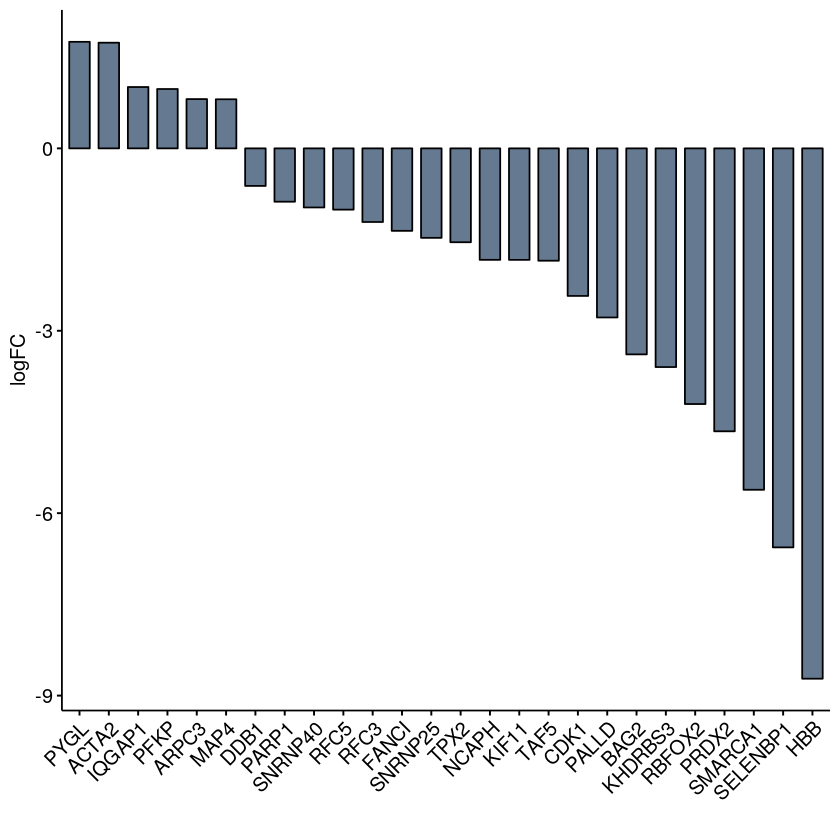

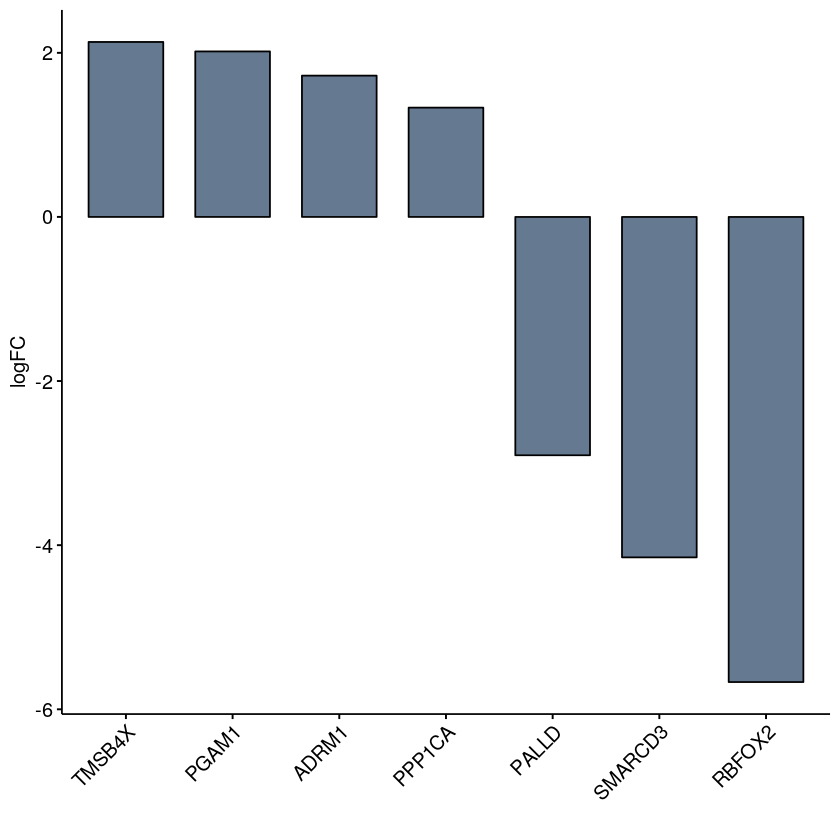

In [232]:
DE_splDB_plotinp_Prog <- topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$adj.P.Val < 0.05 & 
                                                     topTable_PedAMLvsPedNL_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_Stem <- topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$adj.P.Val < 0.05 &
                                                     topTable_PedAMLvsPedNL_Stem$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_Prog$SYMBOL <- as.character(DE_splDB_plotinp_Prog$SYMBOL)
DE_splDB_plotinp_Stem$SYMBOL <- as.character(DE_splDB_plotinp_Stem$SYMBOL)
#head(DE_splDB_plotinp_Prog)
#head(DE_splDB_plotinp_Stem)
ggbarplot(DE_splDB_plotinp_Prog[order(DE_splDB_plotinp_Prog$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#657991", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
ggbarplot(DE_splDB_plotinp_Stem[order(DE_splDB_plotinp_Stem$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#657991", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 



FALSE  TRUE 
13899   234 


FALSE  TRUE 
14484     7 


FALSE  TRUE 
14009   124 


FALSE 
14491 

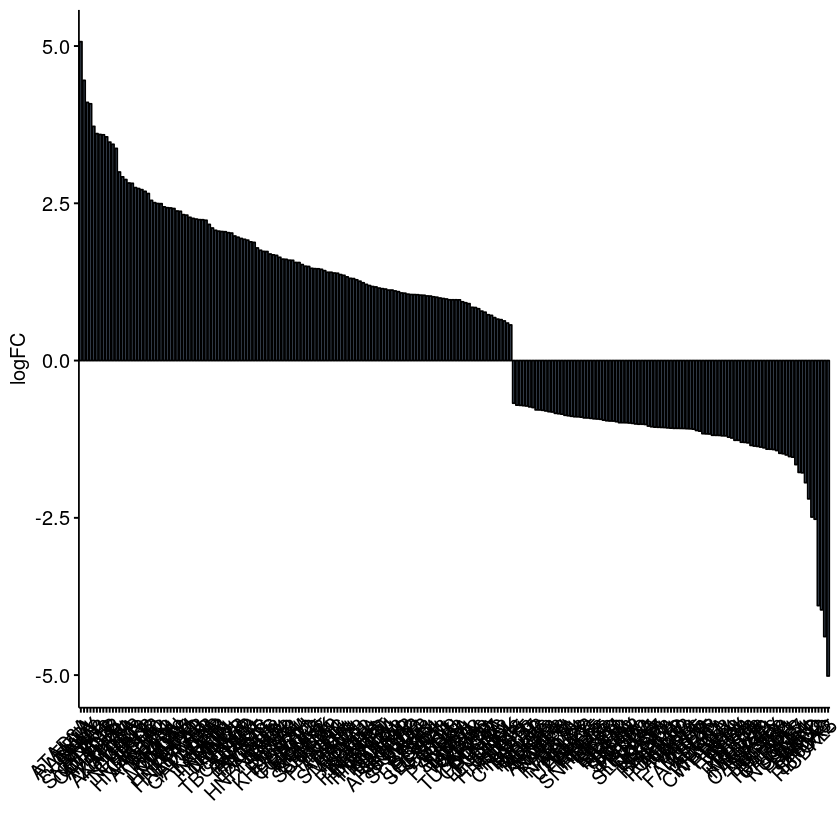

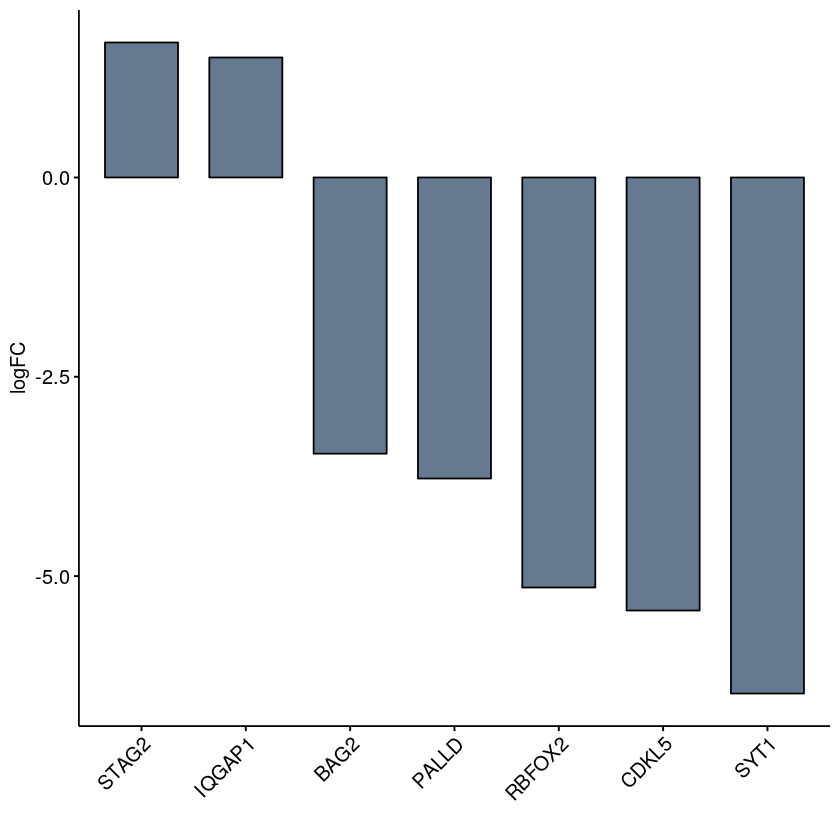

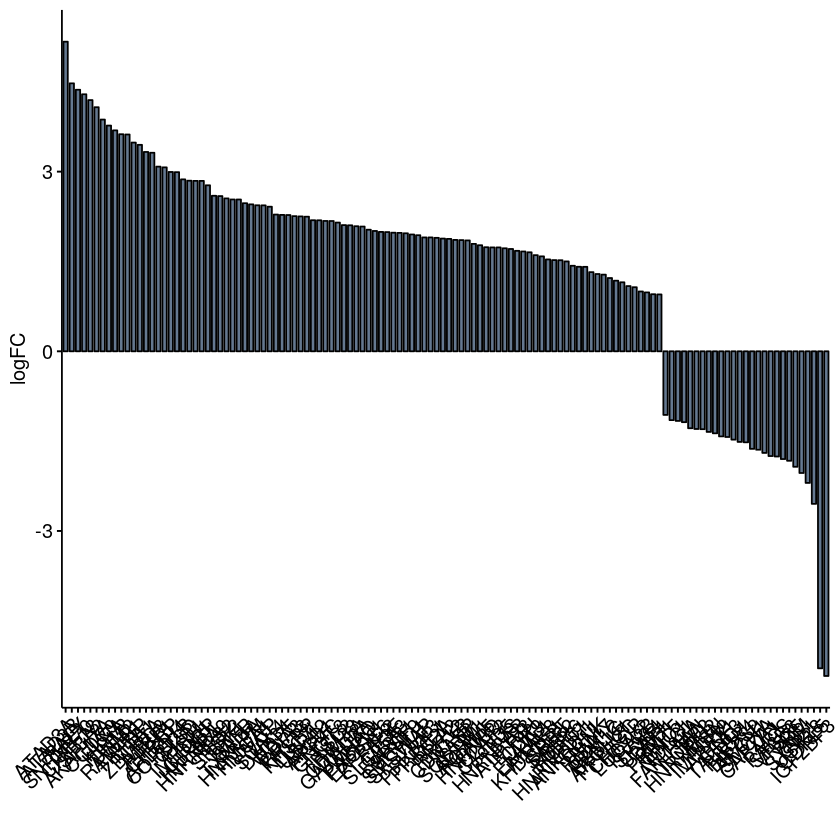

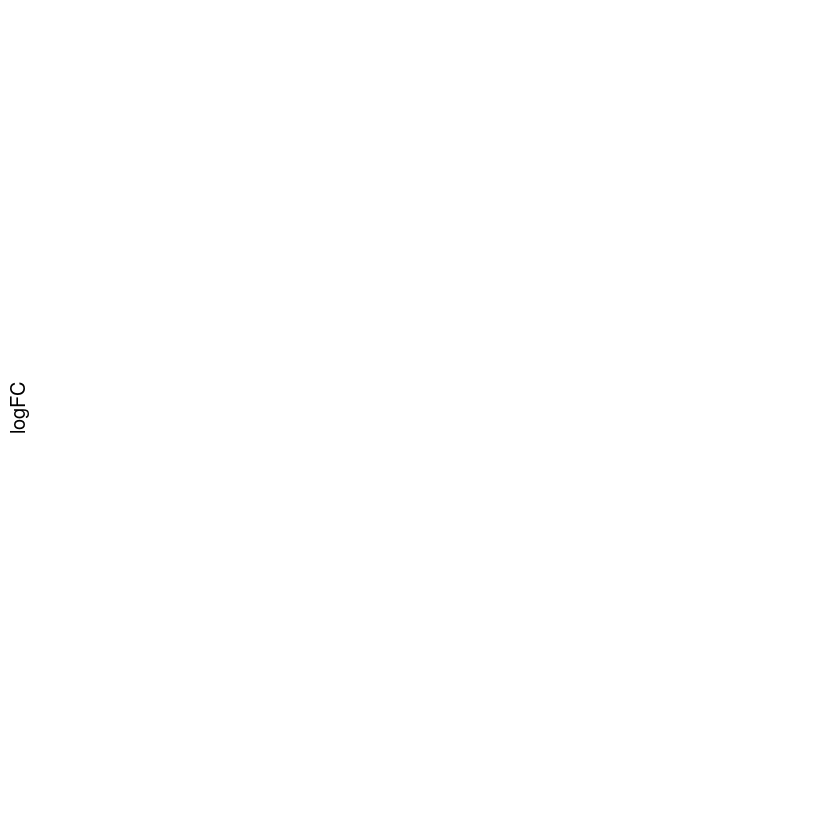

In [249]:
table(topTable_MPN_PedAMLvssAML_Prog$adj.P.Val < 0.05 & 
                                     topTable_MPN_PedAMLvssAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol)
table(topTable_MPN_PedAMLvssAML_Prog.noCrews$adj.P.Val < 0.05 & 
                                     topTable_MPN_PedAMLvssAML_Prog.noCrews$SYMBOL %in% spl_db_test3$Gene.Symbol)
table(topTable_MPN_AdultAMLvssAML_Prog$adj.P.Val < 0.05 & 
                                     topTable_MPN_AdultAMLvssAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol)
table(topTable_MPN_AdultAMLvssAML_Prog.noCrews$adj.P.Val < 0.05 & 
                                     topTable_MPN_AdultAMLvssAML_Prog.noCrews$SYMBOL %in% spl_db_test3$Gene.Symbol)

DE_splDB_PedAMLvsAML_plotinp_Prog <- topTable_MPN_PedAMLvssAML_Prog[topTable_MPN_PedAMLvssAML_Prog$adj.P.Val < 0.05 & 
                                     topTable_MPN_PedAMLvssAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_PedAMLvsAML_plotinp_Prog$SYMBOL <- as.character(DE_splDB_PedAMLvsAML_plotinp_Prog$SYMBOL)
#head(DE_splDB_PedAMLvsAML_plotinp_Prog)
ggbarplot(DE_splDB_PedAMLvsAML_plotinp_Prog[order(DE_splDB_PedAMLvsAML_plotinp_Prog$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#657991", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 

DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog <- topTable_MPN_PedAMLvssAML_Prog.noCrews[topTable_MPN_PedAMLvssAML_Prog.noCrews$adj.P.Val < 0.05 & 
                                     topTable_MPN_PedAMLvssAML_Prog.noCrews$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog$SYMBOL <- as.character(DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog$SYMBOL)
#head(DE_splDB_PedAMLvsAML_plotinp_Prog)
ggbarplot(DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog[order(DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#657991", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 

DE_splDB_AdultAMLvsAML_plotinp_Prog <- topTable_MPN_AdultAMLvssAML_Prog[topTable_MPN_AdultAMLvssAML_Prog$adj.P.Val < 0.05 & 
                                     topTable_MPN_AdultAMLvssAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_AdultAMLvsAML_plotinp_Prog$SYMBOL <- as.character(DE_splDB_AdultAMLvsAML_plotinp_Prog$SYMBOL)
#head(DE_splDB_PedAMLvsAML_plotinp_Prog)
ggbarplot(DE_splDB_AdultAMLvsAML_plotinp_Prog[order(DE_splDB_AdultAMLvsAML_plotinp_Prog$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#657991", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 

DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog <- topTable_MPN_AdultAMLvssAML_Prog.noCrews[topTable_MPN_AdultAMLvssAML_Prog.noCrews$adj.P.Val < 0.05 & 
                                     topTable_MPN_AdultAMLvssAML_Prog.noCrews$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog$SYMBOL <- as.character(DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog$SYMBOL)
#head(DE_splDB_PedAMLvsAML_plotinp_Prog)
ggbarplot(DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog[order(DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#657991", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 



       
        FALSE  TRUE
  FALSE 11335   567
  TRUE    135    32

       
        FALSE  TRUE
  FALSE 11242   595

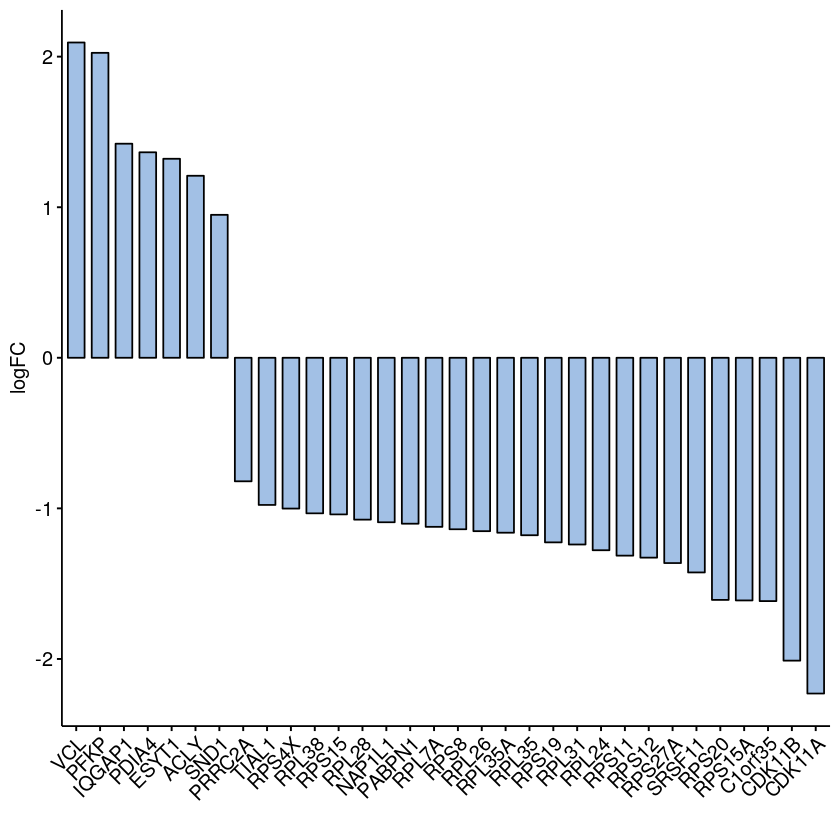

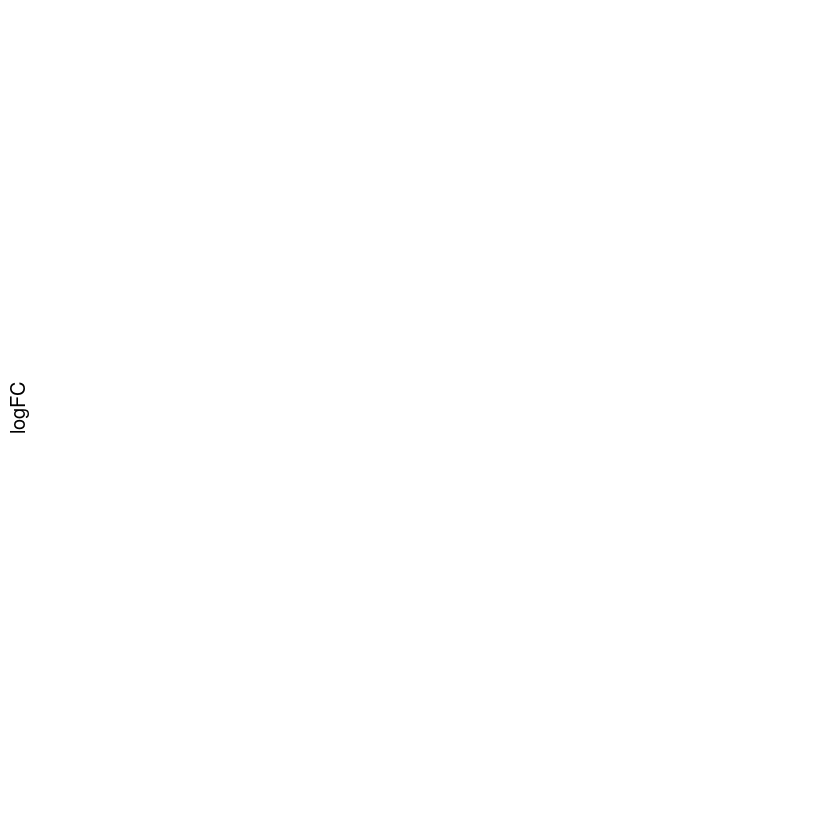

In [233]:
DE_splDB_plotinp_PedAMLvsAdultAML_Prog <- topTable_PedAMLvsAdultAML_Prog[topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05 & 
                                                     topTable_PedAMLvsAdultAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_PedAMLvsAdultAML_Stem <- topTable_PedAMLvsAdultAML_Stem[topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.1 &
                                                     topTable_PedAMLvsAdultAML_Stem$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_PedAMLvsAdultAML_Prog$SYMBOL <- as.character(DE_splDB_plotinp_PedAMLvsAdultAML_Prog$SYMBOL)
DE_splDB_plotinp_PedAMLvsAdultAML_Stem$SYMBOL <- as.character(DE_splDB_plotinp_PedAMLvsAdultAML_Stem$SYMBOL)

table(topTable_PedAMLvsAdultAML_Prog$adj.P.Val < 0.05, topTable_PedAMLvsAdultAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol)
table(topTable_PedAMLvsAdultAML_Stem$adj.P.Val < 0.05, topTable_PedAMLvsAdultAML_Stem$SYMBOL %in% spl_db_test3$Gene.Symbol)

#head(DE_splDB_plotinp_Prog)
#head(DE_splDB_plotinp_Stem)
ggbarplot(DE_splDB_plotinp_PedAMLvsAdultAML_Prog[order(DE_splDB_plotinp_PedAMLvsAdultAML_Prog$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill="#A2C0E5", xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
ggbarplot(DE_splDB_plotinp_PedAMLvsAdultAML_Stem[order(DE_splDB_plotinp_PedAMLvsAdultAML_Stem$logFC, decreasing=TRUE),], x="SYMBOL", y="logFC", fill=c("#A2C0E5"), xlab="") + 
theme(axis.text.x = element_text(angle = 45, hjust = 1)) 


In [252]:
DE_splDB_plotinp_Prog_all <- topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_Stem_all <- topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_PedAMLvsAML_plotinp_Prog_all <- topTable_MPN_PedAMLvssAML_Prog[topTable_MPN_PedAMLvssAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog_all <- topTable_MPN_PedAMLvssAML_Prog.noCrews[topTable_MPN_PedAMLvssAML_Prog.noCrews$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_AdultAMLvsAML_plotinp_Prog_all <- topTable_MPN_AdultAMLvssAML_Prog[topTable_MPN_AdultAMLvssAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog_all <- topTable_MPN_AdultAMLvssAML_Prog.noCrews[topTable_MPN_AdultAMLvssAML_Prog.noCrews$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_PedAMLvsAdultAML_Prog_all <- topTable_PedAMLvsAdultAML_Prog[topTable_PedAMLvsAdultAML_Prog$SYMBOL %in% spl_db_test3$Gene.Symbol,]
DE_splDB_plotinp_PedAMLvsAdultAML_Stem_all <- topTable_PedAMLvsAdultAML_Stem[topTable_PedAMLvsAdultAML_Stem$SYMBOL %in% spl_db_test3$Gene.Symbol,]

write.csv(DE_splDB_plotinp_Prog_all, file="SpliceosomeDBexpression_PedAMLvPedNL_Prog.csv", row.names=FALSE)
write.csv(DE_splDB_plotinp_Stem_all, file="SpliceosomeDBexpression_PedAMLvPedNL_Stem.csv", row.names=FALSE)
write.csv(DE_splDB_PedAMLvsAML_plotinp_Prog_all, file="SpliceosomeDBexpression_PedAMLvsAML_Prog.csv", row.names=FALSE)
write.csv(DE_splDB_PedAMLvsAML.noCrews_plotinp_Prog_all, file="SpliceosomeDBexpression_PedAMLvsAML_noCrews_Prog.csv", row.names=FALSE)
write.csv(DE_splDB_AdultAMLvsAML_plotinp_Prog_all, file="SpliceosomeDBexpression_AdultAMLvsAML_Prog.csv", row.names=FALSE)
write.csv(DE_splDB_AdultAMLvsAML.noCrews_plotinp_Prog_all, file="SpliceosomeDBexpression_AdultAMLvsAML_noCrews_Prog.csv", row.names=FALSE)
write.csv(DE_splDB_plotinp_PedAMLvsAdultAML_Prog_all, file="SpliceosomeDBexpression_PedAMLvAdultAML_Prog.csv", row.names=FALSE)
write.csv(DE_splDB_plotinp_PedAMLvsAdultAML_Stem_all, file="SpliceosomeDBexpression_PedAMLvAdultAML_Stem.csv", row.names=FALSE)


In [225]:
spl_db_filt <- c("CDC40", "DDX5", "SRSF5","SF3B1","SLU7","SF3B5","RBM22","SYF2","BUD31","SF3B6","TRA2A",
                 "PCBP1","U2AF2", "CWC15","DHX8", "SMNDC1","RBM25", "WBP11","SRSF6", "HNRNPK","BCAS2", "HNRNPA1L2",
                 "SNW1", "PHF5A","SNRPB2","HNRNPC","PRPF8", "DHX38","PRPF18", "TRA2B","CRNKL1", "SF3A1","SNRPC", 
                 "HNRNPU","SNRNP27", "PRPF40A","TXNL4A", "PUF60","MAGOH", "SNRPB","HNRNPA3", "DDX42","ZMAT2", "CDC5L",
                 "PQBP1", "ACIN1","LSM8", "SART1","U2AF1", "SNRPA1","HNRNPA1", "CCDC12","SNU13","SNRPF","TCFRG1", 
                 "RBM17","PRPF38A", "LSM3","ISY1", "SRSF10","SF3A2", "DHX15","SF3B4", "SRSF9","SF3B2", "HNRNPM",
                 "PRPF38B","LSM7", "USP39","SNRPD3", "DDX39B","HSPA1L", "CHERP","XAB2", "DDX46","RBMX","EFTUD2","U2SURP", 
                 "SNRPD2","NCBP2", "AQR","PRPF6", "PRPF31","PPIH", "LSM2","SRSF2", "SRSF3","THOC2", "SNRPG","SNRNP70",
                 "DHX16", "SNRNP200","SNRPA", "SF3A3","ALYREF", "LSM5","PRPF19", "SNRPE","PRPF3","PRPF4","THOC1", 
                 "SNRPD1","NCBP1", "SRSF7","HSPA8", "LSM6","PPIE", "LSM4","EIF4A3", "SRSF4","MAGOHB", "PLRG1","CTNNBL1",
                 "DDX23","SNRNP40", "SF3B3","HSPA1A", "SRSF1","THOC3","HSPA1B","PPIL1", "PRPF40B","HSPA2", "HSPA6")
table(spl_db_filt %in% spl_db$Gene.Symbol)
spl_db_filt[!spl_db_filt %in% spl_db$Gene.Symbol]
spl_db_filt_ens <- ENS2EG2SYM$ens_id.ensembl_id[match(spl_db_filt, ENS2EG2SYM$SYM)]
table(spl_db_filt_ens %in% rownames(lcpm2.PedAML_PedNL_sAML.Prog))



FALSE  TRUE 
    5   119 

[1] "HNRNPA1L2" "SNU13"     "TCFRG1"    "HSPA1L"    "PRPF40B"


FALSE  TRUE 
    1   123 

In [226]:
spl_db_filt2 <- c("CDC40", "DDX5", "SRSF5","SF3B1","SLU7","SF3B5","RBM22","SYF2","BUD31","SF3B6","TRA2A",
                 "PCBP1","U2AF2", "CWC15","DHX8", "SMNDC1","RBM25", "WBP11","SRSF6", "HNRNPK","BCAS2", "HNRNPA1L2",
                 "SNW1", "PHF5A","SNRPB2","HNRNPC","PRPF8", "DHX38","PRPF18", "TRA2B","CRNKL1", "SF3A1","SNRPC", 
                 "HNRNPU","SNRNP27", "PRPF40A","TXNL4A", "PUF60","MAGOH", "SNRPB","HNRNPA3", "DDX42","ZMAT2", "CDC5L",
                 "PQBP1", "ACIN1","LSM8", "SART1","U2AF1", "SNRPA1","HNRNPA1", "CCDC12","SNU13","SNRPF","TCFRG1", 
                 "RBM17","PRPF38A", "LSM3","ISY1", "SRSF10","SF3A2", "DHX15","SF3B4", "SRSF9","SF3B2", "HNRNPM",
                 "PRPF38B","LSM7", "USP39","SNRPD3", "DDX39B","HSPA1L", "CHERP","XAB2", "DDX46","RBMX","EFTUD2","U2SURP", 
                 "SNRPD2","NCBP2", "AQR","PRPF6", "PRPF31","PPIH", "LSM2","SRSF2", "SRSF3","THOC2", "SNRPG","SNRNP70",
                 "DHX16", "SNRNP200","SNRPA", "SF3A3","ALYREF", "LSM5","PRPF19", "SNRPE","PRPF3","PRPF4","THOC1", 
                 "SNRPD1","NCBP1", "SRSF7","HSPA8", "LSM6","PPIE", "LSM4","EIF4A3", "SRSF4","MAGOHB", "PLRG1","CTNNBL1",
                 "DDX23","SNRNP40", "SF3B3","HSPA1A", "SRSF1","THOC3","HSPA1B","PPIL1", "PRPF40B","HSPA2", "HSPA6")

table(spl_db_filt2 %in% spl_db$Gene.Symbol)
spl_db_filt2[!spl_db_filt2 %in% spl_db$Gene.Symbol]
spl_db_filt2_ens <- ENS2EG2SYM$ens_id.ensembl_id[match(spl_db_filt2, ENS2EG2SYM$SYM)]
table(spl_db_filt2_ens %in% rownames(lcpm2.PedAML_PedNL_sAML.Prog))



FALSE  TRUE 
    5   119 

[1] "HNRNPA1L2" "SNU13"     "TCFRG1"    "HSPA1L"    "PRPF40B"


FALSE  TRUE 
    1   123 

In [280]:
plotGroupSumHeatmapForGenelist(lcpm2.PedAML_PedNL_sAML.Prog, DGE_PedAML_PedNL_sAML.Prog, 
                          genelist=spl_db_filt_ens, id="ENS", outputDir=gOutputDir,
                          metadataVector=DGE_PedAML_PedNL_sAML.Prog$samples$group, expGroups=c("PedAML", "AdultAML"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsAdultAML_SpliceosomeDB_filt", colid="Patient_ID")


Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

In [69]:
head(topTable_PedAMLvsAdultAML_Prog)
topTable_PedAMLvsAdultAML_Prog_SplAnno <- topTable_PedAMLvsAdultAML_Prog[topTable_PedAMLvsAdultAML_Prog$ENSEMBL %in% 
spl_db$Ensemble.Gene.ID,]
topTable_PedAMLvsAdultAML_Prog_SplAnno$cat <- spl_db$Class...family[match(topTable_PedAMLvsAdultAML_Prog_SplAnno$ENSEMBL,
                                                                         spl_db$Ensemble.Gene.ID)]
table(topTable_PedAMLvsAdultAML_Prog_SplAnno$cat, topTable_PedAMLvsAdultAML_Prog_SplAnno$adj.P.Val < 0.1)

,ENSEMBL,ENTREZID,SYMBOL,gene_type,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000127022,ENSG00000127022,821,CANX,protein_coding,1.487862,9.607598,6.545484,2.972819e-06,0.009870516,4.783663
ENSG00000198840,ENSG00000198840,4537,ND3,protein_coding,-2.519836,4.939021,-6.498701,3.271362e-06,0.009870516,4.671913
ENSG00000269028,ENSG00000269028,100462981,MTRNR2L2,protein_coding,-2.227289,3.341528,-6.597133,2.675673e-06,0.009870516,4.648341
ENSG00000228253,ENSG00000228253,4509,ATP8,protein_coding,-2.563000,2.939427,-6.663799,2.336838e-06,0.009870516,4.595744
ENSG00000212907,ENSG00000212907,4539,ND4L,protein_coding,-2.145202,5.958718,-5.965622,9.933144e-06,0.016264036,3.636084
ENSG00000213741,ENSG00000213741,6235,RPS29,protein_coding,-1.675567,5.747700,-5.946884,1.033546e-05,0.016264036,3.598358


                                                    
                                                     FALSE TRUE
                                                       442   63
  17S U2 snRNP                                          12    0
  17S U2 snRNP associated                               10    1
  alternative splicing factor                           13    1
  anaphase promoting complex                             5    0
  chaperonin/heat shock                                 23    2
  chromatin-related                                     41    8
  coatomer protein complex                               2    2
  common MS contaminants                                17    1
  CPSF                                                   7    0
  CSTF                                                   2    0
  EJC/mRNP                                              12    0
  exocyst                                                4    0
  exosome                                          

In [173]:
PedAMLvsPedNL_Stem_reac <- read.csv("../20200609_Reactome_RBFOX2_TargetOverlap_DiffSplicingAnalysis_SE_Stem.csv",
                                    stringsAsFactors=FALSE, header=TRUE)

PedAMLvsPedNL_Prog_reac <- read.csv("../20200609_Reactome_RBFOX2_TargetOverlap_DiffSplicingAnalysis_SE_Prog.csv",
                                    stringsAsFactors=FALSE, header=TRUE)
dim(PedAMLvsPedNL_Prog_reac)
dim(PedAMLvsPedNL_Stem_reac)
#PedAMLvsPedNL_Stem_reac
#PedAMLvsPedNL_Prog_reac
PedAMLvsPedNL_Stem_reac_sym <- PedAMLvsPedNL_Stem_reac$Symbol
PedAMLvsPedNL_Prog_reac_sym <- PedAMLvsPedNL_Prog_reac$Symbol
PedAMLvsPedNL_Stem_reac_sym_split <- unique(unlist(lapply(strsplit(PedAMLvsPedNL_Stem_reac_sym, split = ";"), function(x) x)))
PedAMLvsPedNL_Prog_reac_sym_split <- unique(unlist(lapply(strsplit(PedAMLvsPedNL_Prog_reac_sym, split = ";"), function(x) x)))
length(PedAMLvsPedNL_Stem_reac_sym_split)
length(PedAMLvsPedNL_Prog_reac_sym_split)
                                                    

[1] 41 12

[1] 16 12

[1] 77

[1] 175

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

png 
  2

Warning message in if (tolower(expGroups) == "all") {:
“the condition has length > 1 and only the first element will be used”

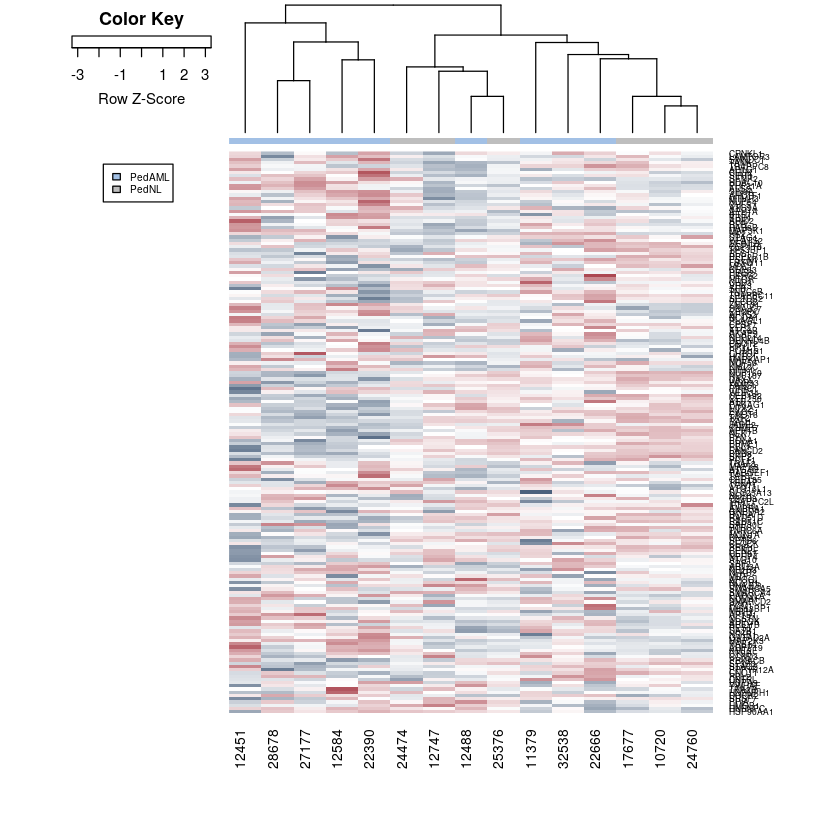

png 
  2

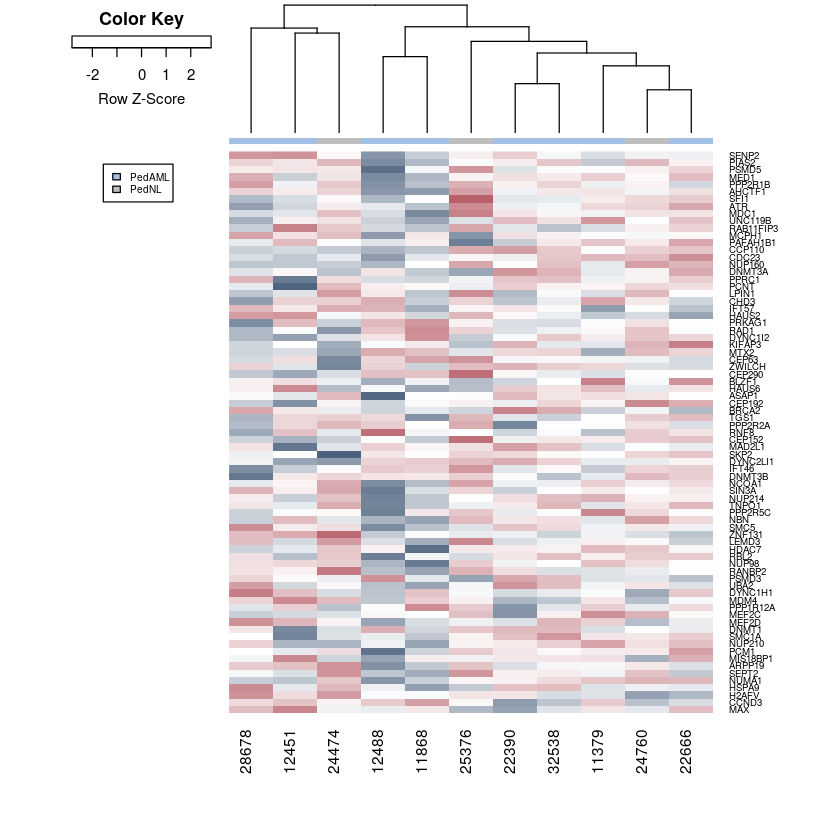

In [174]:
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.prog, gVoomResult.prog, 
                          genelist=PedAMLvsPedNL_Prog_reac_sym_split, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.prog, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Prog_PedAMLvsPedNL_RBFOX2_Reactome", colid="Patient.ID")
plotTopHeatmapForGenelist(gModeratedVoomedFitForContrasts.stem, gVoomResult.stem, 
                          genelist=PedAMLvsPedNL_Stem_reac_sym_split, geneNaId="SYMBOL", outputDir=gOutputDir,
                          metadataVector=gGroupMetadataVector.stem, coeffNumber=2, expGroups=c("PedAML", "PedNL"), 
                          fileprefix="DeWerf_Human_PediatricAML_Stem_PedAMLvsPedNL_RBFOX2_Reactome", colid="Patient.ID")


In [128]:
#ls()
#ls(globalenv())
ls(gPreviousStepEnv)[grep("DgeList", ls(gPreviousStepEnv))]


[1] "filterDgeListByCpmThresholdForNumSamples"
 [2] "gDgeList"                                
 [3] "gDgeList.prog"                           
 [4] "gDgeList.stem"                           
 [5] "gFilteredDgeList"                        
 [6] "gFilteredDgeList.prog"                   
 [7] "gFilteredDgeList.stem"                   
 [8] "gNormedFilteredDgeList"                  
 [9] "gNormedFilteredDgeList.prog"             
[10] "gNormedFilteredDgeList.stem"             
[11] "gOrigFilteredDgeList"                    
[12] "gOrigFilteredDgeList.prog"               
[13] "gOrigFilteredDgeList.stem"               
[14] "gOrigNormedFilteredDgeList"              
[15] "gOrigNormedFilteredDgeList.prog"         
[16] "gOrigNormedFilteredDgeList.stem"

In [117]:
holm_gns <- c('AQR','CELF1','CELF2','CPSF6','ELAVL1','FUBP1','HNRNPA1',
'HNRNPA2B1','HNRNPD','HNRNPK','HNRNPL','KHDRBS1','MAGOH','MBNL1','MBNL2','MBNL3','MSI1','MSI2','PRPF40A',
'PSIP1','PTBP1','PTBP2','RBFOX2','RBM26','SART3','SFPQ','SRSF11','SNRPF','SRPK1','SRRM1','SRSF1','TIA1','TRA2B',
'SALL2','ID3','ID2','EGR1','FGF2','KIT','FGF5','IGF1R','NANOG','POU5F1','DPPA4','DPPA2','CCNK','CD44','DNMT3A',
'DNMT3B','FOXA1','ESRRB','EGFR','HDAC1','EP300','GTF2F2','PABPC1','PRMT5','KLF5','TCF3','E2F1','SOX2','PRDM14')
table(holm_gns %in% topTable_PedAMLvsPedNL_Prog$SYMBOL)
table(holm_gns %in% topTable_PedAMLvsPedNL_Stem$SYMBOL)
holm_gns[!holm_gns %in% topTable_PedAMLvsPedNL_Prog$SYMBOL]
holm_gns[!holm_gns %in% topTable_PedAMLvsPedNL_Stem$SYMBOL]

holm_gns_prog <- topTable_PedAMLvsPedNL_Prog[topTable_PedAMLvsPedNL_Prog$SYMBOL %in% holm_gns,]
holm_gns_stem <- topTable_PedAMLvsPedNL_Stem[topTable_PedAMLvsPedNL_Stem$SYMBOL %in% holm_gns,]


FALSE  TRUE 
   12    50 


FALSE  TRUE 
   12    50 

[1] "MSI1"   "FGF2"   "FGF5"   "NANOG"  "POU5F1" "DPPA2"  "FOXA1"  "ESRRB" 
 [9] "EGFR"   "KLF5"   "SOX2"   "PRDM14"

[1] "MSI1"   "ID3"    "FGF2"   "FGF5"   "NANOG"  "POU5F1" "DPPA2"  "FOXA1" 
 [9] "ESRRB"  "EGFR"   "SOX2"   "PRDM14"

In [119]:
write.csv(holm_gns_prog, file="holm_network_PedAMLvPedNL_prog.csv")
write.csv(holm_gns_stem, file="holm_network_PedAMLvPedNL_stem.csv")

In [122]:
writeWorkspaceImage(gInterimDir, gRunName)

[1] "Output file: 20200228_DeWerf_Human_PediatricAML_differential_expression_20200327163122.RData"


In [137]:
writeWorkspaceImage

function (outputDir, runName) 
{
    fileName = sprintf("%s.RData", runName)
    save.image(file = file.path(outputDir, fileName))
    print(paste0("Output file: ", fileName))
}

[Table of Contents](#Table-of-Contents)

## Citations



1. Law CW, Alhamdoosh M, Su S, Smyth GK, Ritchie ME. RNA-seq analysis is easy as 1-2-3 with limma, Glimma and edgeR. Version 2. F1000Res. 2016 Jun 17 [revised 2016 Jan 1];5:1408.
2. Ritchie, ME, Phipson, B, Wu, D, Hu, Y, Law, CW, Shi, W, and Smyth, GK (2015). limma powers differential expression analyses for RNA-sequencing and microarray studies. Nucleic Acids Research 43(7), e47.
3. Robinson MD, McCarthy DJ and Smyth GK (2010). edgeR: a Bioconductor package for differential expression analysis of digital gene expression data. Bioinformatics 26, 139-140.
4. Huber W, Carey VJ, Gentleman R, Anders S, Carlson M, Carvalho BS, Bravo HC, Davis S, Gatto L, Girke T, Gottardo R, Hahne F, Hansen KD, Irizarry RA, Lawrence M, Love MI, MacDonald J, Obenchain V, Oleś AK, Pagès H, Reyes A, Shannon P, Smyth GK, Tenenbaum D, Waldron L, Morgan M. Orchestrating high-throughput genomic analysis with Bioconductor. Nat Methods. 2015 Feb;12(2):115-21.
5. R Core Team (2016). R: A language and environment for statistical computing. R Foundation for Statistical Computing, Vienna, Austria. URL https://www.R-project.org/.
6. Law CW, Chen Y, Shi W, Smyth GK. voom: Precision weights unlock linear model analysis tools for RNA-seq read counts. Genome Biol. 2014 Feb 3;15(2):R29.
7. https://www.machinelearningplus.com/machine-learning/complete-introduction-linear-regression-r/
8. Smyth, G. K., Ritchie, M., & Thorne, N. (2015). Linear Models for Microarray and RNA-Seq Data User’s Guide. R, (March 2016). https://www.bioconductor.org/packages/release/bioc/vignettes/limma/inst/doc/usersguide.pdf .
9. http://www.statsmakemecry.com/smmctheblog/confusing-stats-terms-explained-heteroscedasticity-heteroske.html
10. https://stat.ethz.ch/pipermail/bioconductor/2014-May/059713.html 
11. https://stat.ethz.ch/pipermail/bioconductor/attachments/20130530/4dcc9475/attachment.pl
12. Hart S, Therneau TM, Zhang Y, Poland GA, Kocher J-P. (2013). Calculating Sample Size Estimates for RNA Sequencing Data. Journal of Computational Biology, 20(12), 970-978.
13. Benjamini, Y. and Hochberg, Y. (1995). Controlling the false discovery rate: a practical and powerful approach to multiple testing. Journal of the Royal Statistical Society Series B 57, 289–300.
14. McCarthy DJ, Smyth GK. Testing significance relative to a fold-change threshold is a TREAT. Bioinformatics. 2009 Mar 15;25(6):765-71.
15. http://web.mit.edu/~r/current/arch/i386_linux26/lib/R/library/limma/html/ebayes.html
16. Su S, Law CW, Ah-Cann C, Asselin-Labat M, Blewitt ME, Ritchie ME (2017). Glimma: interactive graphics for gene expression analysis. Bioinformatics, 33(13), 2050-2052.

[Table of Contents](#Table-of-Contents)

## Appendix: R Session Info

In [268]:
Sys.time()
sessionInfo()

[1] "2020-08-26 15:34:42 PDT"

R version 3.4.3 (2017-11-30)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 18.04.3 LTS

Matrix products: default
BLAS: /mnt/data1/tomw/anaconda2/lib/R/lib/libRblas.so
LAPACK: /mnt/data1/tomw/anaconda2/lib/R/lib/libRlapack.so

locale:
[1] en_US.UTF-8

attached base packages:
 [1] parallel  stats4    grid      stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] bindrcpp_0.2.2       ggpubr_0.2           magrittr_1.5        
 [4] gdata_2.18.0         gplots_3.0.1.1       genefilter_1.60.0   
 [7] GSVAdata_1.14.0      hgu95a.db_3.2.3      GSEABase_1.40.1     
[10] graph_1.56.0         annotate_1.56.2      XML_3.98-1.20       
[13] GSVA_1.26.0          pathview_1.18.2      org.Hs.eg.db_3.5.0  
[16] AnnotationDbi_1.40.0 IRanges_2.12.0       S4Vectors_0.16.0    
[19] Biobase_2.38.0       BiocGenerics_0.24.0  WebGestaltR_0.4.0   
[22] SPIA_2.30.0          KEGGgraph_1.38.0     cowplot_0.9.4       
[25] ggplot2_3.1.1        RCol

[Table of Contents](#Table-of-Contents)

Copyright (c) 2018 UC San Diego Center for Computational Biology & Bioinformatics under the MIT License

Notebook template by Amanda Birmingham